In [1]:
import json, os, re, sqlite3, thread, urllib, urllib2
def exec_ipynb(filename_or_url):
    nb = (urllib2.urlopen(filename_or_url) if re.match(r'https?:', filename_or_url) else open(filename_or_url)).read()
    jsonNb = json.loads(nb)
    #check for the modified formatting of Jupyter Notebook v4
    if(jsonNb['nbformat'] == 4):
        exec '\n'.join([''.join(cell['source']) for cell in jsonNb['cells'] if cell['cell_type'] == 'code']) in globals()
    else:
        exec '\n'.join([''.join(cell['input']) for cell in jsonNb['worksheets'][0]['cells'] if cell['cell_type'] == 'code']) in globals()

exec_ipynb('timelapse-utilities.ipynb')

In [2]:
# Use geopandas.  Boilerplate from https://docs.google.com/document/d/1utZuLHcKQEZNXTQLOysTNCxTHrqxczAUymmtplpn27Q/edit#heading=h.f50xoxwmcir
import pandas as pd
import geopandas as gpd
import numpy as np
from geopandas import GeoSeries, GeoDataFrame
%matplotlib inline

pd.options.display.max_colwidth = 300
pd.options.display.max_rows = 100
pd.set_option('display.max_columns', 500)


In [3]:
# assessments/cd/AC Property Assessments_10012017.xls (which is actually TDF) from Amy Gottsegen and Randy Sargent buying a CD from the county assessors office
# assessments/Allegheny_County_Parcel_Boundaries.geojson from https://data.wprdc.org/dataset/allegheny-county-parcel-boundaries
import array, csv, datetime, json, math, numpy, os, random, re 
from dateutil.parser import parse
from shapely.geometry import mapping, shape
from PIL import Image
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import pandas,numbers
from operator import itemgetter, attrgetter
import string
import calendar,time
from IPython.core.display import HTML

# Use geopandas.  Boilerplate from https://docs.google.com/document/d/1utZuLHcKQEZNXTQLOysTNCxTHrqxczAUymmtplpn27Q/edit#heading=h.f50xoxwmcir
import pandas as pd
import geopandas as gpd
from geopandas import GeoSeries, GeoDataFrame
%matplotlib inline

pd.options.display.max_colwidth = 300
pd.options.display.max_rows = 100
pd.set_option('display.max_columns', 500)

# Built-in time handling fails for times before 1900.  Use arrow instead.  
# See https://arrow.readthedocs.io/en/latest/ for info
import arrow

def LonLatToPixelXY(lonlat):
    (lon, lat) = lonlat
    x = (lon + 180.0) * 256.0 / 360.0
    y = 128.0 - math.log(math.tan((lat + 90.0) * math.pi / 360.0)) * 128.0 / math.pi
    return [x, y]

# This does the same as above, but takes a GeoJSON point (which is what centroid returns)
def PointToPixelXY(point):
    lon=point.x
    lat=point.y
    x = (lon + 180.0) * 256.0 / 360.0
    y = 128.0 - math.log(math.tan((lat + 90.0) * math.pi / 360.0)) * 128.0 / math.pi
    return [x, y]

def GetCentroid(geometry):
    s = shape(geometry)
    return (s.centroid.x, s.centroid.y)   

def GetEpoch(date):
    return (date - datetime.datetime(1970, 1, 1)).total_seconds()

def HexToRgb(hex_string):
    rgb = colors.hex2color(hex_string)
    r,g,b = tuple([int(255*x) for x in rgb])
    return (r,g,b)

In [505]:
from shapely.geometry import Point

# Google geocoding API to geocode an address
# Assumes key is in google_api_key.txt
# Use as second level lookup only for those which fail census lookup

re_noalnum = re.compile('^([^\w]+)$')

def geocode_address_google(address):
    if(pandas.isnull(address) or re_noalnum.match(address)):
        #print "Skipping address lookup for %r, no alphanumeric characters" %(address)
        return None

    try:
        geocode_address_google.conn
    except:
        geocode_address_google.conn = sqlite3.connect('geocoding_cache')
        geocode_address_google.cur = geocode_address_google.conn.cursor()
        geocode_address_google.cur.execute(('CREATE TABLE IF NOT EXISTS kvs'
                                     ' (key PRIMARY KEY, value)'
                                     ' WITHOUT ROWID;'))
        geocode_address_google.conn.commit()

    geocode_address_google.cur.execute('SELECT value FROM kvs WHERE key=?', (address,))
    rows = geocode_address_google.cur.fetchall()
    if rows:
        #print "Google: Found %r in cache" % (address)
        return json.loads(rows[0][0])
        
    #print "Google: %r not found in cache, fetching" % (address)

    api_key = open('google-api-key-do-not-commit.txt').read()
    payload = {'address':address, 'key':api_key}
    result = json.load(urllib2.urlopen('https://maps.googleapis.com/maps/api/geocode/json?%s' % urllib.urlencode(payload)))
    
    geocode_address_google.cur.execute(('INSERT OR REPLACE INTO kvs (key, value)'
                                 ' VALUES (?, ?);'),
                                 (address, json.dumps(result)))
    geocode_address_google.conn.commit()
    
    # If the result succeeded and generated a formatted address, cache under that key too
    try:
        if(result['status']=='OK'):
            if(len(result['results'])== 1):
                canonical = result['results'][0]['formatted_address']
                #print "Google: Storing canonical addr of %r for %r" % (canonical, address)
                geocode_address_google.cur.execute(('INSERT OR REPLACE INTO kvs (key, value)'
                                                     ' VALUES (?, ?);'),
                                                     (canonical, json.dumps(result)))
                geocode_address_google.conn.commit()
            else:
                print "Google: Fetch %r seemed to succeed, but results empty or non-unique" % (address)

        else:
            print "Google: Fetch %r failed" % (address)

    except:
        #pass
        raise
    
    return result

def get_canonical_address_google(raw_addr):
    if(pandas.isnull(raw_addr) or re_noalnum.match(raw_addr)):
        #print "Skipping address lookup for %r, no alphanumeric characters" %(raw_addr)
        return None

    try:
        result=geocode_address_google(raw_addr)
        if(result['status']=='OK' and len(result['results'])== 1):
            return(result['results'][0]['formatted_address'])
        else:
            return None
    except:
        return None

def get_canonical_zip_google(addr):
    if(pandas.isnull(addr) or re_noalnum.match(addr)):
        #print "Skipping address lookup for %r, no alphanumeric characters" %(addr)
        return None

    try:
        result=geocode_address_google(addr)
        if(result['status']=='OK' and len(result['results'])== 1):
            addr_comps = result['results'][0]['address_components']
            for i in range(0, len(addr_comps)):
                if('postal_code' in addr_comps[i]['types']):
                    return addr_comps[i]['short_name']
        
        return None
    except:
        return None
    
def get_canonical_coords_google(addr):
    if(pandas.isnull(addr) or re_noalnum.match(addr)):
        #print "Skipping address lookup for %r, no alphanumeric characters" %(addr)
        return None

    try:
        result=geocode_address_google(addr)
        if(result['status']=='OK' and len(result['results'])== 1):
            latlon = ['results'][0]['geometry']['location']
            if(latlon):
                return(Point(latlon['lng'], latlon['lat']))
        return None
    except:
        return None


In [506]:
# Uses Census geocoding API to geocode an address
# Assumes key is in google_api_key.txt

import sqlite3
import urllib,urllib2
import json
from shapely.geometry import Point

# Match if the string contains no alphanumerics
re_noalnum = re.compile('^([^\w]+)$')

def geocode_address_census(address):
    if(pandas.isnull(address) or re_noalnum.match(address)):
        #print "Skipping address lookup for %r, no alphanumeric characters" %(address)
        return None

    try:
        geocode_address_census.sqlite
    except:
        geocode_address_census.sqlite = {}
    
    tpid = '%d.%s' % (os.getpid(), thread.get_ident())
    if not tpid in geocode_address_census.sqlite:
        conn = sqlite3.connect('geocoding_cache_census')
        cur = conn.cursor()
        geocode_address_census.sqlite[tpid] = { 'conn': conn, 'cur': cur }

        cur.execute(('CREATE TABLE IF NOT EXISTS kvs'
                     ' (key PRIMARY KEY, value)'
                     ' WITHOUT ROWID;'))
        conn.commit()
    else:
        conn = geocode_address_census.sqlite[tpid]['conn']
        cur = geocode_address_census.sqlite[tpid]['cur']

    cur.execute('SELECT value FROM kvs WHERE key=?', (address,))
    rows = cur.fetchall()
    if rows:
        return json.loads(rows[0][0])
    
    payload = {'address':address, 'benchmark':4, 'format':'json'}
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
    
    cur.execute(('INSERT OR REPLACE INTO kvs (key, value)'
                 ' VALUES (?, ?);'),
                (address, json.dumps(result)))
    conn.commit()
    
    if len(result['result']['addressMatches']) == 1:
        canonical = result['result']['addressMatches'][0]['matchedAddress']
        cur.execute(('INSERT OR REPLACE INTO kvs (key, value)'
                     ' VALUES (?, ?);'),
                     (canonical, json.dumps(result)))
        conn.commit()
    
    return result

def cache_canonical_addresses(addrs):
    t = SimpleThreadPoolExecutor(25)
    for addr in addrs:
        if(not (pandas.isnull(addr) or re_noalnum.match(addr))):
            t.submit(geocode_address_census, addr)
        else:
            #print "Skipping address lookup for %r, no alphanumeric characters" %(addr)
            pass
    t.shutdown()

def get_canonical_address(raw_addr):
    if(pandas.isnull(raw_addr) or re_noalnum.match(raw_addr)):
        #print "Skipping address lookup for %r, no alphanumeric characters" %(raw_addr)
        return None

    try:
        result=geocode_address_census(raw_addr)
        if len(result['result']['addressMatches']) == 1:
            return(result['result']['addressMatches'][0]['matchedAddress'])
        else:
            return None
    except:
        return None

def get_canonical_zip(addr):
    if(pandas.isnull(addr) or re_noalnum.match(addr)):
        #print "Skipping address lookup for %r, no alphanumeric characters" %(addr)
        return None

    try:
        result=geocode_address_census(addr)
        if len(result['result']['addressMatches']) == 1:
            return(result['result']['addressMatches'][0]['addressComponents']['zip'])
        else:
            return None
    except:
        return None
    
def get_canonical_coords(addr):
    if(pandas.isnull(addr) or re_noalnum.match(addr)):
        #print "Skipping address lookup for %r, no alphanumeric characters" %(addr)
        return None

    try:
        result=geocode_address_census(addr)
        if len(result['result']['addressMatches']) == 1:
            coords = result['result']['addressMatches'][0]['coordinates']
            return(Point(coords['x'], coords['y']))
        else:
            return None
    except:
        return None


def canonicalize_addr_colset(df, col_arr, out_colname):
    for  col_name in col_arr:
        df[col_name]=df[col_name].astype(basestring)
        df[col_name].fillna('', inplace=True)

    df[out_colname] = df[col_arr].apply(lambda x: get_canonical_address(' '.join(x)), axis=1)
    
    

In [6]:
# For each residential PARID, we want to generate a sorted list of who bought it when.
# For each owner name, we want to generate a sorted list of PARIDs they bought and when they bought it.
# For each change address, we want to generate a sorted list of PARIDs they bought and when they bought it.
# Each of the following is a map indexed on PARID, owner name, or change address.  

# The map indexed on PARID builds up a history of a given property.
#   Each record contains a a list of maps containing a list of date, event_type, owner name, and change address
#   event_type is either PURCHASE or FORECLOSURE

# Each map indexed on owner name or change address builds a history of a given owner/change address.
#   Each record contains a list of maps containing date, event_type, and PARID
#   event_type is either PURCHASE or SALE


# To start with, clear the maps
property_map = {}
owner_map = {}
changeaddr_map = {}

# Also create a map to cache lookups for owner and changeaddress PARID sets at various times
# to speed up runtime
owned_parids_cache={}

# TODO: Create a map of owner and changeaddress to inferred owner type
# 'GOVERNMENT'
# 'INVESTOR' 

# Create a global map of PARIDs to canonical property addresses.  Not all versions of the db have valid 
# property addresses, but at least one hopefully should!
canonical_property_address_map={}

# Create a global map of PARIDs to raw property addresses.  We might have conflicts, but at least we'll have something
# to fall back on if canonical resolution fails
raw_property_address_map={}

In [7]:
# Create functions to update the above maps with info from a given row of an assessment spreadsheet/database.  
# The first argument should be a pandas table, the second an index into the table.
# We expect the index to be PARID
# We expect the following columns to exist and be valid:
#   PROPERTYOWNER
#   CHANGENOTICEADDRESS1 - CHANGENOTICEADDRESS4
#   SALEDATE


# In 2017 the date format is MM-DD-YYYY
# In 2009, an example is 09/16/96 00:00:00

# Setup regular expression for parsing various sorts of dates
re_MDY = re.compile('(\d\d)-(\d\d)-(\d\d\d\d)')
re_YMD = re.compile('(\d\d\d\d)-(\d\d)-(\d\d)')
re_MDY_HMS = re.compile('(\d+)/(\d+)/(\d+) (\d+):(\d+):(\d+)')

# Setup this year to use for dealing with 2-digit dates
this_year = datetime.datetime.now().year
this_date = arrow.now().format('YYYY-MM-DD')

# Utility function to normalize SALEDATE format
# SALEDATE field is in '%m-%d-%Y' format (ex 10-26-2012) when present
def SaledateToEpoch(datestr):
    if(re_YMD.match(datestr)!=None):
        return calendar.timegm(time.strptime(datestr, '%Y-%m-%d'))
    elif(re_MDY.match(datestr)!=None):
        return calendar.timegm(time.strptime(datestr, '%m-%d-%Y'))

# Built-in time handling fails for times before 1900.  Use arrow instead.  
# See https://arrow.readthedocs.io/en/latest/ for info
def SaledateToYMD(datestr):
    # Check which format and parse accordingly
    if(re_YMD.match(datestr)!=None):
        # Already like we want it
        return datestr
    if(re_MDY.match(datestr)!=None):
        return arrow.get(datestr, 'MM-DD-YYYY').format('YYYY-MM-DD')
    elif(re_MDY_HMS.match(datestr)!=None):
        # Some of the 2-digit years are farther back than python's default pivot year of 1969
        # If the year we parse is > this_year, set it back by 100 years
        ad=arrow.get(datestr, 'MM/DD/YY HH:mm:ss')
        if(ad.year>this_year):
            ad = ad.replace(year=(ad.year-100))
        return ad.format('YYYY-MM-DD')
    else:
        raise Exception('Unrecognized saledate format %r' % (datestr))

# find_event_by_date takes a list of maps containng 'date' fields and looks for one the the last one that's before
# search_date or the first which is simultaneous (in case of multiple simultaneous records).  
# Returns -1 if the search_date is earlier than any existing item.  It assumes that each map in the event list 
# contains a 'date' field and that they're in sorted order from earliest to latest.
def find_event_index_by_date(event_list, search_date):
    match_index=-1
    for i in range(0,len(event_list)):
        if(event_list[i]['date']<search_date):
            # This happened before the date we're looking for, update match_index
            match_index=i
        elif(event_list[i]['date']==search_date):
            # This is the first exact match, return i
            return(i)
        else:
            # This happened after the date we're looking for, return match_index
            return match_index
    # If we get to here, there is no event after this date.  Return match_index
    return match_index

# This takes an existing event list and either inserts a given event_map and returns True, or 
# decides that the event is a duplicate and returns false
def insert_event(event_list, event_map):
    # Find the index of the element already in the list which precedes the date in event_map.  
    # If not found, match_index is -1, so we should insert it at the beginning of event_list and return True
    # If found, check if the record matches what we already have (TODO: see if we need something
    # more sophisticated than ==).  If it matches what we already have, return False and do not modify the list.
    # If it doesn't match what we have insert it.  Note that list.insert takes the arg of the element to insert
    # before, so we use match_index+1
    match_index = find_event_index_by_date(event_list, event_map['date'])
    if(match_index==-1):
        #print "No match, insert at beginning"
        # No match.  Insert at the beginning, return True
        event_list.insert(0, event_map)
        return True
    # We've got a matching or preceeding event, compare it with this and any other potentially 
    # simultaneous events
    #print "Time match at %d" % (match_index)
    for i in range(match_index, len(event_list)):
        if(event_map == event_list[i]):
            # This is a duplicate, ignore it
            #print "Found duplicate match at %d (%r)" % (i,event_list[i])
            return False
        elif(event_map['date']<event_list[i]['date']):
            # We're past any simultaneous events that might have matched, continue
            #print "Hit a later item at %d (%r)" % (i,match_index)
            break
        #print "Didn't match at %d (%r), keep trying" % (i,event_list[i])
        match_index=i
    # We've got a preceeding or simultaneous event that doesnt match.  Insert this 
    # new item just past match_index
    #print "Inserting after %d" % (match_index)
    event_list.insert(match_index+1, event_map)
    return True

# Create 'property_address_raw' and 'owner_address_raw' columns.  Call once per dataframe before calling
# canonicalize_addrs
def merge_addr_colset(df, col_arr, out_colname):
    for  col_name in col_arr:
        df[col_name]=df[col_name].astype(basestring)
        df[col_name].fillna('', inplace=True)

    df[out_colname] = df[col_arr].apply(lambda x: ' '.join(x), axis=1)
    # Fix up PGH to be PITTSBURGH
    df[out_colname] = df[out_colname].str.replace('\s*PGH\s*,', ' PITTSBURGH,', regex=True)
    # Fix up to make sure there aren't differences in whitespace that could be avoided
    df[out_colname] = df[out_colname].str.replace('\s\s+', ' ', regex=True)
    
def merge_addrs(df):
    property_addr_cols=['PROPERTYHOUSENUM', 'PROPERTYADDRESS', 
                        'PROPERTYCITY' ,'PROPERTYSTATE', 'PROPERTYZIP']
    owner_addr_cols=['CHANGENOTICEADDRESS1', 'CHANGENOTICEADDRESS2',
                     'CHANGENOTICEADDRESS3', 'CHANGENOTICEADDRESS4']
    merge_addr_colset(df, property_addr_cols, 'property_address_raw')
    merge_addr_colset(df, owner_addr_cols, 'owner_address_raw')

# This assumes that merge_addrs has already been called to create the columns 'property_address_raw' and 
# 'owner_address_raw'
def canonicalize_cache_addr_col(df, colname):
    chunk_size=100
    total_len = len(df)
    next_i=0
    chunk_start_time=arrow.now()
    print_subset=10
    print_count=0
    retry_num=0
    while(next_i<total_len):
        u_addrs = df[colname][next_i:next_i+chunk_size].unique()
        if((print_count % print_subset) == 0):
            print "Processing %s for rows %d-%d, %d unique addresses (p=%d)" % (colname, next_i,next_i+chunk_size-1, len(u_addrs),print_count)
        try:
            cache_canonical_addresses(u_addrs)
            if((print_count % print_subset) == 0):
                print "   %s time elapsed" % (arrow.now()-chunk_start_time)
            next_i=next_i+chunk_size
            print_count=print_count+1
            chunk_start_time=arrow.now()
            retry_num = 0
        except:
            print "Error while processing %s for rows %d-%d, %d unique addresses (p=%d), retry %d: %s" % (colname, next_i,next_i+chunk_size-1, len(u_addrs),print_count, retry_num, sys.exc_info()[0])
            if(retry_num>=5):
                # Give up on that block
                print "   Giving up on that block"
                next_i=next_i+chunk_size
                print_count=print_count+1
                chunk_start_time=arrow.now()
            else:
                # Try again
                retry_num = retry_num+1
                
  
def canonicalize_addrs(df):
    if(not 'property_address_raw' in list(df) or not 'owner_address_raw' in list(df)):
        print "ERROR: No 'property_address_raw' or 'owner_address_raw' column, make sure merge_addrs has been run on this dataframe"
        raise
        
    # First make sure all the addresses are in the cache
    canonicalize_cache_addr_col(df, 'property_address_raw')
    canonicalize_cache_addr_col(df, 'owner_address_raw')
    print "* Address canonicalization cacheing complete.  Harvesting property addresses"
    # Harvest results.  They should all be in the cache
    df['property_address'] = df['property_address_raw'].apply(get_canonical_address)
    print "* Harvesting owner addresses"
    df['owner_address'] = df['owner_address_raw'].apply(get_canonical_address)
    print "* Done"

# Clean up multiple whitespace to a single space
def cleanup_str(str_in):
    str_out = re.sub( '\s+', ' ', str_in).strip()
    return(str_out)

# Try to normalize changeaddr to be more likely to match
re_zp4 = re.compile('(.+) (\d\d\d\d\d)-(\d\d\d\d)?')
re_cscz = re.compile('(.+) (\w\w), (\d\d\d\d\d)')
# Check for change address with no alphanumerics in it
re_noalnum = re.compile('^([^\w]+)$')

# The raw_owner_changeaddr is the one that should be used for detecting multiple ownership since it
# preserves unit number.  The canonical version loses it.
def get_raw_owner_changeaddr(apd, i):
    try:
        return(apd['owner_address_raw'].iloc[i])
    except:
        print "ERROR: No 'owner_address_raw' column, make sure merge_addrs has been run on this dataframe"
        raise

def get_canonical_owner_changeaddr(apd, i):
    try:
        return(apd['owner_address'].iloc[i])
    except:
        print "ERROR: No 'owner_address' column, make sure canonicalize_addrs has been run on this dataframe"
        raise

def update_property_address(apd, i):
    parid=apd.index[i]
    # Check if the canonical property address is cached
    if(parid in canonical_property_address_map.keys() and canonical_property_address_map[parid]):
        return canonical_property_address_map[parid]
    # Not cached, try to retrieve from data frame
    try:
        ret=apd['property_address'].iloc[i]
        raw_addr=apd['property_address_raw'].iloc[i]
        if(ret):
            # If this is a valid property address, cache it for next time
            canonical_property_address_map[parid]=ret
            # Also cache the raw address
            if(raw_addr):
                raw_property_address_map[parid]=raw_addr
                #print "Cacheing raw address for %r: %r" % (parid, raw_addr)
        else:
            # Don't have a valid canonical address, only cache the raw address if we don't have 
            # anything in there yet.  Return None
            if(parid not in raw_property_address_map.keys()):
                
                if(raw_addr):
                    raw_property_address_map[parid]=raw_addr
                    #print "Cacheing raw address for %r (can't canonicalize): %r" % (parid, raw_addr)
            return None
    except:
        print "ERROR: No 'property_address' column, make sure canonicalize_addrs has been run on this dataframe"
        raise

def get_canonical_property_addr(parid):
    # Check if the canonical property address is cached
    if(parid in canonical_property_address_map.keys()):
        return canonical_property_address_map[parid]
    # Nope.  Return None
    return None

# First arg is a pandas table, second is an index for what to process.
# This updates property_map, owner_map, and changeaddr_map appropriately
# Returns True on success, False on failure
def process_assessment_record(apd, i, asofdate):
    # Extract PARID, saledate, owner_name, and changeaddr from the record
    par_id = apd.index[i]
    
    # Process saledate
    saledate_raw = apd['SALEDATE'].iloc[i]
    # If saledate is valid, keep it.  Otherwise return False
    if(saledate_raw == '' or (isinstance(saledate_raw, numbers.Number) and math.isnan(saledate_raw))):
        #print "%s: Missing saledate" % (par_id)
        return False
    
    # Convert saledatet YMD so it sorts properly 
    saledate = SaledateToYMD(saledate_raw)
    
    owner_name = cleanup_str(apd['PROPERTYOWNER'].iloc[i])
    # Use the raw changeaddr for computing multiple ownership since it preserves
    # unit number.  Canonical doesn't 
    owner_changeaddr = get_raw_owner_changeaddr(apd,i)
        
    # If owner_changaddr is None or doesn't contain alphanumeric characters, skip 
    # TODO: Consider including entries with an empy changeaddr since it could help with accuracy 
    # of SALE calculations for the owners 
    if(pandas.isnull(owner_changeaddr) or re_noalnum.match(owner_changeaddr)):
        #print "%s: Missing owner_changeaddr" % (par_id)
        # skip this one
        return False
    
    # We have valid par_id, owner_name, and owner_changeaddr.  Update the maps.
    property_event={'date': saledate, 'asofdate': asofdate, 
                    'event_type':'PURCHASE', 'ownername':owner_name, 'changeaddr': owner_changeaddr}
    owner_event={'date':saledate, 'event_type':'PURCHASE', 'parid':par_id}

    # Check for nice-to-have columns, if valid value, add to property_event
    try:
        saledesc = apd['SALEDESC'].iloc[i]
        if(saledesc != '' and not (isinstance(saledesc, numbers.Number) and math.isnan(saledesc))):
            property_event['saledesc']=saledesc
    except:
        pass
 
    try:
        homesteadflag = apd['HOMESTEADFLAG'].iloc[i]
        if(homesteadflag != '' and not (isinstance(homesteadflag, numbers.Number) and math.isnan(homesteadflag))):
            property_event['homesteadflag']=homesteadflag
    except:
        pass

    try:
        ownerdesc = apd['OWNERDESC'].iloc[i]
        if(ownerdesc != '' and not (isinstance(ownerdesc, numbers.Number) and math.isnan(ownerdesc))):
            property_event['ownerdesc']=ownerdesc
    except:
        pass
    
    try:
        fm_total = apd['FAIRMARKETTOTAL'].iloc[i]
        if(fm_total != '' and not (isinstance(fm_total, numbers.Number) and math.isnan(fm_total))):
            property_event['fm_total']=fm_total
    except:
        pass
    
    try:
        # Cache the canonical address for this property if available
        update_property_address(apd, i)
        # Store the canonical owner address with this property record if available
        canonical_owner_addr=get_canonical_owner_changeaddr(apd, i)
        if(canonical_owner_addr):
            property_event['canonical_owner_address']=canonical_owner_addr
    except:
        pass

    #print "-------\nProcessing %s: %r %r %r" % (par_id, saledate, owner_name, owner_changeaddr)

    if(not property_map.has_key(par_id)):
        # We don't have an entry for this property yet, create an empty list
        property_map[par_id]=[]
    
    # Insert the property event
    pret = insert_event(property_map[par_id], property_event)
 
    if(not owner_map.has_key(owner_name)):
        # We don't have an entry for this owner name yet, create an empty list
        owner_map[owner_name]=[]
    
    # Insert the owner event to owner map
    oret = insert_event(owner_map[owner_name], owner_event)
   
    if(not changeaddr_map.has_key(owner_changeaddr)):
        # We don't have an entry for this changeaddr yet, create an empty list
        changeaddr_map[owner_changeaddr]=[]
    
    # Insert the owner event
    cret = insert_event(changeaddr_map[owner_changeaddr], owner_event)
    
    # Print diagnostics
    #print "%s: %r %r %r = %r %r %r" % (par_id, saledate, owner_name, owner_changeaddr, pret, oret, cret)
    return(pret or oret or cret)

# Clear out the cache that stores what sets of properties are associated with each owner changeaddr at a given time.  
# We need to do this whenever we process in a new dataset.
def reset_cache():
    owned_parids_cache={}
    
# For a common parcel id, check if two events are both for the same transaction.  
# This happens when the dates are the same and/or when the set of owner names overlap
def is_same_transaction(e1,e2):
    if(e1['event_type']!='PURCHASE' or e2['event_type']!='PURCHASE'):
        return False
    if(e1['date']==e2['date']):
        return True
    if((e1['ownername'] in e2['ownername']) or (e2['ownername'] in e1['ownername'])):
        return True
    return False
    
def register_sale_dates(parid):
    prop_ev_list = property_map[parid]
    if(len(prop_ev_list)<2):
        # No sales have happened that we know about, only purchases
        return

    # Keep a list of the equivalent transactions so any subsequent sale can 
    # be applied to all.  Seed it with the 0'th item in prop_ev_list
    equiv_transactions=[prop_ev_list[0]]
    #print "Starting with %r" %(equiv_transactions)
    for i in range(1,len(prop_ev_list)):
        # See if this new transaction is equivalent to the last item in the current list
        if(is_same_transaction(prop_ev_list[i],equiv_transactions[-1])):
            equiv_transactions.append(prop_ev_list[i])
            #print "  %d still equivalent %r" %(i, equiv_transactions)
        else:
            #print "  %d not equivalent %r, record sale date" %(i,prop_ev_list[i])
            sell_event={'date':prop_ev_list[i]['date'],'event_type':'SALE','parid':parid}
            
            for j in range(0,len(equiv_transactions)):
                    dup_o = insert_event(owner_map[equiv_transactions[j]['ownername']], sell_event)
                    dup_c = insert_event(changeaddr_map[equiv_transactions[j]['changeaddr']], sell_event)
                    #print "    %d %r: %r %r" % (j, equiv_transactions[j], dup_o, dup_c)
            # Reset equiv_transactions and keep going if any more transactions are left
            equiv_transactions=[prop_ev_list[i]]
        
# This needs to be called once after imports are complete and before get_owned_parids
def register_all_sales():
    # Reset the owner and changeaddr caches since this will change the results
    reset_cache()
    
    # Add SALE records each time a property goes into different hands
    for parid in property_map.keys():
        register_sale_dates(parid)
   
def get_next_sale_date(parid, start_date):
    event_list = property_map[parid]
    # Get the index of the first transaction at or before this date
    start_index=find_event_index_by_date(event_list, start_date)

    # Starting with the transaction at or before the initial start date, 
    # go past all the equivalent transactions to the next one that's a real transfer.
    # If no future transfers, then return None
    equiv_transactions=[event_list[start_index]]

    for i in range(start_index,len(event_list)):
        # See if this new transaction is equivalent to the last item in the current list
        if(is_same_transaction(event_list[i],equiv_transactions[-1])):
            equiv_transactions.append(event_list[i])
            #print "  %d still equivalent %r" %(i, equiv_transactions)
        else:
            # This is a real tranfer, return the event date
            return event_list[i]['date']
    # If we get to here, there is no event after this date.  Return None
    return None

    
def get_owned_parids(name, event_list, eval_date):
    # Check if this name:date pair is in the cache.  If so, return the 
    # stored map of {'parids':owned_parids,'next_date':next_date}
    name_date_str=u"%s:%s"%(name,eval_date)
    if(name_date_str in owned_parids_cache):
        return(owned_parids_cache[name_date_str])

    # Return value wasn't in the cache, compute it
    
    # Use a set for accumulating parids since we don't want duplicates
    owned_parids=set()
    
    # In case eval_date is at or after the last date in the list, 
    # default next_date to today
    next_date = this_date
    for i in range(0,len(event_list)):
        if(event_list[i]['date']<= eval_date):
            # This event happened on or before the date we're asking about, process the event
            if(event_list[i]['event_type']=='PURCHASE'):
                # Add purchased property to owned_parids
                owned_parids.add(event_list[i]['parid'])
            else:
                # This must be a sale, remove it from owned_parids
                # Note that this can potentially fail in the case where 
                # two subsequent sales of the same property involve the same 
                # change address if the transactions happen as (add, 
                # (add, remove) from the same day, remove).  This actually 
                # happens with PARID == '0104R00158000000'.  So, we put this
                # in a try/catch block.  Bleh...
                try:
                    owned_parids.remove(event_list[i]['parid'])
                except:
                    pass
        else:
            # This and subsequent events happened after the date we're looking for.
            # Set next_date and return owned_parids
            next_date = event_list[i]['date']
            break

    ret_val = {'parids':owned_parids,'next_date':next_date}
    # Store in cache for next time
    owned_parids_cache[name_date_str]=ret_val
    return ret_val

# For a given parid and eval_date, get a map back containing:
#   'parids' = the set of parids owned by the same owners/changeaddrs as of eval_date, and
#   'next_date' = the next date that something changes within that set of owners/changeaddrs
# When the last of the related events is complete, 'next_date'==this_date
def get_related_parids(parid, eval_date):
    prop_ev_list = property_map[parid]
    parid_set = set()
    start_date = eval_date
    next_date = this_date

    # Keep a list of the equivalent transactions so we can accumulate the 
    # parids for all.  Seed it with the 0'th item in prop_ev_list
    equiv_transactions=[prop_ev_list[0]]
    # If date of the first event is later than eval_date, set eval_date to 
    # the first event.  We don't want to iterate over the earlier purchases by
    # the original owners we know about.  Just start at the first purchase
    # of this parcel we know about.
    if(eval_date<prop_ev_list[0]['date']):
        eval_date=prop_ev_list[0]['date']
        start_date=eval_date
    #print "%s: starting with %r" %(parid, equiv_transactions)
    for i in range(1,len(prop_ev_list)):
        # See if this new transaction is equivalent to the last item in the current list
        if(is_same_transaction(prop_ev_list[i],equiv_transactions[-1]) and 
           prop_ev_list[i]['date']<=eval_date):
            equiv_transactions.append(prop_ev_list[i])
            #print "  %d still equivalent %r" %(i, equiv_transactions)
        elif(prop_ev_list[i]['date']>eval_date):
            #print "  %d after timespan (%r), process current set" %(i,prop_ev_list[i])
            break
        else:
            # We haven't hit the end of the timespan yet, but the ownership has changed.
            # Reset equiv_transactions starting from the current event
            equiv_transactions=[prop_ev_list[i]]
            
    # We've got all the equivalent transactions, process them
    changeaddr_set=set()
    owner_set=set()
    for j in range(0,len(equiv_transactions)):
        owner_set.add(equiv_transactions[j]['ownername'])
        changeaddr_set.add(equiv_transactions[j]['changeaddr'])

    #print "    Owner set= %r\n    Changeaddr set= %r" % (owner_set, changeaddr_set)
    
    for owner in owner_set:
        ret_map=get_owned_parids(owner, owner_map[owner],eval_date)
        parid_set = parid_set.union(ret_map['parids'])
        if(ret_map['next_date']<next_date):
            next_date = ret_map['next_date']
    for changeaddr in changeaddr_set:
        ret_map=get_owned_parids(changeaddr, changeaddr_map[changeaddr],eval_date)
        parid_set = parid_set.union(ret_map['parids'])
        if(ret_map['next_date']<next_date):
            next_date = ret_map['next_date']

    ret_val={"parids":parid_set, "parcount":len(parid_set), "start_date":start_date, "next_date":next_date}
    #print "    Returning %r" % (ret_val)
    return ret_val

# Call this once for each assessment spreadsheet/database file.  It adds PURCHASE records if they don't already exist.
# It's safe to call multiple times on the same input file if necessary, but takes a lot of processing time
# asofdate, in format YYYY-MM-DD, is used to disambiguate earlier vs later versions of addresses or values
def process_all_assessment_records(apd, asofdate):
    start=arrow.now()
    addcnt=0
    chunk_start_time=arrow.now()
    chunk_size=10000

    # Clear the owner and changeaddr caches as this will cause changes in the ownership profiles
    reset_cache()
    
    # Iterate over each record in the data frame and add to the maps
    for i in range(0,len(apd)):
        if(process_assessment_record(apd,i, asofdate)):
            addcnt=addcnt+1
        if((i%chunk_size)==0 and i>0):
            print "%d-%d: %d added, %s time elapsed" %(i-(chunk_size-1), i, addcnt, arrow.now()-chunk_start_time)
            #break
            addcnt=0
            chunk_start_time=arrow.now()
    end=arrow.now()
    print "Processing took %s" % (str(end-start))

# Support save/restore for dataframes

In [8]:
from pandas import HDFStore
hdf_file_t = 'assessments/apdstore_{}.h5'

# Save this data frame using a key string to get it back with.  
# For example, 1999 is stored with keystr 'tables/apd_1999'
def save_adf(df, keystr):
    hdf_file = hdf_file_t.format(keystr)
    print "Saving to %s, key=%s" % (hdf_file, keystr)
    hdf = HDFStore(hdf_file)
    hdf.put(keystr, df)
    hdf.close()
    
def restore_adf(keystr):
    hdf_file = hdf_file_t.format(keystr)
    print "Restoring from %s, key=%s" % (hdf_file, keystr)
    hdf = HDFStore(hdf_file)
    df = hdf[keystr]
    hdf.close()
    return df

def list_hdfstore(keystr):
    hdf_file = hdf_file_t.format(keystr)
    print "Listing %s" % (hdf_file)
    hdf = HDFStore(hdf_file)
    print hdf.info()
    hdf.close()

# Process 1999 data from Kristin

In [10]:
# Following example in https://stackoverflow.com/questions/41898561/pandas-transform-a-dbf-table-into-a-dataframe
path_1999 = 'assessments/kristin/ParcelData_RandySargent/1999/cityprop.shp'
table_1999=gpd.read_file(path_1999)

In [23]:
table_1999.MAP=table_1999.MAP.astype(np.int)
table_1999.PARCEL=table_1999.PARCEL.astype(np.int)

In [36]:
table_1999

,AREA,PERIMETER,CITYPROP_,CITYPROP_I,MAP,BLOCK,PARCEL,PARSUF,CITYPROP_L,ID,WARD,TRACT_,BLOCKLOT,GISLOTBLOC,REALGIS_LO,STREET,STREETSUF,STREETNUM,GISSTRTNUM,STREETHALF,REARCODE,ONAME1,ONAME2,ONAME3,OWNERADDR,OWNERCITY,DATABLOCK,BG1960,TRACT1960,BG1970,TLANDASMT,TBLDGASMT,TAXAREA,OLDLUSECDE,CORPCDENUM,ZONING,SLOPE,PROBLEMCOD,ASMTTYPECD,PARCELCLAS,EXCORPREGC,EXLNDASSMT,EXBLDASMT,EXAREAASMT,DATELASTSE,PRICELASTS,TYPELASTSE,geometry
0,4534.45409,319.77703,2,2,163,B,66,None,163B66,124411.0,26,11,163B066,163B 66,163B66,ZANE,PL,4570,4570.0,None,None,SCHUELER ERIC B,& LINDA J (W),PARKVALE SAVINGS 185,4220 WM PENN HWY,MONROEVILLE PA 15146,0011,None,00,105,600.0,6500.0,6800.0,None,None,R1/,L,None,B,None,None,600.0,6500.0,0.0,1191,28000.0,0,"POLYGON ((1339843.251593711 433187.1521686939, 1339770.971620297 433245.1334874406, 1339839.12741626 433315.9296568902, 1339843.251593711 433187.1521686939))"
1,4351.27839,331.44250,3,3,163,B,64,None,163B64,124410.0,26,11,163B064,163B 64,163B64,ZANE,PL,4568,4568.0,None,None,FULLMER JOHN F,& BETTY JANE,None,4568 ZANE PLACE,PGH PA 15214,00114,None,00,105,350.0,7850.0,4900.0,None,None,R1/,L,None,B,None,None,350.0,7850.0,0.0,0000,0.0,0,"POLYGON ((1339770.971620297 433245.1334874406, 1339843.251593711 433187.1521686939, 1339844.306965117 433154.1981866094, 1339808.361789471 433164.7192309579, 1339758.88417525 433206.1828323835, 1339735.926444567 433186.1635475554, 1339735.340180726 433208.1218236138, 1339770.971620297 433245.133..."
2,5542.02637,325.20027,4,5,163,B,60,None,163B60,124409.0,26,11,163B060,163B 60,163B60,VALLEY VIEW,ST,4564,4564.0,None,None,WAKELIN MARY T,& JOSEPH E,None,4564 ZANE PLACE,PGH PA 15214,26244,None,00,105,265.0,6285.0,6600.0,None,None,R1/,L,None,B,None,None,265.0,6285.0,0.0,1260,15300.0,0,"POLYGON ((1339844.306965117 433154.1981866094, 1339845.080292522 433130.0510318388, 1339737.552851375 433125.247137082, 1339735.926444567 433186.1635475554, 1339758.88417525 433206.1828323835, 1339808.361789471 433164.7192309579, 1339844.306965117 433154.1981866094))"
3,5353.51378,314.91168,5,6,163,B,58,None,163B58,124408.0,26,11,163B058,163B 58,163B58,VALLEY VIEW,ST,4560,4560.0,None,None,TOSKI CHESTER M,& DOROTHY S,None,4560 VALLEY VIEW ST,PGH PA 15214,26244,None,00,105,400.0,9500.0,5400.0,None,None,R1/,L,None,B,None,None,400.0,9500.0,0.0,0000,0.0,0,"POLYGON ((1339737.552851375 433125.247137082, 1339845.080292522 433130.0510318388, 1339846.659861513 433080.7289777418, 1339738.887778422 433075.2467410919, 1339737.552851375 433125.247137082))"
4,4904.62282,357.33466,6,7,163,B,14,None,163B14,124394.0,26,11,163B014,163B 14,163B14,ZANE,PL,4540,4540.0,None,None,FULLMER JOHN P,& THELMA R (W) ETAL,None,4540 ZANE PLACE,PGH PA 15214,00113,None,00,108,600.0,9900.0,7800.0,None,None,R1/,B,None,B,None,None,600.0,9900.0,0.0,0879,49500.0,0,"POLYGON ((1339619.866846541 432965.522178334, 1339691.876239213 433098.8601208302, 1339694.828347954 432968.1047125766, 1339619.866846541 432965.522178334))"
5,4661.38813,302.34886,7,8,163,B,55,None,163B55,124407.0,26,11,163B055,163B 55,163B55,VALLEY VIEW,ST,4552,4552.0,None,None,LUGAR JOSEPH P II,None,None,4552 VALLEY VIEW STREET,PITTSBURGH PA 15214,1,None,00,105,400.0,6600.0,5760.0,None,None,R1/,None,None,B,None,None,400.0,6600.0,0.0,0290,1.0,2,"POLYGON ((1339846.659861513 433080.7289777418, 1339848.076863518 433036.4680091428, 1339740.009215361 433033.2242346801, 1339738.887778422 433075.2467410919, 1339846.659861513 433080.7289777418))"
6,4772.31761,304.65658,8,9,162,D,29,None,162D29,123758.0,26,11,162D029,162D 29,162D29,ADNA,ST,0117 25,117.0,A,None,SCHUELER ERIC B,& LINDA J (W),PARKVALE SAVINGS 185,4220 WM PENN HWY,MONROEVILLE PA 15146,26238,None,00,125,2200.0,19800.0,22500.0,2140,None,R1/,L,None,B,None,None,2200.0,19800.0,0.0,1191,1.0,3,"POLYGON ((1339848.076863518 433036.4680091428, 1339849.474917904 432992.796740288, 1339741.196136589 432988.7479004061, 1339740.009215361 433033.2242346801, 1339848.076863518 433036.4680091428))"
7,21953.56453,653.52560,9,10,162,D,29,N

In [47]:
table_1999['PARID'] = table_1999[['MAP','BLOCK','PARCEL']].apply('{0[0]:04d}{0[1]}{0[2]:05d}000000'.format, axis=1)

In [49]:
apd_1999 = table_1999.set_index('PARID')

In [61]:
apd_1999['PROPERTYOWNER'] = apd_1999[['ONAME1','ONAME2']].apply((lambda x: ' '.join(x) if np.all(pd.notnull(x[1])) else x[0]), axis=1)

In [89]:
# Filter out empty owner address
apd_1999b = apd_1999[~(pd.isna(apd_1999.OWNERADDR) | pd.isna(apd_1999.OWNERCITY) | pd.isna(apd_1999.DATELASTSE) | (apd_1999.DATELASTSE == '0000'))].copy()

In [90]:
apd_1999b['owner_address_raw'] = apd_1999b[['OWNERADDR','OWNERCITY']].apply(' '.join, axis=1)

In [93]:
# Fix up to make sure there aren't differences in whitespace that could be avoided
apd_1999b['owner_address_raw'] = apd_1999b['owner_address_raw'].str.replace('\s\s+', ' ', regex=True)
apd_1999b['PROPERTYOWNER'] = apd_1999b['PROPERTYOWNER'].str.replace('\s\s+', ' ', regex=True)


In [156]:
bad_pgh_v = apd_1999b.owner_address_raw.str.contains('PGH')

In [186]:
apd_1999b[bad_pgh_v]['owner_address_raw']

PARID
0115C00004000000                     459 WABANA ST PITTSBURGH PA 15214
0115H00138000000                    48 HEMPHILL ST PITTSBURGH PA 15214
0076E00143000000                  3421 HARBISON ST PITTSBURGH PA 15212
0076E00143000000                  3421 HARBISON ST PITTSBURGH PA 15212
0047E00126000000                  1104 GOETTMAN ST PITTSBURGH PA 15212
0048E00150000000              2035 VERONICA STREET PITTSBURGH PA 15212
0050F00050000000                    1035 MCCABE ST PITTSBURGH PA 15201
0083J00061000000              235 N.FAIRMONT AVE. PITTSBURGH. PA 15206
0049R00014000000                      4206 MAIN ST PITTSBURGH PA 15224
0023E00349000000                  1724 COLUMBIA PL PITTSBURGH PA 15212
0023F00186000000                    414 Grant St, Pittsburgh, PA 15219
0023H00213000000                   504 ORCHARD AVE PITTSBURGH PA 15202
0023L00184000000                  1716 JANE STREET PITTSBURGH PA 15203
0023J00274000000                      1209 DAY WAY PITTSBURGH PA 15212


In [ ]:
# Fix up to make PGH into PITTSBURGH
apd_1999b['owner_address_raw'] = apd_1999b['owner_address_raw'].str.replace('\s+PGH[^\w]+PA', ' PITTSBURGH PA', regex=True)

In [185]:
  apd_1999b.set_value('0115C00004000000','owner_address_raw','459 WABANA ST PITTSBURGH PA 15214')
  apd_1999b.set_value('0115H00138000000','owner_address_raw','48 HEMPHILL ST PITTSBURGH PA 15214')
  apd_1999b.set_value('0076E00143000000','owner_address_raw','3421 HARBISON ST PITTSBURGH PA 15212')
  apd_1999b.set_value('0076E00143000000','owner_address_raw','3421 HARBISON ST PITTSBURGH PA 15212')
  apd_1999b.set_value('0047E00126000000','owner_address_raw','1104 GOETTMAN ST PITTSBURGH PA 15212')
  apd_1999b.set_value('0048E00150000000','owner_address_raw','2035 VERONICA STREET PITTSBURGH PA 15212')
  apd_1999b.set_value('0050F00050000000','owner_address_raw','1035 MCCABE ST PITTSBURGH PA 15201')
  apd_1999b.set_value('0083J00061000000','owner_address_raw','235 N.FAIRMONT AVE. PITTSBURGH. PA 15206')
  apd_1999b.set_value('0049R00014000000','owner_address_raw','4206 MAIN ST PITTSBURGH PA 15224')
  apd_1999b.set_value('0023E00349000000','owner_address_raw','1724 COLUMBIA PL PITTSBURGH PA 15212')
  apd_1999b.set_value('0023F00186000000','owner_address_raw','414 Grant St, Pittsburgh, PA 15219')
  apd_1999b.set_value('0023H00213000000','owner_address_raw','504 ORCHARD AVE PITTSBURGH PA 15202')
  apd_1999b.set_value('0023L00184000000','owner_address_raw','1716 JANE STREET PITTSBURGH PA 15203')
  apd_1999b.set_value('0023J00274000000','owner_address_raw','1209 DAY WAY PITTSBURGH PA 15212')
  apd_1999b.set_value('0042P00276000000','owner_address_raw','1030 TYNDALL STD PITTSBURGH PA 15204')
  apd_1999b.set_value('0008A00007000000','owner_address_raw','913 BRIGHTON ROAD PITTSBURGH D PA 15233')
  apd_1999b.set_value('0024P00192000000','owner_address_raw','853 SOUTH CANAL ST PITTSBURGH PA 15212')
  apd_1999b.set_value('0009B00036000000','owner_address_raw','853 SOUTH CANAL STREET PITTSBURGH PA 15212')
  apd_1999b.set_value('0007B00312000000','owner_address_raw','1443 W NORTH AVENUE PITTSBURGH PA 15233')
  apd_1999b.set_value('0009D00179000000','owner_address_raw','2010 PENN AVE PITTSBURGH PA 15222')
  apd_1999b.set_value('0027B00301000000','owner_address_raw','706 PITTSBURGH-MCKEESPORT BLVD DRAVOSBURG PA 15034')
  apd_1999b.set_value('0008G00082000000','owner_address_raw','SOUTH COMMONS PITTSBURGH PA 15212')
  apd_1999b.set_value('0085K00110000000','owner_address_raw','5721 LYNN HAVEN RD PITTSBURGH PA 15217')
  apd_1999b.set_value('0002D00385000000','owner_address_raw','1478 EIZABETH BLVD PITTSBURGH PA 15221')
  apd_1999b.set_value('0011J00220000000','owner_address_raw','300 GIST ST PITTSBURGH PA 15219')
  apd_1999b.set_value('0086N00167000000','owner_address_raw','5436 BAARTLETT ST PITTSBURGH PA 15217')
  apd_1999b.set_value('0028R00120000000','owner_address_raw','1115 WIGHTMAN ST PITTSBURGH PA 15217')
  apd_1999b.set_value('0087D00053000000','owner_address_raw','5907 PHILLIPS AVE PITTSBURGH PA 15217')
  apd_1999b.set_value('0018H00155000000','owner_address_raw','204 CORAL DR PITTSBURGH PA 15241')
  apd_1999b.set_value('0029G00207000000','owner_address_raw','3608 WHITNEY ST PITTSBURGHY PA 15213')
  apd_1999b.set_value('0087D00144000000','owner_address_raw','2271 SHADY AVE PITTSBURGHNO PA 15217')
  apd_1999b.set_value('0003H00292000000','owner_address_raw','3 S 14TH ST PITTSBURGH03 PA 15203')
  apd_1999b.set_value('0003G00114000000','owner_address_raw','1400 ALLEGHENY BLDG PITTSBURGH PA 15219')
  apd_1999b.set_value('0005K00207000000','owner_address_raw','536 GRIFFIN ST PITTSBURGH PA 15211')
  apd_1999b.set_value('0012L00136000000','owner_address_raw','2316 LARKINS WAY PITTSBURGH PA 15203')
  apd_1999b.set_value('0088D00025000000','owner_address_raw','ZAMA RD PITTSBURGH PA 15217')
  apd_1999b.set_value('0014F00042000000','owner_address_raw','127 WALTER AVE PITTSBURGH PA 15210')
  apd_1999b.set_value('0015H00049000000','owner_address_raw','1 UNG DR PITTSBURGH PA 15235')
  apd_1999b.set_value('0036G00068000000','owner_address_raw','961 KIRSOPP AVE PITTSBURGH PA 15220')
  apd_1999b.set_value('0032F00202000000','owner_address_raw','817 SCHULER ST PITTSBURGH PA 15210')
  apd_1999b.set_value('0056N00064000000','owner_address_raw','5144 CHAPIN WAY PITTSBURGH PA 15207')
  apd_1999b.set_value('0062E00175000000','owner_address_raw','2676 INGOMAR ST PITTSBURGH PA 15216')
  apd_1999b.set_value('0060G00236000000','owner_address_raw','100 MEYERS AVE E PITTSBURGH PA 15210')
  apd_1999b.set_value('0095F00030000000','owner_address_raw','611 YALE DR PITTSBURGH PA 15210')
  apd_1999b.set_value('0096R00026000000','owner_address_raw','2207 PARKLYN ST PITTSBURGH PA 15234')
  apd_1999b.set_value('0095R00077000000','owner_address_raw','405 OVERBROOK BLVD PITTSBURGH PA 15210')
  apd_1999b.set_value('0138B00017000000','owner_address_raw','479 ANTENOR ST PITTSBURGH PA 15210')

/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:1: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  """Entry point for launching an IPython kernel.
/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:2: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  
/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:3: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  This is separate from the ipykernel package so we can avoid doing imports until
/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:4: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  after removing the cwd from sys.path.
/home/rsargen

,AREA,PERIMETER,CITYPROP_,CITYPROP_I,MAP,BLOCK,PARCEL,PARSUF,CITYPROP_L,ID,WARD,TRACT_,BLOCKLOT,GISLOTBLOC,REALGIS_LO,STREET,STREETSUF,STREETNUM,GISSTRTNUM,STREETHALF,REARCODE,ONAME1,ONAME2,ONAME3,OWNERADDR,OWNERCITY,DATABLOCK,BG1960,TRACT1960,BG1970,TLANDASMT,TBLDGASMT,TAXAREA,OLDLUSECDE,CORPCDENUM,ZONING,SLOPE,PROBLEMCOD,ASMTTYPECD,PARCELCLAS,EXCORPREGC,EXLNDASSMT,EXBLDASMT,EXAREAASMT,DATELASTSE,PRICELASTS,TYPELASTSE,geometry,PROPERTYOWNER,owner_address_raw,SALEDATE
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0163B00066000000,4534.45409,319.77703,2,2,163,B,66,None,163B66,124411.0,26,11,163B066,163B 66,163B66,ZANE,PL,4570,4570.0,None,None,SCHUELER ERIC B,& LINDA J (W),PARKVALE SAVINGS 185,4220 WM PENN HWY,MONROEVILLE PA 15146,0011,None,00,105,600.0,6500.0,6800.0,None,None,R1/,L,None,B,None,None,600.0,6500.0,0.0,1191,28000.0,0,"POLYGON ((1339843.251593711 433187.1521686939, 1339770.971620297 433245.1334874406, 1339839.12741626 433315.9296568902, 1339843.251593711 433187.1521686939))",SCHUELER ERIC B & LINDA J (W),4220 WM PENN HWY MONROEVILLE PA 15146,1991-11-01
0163B00060000000,5542.02637,325.20027,4,5,163,B,60,None,163B60,124409.0,26,11,163B060,163B 60,163B60,VALLEY VIEW,ST,4564,4564.0,None,None,WAKELIN MARY T,& JOSEPH E,None,4564 ZANE PLACE,PGH PA 15214,26244,None,00,105,265.0,6285.0,6600.0,None,None,R1/,L,None,B,None,None,265.0,6285.0,0.0,1260,15300.0,0,"POLYGON ((1339844.306965117 433154.1981866094, 1339845.080292522 433130.0510318388, 1339737.552851375 433125.247137082, 1339735.926444567 433186.1635475554, 1339758.88417525 433206.1828323835, 1339808.361789471 433164.7192309579, 1339844.306965117 433154.1981866094))",WAKELIN MARY T & JOSEPH E,4564 ZANE PLACE PITTSBURGH PA 15214,1960-12-01
0163B00014000000,4904.62282,357.33466,6,7,163,B,14,None,163B14,124394.0,26,11,163B014,163B 14,163B14,ZANE,PL,4540,4540.0,None,None,FULLMER JOHN P,& THELMA R (W) ETAL,None,4540 ZANE PLACE,PGH PA 15214,00113,None,00,108,600.0,9900.0,7800.0,None,None,R1/,B,None,B,None,None,600.0,9900.0,0.0,0879,49500.0,0,"POLYGON ((1339619.866846541 432965.522178334, 1339691.876239213 433098.8601208302, 1339694.828347954 432968.1047125766, 1339619.866846541 432965.522178334))",FULLMER JOHN P & THELMA R (W) ETAL,4540 ZANE PLACE PITTSBURGH PA 15214,1979-08-01
0163B00055000000,4661.38813,302.34886,7,8,163,B,55,None,163B55,124407.0,26,11,163B055,163B 55,163B55,VALLEY VIEW,ST,4552,4552.0,None,None,LUGAR JOSEPH P II,None,None,4552 VALLEY VIEW STREET,PITTSBURGH PA 15214,1,None,00,105,400.0,6600.0,5760.0,None,None,R1/,None,None,B,None,None,400.0,6600.0,0.0,0290,1.0,2,"POLYGON ((1339846.659861513 433080.7289777418, 1339848.076863518 433036.4680091428, 1339740.009215361 433033.2242346801, 1339738.887778422 433075.2467410919, 1339846.659861513 433080.7289777418))",LUGAR JOSEPH P II,4552 VALLEY VIEW STREET PITTSBURGH PA 15214,1990-02-01
0162D00029000000,4772.31761,304.65658,8,9,162,D,29,None,162D29,123758.0,26,11,162D029,162D 29,162D29,ADNA,ST,0117 25,117.0,A,None,SCHUELER ERIC B,& LINDA J (W),PARKVALE SAVINGS 185,4220 WM PENN HWY,MONROEVILLE PA 15146,26238,None,00,125,2200.0,19800.0,22500.0,2140,None,R1/,L,None,B,None,None,2200.0,19800.0,0.0,1191,1.0,3,"POLYGON ((1339848.076863518 433036.4680091428, 1339849.474917904 432992.796740288, 1339741.196136589 432988.7479004061, 1339740.009215361 433033.2242346801, 1339848.076863518 433036.4680091428))",SCHUELER ERIC B & LINDA J (W),4220 WM PENN HWY MONROEVILLE PA 15146,1991-11-01
0162D00029000000,21953.56453,653.52560,9,10,162,D,29,None,162D29,123758.0,26,11,162D029,162D 29,162D29,ADNA,ST,0117 25,117.0,A,None,SCHUELER ERIC B,& LINDA J (W),PARKVALE SAVINGS 185,4220 WM PENN HWY,MONROEVILLE PA 15146,26238,None,00,125,2200.0,19800.0,22500.0,2140,None,R1/,L,None,B,None,None,2200.0,19800.0,0.0,1191,1.0,3,"POLYGON ((1338439.655371419 432912.4043359685, 1338428.870172763 432919.8059767412, 1338356.644307131 432905.9354115811, 1338227.336671468 432880.9197203663, 1338249.44307879 432988.4786326964, 1338359.302716813 43300

In [169]:
bad_pgh_gp = apd_1999b[bad_pgh_v].copy()
bad_pgh_df = pd.DataFrame(bad_pgh_gp[[col for col in bad_pgh_gp.columns if col != bad_pgh_gp._geometry_column_name]])
bad_pgh_df

,AREA,PERIMETER,CITYPROP_,CITYPROP_I,MAP,BLOCK,PARCEL,PARSUF,CITYPROP_L,ID,WARD,TRACT_,BLOCKLOT,GISLOTBLOC,REALGIS_LO,STREET,STREETSUF,STREETNUM,GISSTRTNUM,STREETHALF,REARCODE,ONAME1,ONAME2,ONAME3,OWNERADDR,OWNERCITY,DATABLOCK,BG1960,TRACT1960,BG1970,TLANDASMT,TBLDGASMT,TAXAREA,OLDLUSECDE,CORPCDENUM,ZONING,SLOPE,PROBLEMCOD,ASMTTYPECD,PARCELCLAS,EXCORPREGC,EXLNDASSMT,EXBLDASMT,EXAREAASMT,DATELASTSE,PRICELASTS,TYPELASTSE,PROPERTYOWNER,owner_address_raw,SALEDATE
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0115C00004000000,4388.38142,275.02029,1028,683,115,C,4,None,115C4,122050.0,26,01,115C004,115C 4,115C4,WABANA,ST,0459,459.0,A,None,SNEAD ROSEMARIE L,None,None,459 WABANA ST,PGH P 15214,00111,None,00,118,300.0,6200.0,2400.0,None,None,R2/,B,None,B,None,None,300.0,6200.0,0.0,1079,1.0,0,SNEAD ROSEMARIE L,459 WABANA ST PGH P 15214,1979-10-01
0115H00138000000,5567.24113,303.34135,2303,1365,115,H,138,None,115H138,122456.0,26,01,115H138,115H138,115H138,HEMPHILL,ST,0048,48.0,None,None,CARR KENNETH J,& JOAN MARIE (W),None,48 HEMPHILL ST,PGHG PA 15214,00115,None,00,123,1400.0,7600.0,6300.0,None,None,R2/,L,None,B,None,None,1400.0,7600.0,0.0,0983,43000.0,0,CARR KENNETH J & JOAN MARIE (W),48 HEMPHILL ST PGHG PA 15214,1983-09-01
0076E00143000000,11097.58873,418.89949,9048,2783,76,E,143,None,76E143,128368.0,27,02,076E143,76E143,76E143,RIGEL,AV,1220,1220.0,None,None,BENEVENT SALLY E,& (TRUSTEE),None,3421 HARBISON ST,PGH PG 15212,27079,None,00,230,1000.0,11350.0,10600.0,None,None,R2/,L,None,B,None,None,1000.0,11350.0,0.0,1192,1.0,0,BENEVENT SALLY E & (TRUSTEE),3421 HARBISON ST PGH PG 15212,1992-11-01
0076E00143000000,2478.31346,249.06449,13978,323,76,E,143,None,76E143,128368.0,27,02,076E143,76E143,76E143,RIGEL,AV,1220,1220.0,None,None,BENEVENT SALLY E,& (TRUSTEE),None,3421 HARBISON ST,PGH PG 15212,27079,None,00,230,1000.0,11350.0,10600.0,None,None,R2/,L,None,B,None,None,1000.0,11350.0,0.0,1192,1.0,0,BENEVENT SALLY E & (TRUSTEE),3421 HARBISON ST PGH PG 15212,1992-11-01
0047E00126000000,2960.81582,222.23801,19957,310,47,E,126,None,47E126,119954.0,26,10,047E126,47E126,47E126,LUELLA,ST,0088,88.0,None,None,STIPETICH FLORENCE L,None,RF 990,1104 GOETTMAN ST,PGH PG 15212,00119,None,00,308,450.0,0.0,3900.0,None,None,S0/,B,None,B,None,None,450.0,0.0,0.0,1090,8000.0,0,STIPETICH FLORENCE L,1104 GOETTMAN ST PGH PG 15212,1990-10-01
0048E00150000000,2335.52967,245.32937,20031,168,48,E,150,None,48E150,113838.0,24,03,048E150,48E150,48E150,VERONICA,ST,2035,2035.0,None,None,MIECZKOWSKI PATRICK,& DOLORES,None,2035 VERONICA STREET,PGH K PA 15212,24074,None,00,215,500.0,6500.0,2200.0,None,None,R3/,L,None,B,None,None,500.0,6500.0,0.0,0965,8500.0,0,MIECZKOWSKI PATRICK & DOLORES,2035 VERONICA STREET PGH K PA 15212,1965-09-01
0050F00050000000,2455.42214,265.46853,24353,938,50,F,50,None,50F50,27233.0,10,07,050F050,50F 50,50F50,KINCAID,ST,4923,4923.0,None,None,SMITH TIMOTHY C,& LENNETTE J (W),None,1035 MCCABE ST,PPGH PA 15201,00112,None,00,405,500.0,0.0,2800.0,None,None,R3/,L,None,B,None,None,500.0,0.0,0.0,1282,1050.0,6,SMITH TIMOTHY C & LENNETTE J (W),1035 MCCABE ST PPGH PA 15201,1982-12-01
0083J00061000000,5011.12081,361.41435,27814,1776,83,J,61,None,83J61,36827.0,11,04,083J061,83J 61,83J61,N FAIRMOUNT,ST,0235,235.0,None,None,BRYANT WILLIE,& HELEN (W),None,235 N.FAIRMONT AVE.,PGH. P1 15206,11110,None,00,402,1200.0,5100.0,4100.0,None,None,R3/,L,None,B,None,None,1200.0,5100.0,0.0,0377,16000.0,0,BRYANT WILLIE & HELEN (W),235 N.FAIRMONT AVE. PGH. P1 15206,1977-03-01
0049R00014000000,1810.24614,272.18732,30650,395,49,R,14,None,49R14,25508.0,09,03,049R014,49R 14,49R14,MAIN,ST,4206,4206.0,None,None,RUNCO FRANK,& FRANCESCA,None,4206 MAIN ST,PGHREQUIRED ** PA 15224,00117,None,00,305,1000.0,5000.0,1400.0,None,None,R4/,L,None,B,None,None,1000.0,5000.0,0.0,0358,6000.0,0,RUNCO FRANK & FRANCESCA,4206 MAIN ST PGHREQUIRED ** PA 15224,1958-03-01


In [174]:
# Remove geometry information from apd_1999 so we can store in hdfstore
apd_1999_df = pd.DataFrame(apd_1999b[[col for col in apd_1999b.columns if col != apd_1999b._geometry_column_name]])
apd_1999_df

,AREA,PERIMETER,CITYPROP_,CITYPROP_I,MAP,BLOCK,PARCEL,PARSUF,CITYPROP_L,ID,WARD,TRACT_,BLOCKLOT,GISLOTBLOC,REALGIS_LO,STREET,STREETSUF,STREETNUM,GISSTRTNUM,STREETHALF,REARCODE,ONAME1,ONAME2,ONAME3,OWNERADDR,OWNERCITY,DATABLOCK,BG1960,TRACT1960,BG1970,TLANDASMT,TBLDGASMT,TAXAREA,OLDLUSECDE,CORPCDENUM,ZONING,SLOPE,PROBLEMCOD,ASMTTYPECD,PARCELCLAS,EXCORPREGC,EXLNDASSMT,EXBLDASMT,EXAREAASMT,DATELASTSE,PRICELASTS,TYPELASTSE,PROPERTYOWNER,owner_address_raw,SALEDATE
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0163B00066000000,4534.45409,319.77703,2,2,163,B,66,None,163B66,124411.0,26,11,163B066,163B 66,163B66,ZANE,PL,4570,4570.0,None,None,SCHUELER ERIC B,& LINDA J (W),PARKVALE SAVINGS 185,4220 WM PENN HWY,MONROEVILLE PA 15146,0011,None,00,105,600.0,6500.0,6800.0,None,None,R1/,L,None,B,None,None,600.0,6500.0,0.0,1191,28000.0,0,SCHUELER ERIC B & LINDA J (W),4220 WM PENN HWY MONROEVILLE PA 15146,1991-11-01
0163B00060000000,5542.02637,325.20027,4,5,163,B,60,None,163B60,124409.0,26,11,163B060,163B 60,163B60,VALLEY VIEW,ST,4564,4564.0,None,None,WAKELIN MARY T,& JOSEPH E,None,4564 ZANE PLACE,PGH PA 15214,26244,None,00,105,265.0,6285.0,6600.0,None,None,R1/,L,None,B,None,None,265.0,6285.0,0.0,1260,15300.0,0,WAKELIN MARY T & JOSEPH E,4564 ZANE PLACE PITTSBURGH PA 15214,1960-12-01
0163B00014000000,4904.62282,357.33466,6,7,163,B,14,None,163B14,124394.0,26,11,163B014,163B 14,163B14,ZANE,PL,4540,4540.0,None,None,FULLMER JOHN P,& THELMA R (W) ETAL,None,4540 ZANE PLACE,PGH PA 15214,00113,None,00,108,600.0,9900.0,7800.0,None,None,R1/,B,None,B,None,None,600.0,9900.0,0.0,0879,49500.0,0,FULLMER JOHN P & THELMA R (W) ETAL,4540 ZANE PLACE PITTSBURGH PA 15214,1979-08-01
0163B00055000000,4661.38813,302.34886,7,8,163,B,55,None,163B55,124407.0,26,11,163B055,163B 55,163B55,VALLEY VIEW,ST,4552,4552.0,None,None,LUGAR JOSEPH P II,None,None,4552 VALLEY VIEW STREET,PITTSBURGH PA 15214,1,None,00,105,400.0,6600.0,5760.0,None,None,R1/,None,None,B,None,None,400.0,6600.0,0.0,0290,1.0,2,LUGAR JOSEPH P II,4552 VALLEY VIEW STREET PITTSBURGH PA 15214,1990-02-01
0162D00029000000,4772.31761,304.65658,8,9,162,D,29,None,162D29,123758.0,26,11,162D029,162D 29,162D29,ADNA,ST,0117 25,117.0,A,None,SCHUELER ERIC B,& LINDA J (W),PARKVALE SAVINGS 185,4220 WM PENN HWY,MONROEVILLE PA 15146,26238,None,00,125,2200.0,19800.0,22500.0,2140,None,R1/,L,None,B,None,None,2200.0,19800.0,0.0,1191,1.0,3,SCHUELER ERIC B & LINDA J (W),4220 WM PENN HWY MONROEVILLE PA 15146,1991-11-01
0162D00029000000,21953.56453,653.52560,9,10,162,D,29,None,162D29,123758.0,26,11,162D029,162D 29,162D29,ADNA,ST,0117 25,117.0,A,None,SCHUELER ERIC B,& LINDA J (W),PARKVALE SAVINGS 185,4220 WM PENN HWY,MONROEVILLE PA 15146,26238,None,00,125,2200.0,19800.0,22500.0,2140,None,R1/,L,None,B,None,None,2200.0,19800.0,0.0,1191,1.0,3,SCHUELER ERIC B & LINDA J (W),4220 WM PENN HWY MONROEVILLE PA 15146,1991-11-01
0163A00045000000,11411.71715,436.53544,10,11,163,A,45,None,163A45,124391.0,26,11,163A045,163A 45,163A45,CLEVELAND,AV,0140,140.0,A,None,THREE TAXING BODIES,None,None,CITY COUNTY BLDG,PGH PA 19,26238,None,00,125,400.0,0.0,11464.0,2140,None,R1/,S,P,B,T,E,400.0,0.0,0.0,1191,1.0,0,THREE TAXING BODIES,CITY COUNTY BLDG PITTSBURGH PA 19,1991-11-01
0162D00023000000,8134.89214,361.13825,11,12,162,D,23,None,162D23,123757.0,26,11,162D023,162D 23,162D23,RODENBAUGH,AV,4480,4480.0,None,None,PONAS GLENN J,& REBECCA S (W),NATIONAL CITY MTGE CO387,PO BOX 1820,DAYTON OH 45401,00118,None,00,125,1000.0,12200.0,9000.0,None,None,R1/,L,None,B,None,None,1000.0,12200.0,0.0,0196,85000.0,0,PONAS GLENN J & REBECCA S (W),PO BOX 1820 DAYTON OH 45401,1996-01-01
0163B00048000000,5771.87910,323.39223,12,14,163,B,48,None,163B48,124405.0,26,11,163B048,163B 48,163B48,VALLEY VIEW,ST,4544,4544.0,None,None,FLEMING JOHN F,& MARY C (W),WASHTENAW MTGE 283,315 E EISENHOWER,ANN ARBOR MI 48108,26244,None,00,105,475.0,11525.0,5700.0,None,None,R1/,L,None,B,None,None,475.0,11525.0,0.0,0586,47500.0,0,FLEMING JOHN F & MARY C (W),315 E EISENHOWER ANN ARBOR MI 48108,1

In [177]:
from pandas import HDFStore

hdf = HDFStore('assessments/apdstore.h5')
hdf.put('tables/apd_1999', apd_1999_df)
hdf.close()

/home/rsargent/anaconda2/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2818: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block2_values] [items->[u'BLOCK', u'PARSUF', u'CITYPROP_L', u'WARD', u'TRACT_', u'BLOCKLOT', u'GISLOTBLOC', u'REALGIS_LO', u'STREET', u'STREETSUF', u'STREETNUM', u'STREETHALF', u'REARCODE', u'ONAME1', u'ONAME2', u'ONAME3', u'OWNERADDR', u'OWNERCITY', u'DATABLOCK', u'BG1960', u'TRACT1960', u'BG1970', u'OLDLUSECDE', u'CORPCDENUM', u'ZONING', u'SLOPE', u'PROBLEMCOD', u'ASMTTYPECD', u'PARCELCLAS', u'EXCORPREGC', u'DATELASTSE', u'TYPELASTSE', 'PROPERTYOWNER', 'owner_address_raw', 'SALEDATE']]

  if self.run_code(code, result):


In [512]:
a=None
b=~~a

TypeError: bad operand type for unary ~: 'NoneType'

In [178]:
hdf_in = HDFStore('assessments/apdstore.h5')
apd_1999_in = hdf_in['tables/apd_1999']
apd_1999_in

,AREA,PERIMETER,CITYPROP_,CITYPROP_I,MAP,BLOCK,PARCEL,PARSUF,CITYPROP_L,ID,WARD,TRACT_,BLOCKLOT,GISLOTBLOC,REALGIS_LO,STREET,STREETSUF,STREETNUM,GISSTRTNUM,STREETHALF,REARCODE,ONAME1,ONAME2,ONAME3,OWNERADDR,OWNERCITY,DATABLOCK,BG1960,TRACT1960,BG1970,TLANDASMT,TBLDGASMT,TAXAREA,OLDLUSECDE,CORPCDENUM,ZONING,SLOPE,PROBLEMCOD,ASMTTYPECD,PARCELCLAS,EXCORPREGC,EXLNDASSMT,EXBLDASMT,EXAREAASMT,DATELASTSE,PRICELASTS,TYPELASTSE,PROPERTYOWNER,owner_address_raw,SALEDATE
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0163B00066000000,4534.45409,319.77703,2,2,163,B,66,None,163B66,124411.0,26,11,163B066,163B 66,163B66,ZANE,PL,4570,4570.0,None,None,SCHUELER ERIC B,& LINDA J (W),PARKVALE SAVINGS 185,4220 WM PENN HWY,MONROEVILLE PA 15146,0011,None,00,105,600.0,6500.0,6800.0,None,None,R1/,L,None,B,None,None,600.0,6500.0,0.0,1191,28000.0,0,SCHUELER ERIC B & LINDA J (W),4220 WM PENN HWY MONROEVILLE PA 15146,1991-11-01
0163B00060000000,5542.02637,325.20027,4,5,163,B,60,None,163B60,124409.0,26,11,163B060,163B 60,163B60,VALLEY VIEW,ST,4564,4564.0,None,None,WAKELIN MARY T,& JOSEPH E,None,4564 ZANE PLACE,PGH PA 15214,26244,None,00,105,265.0,6285.0,6600.0,None,None,R1/,L,None,B,None,None,265.0,6285.0,0.0,1260,15300.0,0,WAKELIN MARY T & JOSEPH E,4564 ZANE PLACE PITTSBURGH PA 15214,1960-12-01
0163B00014000000,4904.62282,357.33466,6,7,163,B,14,None,163B14,124394.0,26,11,163B014,163B 14,163B14,ZANE,PL,4540,4540.0,None,None,FULLMER JOHN P,& THELMA R (W) ETAL,None,4540 ZANE PLACE,PGH PA 15214,00113,None,00,108,600.0,9900.0,7800.0,None,None,R1/,B,None,B,None,None,600.0,9900.0,0.0,0879,49500.0,0,FULLMER JOHN P & THELMA R (W) ETAL,4540 ZANE PLACE PITTSBURGH PA 15214,1979-08-01
0163B00055000000,4661.38813,302.34886,7,8,163,B,55,None,163B55,124407.0,26,11,163B055,163B 55,163B55,VALLEY VIEW,ST,4552,4552.0,None,None,LUGAR JOSEPH P II,None,None,4552 VALLEY VIEW STREET,PITTSBURGH PA 15214,1,None,00,105,400.0,6600.0,5760.0,None,None,R1/,None,None,B,None,None,400.0,6600.0,0.0,0290,1.0,2,LUGAR JOSEPH P II,4552 VALLEY VIEW STREET PITTSBURGH PA 15214,1990-02-01
0162D00029000000,4772.31761,304.65658,8,9,162,D,29,None,162D29,123758.0,26,11,162D029,162D 29,162D29,ADNA,ST,0117 25,117.0,A,None,SCHUELER ERIC B,& LINDA J (W),PARKVALE SAVINGS 185,4220 WM PENN HWY,MONROEVILLE PA 15146,26238,None,00,125,2200.0,19800.0,22500.0,2140,None,R1/,L,None,B,None,None,2200.0,19800.0,0.0,1191,1.0,3,SCHUELER ERIC B & LINDA J (W),4220 WM PENN HWY MONROEVILLE PA 15146,1991-11-01
0162D00029000000,21953.56453,653.52560,9,10,162,D,29,None,162D29,123758.0,26,11,162D029,162D 29,162D29,ADNA,ST,0117 25,117.0,A,None,SCHUELER ERIC B,& LINDA J (W),PARKVALE SAVINGS 185,4220 WM PENN HWY,MONROEVILLE PA 15146,26238,None,00,125,2200.0,19800.0,22500.0,2140,None,R1/,L,None,B,None,None,2200.0,19800.0,0.0,1191,1.0,3,SCHUELER ERIC B & LINDA J (W),4220 WM PENN HWY MONROEVILLE PA 15146,1991-11-01
0163A00045000000,11411.71715,436.53544,10,11,163,A,45,None,163A45,124391.0,26,11,163A045,163A 45,163A45,CLEVELAND,AV,0140,140.0,A,None,THREE TAXING BODIES,None,None,CITY COUNTY BLDG,PGH PA 19,26238,None,00,125,400.0,0.0,11464.0,2140,None,R1/,S,P,B,T,E,400.0,0.0,0.0,1191,1.0,0,THREE TAXING BODIES,CITY COUNTY BLDG PITTSBURGH PA 19,1991-11-01
0162D00023000000,8134.89214,361.13825,11,12,162,D,23,None,162D23,123757.0,26,11,162D023,162D 23,162D23,RODENBAUGH,AV,4480,4480.0,None,None,PONAS GLENN J,& REBECCA S (W),NATIONAL CITY MTGE CO387,PO BOX 1820,DAYTON OH 45401,00118,None,00,125,1000.0,12200.0,9000.0,None,None,R1/,L,None,B,None,None,1000.0,12200.0,0.0,0196,85000.0,0,PONAS GLENN J & REBECCA S (W),PO BOX 1820 DAYTON OH 45401,1996-01-01
0163B00048000000,5771.87910,323.39223,12,14,163,B,48,None,163B48,124405.0,26,11,163B048,163B 48,163B48,VALLEY VIEW,ST,4544,4544.0,None,None,FLEMING JOHN F,& MARY C (W),WASHTENAW MTGE 283,315 E EISENHOWER,ANN ARBOR MI 48108,26244,None,00,105,475.0,11525.0,5700.0,None,None,R1/,L,None,B,None,None,475.0,11525.0,0.0,0586,47500.0,0,FLEMING JOHN F & MARY C (W),315 E EISENHOWER ANN ARBOR MI 48108,1

In [85]:
# Setup regular expression for parsing mmyy date
mmyy_re = re.compile('(\d\d)(\d\d)')

def mmyy_to_yyyymmdd(datestr_raw):
    # Parse the sections of the date string
    m = mmyy_re.match(str(datestr_raw))
    # The month will be in the first group, the year in the second
    return '19%s-%s-01'%(m.group(2),m.group(1))

In [80]:
mmyy_to_yyyymmdd('1296')

'1996-12-01'

In [91]:
apd_1999b['SALEDATE'] = apd_1999b['DATELASTSE'].map(mmyy_to_yyyymmdd)

In [103]:
apd_1999b

,AREA,PERIMETER,CITYPROP_,CITYPROP_I,MAP,BLOCK,PARCEL,PARSUF,CITYPROP_L,ID,WARD,TRACT_,BLOCKLOT,GISLOTBLOC,REALGIS_LO,STREET,STREETSUF,STREETNUM,GISSTRTNUM,STREETHALF,REARCODE,ONAME1,ONAME2,ONAME3,OWNERADDR,OWNERCITY,DATABLOCK,BG1960,TRACT1960,BG1970,TLANDASMT,TBLDGASMT,TAXAREA,OLDLUSECDE,CORPCDENUM,ZONING,SLOPE,PROBLEMCOD,ASMTTYPECD,PARCELCLAS,EXCORPREGC,EXLNDASSMT,EXBLDASMT,EXAREAASMT,DATELASTSE,PRICELASTS,TYPELASTSE,geometry,PROPERTYOWNER,owner_address_raw,SALEDATE
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0163B00066000000,4534.45409,319.77703,2,2,163,B,66,None,163B66,124411.0,26,11,163B066,163B 66,163B66,ZANE,PL,4570,4570.0,None,None,SCHUELER ERIC B,& LINDA J (W),PARKVALE SAVINGS 185,4220 WM PENN HWY,MONROEVILLE PA 15146,0011,None,00,105,600.0,6500.0,6800.0,None,None,R1/,L,None,B,None,None,600.0,6500.0,0.0,1191,28000.0,0,"POLYGON ((1339843.251593711 433187.1521686939, 1339770.971620297 433245.1334874406, 1339839.12741626 433315.9296568902, 1339843.251593711 433187.1521686939))",SCHUELER ERIC B & LINDA J (W),4220 WM PENN HWY MONROEVILLE PA 15146,1991-11-01
0163B00060000000,5542.02637,325.20027,4,5,163,B,60,None,163B60,124409.0,26,11,163B060,163B 60,163B60,VALLEY VIEW,ST,4564,4564.0,None,None,WAKELIN MARY T,& JOSEPH E,None,4564 ZANE PLACE,PGH PA 15214,26244,None,00,105,265.0,6285.0,6600.0,None,None,R1/,L,None,B,None,None,265.0,6285.0,0.0,1260,15300.0,0,"POLYGON ((1339844.306965117 433154.1981866094, 1339845.080292522 433130.0510318388, 1339737.552851375 433125.247137082, 1339735.926444567 433186.1635475554, 1339758.88417525 433206.1828323835, 1339808.361789471 433164.7192309579, 1339844.306965117 433154.1981866094))",WAKELIN MARY T & JOSEPH E,4564 ZANE PLACE PGH PA 15214,1960-12-01
0163B00014000000,4904.62282,357.33466,6,7,163,B,14,None,163B14,124394.0,26,11,163B014,163B 14,163B14,ZANE,PL,4540,4540.0,None,None,FULLMER JOHN P,& THELMA R (W) ETAL,None,4540 ZANE PLACE,PGH PA 15214,00113,None,00,108,600.0,9900.0,7800.0,None,None,R1/,B,None,B,None,None,600.0,9900.0,0.0,0879,49500.0,0,"POLYGON ((1339619.866846541 432965.522178334, 1339691.876239213 433098.8601208302, 1339694.828347954 432968.1047125766, 1339619.866846541 432965.522178334))",FULLMER JOHN P & THELMA R (W) ETAL,4540 ZANE PLACE PGH PA 15214,1979-08-01
0163B00055000000,4661.38813,302.34886,7,8,163,B,55,None,163B55,124407.0,26,11,163B055,163B 55,163B55,VALLEY VIEW,ST,4552,4552.0,None,None,LUGAR JOSEPH P II,None,None,4552 VALLEY VIEW STREET,PITTSBURGH PA 15214,1,None,00,105,400.0,6600.0,5760.0,None,None,R1/,None,None,B,None,None,400.0,6600.0,0.0,0290,1.0,2,"POLYGON ((1339846.659861513 433080.7289777418, 1339848.076863518 433036.4680091428, 1339740.009215361 433033.2242346801, 1339738.887778422 433075.2467410919, 1339846.659861513 433080.7289777418))",LUGAR JOSEPH P II,4552 VALLEY VIEW STREET PITTSBURGH PA 15214,1990-02-01
0162D00029000000,4772.31761,304.65658,8,9,162,D,29,None,162D29,123758.0,26,11,162D029,162D 29,162D29,ADNA,ST,0117 25,117.0,A,None,SCHUELER ERIC B,& LINDA J (W),PARKVALE SAVINGS 185,4220 WM PENN HWY,MONROEVILLE PA 15146,26238,None,00,125,2200.0,19800.0,22500.0,2140,None,R1/,L,None,B,None,None,2200.0,19800.0,0.0,1191,1.0,3,"POLYGON ((1339848.076863518 433036.4680091428, 1339849.474917904 432992.796740288, 1339741.196136589 432988.7479004061, 1339740.009215361 433033.2242346801, 1339848.076863518 433036.4680091428))",SCHUELER ERIC B & LINDA J (W),4220 WM PENN HWY MONROEVILLE PA 15146,1991-11-01
0162D00029000000,21953.56453,653.52560,9,10,162,D,29,None,162D29,123758.0,26,11,162D029,162D 29,162D29,ADNA,ST,0117 25,117.0,A,None,SCHUELER ERIC B,& LINDA J (W),PARKVALE SAVINGS 185,4220 WM PENN HWY,MONROEVILLE PA 15146,26238,None,00,125,2200.0,19800.0,22500.0,2140,None,R1/,L,None,B,None,None,2200.0,19800.0,0.0,1191,1.0,3,"POLYGON ((1338439.655371419 432912.4043359685, 1338428.870172763 432919.8059767412, 1338356.644307131 432905.9354115811, 1338227.336671468 432880.9197203663, 1338249.44307879 432988.4786326964, 1338359.302716813 433009.5289277037, 

In [187]:
canonicalize_cache_addr_col(apd_1999b, 'owner_address_raw')

Processing owner_address_raw for rows 0-99, 72 unique addresses (p=0)
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
   0:00:01.975210 time elapsed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 69 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
Processing owner_address_raw for rows 1000-1099, 71 unique addresses (p=10)
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
   0:00:11.433918 time elapsed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: al

SimpleThreadPoolExecutor succeeded: all 83 jobs completed
Processing owner_address_raw for rows 14000-14099, 82 unique addresses (p=140)
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
   0:00:11.880926 time elapsed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
Processing owner_address_raw for rows 15000-15099, 85 unique addresses (p=150)
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
   0:00:11.254963 time elapsed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor s

SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
Processing owner_address_raw for rows 26000-26099, 91 unique addresses (p=260)
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
   0:00:07.838767 time elapsed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
Processing owner_address_raw for rows 27000-27099, 87 unique addresses (p=270)
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
   0:00:02.594298 time elapsed
SimpleThreadPoolExecutor s

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-100-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Error while processing owner_address_raw for rows 28600-28699, 88 unique addresses (p=286), retry 0: <type 'exceptions.Exception'>
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
Processing owner_address_raw for rows 29000-29099, 90 unique addresses (p=290)
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
   0:00:06.209041 time elapsed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
Simpl

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-100-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Error while processing owner_address_raw for rows 34100-34199, 91 unique addresses (p=341), retry 0: <type 'exceptions.Exception'>
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
Processing owner_address_raw for rows 35000-35099, 89 unique addresses (p=350)
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
   0:00:11.752578 time elapsed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
Simpl

SimpleThreadPoolExecutor succeeded: all 88 jobs completed
   0:00:03.202974 time elapsed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
Processing owner_address_raw for rows 47000-47099, 86 unique addresses (p=470)
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
   0:00:11.332286 time elapsed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs

SimpleThreadPoolExecutor succeeded: all 87 jobs completed
   0:00:06.363654 time elapsed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
Processing owner_address_raw for rows 59000-59099, 81 unique addresses (p=590)
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
   0:00:10.973172 time elapsed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 66 jobs

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-100-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Error while processing owner_address_raw for rows 60000-60099, 82 unique addresses (p=600), retry 0: <type 'exceptions.Exception'>
Processing owner_address_raw for rows 60000-60099, 82 unique addresses (p=600)
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
   0:03:10.280566 time elapsed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
Processing owner_address_raw for rows 61000-61099, 74 unique addresses (p=610)
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
   0:00:01.871859 time elapsed
SimpleThrea

SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
Processing owner_address_raw for rows 72000-72099, 79 unique addresses (p=720)
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
   0:00:11.518212 time elapsed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
Processing owner_address_raw for rows 73000-73099, 84 unique addresses (p=730)
SimpleThreadPoolExecutor succeeded: all 84 jobs completed

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-100-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib.py", line 1342, in urlencode
    v = quote_plus(str(v))
UnicodeEncodeError: 'ascii' codec can't encode character u'\x81' in position 0: ordinal not in range(128)


Error while processing owner_address_raw for rows 81700-81799, 81 unique addresses (p=817), retry 0: <type 'exceptions.Exception'>
Error while processing owner_address_raw for rows 81700-81799, 81 unique addresses (p=817), retry 1: <type 'exceptions.Exception'>
Error while processing owner_address_raw for rows 81700-81799, 81 unique addresses (p=817), retry 2: <type 'exceptions.Exception'>
Error while processing owner_address_raw for rows 81700-81799, 81 unique addresses (p=817), retry 3: <type 'exceptions.Exception'>
Error while processing owner_address_raw for rows 81700-81799, 81 unique addresses (p=817), retry 4: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-100-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib.py", line 1342, in urlencode
    v = quote_plus(str(v))
UnicodeEncodeError: 'ascii' codec can't encode character u'\x81' in position 0: ordinal not in range(128)
Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are 

Error while processing owner_address_raw for rows 81700-81799, 81 unique addresses (p=817), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
Processing owner_address_raw for rows 82000-82099, 82 unique addresses (p=820)
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
   0:00:05.121694 time elapsed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
Processing owner_address_raw for row

SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
Processing owner_address_raw for rows 94000-94099, 84 unique addresses (p=940)
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
   0:00:11.597314 time elapsed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExec

SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
Processing owner_address_raw for rows 106000-106099, 85 unique addresses (p=1060)
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
   0:00:01.660937 time elapsed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolE

SimpleThreadPoolExecutor succeeded: all 76 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
Processing owner_address_raw for rows 118000-118099, 75 unique addresses (p=1180)
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
   0:00:01.344853 time elapsed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 62 jobs completed


In [140]:
for i in range (89300,89399):
    print "%d: %s" % (i, apd_1999b.iloc[i].owner_address_raw)
    print "       %s" % (geocode_address_census(apd_1999b.iloc[i].owner_address_raw))
    

89300: 725 LORETTA ST PGH PA 15217
       {u'result': {u'addressMatches': [{u'matchedAddress': u'725 LORETTA ST, PITTSBURGH, PA, 15217', u'coordinates': {u'y': 40.42133, u'x': -79.9326}, u'tigerLine': {u'tigerLineId': u'51650815', u'side': u'L'}, u'addressComponents': {u'city': u'PITTSBURGH', u'zip': u'15217', u'toAddress': u'799', u'suffixDirection': u'', u'preDirection': u'', u'suffixType': u'ST', u'preType': u'', u'state': u'PA', u'suffixQualifier': u'', u'fromAddress': u'701', u'streetName': u'LORETTA', u'preQualifier': u''}}], u'input': {u'benchmark': {u'benchmarkName': u'Public_AR_Current', u'benchmarkDescription': u'Public Address Ranges - Current Benchmark', u'isDefault': False, u'id': u'4'}, u'address': {u'address': u'725 LORETTA ST PGH PA 15217'}}}}
89301: 1722 MURDOCH ST PITTSBURGH PA 15217
       {u'result': {u'addressMatches': [{u'matchedAddress': u'1722 MURDOCH RD, PITTSBURGH, PA, 15217', u'coordinates': {u'y': 40.4375, u'x': -79.930725}, u'tigerLine': {u'tigerLineId': u'

In [139]:
apd_1999b.iloc[89348][['OWNERADDR','OWNERCITY', 'owner_address_raw']]

OWNERADDR                               2610 QUARRY ST
OWNERCITY                      PGH             PA 15210
owner_address_raw    2610 QUARRY ST PITTSBURGH PA 15210
Name: 0014H00113000000, dtype: object

In [138]:
apd_1999b.set_value('0014H00113000000','owner_address_raw','2610 QUARRY ST PITTSBURGH PA 15210')

/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:1: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  """Entry point for launching an IPython kernel.


,AREA,PERIMETER,CITYPROP_,CITYPROP_I,MAP,BLOCK,PARCEL,PARSUF,CITYPROP_L,ID,WARD,TRACT_,BLOCKLOT,GISLOTBLOC,REALGIS_LO,STREET,STREETSUF,STREETNUM,GISSTRTNUM,STREETHALF,REARCODE,ONAME1,ONAME2,ONAME3,OWNERADDR,OWNERCITY,DATABLOCK,BG1960,TRACT1960,BG1970,TLANDASMT,TBLDGASMT,TAXAREA,OLDLUSECDE,CORPCDENUM,ZONING,SLOPE,PROBLEMCOD,ASMTTYPECD,PARCELCLAS,EXCORPREGC,EXLNDASSMT,EXBLDASMT,EXAREAASMT,DATELASTSE,PRICELASTS,TYPELASTSE,geometry,PROPERTYOWNER,owner_address_raw,SALEDATE,"(0023F00257000000, owner_address_raw)"
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0163B00066000000,4534.45409,319.77703,2,2,163,B,66,None,163B66,124411.0,26,11,163B066,163B 66,163B66,ZANE,PL,4570,4570.0,None,None,SCHUELER ERIC B,& LINDA J (W),PARKVALE SAVINGS 185,4220 WM PENN HWY,MONROEVILLE PA 15146,0011,None,00,105,600.0,6500.0,6800.0,None,None,R1/,L,None,B,None,None,600.0,6500.0,0.0,1191,28000.0,0,"POLYGON ((1339843.251593711 433187.1521686939, 1339770.971620297 433245.1334874406, 1339839.12741626 433315.9296568902, 1339843.251593711 433187.1521686939))",SCHUELER ERIC B & LINDA J (W),4220 WM PENN HWY MONROEVILLE PA 15146,1991-11-01,249 CARRINGTON ST PITTSBURGH PA 15212
0163B00060000000,5542.02637,325.20027,4,5,163,B,60,None,163B60,124409.0,26,11,163B060,163B 60,163B60,VALLEY VIEW,ST,4564,4564.0,None,None,WAKELIN MARY T,& JOSEPH E,None,4564 ZANE PLACE,PGH PA 15214,26244,None,00,105,265.0,6285.0,6600.0,None,None,R1/,L,None,B,None,None,265.0,6285.0,0.0,1260,15300.0,0,"POLYGON ((1339844.306965117 433154.1981866094, 1339845.080292522 433130.0510318388, 1339737.552851375 433125.247137082, 1339735.926444567 433186.1635475554, 1339758.88417525 433206.1828323835, 1339808.361789471 433164.7192309579, 1339844.306965117 433154.1981866094))",WAKELIN MARY T & JOSEPH E,4564 ZANE PLACE PGH PA 15214,1960-12-01,249 CARRINGTON ST PITTSBURGH PA 15212
0163B00014000000,4904.62282,357.33466,6,7,163,B,14,None,163B14,124394.0,26,11,163B014,163B 14,163B14,ZANE,PL,4540,4540.0,None,None,FULLMER JOHN P,& THELMA R (W) ETAL,None,4540 ZANE PLACE,PGH PA 15214,00113,None,00,108,600.0,9900.0,7800.0,None,None,R1/,B,None,B,None,None,600.0,9900.0,0.0,0879,49500.0,0,"POLYGON ((1339619.866846541 432965.522178334, 1339691.876239213 433098.8601208302, 1339694.828347954 432968.1047125766, 1339619.866846541 432965.522178334))",FULLMER JOHN P & THELMA R (W) ETAL,4540 ZANE PLACE PGH PA 15214,1979-08-01,249 CARRINGTON ST PITTSBURGH PA 15212
0163B00055000000,4661.38813,302.34886,7,8,163,B,55,None,163B55,124407.0,26,11,163B055,163B 55,163B55,VALLEY VIEW,ST,4552,4552.0,None,None,LUGAR JOSEPH P II,None,None,4552 VALLEY VIEW STREET,PITTSBURGH PA 15214,1,None,00,105,400.0,6600.0,5760.0,None,None,R1/,None,None,B,None,None,400.0,6600.0,0.0,0290,1.0,2,"POLYGON ((1339846.659861513 433080.7289777418, 1339848.076863518 433036.4680091428, 1339740.009215361 433033.2242346801, 1339738.887778422 433075.2467410919, 1339846.659861513 433080.7289777418))",LUGAR JOSEPH P II,4552 VALLEY VIEW STREET PITTSBURGH PA 15214,1990-02-01,249 CARRINGTON ST PITTSBURGH PA 15212
0162D00029000000,4772.31761,304.65658,8,9,162,D,29,None,162D29,123758.0,26,11,162D029,162D 29,162D29,ADNA,ST,0117 25,117.0,A,None,SCHUELER ERIC B,& LINDA J (W),PARKVALE SAVINGS 185,4220 WM PENN HWY,MONROEVILLE PA 15146,26238,None,00,125,2200.0,19800.0,22500.0,2140,None,R1/,L,None,B,None,None,2200.0,19800.0,0.0,1191,1.0,3,"POLYGON ((1339848.076863518 433036.4680091428, 1339849.474917904 432992.796740288, 1339741.196136589 432988.7479004061, 1339740.009215361 433033.2242346801, 1339848.076863518 433036.4680091428))",SCHUELER ERIC B & LINDA J (W),4220 WM PENN HWY MONROEVILLE PA 15146,1991-11-01,249 CARRINGTON ST PITTSBURGH PA 15212
0162D00029000000,21953.56453,653.52560,9,10,162,D,29,None,162D29,123758.0,26,11,162D029,162D 29,162D29,ADNA,ST,0117 25,117.0,A,None,SCHUELER ERIC B,& LINDA J (W),PARKVALE SAVINGS 185,4220 WM PENN HWY,MONROEVILLE PA 15146,26238,None,00,125,2200.0,19800.0,22500.0,2140,None,R1/,L,None,B,None,None,2200.0,19800.0,0.0,1191,1.0,3,"

In [128]:
apd_1999b[apd_1999b.owner_address_raw.str.contains('[\{\}]', regex=True)]

,AREA,PERIMETER,CITYPROP_,CITYPROP_I,MAP,BLOCK,PARCEL,PARSUF,CITYPROP_L,ID,WARD,TRACT_,BLOCKLOT,GISLOTBLOC,REALGIS_LO,STREET,STREETSUF,STREETNUM,GISSTRTNUM,STREETHALF,REARCODE,ONAME1,ONAME2,ONAME3,OWNERADDR,OWNERCITY,DATABLOCK,BG1960,TRACT1960,BG1970,TLANDASMT,TBLDGASMT,TAXAREA,OLDLUSECDE,CORPCDENUM,ZONING,SLOPE,PROBLEMCOD,ASMTTYPECD,PARCELCLAS,EXCORPREGC,EXLNDASSMT,EXBLDASMT,EXAREAASMT,DATELASTSE,PRICELASTS,TYPELASTSE,geometry,PROPERTYOWNER,owner_address_raw,SALEDATE,"(0023F00257000000, owner_address_raw)"
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [126]:
apd_1999b.loc['0095D00223000000'][['OWNERADDR','OWNERCITY', 'owner_address_raw']]

OWNERADDR                         3000 GRANT BUILDING{
OWNERCITY                     PGH             PA 15219
owner_address_raw    3000 GRANT BUILDING{ PGH PA 15219
Name: 0095D00223000000, dtype: object

In [123]:
apd_1999b.iloc[36468][['OWNERADDR','OWNERCITY', 'owner_address_raw']]

OWNERADDR                             249 CARRINGTON ST{DG
OWNERCITY                         PGH             PA 15212
owner_address_raw    249 CARRINGTON ST PITTSBURGH PA 15212
Name: 0023F00257000000, dtype: object

In [127]:
apd_1999b.set_value('0023F00257000000','owner_address_raw','249 CARRINGTON ST PITTSBURGH PA 15212')
apd_1999b.set_value('0095D00223000000','owner_address_raw','3000 GRANT BUILDING PITTSBURGH PA 15219')


/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:1: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  """Entry point for launching an IPython kernel.
/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:2: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  


,AREA,PERIMETER,CITYPROP_,CITYPROP_I,MAP,BLOCK,PARCEL,PARSUF,CITYPROP_L,ID,WARD,TRACT_,BLOCKLOT,GISLOTBLOC,REALGIS_LO,STREET,STREETSUF,STREETNUM,GISSTRTNUM,STREETHALF,REARCODE,ONAME1,ONAME2,ONAME3,OWNERADDR,OWNERCITY,DATABLOCK,BG1960,TRACT1960,BG1970,TLANDASMT,TBLDGASMT,TAXAREA,OLDLUSECDE,CORPCDENUM,ZONING,SLOPE,PROBLEMCOD,ASMTTYPECD,PARCELCLAS,EXCORPREGC,EXLNDASSMT,EXBLDASMT,EXAREAASMT,DATELASTSE,PRICELASTS,TYPELASTSE,geometry,PROPERTYOWNER,owner_address_raw,SALEDATE,"(0023F00257000000, owner_address_raw)"
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0163B00066000000,4534.45409,319.77703,2,2,163,B,66,None,163B66,124411.0,26,11,163B066,163B 66,163B66,ZANE,PL,4570,4570.0,None,None,SCHUELER ERIC B,& LINDA J (W),PARKVALE SAVINGS 185,4220 WM PENN HWY,MONROEVILLE PA 15146,0011,None,00,105,600.0,6500.0,6800.0,None,None,R1/,L,None,B,None,None,600.0,6500.0,0.0,1191,28000.0,0,"POLYGON ((1339843.251593711 433187.1521686939, 1339770.971620297 433245.1334874406, 1339839.12741626 433315.9296568902, 1339843.251593711 433187.1521686939))",SCHUELER ERIC B & LINDA J (W),4220 WM PENN HWY MONROEVILLE PA 15146,1991-11-01,249 CARRINGTON ST PITTSBURGH PA 15212
0163B00060000000,5542.02637,325.20027,4,5,163,B,60,None,163B60,124409.0,26,11,163B060,163B 60,163B60,VALLEY VIEW,ST,4564,4564.0,None,None,WAKELIN MARY T,& JOSEPH E,None,4564 ZANE PLACE,PGH PA 15214,26244,None,00,105,265.0,6285.0,6600.0,None,None,R1/,L,None,B,None,None,265.0,6285.0,0.0,1260,15300.0,0,"POLYGON ((1339844.306965117 433154.1981866094, 1339845.080292522 433130.0510318388, 1339737.552851375 433125.247137082, 1339735.926444567 433186.1635475554, 1339758.88417525 433206.1828323835, 1339808.361789471 433164.7192309579, 1339844.306965117 433154.1981866094))",WAKELIN MARY T & JOSEPH E,4564 ZANE PLACE PGH PA 15214,1960-12-01,249 CARRINGTON ST PITTSBURGH PA 15212
0163B00014000000,4904.62282,357.33466,6,7,163,B,14,None,163B14,124394.0,26,11,163B014,163B 14,163B14,ZANE,PL,4540,4540.0,None,None,FULLMER JOHN P,& THELMA R (W) ETAL,None,4540 ZANE PLACE,PGH PA 15214,00113,None,00,108,600.0,9900.0,7800.0,None,None,R1/,B,None,B,None,None,600.0,9900.0,0.0,0879,49500.0,0,"POLYGON ((1339619.866846541 432965.522178334, 1339691.876239213 433098.8601208302, 1339694.828347954 432968.1047125766, 1339619.866846541 432965.522178334))",FULLMER JOHN P & THELMA R (W) ETAL,4540 ZANE PLACE PGH PA 15214,1979-08-01,249 CARRINGTON ST PITTSBURGH PA 15212
0163B00055000000,4661.38813,302.34886,7,8,163,B,55,None,163B55,124407.0,26,11,163B055,163B 55,163B55,VALLEY VIEW,ST,4552,4552.0,None,None,LUGAR JOSEPH P II,None,None,4552 VALLEY VIEW STREET,PITTSBURGH PA 15214,1,None,00,105,400.0,6600.0,5760.0,None,None,R1/,None,None,B,None,None,400.0,6600.0,0.0,0290,1.0,2,"POLYGON ((1339846.659861513 433080.7289777418, 1339848.076863518 433036.4680091428, 1339740.009215361 433033.2242346801, 1339738.887778422 433075.2467410919, 1339846.659861513 433080.7289777418))",LUGAR JOSEPH P II,4552 VALLEY VIEW STREET PITTSBURGH PA 15214,1990-02-01,249 CARRINGTON ST PITTSBURGH PA 15212
0162D00029000000,4772.31761,304.65658,8,9,162,D,29,None,162D29,123758.0,26,11,162D029,162D 29,162D29,ADNA,ST,0117 25,117.0,A,None,SCHUELER ERIC B,& LINDA J (W),PARKVALE SAVINGS 185,4220 WM PENN HWY,MONROEVILLE PA 15146,26238,None,00,125,2200.0,19800.0,22500.0,2140,None,R1/,L,None,B,None,None,2200.0,19800.0,0.0,1191,1.0,3,"POLYGON ((1339848.076863518 433036.4680091428, 1339849.474917904 432992.796740288, 1339741.196136589 432988.7479004061, 1339740.009215361 433033.2242346801, 1339848.076863518 433036.4680091428))",SCHUELER ERIC B & LINDA J (W),4220 WM PENN HWY MONROEVILLE PA 15146,1991-11-01,249 CARRINGTON ST PITTSBURGH PA 15212
0162D00029000000,21953.56453,653.52560,9,10,162,D,29,None,162D29,123758.0,26,11,162D029,162D 29,162D29,ADNA,ST,0117 25,117.0,A,None,SCHUELER ERIC B,& LINDA J (W),PARKVALE SAVINGS 185,4220 WM PENN HWY,MONROEVILLE PA 15146,26238,None,00,125,2200.0,19800.0,22500.0,2140,None,R1/,L,None,B,None,None,2200.0,19800.0,0.0,1191,1.0,3,"

In [188]:
apd_1999b.loc['0162H00002000000']

AREA                                                                                                                                                                                                           3246.89
PERIMETER                                                                                                                                                                                                      286.951
CITYPROP_                                                                                                                                                                                                           49
CITYPROP_I                                                                                                                                                                                                          52
MAP                                                                                                                                         

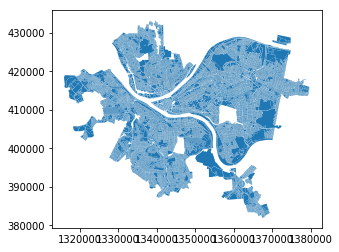

In [9]:
table_1999.plot()

In [510]:
apd_1999.loc[['0174E00236000000','0174E00234000000']]

,AREA,PERIMETER,CITYPROP_,CITYPROP_I,MAP,BLOCK,PARCEL,PARSUF,CITYPROP_L,ID,WARD,TRACT_,BLOCKLOT,GISLOTBLOC,REALGIS_LO,STREET,STREETSUF,STREETNUM,GISSTRTNUM,STREETHALF,REARCODE,ONAME1,ONAME2,ONAME3,OWNERADDR,OWNERCITY,DATABLOCK,BG1960,TRACT1960,BG1970,TLANDASMT,TBLDGASMT,TAXAREA,OLDLUSECDE,CORPCDENUM,ZONING,SLOPE,PROBLEMCOD,ASMTTYPECD,PARCELCLAS,EXCORPREGC,EXLNDASSMT,EXBLDASMT,EXAREAASMT,DATELASTSE,PRICELASTS,TYPELASTSE,PROPERTYOWNER,owner_address_raw,SALEDATE,is_dwelling,property_address_raw,property_address,owner_address
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0174E00236000000,2932.67589,252.24779,50834,2333,174,E,236,None,174E236,45069.0,13,02,174E236,174E236,174E236,IDLEWILD,ST,7206,7206.0,None,None,MCKOY JAMES E,& ANNE E,None,7206 IDLEWILD ST,PGH PA 15208,0011,None,00,309,1300.0,4900.0,2500.0,None,None,R2/,L,None,B,None,None,1300.0,4900.0,0.0,0767,11000.0,0,MCKOY JAMES E & ANNE E,7206 IDLEWILD ST PITTSBURGH PA 15208,1967-07-01,True,7206 IDLEWILD ST PITTSBURGH PA 15208,"7206 IDLEWILD ST, PITTSBURGH, PA, 15208","7206 IDLEWILD ST, PITTSBURGH, PA, 15208"
0174E00234000000,3395.00056,261.99942,50975,2366,174,E,234,None,174E234,45067.0,13,02,174E234,174E234,174E234,IDLEWILD,ST,7210,7210.0,None,None,JOHNSON TILLMAN,& ANNETTE (W),NATIONSBANC MTGE 335,PO BOX 740040,LOUISVILLE KY 40201,13012,None,00,309,1900.0,5500.0,3800.0,None,None,R2/,L,None,B,None,None,1900.0,5500.0,0.0,0675,18500.0,0,JOHNSON TILLMAN & ANNETTE (W),PO BOX 740040 LOUISVILLE KY 40201,1975-06-01,True,7210 IDLEWILD ST PITTSBURGH PA 15208,"7210 IDLEWILD ST, PITTSBURGH, PA, 15208",None


In [511]:
apd_2004.loc[['0174E00236000000','0174E00234000000']]

,OldBlockLot,FAIRMARKETLAND,FAIRMARKETBUILDING,MuniCode,MunDesc,PROPERTYOWNER,TaxCode,SaleDate,SALEPRICE,OwnerCode,SaleCode,ST_NUMBER,ST_NAME,CITYSTATE,ZIPCODE,SchoolCode,NumOfImprovements,NumOfParcels,PrevMapBloLot,DeedBook,PageNumber,LocalLandAssess,LocalBuildingAssess,MarketRatio,Abatement,AbatementDesc,AbatementStatus,YearAbateCleared,MailStreetNumber,MailStreetFraction,MailStreetName,MailCity,MailState,MailZipCode,HOMESTEADFLAG,Farmstead,STATECODE,USECODE,SQFT,NUMACRES,NEIGHCODE,PROP_TYPE,owner_address_raw,SALEDATE,FAIRMARKETTOTAL,is_dwelling,owner_address,property_address_raw,property_address
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0174E00236000000,174-E-236,4200,25200,113,PITTSBURGH - 13TH WARD,MCKOY JAMES E,20,1999-02-24 00:00:00,1.0,10,3.0,7206,IDLEWILD ST,PITTSBURGH PA,15208,47,1,1,0174E00236000000,10413,333,4200,25200,0.25,NaN,NaN,NaN,NaN,7206,,IDLEWILD ST,PITTSBURGH,PA,15208,C,NaN,R,10.0,2500.0,0.057,11302,2.0,7206 IDLEWILD ST PITTSBURGH PA 15208,1999-02-24,29400,True,"7206 IDLEWILD ST, PITTSBURGH, PA, 15208",7206 IDLEWILD ST PITTSBURGH PA 15208,"7206 IDLEWILD ST, PITTSBURGH, PA, 15208"
0174E00234000000,174-E-234,4600,34100,113,PITTSBURGH - 13TH WARD,JOHNSON TILLMAN & ANNETTE (W),20,1975-06-02 00:00:00,18500.0,10,0.0,7210,IDLEWILD ST,PITTSBURGH PA,15208,47,1,1,0174E00234000000,0,0,4600,34100,0.25,NaN,NaN,NaN,NaN,6053,,S FASHION SQ DR #200,MURRAY,UT,84107,NaN,NaN,R,10.0,3750.0,0.086,11302,2.0,6053 S FASHION SQ DR #200 MURRAY UT 84107,1975-06-02,38700,True,"6053 FASHION BLVD, MURRAY, UT, 84107",7210 IDLEWILD ST PITTSBURGH PA 15208,"7210 IDLEWILD ST, PITTSBURGH, PA, 15208"


In [191]:
apd_1999b[apd_1999b.SALEDATE=='1970-21-01']

,AREA,PERIMETER,CITYPROP_,CITYPROP_I,MAP,BLOCK,PARCEL,PARSUF,CITYPROP_L,ID,WARD,TRACT_,BLOCKLOT,GISLOTBLOC,REALGIS_LO,STREET,STREETSUF,STREETNUM,GISSTRTNUM,STREETHALF,REARCODE,ONAME1,ONAME2,ONAME3,OWNERADDR,OWNERCITY,DATABLOCK,BG1960,TRACT1960,BG1970,TLANDASMT,TBLDGASMT,TAXAREA,OLDLUSECDE,CORPCDENUM,ZONING,SLOPE,PROBLEMCOD,ASMTTYPECD,PARCELCLAS,EXCORPREGC,EXLNDASSMT,EXBLDASMT,EXAREAASMT,DATELASTSE,PRICELASTS,TYPELASTSE,geometry,PROPERTYOWNER,owner_address_raw,SALEDATE
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0232C00201000000,4936.50667,290.02102,66036,1235,232,C,201,None,232C201,49777.0,13,06,232C201,232C201,232C201,SWISSVALE,AV,2000,2000.0,A,None,SEACH CO INC,None,None,6255 LIBRARY RD,BETHEL PARK PA 1510,None,None,00,127,0.0,0.0,0.0,None,None,RP/,L,None,T,None,C,0.0,0.0,0.0,2170,0.0,0,"POLYGON ((1377509.68309758 414335.9621089065, 1377587.484324807 414326.4896924347, 1377594.0639202 414276.603867323, 1377595.396720557 414266.4988609588, 1377500.173251163 414282.1671634205, 1377501.478342775 414290.5023517364, 1377509.68309758 414335.9621089065))",SEACH CO INC,6255 LIBRARY RD BETHEL PARK PA 1510,1970-21-01


# MDB Support

In [9]:
# From https://stackoverflow.com/questions/17123550/extract-and-sort-data-from-mdb-file-using-mdbtools-in-python?utm_medium=organic&utm_source=google_rich_qa&utm_campaign=google_rich_qa
import sys, subprocess, os, numpy
from io import StringIO
import pandas as pd
import pandas
VERBOSE = True
def mdb_to_pandas(database_path,dtype_map):
    subprocess.call(["mdb-schema", database_path, "mysql"])
    # Get the list of table names with "mdb-tables"
    table_names = subprocess.Popen(["mdb-tables", "-1", database_path],
                                   stdout=subprocess.PIPE).communicate()[0]
    tables = table_names.splitlines()
    sys.stdout.flush()
    # Dump each table as a stringio using "mdb-export",
    out_tables = {}
    for rtable in tables:
        table = rtable.decode()
        if VERBOSE: print('running table:',table)
        if table != '':
            if VERBOSE: print("Dumping " + table)
            contents = subprocess.Popen(["mdb-export", database_path, table],
                                        stdout=subprocess.PIPE).communicate()[0]
            temp_io = StringIO(contents.decode('utf8'))
            print(table, temp_io)
            out_tables[table] = pd.read_csv(temp_io,dtype=dtype_map)
    return out_tables
pd.options.display.max_colwidth = 300
pd.set_option('display.max_columns', 500)


In [478]:
# ACCDB files are from Bob Gradeck
# 2009 is missing YEARBLT, CLASSDESC, and CLASS

# A number of files after 2009 seem to have a common set of column names
post_2009_colmap = {'mapblolot':'PARID',
                    'PropertyHouseNum'    :'PROPERTYHOUSENUM', 
                    'PropertyFraction'    :'PROPERTYFRACTION', 
                    'PropertyAddress'     :'PROPERTYADDRESS',  
                    'PropertyUnit'        :'PROPERTYUNIT',     
                    'PropertyCityState'   :'PROPERTYCITY',     
                    'PropertyLocation2'   :'PROPERTYSTATE',    
                    'PropertyZip'         :'PROPERTYZIP',       
                    'FairMarketTotal':'FAIRMARKETTOTAL',
                    'UseDesc':'USEDESC',
                    'PropertyZip':'PROPERTYZIP',
                    'PropertyOwner2':'PROPERTYOWNER',
                    'ChangeNoticeFullAddress1':'CHANGENOTICEADDRESS1',
                    'ChangeNoticeFullAddress2':'CHANGENOTICEADDRESS2',
                    'ChangeNoticeFullAddress3':'CHANGENOTICEADDRESS3',
                    'ChangeNoticeFullAddress4':'CHANGENOTICEADDRESS4',
                    'HomesteadFlag':'HOMESTEADFLAG',
                    'OwnerDesc':'OWNERDESC',
                    'SaleDate':'SALEDATE',
                    'SalePrice':'SALEPRICE',
                    'SaleCode': 'SALECODE',
                    'SaleDesc': 'SALEDESC'
                    }
post_2009_dtype = {'PropertyHouseNum':numpy.str,'PropertyFraction':numpy.str, 'PropertyZip':numpy.str,
                    'ChangeNoticeFullAddress1':numpy.str,'ChangeNoticeFullAddress2':numpy.str, 
                    'ChangeNoticeFullAddress3':numpy.str,'ChangeNoticeFullAddress4':numpy.str, 
                   }

accdb_info = {'2004':{'fname': 'assessments/kristin/ParcelData_RandySargent/2004/db1.mdb',
                      'tname': 'LandFileAug2001',
                      'col_remap': {'MapBloLot':'PARID',
                                    'CurOwnerName':'PROPERTYOWNER',
                                    'Homestead':'HOMESTEADFLAG',
                                    'SalePrice':'SALEPRICE',
                                    'TotalLandAssess':'FAIRMARKETLAND',
                                    'TotalBuildingAssess':'FAIRMARKETBUILDING'
                        },
                      'dtype':{'MailStreetNumber':numpy.str,'MailZipCode':numpy.str, 
                               'ST_NUMBER':numpy.str, 'ZIPCODE':numpy.str
                              }
                     },
              '2005':{'fname': 'assessments/kristin/ParcelData_RandySargent/2005/AC db 10.20.05.mdb',
                      'tname': 'DS09-21-05',
                      'col_remap': {'Field1':'PARID',
                                    'Field2':'PROPERTYOWNER',
                                    'Field23':'OWNERDESC',
                                    'Field27':'USEDESC',
                                    'Field29':'HOMESTEADFLAG',
                                    'Field31':'SALEDATE_raw',
                                    'Field32':'SALEPRICE',
                                    'Field36':'FAIRMARKETBUILDING',
                                    'Field37':'FAIRMARKETLAND',
                                    'Field38':'FAIRMARKETTOTAL',
                                    'Field57':'SALECODE',
                                    'Field58':'SALEDESC',
                                    'Field62':'YEARRBLT'
                        },
                      'dtype':{'Field45':numpy.str,'Field31':numpy.str, 
                               'Field4' :numpy.str, 'Field5' :numpy.str, 'Field6' :numpy.str, 
                               'Field7' :numpy.str, 'Field8' :numpy.str, 'Field9' :numpy.str, 
                               'Field10':numpy.str, 'Field11':numpy.str
                              }
                     },
              '2009':{'fname':'assessments/gradeck/AssessmentSep09.mdb',
                      'tname':'pncis',
                     'col_remap': {'PIN':'PARID',
                                    'PROPERTYHO':'PROPERTYHOUSENUM', 
                                    'PROPERTYAD':'PROPERTYFRACTION', 
                                    'PROPERTY_1':'PROPERTYADDRESS',  
                                    'PROPERTYUN':'PROPERTYUNIT',     
                                    'PROPERTYLO':'PROPERTYCITY',     
                                    'PROPERTYCI':'PROPERTYSTATE',    
                                    'PROPERTYZI':'PROPERTYZIP',       
                                    'FAIRMARK_2':'FAIRMARKETTOTAL',
                                    'USEDESC':'USEDESC',
                                    'PROPERTYZI':'PROPERTYZIP',
                                    'PROPERTYOW':'PROPERTYOWNER',
                                    'CHANGENOTI':'CHANGENOTICEADDRESS1',
                                    'CHANGENO_1':'CHANGENOTICEADDRESS2',
                                    'CHANGENO_2':'CHANGENOTICEADDRESS3',
                                    'CHANGENO_3':'CHANGENOTICEADDRESS4',
                                    'HOMESTEADF':'HOMESTEADFLAG',
                                    'OWNERDESC':'OWNERDESC',
                                    'SALEDATE':'SALEDATE',
                                    'SALEPRICE':'SALEPRICE'
                                  },
                      'dtype':{'PROPERTYHO':numpy.str,'PROPERTY_1':numpy.str,'PROPERTYUN':numpy.str,
                                'PROPERTYLO':numpy.str,'PROPERTYCI':numpy.str,'PROPERTYZI':numpy.str}
                     },
               '2010':{'fname':'assessments/gradeck/June2010AssessNew.accdb',
                       'tname':'RawDataAssessment',
                       'col_remap': post_2009_colmap,
                       'dtype': post_2009_dtype
                      },
               '2011':{'fname':'assessments/gradeck/AssessMarch2011Data3.mdb.accdb',
                       'tname':'AssessMarch2011',
                       'col_remap': {'PIN':'PARID',
                                    'PropertyOwnerNew':'PROPERTYOWNER',
                                    'CHANGENOTICEFULLADDRESS1':'CHANGENOTICEADDRESS1',
                                    'CHANGENOTICEFULLADDRESS2':'CHANGENOTICEADDRESS2',
                                    'CHANGENOTICEFULLADDRESS3':'CHANGENOTICEADDRESS3',
                                    'CHANGENOTICEFULLADDRESS4':'CHANGENOTICEADDRESS4',
                                    'PROPERTYHOUSENUM'    :'PROPERTYHOUSENUM',
                                    'PROPERTYADDNUMPREFIX':'PROPERTYFRACTION',
                                    'PROPERTYADDRESS'     :'PROPERTYADDRESS',
                                    'PROPERTYUNIT'        :'PROPERTYUNIT',
                                    'PROPERTYLOCATION2'   :'PROPERTYCITY',
                                    'PROPERTYCITYSTATE'   :'PROPERTYSTATE',
                                    'PROPERTYZIP'         :'PROPERTYZIP'       

                                  },
                        'dtype':{'PROPERTYHOUSENUM':numpy.str,'PROPERTYADDRESS':numpy.str,'PROPERTYUNIT':numpy.str,
                                'PROPERTYLOCATION2':numpy.str,'PROPERTYCITYSTATE':numpy.str,'PROPERTYZIP':numpy.str}
                      },
               '2012':{'fname':'assessments/gradeck/AssessNov2012.mdb',
                       'tname':'AssessmentOct2_2012',                       
                       'col_remap': {'SALEDATE':'SALEDATE_raw'},
                       'dtype':{'PROPERTYHOUSENUM':numpy.str,'PROPERTYADDRESS':numpy.str,'PROPERTYUNIT':numpy.str,
                                'PROPERTYLOCATION2':numpy.str,'PROPERTYCITYSTATE':numpy.str,'PROPERTYZIP':numpy.str,
                                'SALEDATE':numpy.str, 'CHANGENOTICEADDRESS1':numpy.str,
                                'CHANGENOTICEADDRESS2':numpy.str, 'CHANGENOTICEADDRESS3':numpy.str,
                                'CHANGENOTICEADDRESS4':numpy.str,}
                      },
               '2013':{'fname':'assessments/gradeck/Dec2013Assess.accdb',
                       'tname':'RawDataAssessment',
                       'col_remap': post_2009_colmap,
                       'dtype': post_2009_dtype
                      },
               '2014':{'fname':'assessments/gradeck/June2014Assess.accdb',
                       'tname':'RawDataAssessment',
                       'col_remap': post_2009_colmap,
                       'dtype': post_2009_dtype
                      },
               '2015':{'fname':'assessments/gradeck/May2015Assess.accdb',
                       'tname':'RawDataAssessment',
                       'col_remap': post_2009_colmap,
                       'dtype': post_2009_dtype
                      }
             }

In [11]:
# Uses accdb_info map to import a file for a given year and return a dataframe.  
# This doesn't remap the column names (we might not know them yet)
def import_accdb_file(year):
    # Import the accdb file for this year.  The returned value is a map of table names to tables
    accdb_table_map = mdb_to_pandas(accdb_info[year]['fname'], accdb_info[year]['dtype'])     
    apd_df = accdb_table_map[accdb_info[year]['tname']]
    return apd_df

# Takes a dataframe imported by import_accdb_file, renames columns, sets the index to PARID, 
# filters out rows that aren't dwellings, sets zipcode to be type string
skip_dwelling_col=False
def cleanup_accdb_import(df, year):
    r_df = df.rename(index=str, columns=accdb_info[year]['col_remap']).set_index('PARID')
    if(not skip_dwelling_col):
        r_df = pd.merge(r_df,dwelling_col.to_frame(),on='PARID', left_on=None, right_on=None,
                         left_index=False, right_index=False, sort=False,
                         suffixes=('_x', '_y'), copy=True, indicator=False,
                         validate=None)
        print "After merge, size = %d" % (len(r_df))

        r_df = r_df[r_df.is_dwelling]
        print "After filtering to only include dwellings, size = %d" % (len(r_df))

    # Change ',  -' in CHANGENOTICEADDRESS3 to nan (that's a common pattern in these accdb files)
    bad_changeaddr = r_df.CHANGENOTICEADDRESS3==',  -'
    r_df.loc[bad_changeaddr,'CHANGENOTICEADDRESS3']= numpy.nan

    # Filter out empty owner names
    empty_owner = r_df.PROPERTYOWNER.isna()

    # Filter out empty change addresses
    p1=pandas.isna(r_df.CHANGENOTICEADDRESS1) 
    p2=pandas.isna(r_df.CHANGENOTICEADDRESS2) 
    p3=pandas.isna(r_df.CHANGENOTICEADDRESS3)
    p4=pandas.isna(r_df.CHANGENOTICEADDRESS4)
    r_df = r_df[~((p1&p2&p3&p4)|empty_owner)]
    print "After filtering to remove empty owner names and change addresses, size = %d" % (len(r_df))

    # Fix up <BR> to be &
    r_df.PROPERTYOWNER = r_df.PROPERTYOWNER.str.replace('\s*<BR>\s*', ' & ', regex=True)
    return r_df

# More cleanup after merge
def cleanup_merged_accdb_import(df, year):
    # A common pattern of bad addresses is ' , -0000 ', get rid of ones like this
    bad_owner_addr = df.owner_address_raw.str.contains('^[\s,]*-\d\d\d\d\s*$',regex=True)
    r_df = df[~(bad_owner_addr)]
    print "After filtering to remove malformed owner_address_raw addresses, size = %d" % (len(r_df))
    return r_df

# Process 2004 data from Kristin

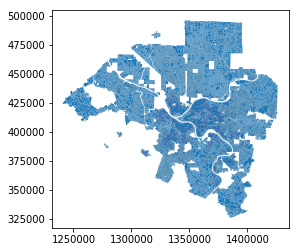

In [209]:
# Following example in https://stackoverflow.com/questions/41898561/pandas-transform-a-dbf-table-into-a-dataframe
# Unfortunately, this is only geometry
path_2004 = 'assessments/kristin/ParcelData_RandySargent/2004/parcels.shp'
table_2004=gpd.read_file(path_2004)

table_2004.plot()

In [279]:
# Try the mdb file instead
apd_2004_raw = import_accdb_file('2004') 
apd_2004_raw

('running table:', u'LandFileAug2001')
Dumping LandFileAug2001
(u'LandFileAug2001', <_io.StringIO object at 0x7f185932d4d0>)
('running table:', u'Municipalities')
Dumping Municipalities
(u'Municipalities', <_io.StringIO object at 0x7f185932d450>)
('running table:', u'Projects')
Dumping Projects
(u'Projects', <_io.StringIO object at 0x7f197e351350>)
('running table:', u'SMDA2002')
Dumping SMDA2002
(u'SMDA2002', <_io.StringIO object at 0x7f185932d550>)
('running table:', u'AllOwners')
Dumping AllOwners
(u'AllOwners', <_io.StringIO object at 0x7f197e351350>)


,MapBloLot,OldBlockLot,TotalLandAssess,TotalBuildingAssess,MuniCode,MunDesc,CurOwnerName,TaxCode,SaleDate,SalePrice,OwnerCode,SaleCode,ST_NUMBER,ST_NAME,CITYSTATE,ZIPCODE,SchoolCode,NumOfImprovements,NumOfParcels,PrevMapBloLot,DeedBook,PageNumber,LocalLandAssess,LocalBuildingAssess,MarketRatio,Abatement,AbatementDesc,AbatementStatus,YearAbateCleared,MailStreetNumber,MailStreetFraction,MailStreetName,MailCity,MailState,MailZipCode,Homestead,Farmstead,STATECODE,USECODE,SQFT,NUMACRES,NEIGHCODE,PROP_TYPE
0,0001A00100000000,1-A-100,11220800,0,101,PITTSBURGH - 1ST WARD,COMMONWEALTH OF PENNA,10,NaN,0.0,20,NaN,NaN,FORT PITT BLVD,NaN,15222,47,0,1,0001A00100000000,0,0,11220800,0,0.250,91.0,NaN,P,0.0,0300,NaN,LIBERTY AVE,PITTSBURGH,PA,152190000,NaN,NaN,G,610.0,362288.0,8.3170,101C1,1.0
1,0001A00100000000,1-A-100,11220800,0,101,PITTSBURGH - 1ST WARD,COMMONWEALTH OF PENNA,10,NaN,0.0,20,NaN,NaN,FORT PITT BLVD,NaN,15222,47,0,1,0001A00100000000,0,0,11220800,0,0.250,91.0,NaN,P,0.0,0300,NaN,LIBERTY AVE,PITTSBURGH,PA,152190000,NaN,NaN,G,610.0,411275.0,9.4420,101C1,1.0
2,0001B00010000000,1-B-10,4834400,0,101,PITTSBURGH - 1ST WARD,COMMONWEALTH OF PENNA,10,NaN,0.0,20,NaN,NaN,PENN AVE,PGH PA,15222,47,0,1,0001B00010000000,0,0,4834400,0,0.250,NaN,NaN,NaN,NaN,0300,NaN,LIBERTY AVE,PITTSBURGH,PA,152190000,NaN,NaN,L,610.0,106320.0,2.4410,101C1,1.0
3,0001B00010000000,1-B-10,4834400,0,101,PITTSBURGH - 1ST WARD,COMMONWEALTH OF PENNA,10,NaN,0.0,20,NaN,NaN,PENN AVE,PGH PA,15222,47,0,1,0001B00010000000,0,0,4834400,0,0.250,NaN,NaN,NaN,NaN,0300,NaN,LIBERTY AVE,PITTSBURGH,PA,152190000,NaN,NaN,L,610.0,106320.0,2.4410,101C1,1.0
4,0001B00024000000,1-B-24,455000,7400,101,PITTSBURGH - 1ST WARD,FORT PITT SOCIETY OF THE DAUGHTERS OF THE,10,1984-11-19 00:00:00,0.0,20,9.0,NaN,FORT PITT BLVD,PGH PA,15222,47,1,1,0001B00024000000,6878,598,455000,7400,0.250,NaN,NaN,NaN,NaN,0000,NaN,FT PITT BLOCKHOUSE,PITTSBURGH,PA,152220000,NaN,NaN,O,680.0,9000.0,0.2070,101C1,3.0
5,0001B00024000000,1-B-24,455000,7400,101,PITTSBURGH - 1ST WARD,FORT PITT SOCIETY OF THE DAUGHTERS OF THE,10,1984-11-19 00:00:00,0.0,20,9.0,NaN,FORT PITT BLVD,PGH PA,15222,47,1,1,0001B00024000000,6878,598,455000,7400,0.250,NaN,NaN,NaN,NaN,0000,NaN,FT PITT BLOCKHOUSE,PITTSBURGH,PA,152220000,NaN,NaN,O,680.0,9000.0,0.2070,101C1,3.0
6,0001B00026000000,1-B-26,139000,0,101,PITTSBURGH - 1ST WARD,COMMONWEALTH OF PENNA,10,NaN,0.0,20,NaN,NaN,PENN AVE,PGH PA,15222,47,0,1,0001B00026000000,0,0,139000,0,0.250,NaN,NaN,NaN,NaN,0300,NaN,LIBERTY AVE,PITTSBURGH,PA,152190000,NaN,NaN,G,610.0,1800.0,0.0410,101C1,1.0
7,0001B00026000000,1-B-26,139000,0,101,PITTSBURGH - 1ST WARD,COMMONWEALTH OF PENNA,10,NaN,0.0,20,NaN,NaN,PENN AVE,PGH PA,15222,47,0,1,0001B00026000000,0,0,139000,0,0.250,NaN,NaN,NaN,NaN,0300,NaN,LIBERTY AVE,PITTSBURGH,PA,152190000,NaN,NaN,G,610.0,1800.0,0.0410,101C1,1.0
8,0001B00050000000,1-B-50,27002700,119900,101,PITTSBURGH - 1ST WARD,COMMONWEALTH OF PENNA,10,NaN,0.0,20,NaN,NaN,PENN AVE,PGH PA,15222,47,1,1,0001B00050000000,0,0,27002700,119900,0.250,NaN,NaN,NaN,NaN,0300,NaN,LIBERTY AVE,PITTSBURGH,PA,152190000,NaN,NaN,G,610.0,598956.0,13.7500,101C1,3.0
9,0001B00050000000,1-B-50,27002700,119900,101,PITTSBURGH - 1ST WARD,COMMONWEALTH OF PENNA,10,NaN,0.0,20,NaN,NaN,PENN AVE,PGH PA,15222,47,1,1,0001B00050000000,0,0,27002700,119900,0.250,NaN,NaN,NaN,NaN,0300,NaN,LIBERTY AVE,PITTSBURGH,PA,152190000,NaN,NaN,G,610.0,598956.0,13.7500,101C1,3.0


In [287]:
year='2004'
apd_2004 = apd_2004_raw.rename(index=str, columns=accdb_info[year]['col_remap'])
apd_2004 = apd_2004.set_index('PARID')
apd_2004

,OldBlockLot,FAIRMARKETLAND,FAIRMARKETBUILDING,MuniCode,MunDesc,PROPERTYOWNER,TaxCode,SaleDate,SALEPRICE,OwnerCode,SaleCode,ST_NUMBER,ST_NAME,CITYSTATE,ZIPCODE,SchoolCode,NumOfImprovements,NumOfParcels,PrevMapBloLot,DeedBook,PageNumber,LocalLandAssess,LocalBuildingAssess,MarketRatio,Abatement,AbatementDesc,AbatementStatus,YearAbateCleared,MailStreetNumber,MailStreetFraction,MailStreetName,MailCity,MailState,MailZipCode,HOMESTEADFLAG,Farmstead,STATECODE,USECODE,SQFT,NUMACRES,NEIGHCODE,PROP_TYPE
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0001A00100000000,1-A-100,11220800,0,101,PITTSBURGH - 1ST WARD,COMMONWEALTH OF PENNA,10,NaN,0.0,20,NaN,NaN,FORT PITT BLVD,NaN,15222,47,0,1,0001A00100000000,0,0,11220800,0,0.250,91.0,NaN,P,0.0,0300,NaN,LIBERTY AVE,PITTSBURGH,PA,152190000,NaN,NaN,G,610.0,362288.0,8.3170,101C1,1.0
0001A00100000000,1-A-100,11220800,0,101,PITTSBURGH - 1ST WARD,COMMONWEALTH OF PENNA,10,NaN,0.0,20,NaN,NaN,FORT PITT BLVD,NaN,15222,47,0,1,0001A00100000000,0,0,11220800,0,0.250,91.0,NaN,P,0.0,0300,NaN,LIBERTY AVE,PITTSBURGH,PA,152190000,NaN,NaN,G,610.0,411275.0,9.4420,101C1,1.0
0001B00010000000,1-B-10,4834400,0,101,PITTSBURGH - 1ST WARD,COMMONWEALTH OF PENNA,10,NaN,0.0,20,NaN,NaN,PENN AVE,PGH PA,15222,47,0,1,0001B00010000000,0,0,4834400,0,0.250,NaN,NaN,NaN,NaN,0300,NaN,LIBERTY AVE,PITTSBURGH,PA,152190000,NaN,NaN,L,610.0,106320.0,2.4410,101C1,1.0
0001B00010000000,1-B-10,4834400,0,101,PITTSBURGH - 1ST WARD,COMMONWEALTH OF PENNA,10,NaN,0.0,20,NaN,NaN,PENN AVE,PGH PA,15222,47,0,1,0001B00010000000,0,0,4834400,0,0.250,NaN,NaN,NaN,NaN,0300,NaN,LIBERTY AVE,PITTSBURGH,PA,152190000,NaN,NaN,L,610.0,106320.0,2.4410,101C1,1.0
0001B00024000000,1-B-24,455000,7400,101,PITTSBURGH - 1ST WARD,FORT PITT SOCIETY OF THE DAUGHTERS OF THE,10,1984-11-19 00:00:00,0.0,20,9.0,NaN,FORT PITT BLVD,PGH PA,15222,47,1,1,0001B00024000000,6878,598,455000,7400,0.250,NaN,NaN,NaN,NaN,0000,NaN,FT PITT BLOCKHOUSE,PITTSBURGH,PA,152220000,NaN,NaN,O,680.0,9000.0,0.2070,101C1,3.0
0001B00024000000,1-B-24,455000,7400,101,PITTSBURGH - 1ST WARD,FORT PITT SOCIETY OF THE DAUGHTERS OF THE,10,1984-11-19 00:00:00,0.0,20,9.0,NaN,FORT PITT BLVD,PGH PA,15222,47,1,1,0001B00024000000,6878,598,455000,7400,0.250,NaN,NaN,NaN,NaN,0000,NaN,FT PITT BLOCKHOUSE,PITTSBURGH,PA,152220000,NaN,NaN,O,680.0,9000.0,0.2070,101C1,3.0
0001B00026000000,1-B-26,139000,0,101,PITTSBURGH - 1ST WARD,COMMONWEALTH OF PENNA,10,NaN,0.0,20,NaN,NaN,PENN AVE,PGH PA,15222,47,0,1,0001B00026000000,0,0,139000,0,0.250,NaN,NaN,NaN,NaN,0300,NaN,LIBERTY AVE,PITTSBURGH,PA,152190000,NaN,NaN,G,610.0,1800.0,0.0410,101C1,1.0
0001B00026000000,1-B-26,139000,0,101,PITTSBURGH - 1ST WARD,COMMONWEALTH OF PENNA,10,NaN,0.0,20,NaN,NaN,PENN AVE,PGH PA,15222,47,0,1,0001B00026000000,0,0,139000,0,0.250,NaN,NaN,NaN,NaN,0300,NaN,LIBERTY AVE,PITTSBURGH,PA,152190000,NaN,NaN,G,610.0,1800.0,0.0410,101C1,1.0
0001B00050000000,1-B-50,27002700,119900,101,PITTSBURGH - 1ST WARD,COMMONWEALTH OF PENNA,10,NaN,0.0,20,NaN,NaN,PENN AVE,PGH PA,15222,47,1,1,0001B00050000000,0,0,27002700,119900,0.250,NaN,NaN,NaN,NaN,0300,NaN,LIBERTY AVE,PITTSBURGH,PA,152190000,NaN,NaN,G,610.0,598956.0,13.7500,101C1,3.0


In [289]:
apd_2004[~pd.isna(apd_2004.MailStreetFraction)]

,OldBlockLot,FAIRMARKETLAND,FAIRMARKETBUILDING,MuniCode,MunDesc,PROPERTYOWNER,TaxCode,SaleDate,SALEPRICE,OwnerCode,SaleCode,ST_NUMBER,ST_NAME,CITYSTATE,ZIPCODE,SchoolCode,NumOfImprovements,NumOfParcels,PrevMapBloLot,DeedBook,PageNumber,LocalLandAssess,LocalBuildingAssess,MarketRatio,Abatement,AbatementDesc,AbatementStatus,YearAbateCleared,MailStreetNumber,MailStreetFraction,MailStreetName,MailCity,MailState,MailZipCode,HOMESTEADFLAG,Farmstead,STATECODE,USECODE,SQFT,NUMACRES,NEIGHCODE,PROP_TYPE
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0002A00025000000,2-A-25,159900,190300,102,PITTSBURGH - 2ND WARD,THORPE LEON F & LARRY DEITCH 1/2 INT EACH,20,1976-03-31 00:00:00,1.0,10,9.0,820,LIBERTY AVE,NaN,15222,47,1,1,0002A00025000000,0,0,159900,190300,0.250,NaN,NaN,NaN,NaN,0818,L,IBERTY AVE,PGH,PA,152220000,NaN,NaN,C,405.0,2895.0,0.066,102C1,3.0
0002A00025000000,2-A-25,159900,190300,102,PITTSBURGH - 2ND WARD,THORPE LEON F & LARRY DEITCH 1/2 INT EACH,20,1976-03-31 00:00:00,1.0,10,9.0,820,LIBERTY AVE,NaN,15222,47,1,1,0002A00025000000,0,0,159900,190300,0.250,NaN,NaN,NaN,NaN,0818,L,IBERTY AVE,PGH,PA,152220000,NaN,NaN,C,405.0,2895.0,0.066,102C1,3.0
0002D00314000000,2-D-314,5500,21100,103,PITTSBURGH - 3RD WARD,BROWN PAUL K,20,1984-11-20 00:00:00,7000.0,10,0.0,88,ROBERTS ST,PITTSBURGH PA,15219,47,1,1,0002D00314000000,6984,414,5500,21100,0.250,NaN,NaN,NaN,NaN,0657,5,ROWAN ST,PGH,PA,152060000,NaN,NaN,C,404.0,1250.0,0.029,103C9,6.0
0002F00175002100,2-F-175-21,0,50900,103,PITTSBURGH - 3RD WARD,DEGRAZIA LISA,20,1997-10-28 00:00:00,65500.0,11,0.0,112,WASHINGTON PL,PITTSBURGH PA,15219,47,1,0,0002F00175002100,10063,603,0,50900,0.250,NaN,NaN,NaN,NaN,2,A,CHATHAM TOWER,PITTSBURGH,PA,152190000,NaN,NaN,R,50.0,NaN,NaN,10380,2.0
0002F00175002700,2-F-175-27,0,40700,103,PITTSBURGH - 3RD WARD,MAST CHRISTEL,20,2000-10-23 00:00:00,1.0,10,8.0,112,WASHINGTON PL,PITTSBURGH PA,15219,47,1,0,0002F00175002700,10896,95,0,40700,0.250,NaN,NaN,NaN,NaN,20,A,CHATHAM TOWER CONDO,PITTSBURGH,PA,152190000,NaN,NaN,R,50.0,NaN,NaN,10380,2.0
0002F00175002800,2-F-175-28,0,40500,103,PITTSBURGH - 3RD WARD,MAST CHRISTEL,20,2000-10-23 00:00:00,1.0,10,8.0,112,WASHINGTON PL,PITTSBURGH PA,15219,47,1,0,0002F00175002800,10896,95,0,40500,0.250,NaN,NaN,NaN,NaN,20,A,CHATHAM TOWER CONDO,PITTSBURGH,PA,152190000,NaN,NaN,R,50.0,NaN,NaN,10380,2.0
0002F00175004200,2-F-175-42,0,25600,103,PITTSBURGH - 3RD WARD,MAST CHRISTEL,20,2000-10-23 00:00:00,1.0,10,8.0,112,WASHINGTON PL,PITTSBURGH PA,15219,47,1,0,0002F00175004200,10896,95,0,25600,0.250,NaN,NaN,NaN,NaN,20,A,CHATHAM TOWER CONDO,PITTSBURGH,PA,152190000,NaN,NaN,R,50.0,NaN,NaN,10380,2.0
0002F00175006200,2-F-175-62,0,25600,103,PITTSBURGH - 3RD WARD,MAST CHRISTEL,20,2000-10-23 00:00:00,1.0,10,8.0,112,WASHINGTON PL,PITTSBURGH PA,15219,47,1,0,0002F00175006200,10896,95,0,25600,0.250,NaN,NaN,NaN,NaN,20,A,CHATHAM TOWER CONDO,PITTSBURGH,PA,152190000,NaN,NaN,R,50.0,NaN,NaN,10380,2.0
0002F00175006300,2-F-175-63,0,40400,103,PITTSBURGH - 3RD WARD,PERCY GORDON K,20,1985-03-21 00:00:00,1.0,10,9.0,112,WASHINGTON PL,PITTSBURGH PA,15219,47,1,0,0002F00175006300,7047,307,0,40400,0.250,NaN,NaN,NaN,NaN,0006,C,CHATHAM TOWER,PITTSBURGH,PA,152190000,C,NaN,R,50.0,NaN,NaN,10380,2.0


In [290]:
len(apd_2004)

557695

In [291]:
# Filter out empty owner address
apd_2004 = apd_2004[~(pd.isna(apd_2004.MailCity) | (apd_2004.MailStreetName=='NO KNOWN ADDRESS'))].copy()
len(apd_2004)

549927

In [293]:
# Replace PGH with PITTSBURGH
apd_2004['MailCity']= apd_2004['MailCity'].str.replace('\s*PGH\s*', 'PITTSBURGH', regex=True)

In [294]:
# Truncate leading zeroes from MailStreetNumber
apd_2004['MailStreetNumber']= apd_2004['MailStreetNumber'].str.replace('^0+', '', regex=True)

In [295]:
# Truncate trailing zeroes from MailZipCode
apd_2004['MailZipCode']= apd_2004['MailZipCode'].str.replace('0000$', '', regex=True)

In [296]:
oa_arr_2004 = ['MailStreetNumber','MailStreetFraction','MailStreetName','MailCity','MailState','MailZipCode']
df=apd_2004

for  col_name in oa_arr_2004:
    df[col_name]=df[col_name].astype(basestring)
    df[col_name].fillna('', inplace=True)

df['owner_address_raw'] = df[oa_arr_2004].apply(' '.join, axis=1)
oa_arr_2004.append('owner_address_raw')

In [297]:
# Fix up to make sure there aren't differences in whitespace that could be avoided
df['owner_address_raw'] = df['owner_address_raw'].str.replace('\s\s+', ' ', regex=True)


In [298]:
df['owner_address_raw'] = df['owner_address_raw'].str.replace('^\s+', '', regex=True)
df['owner_address_raw'] = df['owner_address_raw'].str.replace('\s+$', '', regex=True)

In [299]:
df[oa_arr_2004]

,MailStreetNumber,MailStreetFraction,MailStreetName,MailCity,MailState,MailZipCode,owner_address_raw
PARID,,,,,,,
0001A00100000000,300,,LIBERTY AVE,PITTSBURGH,PA,15219,300 LIBERTY AVE PITTSBURGH PA 15219
0001A00100000000,300,,LIBERTY AVE,PITTSBURGH,PA,15219,300 LIBERTY AVE PITTSBURGH PA 15219
0001B00010000000,300,,LIBERTY AVE,PITTSBURGH,PA,15219,300 LIBERTY AVE PITTSBURGH PA 15219
0001B00010000000,300,,LIBERTY AVE,PITTSBURGH,PA,15219,300 LIBERTY AVE PITTSBURGH PA 15219
0001B00024000000,,,FT PITT BLOCKHOUSE,PITTSBURGH,PA,15222,FT PITT BLOCKHOUSE PITTSBURGH PA 15222
0001B00024000000,,,FT PITT BLOCKHOUSE,PITTSBURGH,PA,15222,FT PITT BLOCKHOUSE PITTSBURGH PA 15222
0001B00026000000,300,,LIBERTY AVE,PITTSBURGH,PA,15219,300 LIBERTY AVE PITTSBURGH PA 15219
0001B00026000000,300,,LIBERTY AVE,PITTSBURGH,PA,15219,300 LIBERTY AVE PITTSBURGH PA 15219
0001B00050000000,300,,LIBERTY AVE,PITTSBURGH,PA,15219,300 LIBERTY AVE PITTSBURGH PA 15219


In [300]:
apd_2004=df

In [167]:
apd_2004[apd_2004.MailStreetFraction!=''][oa_arr_2004]

,MailStreetNumber,MailStreetFraction,MailStreetName,MailCity,MailState,MailZipCode,owner_address_raw
PARID,,,,,,,
0002A00025000000,818,L,IBERTY AVE,PITTSBURGH,PA,15222,818 L IBERTY AVE PITTSBURGH PA 15222
0002A00025000000,818,L,IBERTY AVE,PITTSBURGH,PA,15222,818 L IBERTY AVE PITTSBURGH PA 15222
0002D00314000000,657,5,ROWAN ST,PITTSBURGH,PA,15206,657 5 ROWAN ST PITTSBURGH PA 15206
0002F00175002100,2,A,CHATHAM TOWER,PITTSBURGH,PA,15219,2 A CHATHAM TOWER PITTSBURGH PA 15219
0002F00175002700,20,A,CHATHAM TOWER CONDO,PITTSBURGH,PA,15219,20 A CHATHAM TOWER CONDO PITTSBURGH PA 15219
0002F00175002800,20,A,CHATHAM TOWER CONDO,PITTSBURGH,PA,15219,20 A CHATHAM TOWER CONDO PITTSBURGH PA 15219
0002F00175004200,20,A,CHATHAM TOWER CONDO,PITTSBURGH,PA,15219,20 A CHATHAM TOWER CONDO PITTSBURGH PA 15219
0002F00175006200,20,A,CHATHAM TOWER CONDO,PITTSBURGH,PA,15219,20 A CHATHAM TOWER CONDO PITTSBURGH PA 15219
0002F00175006300,6,C,CHATHAM TOWER,PITTSBURGH,PA,15219,6 C CHATHAM TOWER PITTSBURGH PA 15219


In [231]:
print  apd_2004.loc['0002A00025000000']['owner_address_raw'].unique()
print  apd_2004.loc['0003P00258000000']['owner_address_raw']
print  apd_2004.loc['0006S00160000000']['owner_address_raw']
print  apd_2004.loc['9844X00063000000']['owner_address_raw']
print  apd_2004.loc['9910X00158000000']['owner_address_raw']
print  apd_2004.loc['9923X82055000000']['owner_address_raw']
print  apd_2004.loc['9929X00669000000']['owner_address_raw']
print  apd_2004.loc['9946X50144000000']['owner_address_raw']


['818 L IBERTY AVE PITTSBURGH PA 15222']
915 E UREKA ST PITTSBURGH PA 15210
233 H ALLOCK ST PITTSBURGH PA 15211
301 M OREA RD FRACKVILLE PA 17932
9 G TON DR SUNNYVILLE CA 94087
200 P ARKWOOD DR RD3 MARS PA 16046
7 B OX 45 IMPERIAL PA 15126
M CVEY ST STURGEON PA 15082


In [302]:
apd_2004.set_value('0002A00025000000','owner_address_raw','818 LIBERTY AVE PITTSBURGH PA 15222')
apd_2004.set_value('0003P00258000000','owner_address_raw','915 EUREKA ST PITTSBURGH PA 15210')
apd_2004.set_value('0006S00160000000','owner_address_raw','233 HALLOCK ST PITTSBURGH PA 15211')
apd_2004.set_value('9844X00063000000','owner_address_raw','301 MOREA RD FRACKVILLE PA 17932')
apd_2004.set_value('9910X00158000000','owner_address_raw','9 G TON DR SUNNYVALE CA 94087')
apd_2004.set_value('9923X82055000000','owner_address_raw','200 PARKWOOD DR RD3 MARS PA 16046')
apd_2004.set_value('9929X00669000000','owner_address_raw','7 BOX 45 IMPERIAL PA 15126')
apd_2004.set_value('9946X50144000000','owner_address_raw',' MCVEY ST STURGEON PA 15082')


/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:1: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  """Entry point for launching an IPython kernel.
/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:2: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  
/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:3: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  This is separate from the ipykernel package so we can avoid doing imports until
/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:4: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  after removing the cwd from sys.path.
/home/rsargen

,OldBlockLot,FAIRMARKETLAND,FAIRMARKETBUILDING,MuniCode,MunDesc,PROPERTYOWNER,TaxCode,SaleDate,SALEPRICE,OwnerCode,SaleCode,ST_NUMBER,ST_NAME,CITYSTATE,ZIPCODE,SchoolCode,NumOfImprovements,NumOfParcels,PrevMapBloLot,DeedBook,PageNumber,LocalLandAssess,LocalBuildingAssess,MarketRatio,Abatement,AbatementDesc,AbatementStatus,YearAbateCleared,MailStreetNumber,MailStreetFraction,MailStreetName,MailCity,MailState,MailZipCode,HOMESTEADFLAG,Farmstead,STATECODE,USECODE,SQFT,NUMACRES,NEIGHCODE,PROP_TYPE,owner_address_raw
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0001A00100000000,1-A-100,11220800,0,101,PITTSBURGH - 1ST WARD,COMMONWEALTH OF PENNA,10,NaN,0.0,20,NaN,NaN,FORT PITT BLVD,NaN,15222,47,0,1,0001A00100000000,0,0,11220800,0,0.250,91.0,NaN,P,0.0,300,,LIBERTY AVE,PITTSBURGH,PA,15219,NaN,NaN,G,610.0,362288.0,8.3170,101C1,1.0,300 LIBERTY AVE PITTSBURGH PA 15219
0001A00100000000,1-A-100,11220800,0,101,PITTSBURGH - 1ST WARD,COMMONWEALTH OF PENNA,10,NaN,0.0,20,NaN,NaN,FORT PITT BLVD,NaN,15222,47,0,1,0001A00100000000,0,0,11220800,0,0.250,91.0,NaN,P,0.0,300,,LIBERTY AVE,PITTSBURGH,PA,15219,NaN,NaN,G,610.0,411275.0,9.4420,101C1,1.0,300 LIBERTY AVE PITTSBURGH PA 15219
0001B00010000000,1-B-10,4834400,0,101,PITTSBURGH - 1ST WARD,COMMONWEALTH OF PENNA,10,NaN,0.0,20,NaN,NaN,PENN AVE,PGH PA,15222,47,0,1,0001B00010000000,0,0,4834400,0,0.250,NaN,NaN,NaN,NaN,300,,LIBERTY AVE,PITTSBURGH,PA,15219,NaN,NaN,L,610.0,106320.0,2.4410,101C1,1.0,300 LIBERTY AVE PITTSBURGH PA 15219
0001B00010000000,1-B-10,4834400,0,101,PITTSBURGH - 1ST WARD,COMMONWEALTH OF PENNA,10,NaN,0.0,20,NaN,NaN,PENN AVE,PGH PA,15222,47,0,1,0001B00010000000,0,0,4834400,0,0.250,NaN,NaN,NaN,NaN,300,,LIBERTY AVE,PITTSBURGH,PA,15219,NaN,NaN,L,610.0,106320.0,2.4410,101C1,1.0,300 LIBERTY AVE PITTSBURGH PA 15219
0001B00024000000,1-B-24,455000,7400,101,PITTSBURGH - 1ST WARD,FORT PITT SOCIETY OF THE DAUGHTERS OF THE,10,1984-11-19 00:00:00,0.0,20,9.0,NaN,FORT PITT BLVD,PGH PA,15222,47,1,1,0001B00024000000,6878,598,455000,7400,0.250,NaN,NaN,NaN,NaN,,,FT PITT BLOCKHOUSE,PITTSBURGH,PA,15222,NaN,NaN,O,680.0,9000.0,0.2070,101C1,3.0,FT PITT BLOCKHOUSE PITTSBURGH PA 15222
0001B00024000000,1-B-24,455000,7400,101,PITTSBURGH - 1ST WARD,FORT PITT SOCIETY OF THE DAUGHTERS OF THE,10,1984-11-19 00:00:00,0.0,20,9.0,NaN,FORT PITT BLVD,PGH PA,15222,47,1,1,0001B00024000000,6878,598,455000,7400,0.250,NaN,NaN,NaN,NaN,,,FT PITT BLOCKHOUSE,PITTSBURGH,PA,15222,NaN,NaN,O,680.0,9000.0,0.2070,101C1,3.0,FT PITT BLOCKHOUSE PITTSBURGH PA 15222
0001B00026000000,1-B-26,139000,0,101,PITTSBURGH - 1ST WARD,COMMONWEALTH OF PENNA,10,NaN,0.0,20,NaN,NaN,PENN AVE,PGH PA,15222,47,0,1,0001B00026000000,0,0,139000,0,0.250,NaN,NaN,NaN,NaN,300,,LIBERTY AVE,PITTSBURGH,PA,15219,NaN,NaN,G,610.0,1800.0,0.0410,101C1,1.0,300 LIBERTY AVE PITTSBURGH PA 15219
0001B00026000000,1-B-26,139000,0,101,PITTSBURGH - 1ST WARD,COMMONWEALTH OF PENNA,10,NaN,0.0,20,NaN,NaN,PENN AVE,PGH PA,15222,47,0,1,0001B00026000000,0,0,139000,0,0.250,NaN,NaN,NaN,NaN,300,,LIBERTY AVE,PITTSBURGH,PA,15219,NaN,NaN,G,610.0,1800.0,0.0410,101C1,1.0,300 LIBERTY AVE PITTSBURGH PA 15219
0001B00050000000,1-B-50,27002700,119900,101,PITTSBURGH - 1ST WARD,COMMONWEALTH OF PENNA,10,NaN,0.0,20,NaN,NaN,PENN AVE,PGH PA,15222,47,1,1,0001B00050000000,0,0,27002700,119900,0.250,NaN,NaN,NaN,NaN,300,,LIBERTY AVE,PITTSBURGH,PA,15219,NaN,NaN,G,610.0,598956.0,13.7500,101C1,3.0,300 LIBERTY AVE PITTSBURGH PA 15219


In [303]:
# Filter out duplicate indices
apd_2004 = apd_2004[~apd_2004.index.duplicated()].copy()

In [304]:
len(apd_2004)

544530

In [305]:
apd_2004[oa_arr_2004]

,MailStreetNumber,MailStreetFraction,MailStreetName,MailCity,MailState,MailZipCode,owner_address_raw
PARID,,,,,,,
0001A00100000000,300,,LIBERTY AVE,PITTSBURGH,PA,15219,300 LIBERTY AVE PITTSBURGH PA 15219
0001B00010000000,300,,LIBERTY AVE,PITTSBURGH,PA,15219,300 LIBERTY AVE PITTSBURGH PA 15219
0001B00024000000,,,FT PITT BLOCKHOUSE,PITTSBURGH,PA,15222,FT PITT BLOCKHOUSE PITTSBURGH PA 15222
0001B00026000000,300,,LIBERTY AVE,PITTSBURGH,PA,15219,300 LIBERTY AVE PITTSBURGH PA 15219
0001B00050000000,300,,LIBERTY AVE,PITTSBURGH,PA,15219,300 LIBERTY AVE PITTSBURGH PA 15219
0001C00037000000,,,PO BOX A3879,CHICAGO,IL,60690,PO BOX A3879 CHICAGO IL 60690
0001C00058000000,,,ONE OXFORD CTR #4500,PITTSBURGH,PA,15219,ONE OXFORD CTR #4500 PITTSBURGH PA 15219
0001C00110000000,215,,CITY COUNTY BLDG,PITTSBURGH,PA,15219,215 CITY COUNTY BLDG PITTSBURGH PA 15219
0001C00111000000,215,,CITY COUNTY BLDG,PITTSBURGH,PA,15219,215 CITY COUNTY BLDG PITTSBURGH PA 15219


In [306]:
# Filter out empty sale dates
apd_2004 = apd_2004[~pd.isnull(apd_2004.SaleDate)].copy()

In [307]:
len(apd_2004)

430950

In [310]:
apd_2004.loc['0001B00024000000'].ZIPCODE

'15222'

In [175]:
apd_2004['SaleDate']

PARID
0001B00024000000    1984-11-19 00:00:00
0001C00037000000    1997-11-25 00:00:00
0001C00058000000    1995-12-22 00:00:00
0001C00167000001    1995-10-02 00:00:00
0001C00167000002    1995-10-02 00:00:00
0001C00170000000    1982-02-04 00:00:00
0001C00190000000    1995-10-02 00:00:00
0001C00200000000    1995-10-02 00:00:00
0001C00200000001    1984-01-24 00:00:00
0001C00224000000    2000-09-22 00:00:00
0001C01661000000    1986-05-01 00:00:00
0001C01661000100    1983-05-27 00:00:00
0001C01661001100    1983-07-01 00:00:00
0001C01661002300    1997-12-04 00:00:00
0001C01661003400    1994-12-15 00:00:00
0001C01661006700    1983-07-01 00:00:00
0001C01661009700    1983-07-14 00:00:00
0001C0166100W200    1994-04-13 00:00:00
0001C01661011400    1996-04-03 00:00:00
0001C01661032200    1994-12-15 00:00:00
0001C016610W2100    1995-07-20 00:00:00
0001C016610W2600    1994-06-01 00:00:00
0001C016610W2900    1994-06-01 00:00:00
0001C01661512600    1986-06-30 00:00:00
0001C01661A03800    1993-08-30 00:

In [311]:
apd_2004['SALEDATE']=apd_2004.SaleDate.str.replace('\s+00:00:00$','', regex=True)

In [312]:
apd_2004['SALEDATE']

PARID
0001B00024000000    1984-11-19
0001C00037000000    1997-11-25
0001C00058000000    1995-12-22
0001C00167000001    1995-10-02
0001C00167000002    1995-10-02
0001C00170000000    1982-02-04
0001C00190000000    1995-10-02
0001C00200000000    1995-10-02
0001C00200000001    1984-01-24
0001C00224000000    2000-09-22
0001C01661000000    1986-05-01
0001C01661000100    1983-05-27
0001C01661001100    1983-07-01
0001C01661002300    1997-12-04
0001C01661003400    1994-12-15
0001C01661006700    1983-07-01
0001C01661009700    1983-07-14
0001C0166100W200    1994-04-13
0001C01661011400    1996-04-03
0001C01661032200    1994-12-15
0001C016610W2100    1995-07-20
0001C016610W2600    1994-06-01
0001C016610W2900    1994-06-01
0001C01661512600    1986-06-30
0001C01661A03800    1993-08-30
0001C01661A04600    1984-05-02
0001C01661A05700    1999-08-19
0001C01661A33900    1983-06-30
0001C01661B02400    1994-07-07
0001C01661B03800    1989-06-12
0001C01661B09600    1995-10-02
0001C01661C02600    1983-09-18
00

In [179]:
save_adf(apd_2004,'apd_2004')

Saving to assessments/apdstore_apd_2004.h5, key=apd_2004


/home/rsargent/anaconda2/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2878: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block2_values] [items->['OldBlockLot', 'MunDesc', 'PROPERTYOWNER', 'SaleDate', 'ST_NUMBER', 'ST_NAME', 'CITYSTATE', 'ZIPCODE', 'PrevMapBloLot', 'AbatementDesc', 'AbatementStatus', 'MailStreetNumber', 'MailStreetFraction', 'MailStreetName', 'MailCity', 'MailState', 'MailZipCode', 'HOMESTEADFLAG', 'STATECODE', 'NEIGHCODE', 'owner_address_raw', 'SALEDATE']]

  exec(code_obj, self.user_global_ns, self.user_ns)


In [383]:
apd_2004 = restore_adf('apd_2004')

Restoring from assessments/apdstore_apd_2004.h5, key=apd_2004


In [180]:
len(apd_2004)

430950

In [181]:
canonicalize_cache_addr_col(apd_2004, 'owner_address_raw')

Processing owner_address_raw for rows 0-99, 45 unique addresses (p=0)
SimpleThreadPoolExecutor succeeded: all 45 jobs completed
   0:00:00.064643 time elapsed
SimpleThreadPoolExecutor succeeded: all 35 jobs completed
SimpleThreadPoolExecutor succeeded: all 52 jobs completed
SimpleThreadPoolExecutor succeeded: all 62 jobs completed
SimpleThreadPoolExecutor succeeded: all 67 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 55 jobs completed
Processing owner_address_raw for rows 1000-1099, 71 unique addresses (p=10)
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
   0:00:00.023643 time elapsed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
SimpleThreadPoolExecutor succeeded: al

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 35, in geocode_address_census
    cur.execute('SELECT value FROM kvs WHERE key=?', (address,))
ProgrammingError: You must not use 8-bit bytestrings unless you use a text_factory that can interpret 8-bit bytestrings (like text_factory = str). It is highly recommended that you instead just switch your application to Unicode strings.
Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call

Error while processing owner_address_raw for rows 7800-7899, 49 unique addresses (p=78), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
SimpleThreadPoolExecutor succeeded: all 59 jobs completed
Processing owner_address_raw for rows 8000-8099, 44 unique addresses (p=80)
SimpleThreadPoolExecutor succeeded: all 44 jobs completed
   0:00:00.013740 time elapsed
SimpleThreadPoolExecutor succeeded: all 53 jobs completed
SimpleThreadPoolExecutor succeeded: all 55 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 44 jobs completed
SimpleThreadPoolExecutor succeeded: all 45 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 67 jobs completed
Processing owner_address_raw for rows 9000-9099, 73 unique addresses (p=90)
SimpleThreadPoolExecutor

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 35, in geocode_address_census
    cur.execute('SELECT value FROM kvs WHERE key=?', (address,))
ProgrammingError: You must not use 8-bit bytestrings unless you use a text_factory that can interpret 8-bit bytestrings (like text_factory = str). It is highly recommended that you instead just switch your application to Unicode strings.
Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call

Error while processing owner_address_raw for rows 17000-17099, 79 unique addresses (p=170), retry 1: <type 'exceptions.Exception'>
Processing owner_address_raw for rows 17000-17099, 79 unique addresses (p=170)
Error while processing owner_address_raw for rows 17000-17099, 79 unique addresses (p=170), retry 2: <type 'exceptions.Exception'>
Processing owner_address_raw for rows 17000-17099, 79 unique addresses (p=170)
Error while processing owner_address_raw for rows 17000-17099, 79 unique addresses (p=170), retry 3: <type 'exceptions.Exception'>
Processing owner_address_raw for rows 17000-17099, 79 unique addresses (p=170)
Error while processing owner_address_raw for rows 17000-17099, 79 unique addresses (p=170), retry 4: <type 'exceptions.Exception'>
Processing owner_address_raw for rows 17000-17099, 79 unique addresses (p=170)
Error while processing owner_address_raw for rows 17000-17099, 79 unique addresses (p=170), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
Si

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 35, in geocode_address_census
    cur.execute('SELECT value FROM kvs WHERE key=?', (address,))
ProgrammingError: You must not use 8-bit bytestrings unless you use a text_factory that can interpret 8-bit bytestrings (like text_factory = str). It is highly recommended that you instead just switch your application to Unicode strings.
Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call

SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
Processing owner_address_raw for rows 18000-18099, 87 unique addresses (p=180)
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
   0:00:00.022084 time elapsed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 69 jobs completed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
SimpleThreadPoolExecutor succeeded: all 69 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
Processing owner_add

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 26900-26999, 72 unique addresses (p=269), retry 0: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 26900-26999, 72 unique addresses (p=269), retry 1: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 26900-26999, 72 unique addresses (p=269), retry 2: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 26900-26999, 72 unique addresses (p=269), retry 3: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 26900-26999, 72 unique addresses (p=269), retry 4: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 26900-26999, 72 unique addresses (p=269), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
Processing owner_address_raw for rows 27000-27099, 55 unique addresses (p=270)
SimpleThreadPoolExecutor succeeded: all 55 jobs completed
   0:00:00.038901 time elapsed
SimpleThreadPoolExecutor succeeded: all 67 jobs completed
SimpleThreadPoolExecutor succeeded: all 64 jobs completed
SimpleThreadPoolExecutor succeeded: all 67 jobs completed
SimpleThreadPoolExecutor succeeded: all 62 jobs completed
SimpleThreadPoolExecutor succeeded: all 52 jobs completed
SimpleThreadPoolExecutor succeeded: all 53 jobs completed
SimpleThreadPoolExecutor succeeded: all 63 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 56 jobs completed
Processing owner_address_raw for rows 28000-28099, 66 unique addresses (p=280)
SimpleThreadPoolExecutor succeeded: all 66 jobs completed
   0:00:00.0222

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 35, in geocode_address_census
    cur.execute('SELECT value FROM kvs WHERE key=?', (address,))
ProgrammingError: You must not use 8-bit bytestrings unless you use a text_factory that can interpret 8-bit bytestrings (like text_factory = str). It is highly recommended that you instead just switch your application to Unicode strings.
Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call

Error while processing owner_address_raw for rows 29500-29599, 80 unique addresses (p=295), retry 1: <type 'exceptions.Exception'>
Error while processing owner_address_raw for rows 29500-29599, 80 unique addresses (p=295), retry 2: <type 'exceptions.Exception'>
Error while processing owner_address_raw for rows 29500-29599, 80 unique addresses (p=295), retry 3: <type 'exceptions.Exception'>
Error while processing owner_address_raw for rows 29500-29599, 80 unique addresses (p=295), retry 4: <type 'exceptions.Exception'>
Error while processing owner_address_raw for rows 29500-29599, 80 unique addresses (p=295), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
SimpleThreadPoolExecutor succeeded: all 66 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 66 jobs completed
Processing owner_address_raw for rows 30000-30099, 64 unique addresses (p=300)
SimpleT

SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
Processing owner_address_raw for rows 41000-41099, 72 unique addresses (p=410)
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
   0:00:00.019971 time elapsed
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
SimpleThreadPoolExecutor succeeded: all 68 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
SimpleThreadPoolExecutor succeeded: all 64 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
Processing owner_address_raw for rows 42000-42099, 80 unique addresses (p=420)
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
   0:00:00.021409 time elapsed
SimpleThreadPoolExecutor s

SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
Processing owner_address_raw for rows 53000-53099, 71 unique addresses (p=530)
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
   0:00:00.020266 time elapsed
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 68 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
Processing owner_address_raw for rows 54000-54099, 70 unique addresses (p=540)
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
   0:00:00.019498 time elapsed
SimpleThreadPoolExecutor s

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 35, in geocode_address_census
    cur.execute('SELECT value FROM kvs WHERE key=?', (address,))
ProgrammingError: You must not use 8-bit bytestrings unless you use a text_factory that can interpret 8-bit bytestrings (like text_factory = str). It is highly recommended that you instead just switch your application to Unicode strings.
Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call

SimpleThreadPoolExecutor succeeded: all 69 jobs completed
SimpleThreadPoolExecutor succeeded: all 62 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 68 jobs completed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 54 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
Processing owner_address_raw for rows 58000-58099, 83 unique addresses (p=580)
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
   0:00:00.022063 time elapsed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 69 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExec

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 35, in geocode_address_census
    cur.execute('SELECT value FROM kvs WHERE key=?', (address,))
ProgrammingError: You must not use 8-bit bytestrings unless you use a text_factory that can interpret 8-bit bytestrings (like text_factory = str). It is highly recommended that you instead just switch your application to Unicode strings.
Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call

SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 62 jobs completed
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
SimpleThreadPoolExecutor succeeded: all 68 jobs completed
SimpleThreadPoolExecutor succeeded: all 63 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
Processing owner_address_raw for rows 66000-66099, 84 unique addresses (p=660)
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
   0:00:00.022946 time elapsed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExec

SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 67 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
Processing owner_address_raw for rows 78000-78099, 57 unique addresses (p=780)
SimpleThreadPoolExecutor succeeded: all 57 jobs completed
   0:00:00.016135 time elapsed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 66 jobs completed
SimpleThreadPoolExecutor succeeded: all 68 jobs completed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
Processing owner_address_raw for rows 79000-79099, 77 unique addresses (p=790)
SimpleThreadPoolExecutor succeeded: all 77 jobs completed

SimpleThreadPoolExecutor succeeded: all 77 jobs completed
   0:00:00.021367 time elapsed
SimpleThreadPoolExecutor succeeded: all 65 jobs completed
SimpleThreadPoolExecutor succeeded: all 65 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 62 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 68 jobs completed
Processing owner_address_raw for rows 91000-91099, 64 unique addresses (p=910)
SimpleThreadPoolExecutor succeeded: all 64 jobs completed
   0:00:00.019515 time elapsed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 35, in geocode_address_census
    cur.execute('SELECT value FROM kvs WHERE key=?', (address,))
ProgrammingError: You must not use 8-bit bytestrings unless you use a text_factory that can interpret 8-bit bytestrings (like text_factory = str). It is highly recommended that you instead just switch your application to Unicode strings.
Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call

Error while processing owner_address_raw for rows 97300-97399, 69 unique addresses (p=973), retry 4: <type 'exceptions.Exception'>
Error while processing owner_address_raw for rows 97300-97399, 69 unique addresses (p=973), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
SimpleThreadPoolExecutor succeeded: all 68 jobs completed
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 68 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
Processing owner_address_raw for rows 98000-98099, 73 unique addresses (p=980)
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
   0:00:00.021556 time elapsed
SimpleThreadPoolExecutor succeeded: all 62 jobs completed
SimpleThreadPoolExecutor succeeded: all 66 jobs completed
SimpleThreadPoolExecutor succeeded: all 61 jobs completed
SimpleThreadPoolExecu

SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
Processing owner_address_raw for rows 110000-110099, 80 unique addresses (p=1100)
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
   0:00:00.022554 time elapsed
SimpleThreadPoolExecutor succeeded: all 62 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 59 jobs completed
SimpleThreadPoolExecutor succeeded: all 46 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 57 jobs completed
SimpleThreadPoolExecutor succeeded: all 64 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
Processing owner_address_raw for rows 111000-111099, 75 unique addresses (p

SimpleThreadPoolExecutor succeeded: all 60 jobs completed
SimpleThreadPoolExecutor succeeded: all 53 jobs completed
SimpleThreadPoolExecutor succeeded: all 65 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 69 jobs completed
SimpleThreadPoolExecutor succeeded: all 55 jobs completed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
Processing owner_address_raw for rows 123000-123099, 82 unique addresses (p=1230)
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
   0:00:00.020964 time elapsed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 69 jobs completed
SimpleThreadPoolExecutor succeeded: all 68 jobs completed
SimpleThreadPoolExecutor succeeded: all 66 jobs completed
SimpleThreadPoolE

SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
Processing owner_address_raw for rows 135000-135099, 78 unique addresses (p=1350)
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
   0:00:00.021152 time elapsed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 67 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 69 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
Processing owner_address_raw for rows 136000-136099, 72 unique addresses (p=1360)
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
   0:00:00.019829 time elapsed
SimpleThreadPoolExec

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 35, in geocode_address_census
    cur.execute('SELECT value FROM kvs WHERE key=?', (address,))
ProgrammingError: You must not use 8-bit bytestrings unless you use a text_factory that can interpret 8-bit bytestrings (like text_factory = str). It is highly recommended that you instead just switch your application to Unicode strings.
Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call

Error while processing owner_address_raw for rows 146200-146299, 69 unique addresses (p=1462), retry 0: <type 'exceptions.Exception'>
Error while processing owner_address_raw for rows 146200-146299, 69 unique addresses (p=1462), retry 1: <type 'exceptions.Exception'>
Error while processing owner_address_raw for rows 146200-146299, 69 unique addresses (p=1462), retry 2: <type 'exceptions.Exception'>
Error while processing owner_address_raw for rows 146200-146299, 69 unique addresses (p=1462), retry 3: <type 'exceptions.Exception'>
Error while processing owner_address_raw for rows 146200-146299, 69 unique addresses (p=1462), retry 4: <type 'exceptions.Exception'>
Error while processing owner_address_raw for rows 146200-146299, 69 unique addresses (p=1462), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs compl

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 35, in geocode_address_census
    cur.execute('SELECT value FROM kvs WHERE key=?', (address,))
ProgrammingError: You must not use 8-bit bytestrings unless you use a text_factory that can interpret 8-bit bytestrings (like text_factory = str). It is highly recommended that you instead just switch your application to Unicode strings.
Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call

SimpleThreadPoolExecutor succeeded: all 85 jobs completed
   0:00:00.022588 time elapsed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 64 jobs completed
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
SimpleThreadPoolExecutor succeeded: all 66 jobs completed
SimpleThreadPoolExecutor succeeded: all 66 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
Processing owner_address_raw for rows 151000-151099, 79 unique addresses (p=1510)
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
   0:00:00.022134 time elapsed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 j

SimpleThreadPoolExecutor succeeded: all 71 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
Processing owner_address_raw for rows 163000-163099, 70 unique addresses (p=1630)
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
   0:00:00.019616 time elapsed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 67 jobs completed
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
Processing owner_address_raw for rows 164000-164099, 77 unique addresses (p

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 35, in geocode_address_census
    cur.execute('SELECT value FROM kvs WHERE key=?', (address,))
ProgrammingError: You must not use 8-bit bytestrings unless you use a text_factory that can interpret 8-bit bytestrings (like text_factory = str). It is highly recommended that you instead just switch your application to Unicode strings.
Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call

SimpleThreadPoolExecutor succeeded: all 66 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
Processing owner_address_raw for rows 173000-173099, 67 unique addresses (p=1730)
SimpleThreadPoolExecutor succeeded: all 67 jobs completed
   0:00:00.018926 time elapsed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 60 jobs completed
SimpleThreadPoolExecutor succeeded: all 62 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 60 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 69 jobs completed
Processing owner_address_raw for rows 174000-174099, 66 unique addresses (p=1740)
SimpleThreadPoolExecutor succeeded: all 66 jobs com

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 35, in geocode_address_census
    cur.execute('SELECT value FROM kvs WHERE key=?', (address,))
ProgrammingError: You must not use 8-bit bytestrings unless you use a text_factory that can interpret 8-bit bytestrings (like text_factory = str). It is highly recommended that you instead just switch your application to Unicode strings.
Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call

SimpleThreadPoolExecutor succeeded: all 64 jobs completed
SimpleThreadPoolExecutor succeeded: all 66 jobs completed
SimpleThreadPoolExecutor succeeded: all 63 jobs completed
SimpleThreadPoolExecutor succeeded: all 64 jobs completed
Processing owner_address_raw for rows 178000-178099, 68 unique addresses (p=1780)
SimpleThreadPoolExecutor succeeded: all 68 jobs completed
   0:00:00.019382 time elapsed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 69 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 69 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
Processing owner_address_raw for rows 179000-179099, 67 unique addresses (p

SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
Processing owner_address_raw for rows 191000-191099, 81 unique addresses (p=1910)
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
   0:00:00.022068 time elapsed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 69 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolE

SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
Processing owner_address_raw for rows 203000-203099, 81 unique addresses (p=2030)
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
   0:00:00.021543 time elapsed
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 55 jobs completed
SimpleThreadPoolExecutor succeeded: all 63 jobs completed
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
SimpleThreadPoolExecutor succeeded: all 58 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
Processing owner_address_raw for rows 204000-204099, 72 unique addresses (p

SimpleThreadPoolExecutor succeeded: all 69 jobs completed
SimpleThreadPoolExecutor succeeded: all 61 jobs completed
SimpleThreadPoolExecutor succeeded: all 64 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
Processing owner_address_raw for rows 215000-215099, 70 unique addresses (p=2150)
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
   0:00:00.019853 time elapsed
SimpleThreadPoolExecutor succeeded: all 60 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 53 jobs completed
SimpleThreadPoolExecutor succeeded: all 59 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 64 jobs completed
SimpleThreadPoolExecutor succeeded: all 63 jobs completed
SimpleThreadPoolExecutor succeeded: all 68 jobs completed
SimpleThreadPoolExecutor succeeded: all 66 jobs completed
Processing owner_address_raw for rows 216000-216099, 67 unique addresses (p

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 35, in geocode_address_census
    cur.execute('SELECT value FROM kvs WHERE key=?', (address,))
ProgrammingError: You must not use 8-bit bytestrings unless you use a text_factory that can interpret 8-bit bytestrings (like text_factory = str). It is highly recommended that you instead just switch your application to Unicode strings.
Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call

Error while processing owner_address_raw for rows 222000-222099, 72 unique addresses (p=2220), retry 3: <type 'exceptions.Exception'>
Processing owner_address_raw for rows 222000-222099, 72 unique addresses (p=2220)
Error while processing owner_address_raw for rows 222000-222099, 72 unique addresses (p=2220), retry 4: <type 'exceptions.Exception'>
Processing owner_address_raw for rows 222000-222099, 72 unique addresses (p=2220)
Error while processing owner_address_raw for rows 222000-222099, 72 unique addresses (p=2220), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
S

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 35, in geocode_address_census
    cur.execute('SELECT value FROM kvs WHERE key=?', (address,))
ProgrammingError: You must not use 8-bit bytestrings unless you use a text_factory that can interpret 8-bit bytestrings (like text_factory = str). It is highly recommended that you instead just switch your application to Unicode strings.
Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call

Error while processing owner_address_raw for rows 232700-232799, 59 unique addresses (p=2327), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 63 jobs completed
Processing owner_address_raw for rows 233000-233099, 72 unique addresses (p=2330)
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
   0:00:00.020362 time elapsed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
SimpleThreadPoolExecutor succeeded: all 65 jobs completed
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
SimpleThreadPoolExecutor succeeded: all 68 jobs completed
SimpleThreadPoolExecutor succeeded: all 64 jobs completed
SimpleThreadPoolExecutor succeeded: all 66 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 62 jobs completed
Processing owner_address_raw f

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 240400-240499, 72 unique addresses (p=2404), retry 0: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 240400-240499, 72 unique addresses (p=2404), retry 1: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 240400-240499, 72 unique addresses (p=2404), retry 2: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 240400-240499, 72 unique addresses (p=2404), retry 3: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 240400-240499, 72 unique addresses (p=2404), retry 4: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 240400-240499, 72 unique addresses (p=2404), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
Processing owner_address_raw for rows 241000-241099, 76 unique addresses (p=2410)
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
   0:00:00.025413 time elapsed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succe

SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
Processing owner_address_raw for rows 253000-253099, 95 unique addresses (p=2530)
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
   0:00:00.024074 time elapsed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolE

SimpleThreadPoolExecutor succeeded: all 71 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
Processing owner_address_raw for rows 265000-265099, 74 unique addresses (p=2650)
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
   0:00:00.019050 time elapsed
SimpleThreadPoolExecutor succeeded: all 64 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
SimpleThreadPoolExecutor succeeded: all 69 jobs completed
SimpleThreadPoolExecutor succeeded: all 65 jobs completed
SimpleThreadPoolExecutor succeeded: all 69 jobs completed
SimpleThreadPoolE

SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
Processing owner_address_raw for rows 277000-277099, 83 unique addresses (p=2770)
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
   0:00:00.022707 time elapsed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
Processing owner_address_raw for rows 278000-278099, 70 unique addresses (p

SimpleThreadPoolExecutor succeeded: all 66 jobs completed
Processing owner_address_raw for rows 289000-289099, 67 unique addresses (p=2890)
SimpleThreadPoolExecutor succeeded: all 67 jobs completed
   0:00:00.018759 time elapsed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 69 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 59 jobs completed
SimpleThreadPoolExecutor succeeded: all 66 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
Processing owner_address_raw for rows 290000-290099, 86 unique addresses (p=2900)
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
   0:00:00.023169 time elapsed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExec

SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
Processing owner_address_raw for rows 301000-301099, 76 unique addresses (p=3010)
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
   0:00:00.022544 time elapsed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 68 jobs completed
Processing owner_address_raw for rows 302000-302099, 73 unique addresses (p=3020)
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
   0:00:00.020215 time elapsed
SimpleThreadPoolExec

SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
Processing owner_address_raw for rows 313000-313099, 80 unique addresses (p=3130)
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
   0:00:00.021721 time elapsed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 67 jobs completed
SimpleThreadPoolExecutor succeeded: all 64 jobs completed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 313700-313799, 80 unique addresses (p=3137), retry 0: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 313700-313799, 80 unique addresses (p=3137), retry 1: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 313700-313799, 80 unique addresses (p=3137), retry 2: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 313700-313799, 80 unique addresses (p=3137), retry 3: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 313700-313799, 80 unique addresses (p=3137), retry 4: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 313700-313799, 80 unique addresses (p=3137), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
Processing owner_address_raw for rows 314000-314099, 72 unique addresses (p=3140)
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
   0:00:00.024810 time elapsed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 66 jobs completed
Processing owner_address_raw f

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 317400-317499, 78 unique addresses (p=3174), retry 0: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 317400-317499, 78 unique addresses (p=3174), retry 1: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 317400-317499, 78 unique addresses (p=3174), retry 2: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 317400-317499, 78 unique addresses (p=3174), retry 3: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 317400-317499, 78 unique addresses (p=3174), retry 4: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 317400-317499, 78 unique addresses (p=3174), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
Processing owner_address_raw for rows 318000-318099, 82 unique addresses (p=3180)
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
   0:00:00.025704 time elapsed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succe

SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 66 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 64 jobs completed
SimpleThreadPoolExecutor succeeded: all 69 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
Processing owner_address_raw for rows 330000-330099, 84 unique addresses (p=3300)
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
   0:00:00.023798 time elapsed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolE

SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
Processing owner_address_raw for rows 342000-342099, 78 unique addresses (p=3420)
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
   0:00:00.021054 time elapsed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolE

SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
Processing owner_address_raw for rows 354000-354099, 85 unique addresses (p=3540)
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
   0:00:00.023001 time elapsed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 63 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolE

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 365100-365199, 72 unique addresses (p=3651), retry 0: <type 'exceptions.Exception'>
Error while processing owner_address_raw for rows 365100-365199, 72 unique addresses (p=3651), retry 1: <type 'exceptions.KeyboardInterrupt'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 365100-365199, 72 unique addresses (p=3651), retry 2: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 365100-365199, 72 unique addresses (p=3651), retry 3: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 365100-365199, 72 unique addresses (p=3651), retry 4: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 365100-365199, 72 unique addresses (p=3651), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 66 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
Processing owner_address_raw for rows 366000-366099, 76 unique addresses (p=3660)
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
   0:00:00.025176 time elapsed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succe

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 35, in geocode_address_census
    cur.execute('SELECT value FROM kvs WHERE key=?', (address,))
ProgrammingError: You must not use 8-bit bytestrings unless you use a text_factory that can interpret 8-bit bytestrings (like text_factory = str). It is highly recommended that you instead just switch your application to Unicode strings.
Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call

Error while processing owner_address_raw for rows 375800-375899, 68 unique addresses (p=3758), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
Processing owner_address_raw for rows 376000-376099, 67 unique addresses (p=3760)
SimpleThreadPoolExecutor succeeded: all 67 jobs completed
   0:00:00.017752 time elapsed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 61 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
Processing owner_address_raw for rows 377000-377099, 75 unique addresses (p=3770)
Simple

SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
Processing owner_address_raw for rows 388000-388099, 80 unique addresses (p=3880)
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
   0:00:00.022516 time elapsed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
Processing owner_address_raw for rows 389000-389099, 90 unique addresses (p

SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
Processing owner_address_raw for rows 400000-400099, 81 unique addresses (p=4000)
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
   0:00:00.023086 time elapsed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
Processing owner_address_raw for rows 401000-401099, 82 unique addresses (p=4010)
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
   0:00:00.020545 time elapsed
SimpleThreadPoolExec

SimpleThreadPoolExecutor succeeded: all 74 jobs completed
   0:00:00.021656 time elapsed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 68 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
Processing owner_address_raw for rows 413000-413099, 88 unique addresses (p=4130)
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
   0:00:00.023591 time elapsed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 j

SimpleThreadPoolExecutor succeeded: all 88 jobs completed
   0:00:00.024213 time elapsed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 69 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
Processing owner_address_raw for rows 425000-425099, 76 unique addresses (p=4250)
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
   0:00:00.022118 time elapsed
SimpleThreadPoolExecutor succeeded: all 67 jobs completed
SimpleThreadPoolExecutor succeeded: all 68 jobs completed
SimpleThreadPoolExecutor succeeded: all 67 jobs completed
SimpleThreadPoolExecutor succeeded: all 71 j

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 430800-430899, 79 unique addresses (p=4308), retry 0: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 430800-430899, 79 unique addresses (p=4308), retry 1: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 430800-430899, 79 unique addresses (p=4308), retry 2: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 430800-430899, 79 unique addresses (p=4308), retry 3: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 430800-430899, 79 unique addresses (p=4308), retry 4: <type 'exceptions.Exception'>
Error while processing owner_address_raw for rows 430800-430899, 79 unique addresses (p=4308), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
SimpleThreadPoolExecutor succeeded: all 49 jobs completed


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

In [324]:
for i in range (7800,7899):
    print "%d: %s" % (i, apd_2004.iloc[i].owner_address_raw)
    print "       %s" % (geocode_address_census(apd_2004.iloc[i].owner_address_raw))


7800: 1363 HERMAN ST PITTSBURGH PA 15212
       {u'result': {u'addressMatches': [{u'matchedAddress': u'1363 HERMAN ST, PITTSBURGH, PA, 15212', u'coordinates': {u'y': 40.4611, u'x': -79.985985}, u'tigerLine': {u'tigerLineId': u'51628225', u'side': u'R'}, u'addressComponents': {u'city': u'PITTSBURGH', u'zip': u'15212', u'toAddress': u'1399', u'suffixDirection': u'', u'preDirection': u'', u'suffixType': u'ST', u'preType': u'', u'state': u'PA', u'suffixQualifier': u'', u'fromAddress': u'1301', u'streetName': u'HERMAN', u'preQualifier': u''}}], u'input': {u'benchmark': {u'benchmarkName': u'Public_AR_Current', u'benchmarkDescription': u'Public Address Ranges - Current Benchmark', u'isDefault': False, u'id': u'4'}, u'address': {u'address': u'1363 HERMAN ST PITTSBURGH PA 15212'}}}}
7801: 130 BELLVUE RD PITTSBURGH PA 15229
       {u'result': {u'input': {u'benchmark': {u'benchmarkName': u'Public_AR_Current', u'id': u'4', u'isDefault': False, u'benchmarkDescription': u'Public Address Ranges - Cur

ProgrammingError: You must not use 8-bit bytestrings unless you use a text_factory that can interpret 8-bit bytestrings (like text_factory = str). It is highly recommended that you instead just switch your application to Unicode strings.

In [329]:
apd_2004.iloc[7854][oa_arr_2004]

MailStreetNumber                                           215
MailStreetFraction                                            
MailStreetName                                CITY COUNTY BLDG
MailCity                                           P›ITTSBURGH
MailState                                                   PA
MailZipCode                                              15219
owner_address_raw     215 CITY COUNTY BLDG PITTSBURGH PA 15219
Name: 0009B00230000000, dtype: object

In [313]:
apd_2004.set_value('0009B00230000000','owner_address_raw','215 CITY COUNTY BLDG PITTSBURGH PA 15219')
apd_2004.set_value('0048M00090000000','owner_address_raw','36TH ST PITTSBURGH PA 15201')
apd_2004.set_value('0476G00036000000','owner_address_raw','2718 BETHEL CREST DR BETHEL PARK PA 15102')
apd_2004.set_value('0702D00124000000','owner_address_raw','PO. BOX 145 CRESCENT TOWNSHIP PA 15046')
apd_2004.set_value('8000T00072000000','owner_address_raw','106 BERRY ST PITTSBURGH PA 15205')
apd_2004.set_value('9946X82327000000','owner_address_raw','401 MEETING HOUSE RD BRIDGEVILLE PA 15017')
apd_2004.set_value('0344C00055000000','owner_address_raw','1190 MERRIMAN RD SEWICKLEY PA 15143')
apd_2004.set_value('0373F00197000000','owner_address_raw','1717 PENN AVE PITTSBURGH PA 15221')
apd_2004.set_value('9923X82185000000','owner_address_raw','13 BLUEBERRY LANE WEXFORD PA 15090')
apd_2004.set_value('0086N00167000000','owner_address_raw','5436 BARTLETT ST PITTSBURGH PA 15217')
apd_2004.set_value('0662R00087000000','owner_address_raw','117 SNEE DR CLAIRTON PA 15025')
apd_2004.set_value('0298F00258000000','owner_address_raw','2311 MARBURY RD PITTSBURGH PA 15221')
apd_2004.set_value('0942D00188000000','owner_address_raw','1514 ASHBURY LN PITTSBURGH PA 15237')

/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:1: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  """Entry point for launching an IPython kernel.
/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:2: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  
/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:3: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  This is separate from the ipykernel package so we can avoid doing imports until
/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:4: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  after removing the cwd from sys.path.
/home/rsargen

,OldBlockLot,FAIRMARKETLAND,FAIRMARKETBUILDING,MuniCode,MunDesc,PROPERTYOWNER,TaxCode,SaleDate,SALEPRICE,OwnerCode,SaleCode,ST_NUMBER,ST_NAME,CITYSTATE,ZIPCODE,SchoolCode,NumOfImprovements,NumOfParcels,PrevMapBloLot,DeedBook,PageNumber,LocalLandAssess,LocalBuildingAssess,MarketRatio,Abatement,AbatementDesc,AbatementStatus,YearAbateCleared,MailStreetNumber,MailStreetFraction,MailStreetName,MailCity,MailState,MailZipCode,HOMESTEADFLAG,Farmstead,STATECODE,USECODE,SQFT,NUMACRES,NEIGHCODE,PROP_TYPE,owner_address_raw,SALEDATE
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0001B00024000000,1-B-24,455000,7400,101,PITTSBURGH - 1ST WARD,FORT PITT SOCIETY OF THE DAUGHTERS OF THE,10,1984-11-19 00:00:00,0.0,20,9.0,NaN,FORT PITT BLVD,PGH PA,15222,47,1,1,0001B00024000000,6878,598,455000,7400,0.250,NaN,NaN,NaN,NaN,,,FT PITT BLOCKHOUSE,PITTSBURGH,PA,15222,NaN,NaN,O,680.0,9000.0,0.2070,101C1,3.0,FT PITT BLOCKHOUSE PITTSBURGH PA 15222,1984-11-19
0001C00037000000,1-C-37,1481100,16392200,102,PITTSBURGH - 2ND WARD,ECH-ALLEGHENY TOWER LIMITED PARTNERSHIP,20,1997-11-25 00:00:00,17077000.0,20,0.0,625,STANWIX ST,PA,15222,47,1,1,0001C00037000000,10085,312,1481100,16392200,0.203,NaN,NaN,NaN,NaN,,,PO BOX A3879,CHICAGO,IL,60690,NaN,NaN,C,456.0,25792.0,0.5920,102C1,3.0,PO BOX A3879 CHICAGO IL 60690,1997-11-25
0001C00058000000,1-C-58,4275500,29714700,102,PITTSBURGH - 2ND WARD,PENN AVENUE PLACE ASSOCIATES LP,20,1995-12-22 00:00:00,10.0,20,3.0,501,PENN AVE,PA,NaN,47,1,1,0001C00058000000,9605,590,4275500,29714700,0.205,NaN,NaN,NaN,NaN,,,ONE OXFORD CTR #4500,PITTSBURGH,PA,15219,NaN,NaN,C,449.0,76600.0,1.7580,102C1,3.0,ONE OXFORD CTR #4500 PITTSBURGH PA 15219,1995-12-22
0001C00167000001,1-C-167-1,8544800,39284700,102,PITTSBURGH - 2ND WARD,GATEWAY TRIZEC INC,20,1995-10-02 00:00:00,51500000.0,20,8.0,401,LIBERTY AVE,PA,NaN,47,1,1,0001C00167000001,9552,323,8544800,39284700,0.250,NaN,NaN,NaN,NaN,,,TWO GATEWAY CENTER,PITTSBURGH,PA,15222,NaN,NaN,C,449.0,243065.0,5.5800,102C1,3.0,TWO GATEWAY CENTER PITTSBURGH PA 15222,1995-10-02
0001C00167000002,1-C-167-2,2889900,16609500,101,PITTSBURGH - 1ST WARD,GATEWAY TRIZEC INC,20,1995-10-02 00:00:00,51500000.0,20,8.0,4,GATEWAY CENTER,PGH PA,15222,47,1,1,0001C00167000002,9552,323,2889900,16609500,0.250,NaN,NaN,NaN,NaN,,,TWO GATEWAY CENTER,PITTSBURGH,PA,15222,NaN,NaN,C,449.0,46228.0,1.0610,101C1,3.0,TWO GATEWAY CENTER PITTSBURGH PA 15222,1995-10-02
0001C00170000000,1-C-170,1205300,872500,102,PITTSBURGH - 2ND WARD,DUQUESNE PARTNERS L P,20,1982-02-04 00:00:00,3000000.0,20,9.0,NaN,COMMONWEALTH PLACE,NaN,NaN,47,1,1,0001C00170000000,6436,505,1205300,872500,0.205,NaN,NaN,NaN,NaN,117,,S. 17TH ST,PHILADELPHIA,PA,19103,NaN,NaN,C,456.0,25674.0,0.5890,102C1,3.0,117 S. 17TH ST PHILADELPHIA PA 19103,1982-02-04
0001C00190000000,1-C-190,9312600,40988100,102,PITTSBURGH - 2ND WARD,GATEWAY TRIZEC INC,20,1995-10-02 00:00:00,51500000.0,20,8.0,600,COMMONWEALTH PLACE,PA,NaN,47,1,1,0001C00190000000,9552,323,9312600,40988100,0.250,NaN,NaN,NaN,NaN,,,TWO GATEWAY CENTER,PITTSBURGH,PA,15222,NaN,NaN,C,411.0,73301.0,1.6830,102C1,3.0,TWO GATEWAY CENTER PITTSBURGH PA 15222,1995-10-02
0001C00200000000,1-C-200,2169000,4770300,101,PITTSBURGH - 1ST WARD,GATEWAY TRIZEC INC,20,1995-10-02 00:00:00,51500000.0,20,8.0,NaN,GATEWAY GARAGE,NaN,15222,47,1,1,0001C00200000000,9552,323,2169000,4770300,0.250,NaN,NaN,NaN,NaN,,,TWO GATEWAY CENTER,PITTSBURGH,PA,15222,NaN,NaN,C,456.0,107201.0,2.4610,101C1,6.0,TWO GATEWAY CENTER PITTSBURGH PA 15222,1995-10-02
0001C00200000001,1-C-200-1,185100,231000,101,PITTSBURGH - 1ST WARD,PORT AUTHORITY OF ALLEG CO,10,1984-01-24 00:00:00,0.0,20,9.0,NaN,LIBERTY AVE,PGH PA,15222,47,1,1,0001C00200000001,6495,289,185100,231000,0.250,NaN,NaN,NaN,NaN,2235,,BEAVER AVE,PITTSBURGH,PA,15233,NaN,NaN,G,620.0,2884.0,0.0660,101C1,3.0,2235 BEAVER AVE PITTSBURGH PA 15233,1984-01-24


In [314]:
apd_2004.owner_address_raw = apd_2004.owner_address_raw.str.replace('PITTSBURGHREQUIRED\s*\*\*','PITTSBURGH', regex=True)

In [315]:
apd_2004.owner_address_raw = apd_2004.owner_address_raw.str.replace('›GH','PITTSBURGH', regex=True)

In [316]:
apd_2004.owner_address_raw = apd_2004.owner_address_raw.str.replace('\*\* PITTSBURGHD \*\*\s*',' PITTSBURGH ', regex=True)

In [317]:
apd_2004.owner_address_raw = apd_2004.owner_address_raw.str.replace('PITTSBURGHD \*\*\s*',' PITTSBURGH ', regex=True)

In [318]:
apd_2004.owner_address_raw = apd_2004.owner_address_raw.str.replace('{ITTSBURGH','PITTSBURGH', regex=True)

In [319]:
apd_2004.owner_address_raw = apd_2004.owner_address_raw.str.replace('REQUIRED\s*\*\*','', regex=True)

In [320]:
apd_2004.owner_address_raw = apd_2004.owner_address_raw.str.replace('0000EQUIRED\s*\*\*','', regex=True)

In [321]:
apd_2004.owner_address_raw = apd_2004.owner_address_raw.str.replace('\(\w+\)\s+','', regex=True)

In [322]:
bad_oas= apd_2004.owner_address_raw.str.contains("[^\w\d\s#.\-&,/']",regex=True)

In [323]:
apd_2004.owner_address_raw = apd_2004.owner_address_raw.str.replace("[^\w\d\s#.\-&,/']",'',regex=True)

In [324]:
apd_2004.owner_address_raw = apd_2004.owner_address_raw.str.replace('-$','',regex=True)

In [326]:
# Replace PGH with PITTSBURGH
apd_2004['owner_address_raw']= apd_2004['owner_address_raw'].str.replace('\s*PGH\s*', ' PITTSBURGH ', regex=True)

# Fix up to make sure there aren't differences in whitespace that could be avoided
apd_2004['owner_address_raw'] = apd_2004['owner_address_raw'].str.replace('\s\s+', ' ', regex=True)
apd_2004['owner_address_raw'] = apd_2004['owner_address_raw'].str.replace('^\s+', '', regex=True)
apd_2004['owner_address_raw'] = apd_2004['owner_address_raw'].str.replace('\s+$', '', regex=True)

In [327]:
apd_2004[bad_oas][oa_arr_2004]

,MailStreetNumber,MailStreetFraction,MailStreetName,MailCity,MailState,MailZipCode,owner_address_raw
PARID,,,,,,,
0010L00305000000,112,,E 14TH AVE`,HOMESTEAD,PA,15120,112 E 14TH AVE HOMESTEAD PA 15120
0012K00265000000,1929,,JANE ST,P;GH,PA,15203,1929 JANE ST PITTSBURGH PA 15203
0013C00300000000,3,`,HOLT ST,PITTSBURGH,PA,15203,3 HOLT ST PITTSBURGH PA 15203
0013L00208000000,2500,,ARLINGTON AVE,PITTSBURGH **,PA,15210,2500 ARLINGTON AVE PITTSBURGH PA 15210
0014H00113000000,2610,,QUARRYŽ ST,PITTSBURGH,PA,15210,2610 QUARRY ST PITTSBURGH PA 15210
0014J00134000000,2549,,HOMEHURST AVE,PITTSBURGH **,PA,15234,2549 HOMEHURST AVE PITTSBURGH PA 15234
0023F00257000000,249,,CARRINGTON ST{DG,PITTSBURGH,PA,15212,249 CARRINGTON STDG PITTSBURGH PA 15212
0026H00051000100,,,BEAVER * ISLAND AVE,PITTSBURGH,PA,15233,BEAVER ISLAND AVE PITTSBURGH PA 15233
0033C00030000000,,,KNOX @ MARLAND ST,PITTSBURGH,PA,15210,KNOX MARLAND ST PITTSBURGH PA 15210


In [328]:
apd_2004[~apd_2004.owner_address_raw.str.contains('\s+\d\d\d\d\d$')][oa_arr_2004]

,MailStreetNumber,MailStreetFraction,MailStreetName,MailCity,MailState,MailZipCode,owner_address_raw
PARID,,,,,,,
0001C01662025600,,,FT DUQUESNE BLVD #25,PITTSBURGH,PA,152221131,FT DUQUESNE BLVD #25 PITTSBURGH PA 152221131
0001C01662M01800,320,,FT DUQUESNE BLVD #18,PITTSBURGH,PA,152221131,320 FT DUQUESNE BLVD #18 PITTSBURGH PA 152221131
0001H00213000000,220,,N. DITHRIDGE ST,PITTSBURGH,PA,152131427,220 N. DITHRIDGE ST PITTSBURGH PA 152131427
0001K00005000000,1160,,TERMINAL TOWER,CLEVELAND,OH,441132203,1160 TERMINAL TOWER CLEVELAND OH 441132203
0001M00055000000,0,,PHILADELPHIA & 6TH S,INDIANA,PA,157010400,0 PHILADELPHIA & 6TH S INDIANA PA 157010400
0001M00160000000,,,PO BOX 13244,ELPASO,TX,799133244,PO BOX 13244 ELPASO TX 799133244
0001N00007000000,5,,GRANDVIEW AVE,PITTSBURGH,PA,152111648,5 GRANDVIEW AVE PITTSBURGH PA 152111648
0002D00078000000,1101,,LUCAS AVE,ST LOUIS,MO,631011179,1101 LUCAS AVE ST LOUIS MO 631011179
0002E00140000000,,,PO BOX 13244,EL PASO,TX,799133244,PO BOX 13244 EL PASO TX 799133244


In [329]:
# Setup regular expression for parsing mmyy date
zip_p4_re = re.compile('(.*)\s(\d\d\d\d\d)(\d\d\d\d)$')

def zip_p4_to_zip(zipstr):
    # Parse the sections of the zipcode
    m = zip_p4_re.match(str(zipstr))
    if(m):
        # The zip will be in the second group, the +4 in the third
        return "%s %s"%(m.group(1), m.group(2))
    else:
        return(zipstr)


In [330]:
apd_2004['owner_address_raw'] = apd_2004['owner_address_raw'].map(zip_p4_to_zip)

In [199]:
get_canonical_address_google('PO. BOX 145 CRESCENTRED ** PA 15046')

u'Crescent Township, PA 15046, USA'

In [444]:
save_adf(apd_2004,'apd_2004')

Saving to assessments/apdstore_apd_2004.h5, key=apd_2004


In [125]:
apd_2004 = restore_adf('apd_2004')

Restoring from assessments/apdstore_apd_2004.h5, key=apd_2004


In [257]:
len(apd_2004)

430950

In [94]:
# Revisit column naming

In [130]:
apd_2004.loc[['0029H00025000000','0029G00042000000']]

,OldBlockLot,FAIRMARKETLAND,FAIRMARKETBUILDING,MuniCode,MunDesc,PROPERTYOWNER,TaxCode,SaleDate,SALEPRICE,OwnerCode,SaleCode,ST_NUMBER,ST_NAME,CITYSTATE,ZIPCODE,SchoolCode,NumOfImprovements,NumOfParcels,PrevMapBloLot,DeedBook,PageNumber,LocalLandAssess,LocalBuildingAssess,MarketRatio,Abatement,AbatementDesc,AbatementStatus,YearAbateCleared,MailStreetNumber,MailStreetFraction,MailStreetName,MailCity,MailState,MailZipCode,HOMESTEADFLAG,Farmstead,STATECODE,USECODE,SQFT,NUMACRES,NEIGHCODE,PROP_TYPE,owner_address_raw,SALEDATE,FAIRMARKETTOTAL
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0029H00025000000,29-H-25,9900,0,104,PITTSBURGH - 4TH WARD,RUE LEROY & ROSALIE (W),20,1983-01-17 00:00:00,1500.0,12,0.0,NaN,FRAZIER ST,NaN,NaN,47,0,1,0029H00025000000,6595,76,9900,0,0.25,NaN,NaN,NaN,NaN,3723,,FRAZIER ST,PITTSBURGH,PA,15213,NaN,NaN,R,100.0,3200.0,0.073,10402,1.0,3723 FRAZIER ST PITTSBURGH PA 15213,1983-01-17,9900
0029G00042000000,29-G-42,8800,23800,104,PITTSBURGH - 4TH WARD,WISE JANET,20,1981-06-10 00:00:00,7000.0,10,0.0,3632,FRAZIER ST,PITTSBURGH PA,15213,47,1,1,0029G00042000000,6374,430,8800,23800,0.25,NaN,NaN,NaN,NaN,3632,,FRAZIER ST,PITTSBURGH,PA,15213,NaN,NaN,R,20.0,1700.0,0.039,10402,2.0,3632 FRAZIER ST PITTSBURGH PA 15213,1981-06-10,32600


In [331]:
col_rename_2004_augment = {'Homestead':'HOMESTEADFLAG',
'SalePrice':'SALEPRICE',
'TotalLandAssess':'FAIRMARKETLAND',
'TotalBuildingAssess':'FAIRMARKETBUILDING'}
apd_2004 = apd_2004.rename(index=str, columns=col_rename_2004_augment)

In [332]:
# Construct a 'FAIRMARKETTOTAL' column
apd_2004['FAIRMARKETTOTAL']=apd_2004[['FAIRMARKETLAND','FAIRMARKETBUILDING']].apply(sum, axis=1)

In [333]:
# Check for bad dates
apd_2004[apd_2004.SALEDATE.str.contains('^[^12]', regex=True)][['SALEDATE']]


,SALEDATE
PARID,


In [334]:
apd_2004[~apd_2004.SALEDATE.str.contains('^(18|19|20)', regex=True)][['SALEDATE']]

/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:1: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  """Entry point for launching an IPython kernel.


,SALEDATE
PARID,
0020S00152000000,2998-07-10
0025K00204000000,2997-02-04
0052H00118000000,2999-09-24
0084H00070043400,2997-02-05
0162G00183000000,2996-07-26
0163G00332000000,2996-05-23
0185H00028000001,2997-02-26
0188J00005000000,2999-09-23
0237N00070000000,2996-05-30


In [335]:
apd_2004 = apd_2004[apd_2004.SALEDATE.str.contains('^(18|19|20)', regex=True)]

/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:1: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  """Entry point for launching an IPython kernel.


In [336]:
len(apd_2004)

430934

In [337]:
apd_2004[~apd_2004.SALEDATE.str.contains('^\d\d\d\d-[01]', regex=True)][['SALEDATE']]

,SALEDATE
PARID,


In [338]:
apd_2004[~apd_2004.SALEDATE.str.contains('^\d\d\d\d-\d\d-[0123]', regex=True)][['SALEDATE']]

,SALEDATE
PARID,


In [340]:
# Merge with dwelling_col from 2005
apd_2004 = pd.merge(apd_2004,dwelling_col.to_frame(),on='PARID', left_on=None, right_on=None,
                         left_index=False, right_index=False, sort=False,
                         suffixes=('_x', '_y'), copy=True, indicator=False,
                         validate=None)
apd_2004

,OldBlockLot,FAIRMARKETLAND,FAIRMARKETBUILDING,MuniCode,MunDesc,PROPERTYOWNER,TaxCode,SaleDate,SALEPRICE,OwnerCode,SaleCode,ST_NUMBER,ST_NAME,CITYSTATE,ZIPCODE,SchoolCode,NumOfImprovements,NumOfParcels,PrevMapBloLot,DeedBook,PageNumber,LocalLandAssess,LocalBuildingAssess,MarketRatio,Abatement,AbatementDesc,AbatementStatus,YearAbateCleared,MailStreetNumber,MailStreetFraction,MailStreetName,MailCity,MailState,MailZipCode,HOMESTEADFLAG,Farmstead,STATECODE,USECODE,SQFT,NUMACRES,NEIGHCODE,PROP_TYPE,owner_address_raw,SALEDATE,FAIRMARKETTOTAL,is_dwelling
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0001B00024000000,1-B-24,455000,7400,101,PITTSBURGH - 1ST WARD,FORT PITT SOCIETY OF THE DAUGHTERS OF THE,10,1984-11-19 00:00:00,0.0,20,9.0,NaN,FORT PITT BLVD,PGH PA,15222,47,1,1,0001B00024000000,6878,598,455000,7400,0.250,NaN,NaN,NaN,NaN,,,FT PITT BLOCKHOUSE,PITTSBURGH,PA,15222,NaN,NaN,O,680.0,9000.0,0.2070,101C1,3.0,FT PITT BLOCKHOUSE PITTSBURGH PA 15222,1984-11-19,462400,False
0001C00037000000,1-C-37,1481100,16392200,102,PITTSBURGH - 2ND WARD,ECH-ALLEGHENY TOWER LIMITED PARTNERSHIP,20,1997-11-25 00:00:00,17077000.0,20,0.0,625,STANWIX ST,PA,15222,47,1,1,0001C00037000000,10085,312,1481100,16392200,0.203,NaN,NaN,NaN,NaN,,,PO BOX A3879,CHICAGO,IL,60690,NaN,NaN,C,456.0,25792.0,0.5920,102C1,3.0,PO BOX A3879 CHICAGO IL 60690,1997-11-25,17873300,False
0001C00058000000,1-C-58,4275500,29714700,102,PITTSBURGH - 2ND WARD,PENN AVENUE PLACE ASSOCIATES LP,20,1995-12-22 00:00:00,10.0,20,3.0,501,PENN AVE,PA,NaN,47,1,1,0001C00058000000,9605,590,4275500,29714700,0.205,NaN,NaN,NaN,NaN,,,ONE OXFORD CTR #4500,PITTSBURGH,PA,15219,NaN,NaN,C,449.0,76600.0,1.7580,102C1,3.0,ONE OXFORD CTR #4500 PITTSBURGH PA 15219,1995-12-22,33990200,False
0001C00167000001,1-C-167-1,8544800,39284700,102,PITTSBURGH - 2ND WARD,GATEWAY TRIZEC INC,20,1995-10-02 00:00:00,51500000.0,20,8.0,401,LIBERTY AVE,PA,NaN,47,1,1,0001C00167000001,9552,323,8544800,39284700,0.250,NaN,NaN,NaN,NaN,,,TWO GATEWAY CENTER,PITTSBURGH,PA,15222,NaN,NaN,C,449.0,243065.0,5.5800,102C1,3.0,TWO GATEWAY CENTER PITTSBURGH PA 15222,1995-10-02,47829500,False
0001C00167000002,1-C-167-2,2889900,16609500,101,PITTSBURGH - 1ST WARD,GATEWAY TRIZEC INC,20,1995-10-02 00:00:00,51500000.0,20,8.0,4,GATEWAY CENTER,PGH PA,15222,47,1,1,0001C00167000002,9552,323,2889900,16609500,0.250,NaN,NaN,NaN,NaN,,,TWO GATEWAY CENTER,PITTSBURGH,PA,15222,NaN,NaN,C,449.0,46228.0,1.0610,101C1,3.0,TWO GATEWAY CENTER PITTSBURGH PA 15222,1995-10-02,19499400,False
0001C00170000000,1-C-170,1205300,872500,102,PITTSBURGH - 2ND WARD,DUQUESNE PARTNERS L P,20,1982-02-04 00:00:00,3000000.0,20,9.0,NaN,COMMONWEALTH PLACE,NaN,NaN,47,1,1,0001C00170000000,6436,505,1205300,872500,0.205,NaN,NaN,NaN,NaN,117,,S. 17TH ST,PHILADELPHIA,PA,19103,NaN,NaN,C,456.0,25674.0,0.5890,102C1,3.0,117 S. 17TH ST PHILADELPHIA PA 19103,1982-02-04,2077800,False
0001C00190000000,1-C-190,9312600,40988100,102,PITTSBURGH - 2ND WARD,GATEWAY TRIZEC INC,20,1995-10-02 00:00:00,51500000.0,20,8.0,600,COMMONWEALTH PLACE,PA,NaN,47,1,1,0001C00190000000,9552,323,9312600,40988100,0.250,NaN,NaN,NaN,NaN,,,TWO GATEWAY CENTER,PITTSBURGH,PA,15222,NaN,NaN,C,411.0,73301.0,1.6830,102C1,3.0,TWO GATEWAY CENTER PITTSBURGH PA 15222,1995-10-02,50300700,False
0001C00200000000,1-C-200,2169000,4770300,101,PITTSBURGH - 1ST WARD,GATEWAY TRIZEC INC,20,1995-10-02 00:00:00,51500000.0,20,8.0,NaN,GATEWAY GARAGE,NaN,15222,47,1,1,0001C00200000000,9552,323,2169000,4770300,0.250,NaN,NaN,NaN,NaN,,,TWO GATEWAY CENTER,PITTSBURGH,PA,15222,NaN,NaN,C,456.0,107201.0,2.4610,101C1,6.0,TWO GATEWAY CENTER PITTSBURGH PA 15222,1995-10-02,6939300,False
0001C00200000001,1-C-200-1,185100,231000,101,PITTSBURGH - 1ST WARD,PORT AUTHORITY OF ALLEG CO,10,1984-01-24 00:00:00,0.0,20,9.0,NaN,LIBERTY AVE,PGH PA,15222,47,1,1,0001C00200000001,6495,289,185100,231000,0.250,NaN,NaN,NaN,NaN,2235,,BEAVER AVE,PITTSBURGH,PA,15233,NaN,NaN,G,620.0,2884.0,0.0660,101C1,3.0,2235 BEAVER AVE PITTSBURGH PA 15233,1984-01-24,416100,False


In [341]:
len(apd_2004[apd_2004.is_dwelling])

395103

In [342]:
apd_2004 = apd_2004[apd_2004.is_dwelling]

In [343]:
df = apd_2004
print "* Harvesting owner addresses"
df['owner_address'] = df['owner_address_raw'].apply(get_canonical_address)

* Harvesting owner addresses


/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [347]:
apd_2004.loc['9946X87665000000'].ZIPCODE

'15017'

In [348]:
apd_2004[pd.isna(apd_2004.owner_address)]['owner_address_raw']

PARID
0001C01662004600                PO BOX 22552 PITTSBURGH PA 15222
0001C01662005400              GATEWAY TOWERS PITTSBURGH PA 15222
0001C01662005500                0 P O BOX 6 BETHEL PARK PA 15102
0001C01662008300      0 GATEWAY TWRS-APT 8 C PITTSBURGH PA 15222
0001C01662010700     4528 S OUTER FORTY DR CHESTERFIELD MO 63017
0001C01662012200                   PO BOX 66 YOUNGSTOWN PA 15696
0001C01662012300             320 FT DUQ BLVD PITTSBURGH PA 15222
0001C01662012500               P O BOX 22215 PITTSBURGH PA 15222
0001C01662012700        ONE NORTH SHORE CNTR PITTSBURGH PA 15212
0001C01662014300     4528 S OUTER FORTY DR CHESTERFIELD MO 63017
0001C01662015300               1 HOME CAMPUS DES MOINES IA 50328
0001C01662016300            FT DUQUESNE BLVD PITTSBURGH PA 15222
0001C01662017700                   PO BOX 66 YOUNGSTOWN PA 15696
0001C01662019500                   0 PO BOX 8469 CANTON OH 44711
0001C01662020200              525 LANCASTER AVE READING PA 19611
0001C01662020400   

In [349]:
save_adf(apd_2004,'apd_2004')

Saving to assessments/apdstore_apd_2004.h5, key=apd_2004


In [150]:
noprop_parids_2004 = ['0553N00123000000', '0295B00162000000', '0878N00067000000',
'0188M00010000000', '0032E00295000000', '0887H00134000000',
'0876R00369000000', '0163K00059000000', '0177D00218000000',
'0355M00371000000', '8000T02674000000', '0237D00012000000',
'1210M00159000000', '0094N00272000000', '8000T02126000000',
'8000T00242000000', '0747P00108000000', '0382F00350000000',
'0006N00100000000', '0635G00296000000', '0455H00238000000',
'0378P00127000000', '0711E00097000000', '0382L00054000000',
'0455R00061000000', '0381N00013000000', '0027M00159000A00',
'0382S00312000000', '0375C00006000A00', '0080K00294000000',
'8000T00529000000', '0341K00052000000', '0041P00265000000',
'8000T01020000000', '0970P00172000000', '0837N00238000000',
'0230E00378000000', '8000T00702000000', '0428N00016000000',
'1098D00128000000', '0552C00025000000', '1127E00250000000',
'2007D00263000000', '0022D00242000000', '0568A00300000100',
'0256H00235000000', '0356K00113000000', '1419F00025000000',
'8000T02379000000', '0763N00317000000', '0047M00131000000',
'0284P00283000000', '0052K00191000000', '0028A00347000000',
'8000T00402000000', '8000T01575000000', '0011K00008000000',
'0072B00390000000', '8000T01065000000', '1003F00209000000',
'0861G00249000000', '0165K00117000000', '8000T03389000000',
'0050K00331000000', '0380N00114000000', '0046E00273000000',
'0174C00295000000', '0033C00287000000', '0611N00096000000',
'8000T00184000000', '8000T00839000000', '0807A00200000000',
'0702C00348000000', '0080P00122000000', '0049N00244000000',
'0465R00019000000', '0701P00270000000', '0465M00098000000',
'8000T01278000000', '8000T01018000000', '0024K00017000000',
'0086M00298000000', '8000T02657000000', '0232F00178000000',
'0049M00115000001', '0233C00230000000', '0026N00028000000',
'0455J00062000000', '0015H00068000D00', '0025N00244000000',
'8000T00279000000', '0236R00300000000', '0228A00114000000',
'8000T02851000000', '0883G00074000000', '0169N00066000000',
'0467K00175000000', '0233C00159000000', '0749H00226000000',
'0139C00018000000', '0054K00052000000', '8000T02461000000',
'8000T02856000000', '0010J00092000000', '0003G00132000000',
'8000T01682000000', '8000T00827000000', '0475B00175000000',
'0749H00229000000', '0233A00084000000', '0051E00371000000',
'0302K00214000000', '0665M00046000000', '1832L00143000000',
'0551C00371000000', '0103K00104000000', '0298A00055000000',
'0290D00075000000', '8000T02579000000', '0284L00130000000',
'0090H00213000000', '0051K00109000000', '0564C00217000000',
'0395L00104000000', '0652E00167000000', '0235P00300000000',
'0455J00106000000', '0739J00057000000', '0232S00052000000',
'0006A00102000000', '0184K00147000000', '8000T03040000000',
'8000T02715000000', '0311S00084000000', '0178S00120000000',
'8000T03284000000', '0102B00258000000', '0083K00319000000',
'0382H00119000000', '0616B00301000000', '0623M00095000000',
'0363R00024000100', '8000T00853000000', '0102G00023000000',
'0455F00067000000', '0014L00233000000', '0302K00216000000',
'0302J00353000000', '8000T03083000000', '0102G00118000000',
'0079G00144000000', '0356E00145000000', '8000T01564000000',
'0031J00057000000', '0467L00150000000', '8000T02505000000',
'2379K00064000000', '0466D00030000000', '0160G00145000000',
'0231E00296000000', '0382L00226000100', '0555J00381000000',
'0996N00276000000', '8000T01279000000', '8000T01600000000',
'0008H00302000000', '0649D00207000000', '0176H00387000000',
'0007B00124000000', '2007H00042000000', '0052J00168000000',
'0011K00021000000', '0389G00080000000', '8000T01007000000',
'0382L00323000000', '0232K00056000000', '0307N00361000000',
'0455F00074000000', '8000T03224000000', '1676J00014000000',
'0192J00007000000', '8000T00536000000', '0376R00048000000',
'2204E00290000000', '8000T01667000000', '8000T01459000000',
'0455B00234000000', '0460K00392000000', '0556B00150000000',
'8000T00333000000', '8000T00929000000', '0382M00184000000',
'0378N00264000000', '1077E00174000000', '0882H00028000000',
'8000T02369000000', '0026N00035000000', '0747B00210000000',
'8000T02908000000', '0022L00277000000', '0703A00005000000',
'0160G00130000000', '0846F00276000000', '0060L00243000000',
'2083G00022000000', '0379R00056000000', '0014N00118000000',
'0368A00063000000', '0172M00090000000', '0172S00221000000',
'8000T01170000000', '8000T01063000000', '8000T03530000000',
'8000T02150000000', '1223P00235000000', '0255S00248000000',
'0042D00161000000', '8000T02754000000', '0036D00132000000',
'0380D00261000000', '2198B00022000000', '0284P00364000000',
'0173R00198000000', '0026K00330000000', '8000T03239000000',
'0302A00307000000', '0547D00024000000', '0178L00279000000',
'0378J00113000000', '0050P00214000000', '1102F00345000000',
'8000T00357000000', '0755E00031000000', '0283C00190000000',
'0774G00325000000', '1133F00030000000', '0877F00292000000',
'0125B00097000001', '8000T01602000000', '0236K00127000000',
'0236C00024000000', '0849A00036000000', '0376M00134000000',
'0465M00108000000', '8000T03090000000', '8000T01169000000',
'0177H00138000000', '2019F00245000000', '0074J00066000000',
'0355D00220000000', '0029D00160000000', '0537M00020000000',
'0051A00094000000', '0117J00057000000', '8000T02545000000',
'8000T00515000000', '0302L00147000000', '0881K00010000000',
'0467M00381000000', '0205A00106000000', '0970G00216000000',
'0293A00216000000', '0101A00182000000', '8000T02428000000',
'0007C00204000000', '0857S00092000000', '2379P00267000000',
'1357F00135000000', '2084P00042000000', '8000T00993000000',
'0465L00010000000', '0464E00099000000', '8000T02362000000',
'0427L00233000000', '0378K00086000000', '8000T00332000000',
'0367D00111000000', '0457C00071000000', '8000T02365000000',
'0968J00028000000', '0546A00123000000', '1085C00140000000',
'0090P00034000000', '1002B00095000000', '8000T02668000000',
'0307L00223000000', '0022K00017000000', '0074N00047000000',
'0131B00160000000', '0363C00083000000', '0510D00148000000',
'0711L00316000000', '0811S00106000000', '1080S00084000000',
'0525B00195000000', '0651F00325000000', '0049J00098000000',
'8000T02753000000', '0137B00140000000', '0878F00324000000',
'0851G00097000000', '9952X01399000000', '0080K00288000000',
'8000T01160000000', '0291S00162000000', '0735N00216000000',
'0428N00044000000', '8000T01630000000', '0019D00278000000',
'0940H00301000000', '0117N00027000000', '0719K00101000000',
'0969D00010000000', '0284P00286000000', '1664R00149000000',
'0184J00013000000', '8000T01147000000', '0111S00390000000',
'0233F00156000000', '0460D00360000000', '0643C00294000000',
'8000T02978000000', '0505R00085000000', '8000T01643000000',
'8000T02917000000', '0305H00020000000', '0112F00140000000',
'0637E00378000000', '0142G00278000000', '1357E00311000000',
'0023S00301000000', '0022P00206000000', '0002M00216000000',
'8000T03385000000', '0848M00174000000', '0374R00081000000',
'0301E00246000000', '0622P00160000000', '0236R00303000000',
'8000T00311000000', '0455R00059000000', '0232F00180000000',
'0547D00027000000', '8000T03469000000', '0307P00234000000',
'0067P00164000000', '0379A00184000000', '0236D00090000000',
'0547F00120000000', '1133M00318000000', '0665E00150000000',
'0088H00092000000', '8000T01016000000', '1007A00424000000',
'0433A00174000000', '0246K00205000000', '0042D00133000000',
'0367P00253000000', '0002M00169000000', '8000T00927000000',
'0253G00500000000', '8000T00482000000', '0084R00284000000',
'0063S00106000000', '0377N00165000000', '0233A00236000000',
'0455E00105000000', '0131F00124000000', '8000T02611000000',
'0131B00212000000', '0960J00210000000', '0456S00245000000',
'0382M00211000000', '0423S00098000000', '0079F00009000000',
'0294S00110000000', '0067P00172000000', '8000T00561000000',
'0022A00088000001', '0376R00046000000', '0069B00198000000',
'8000T01493000000', '0080P00151000000', '8000T00253000000',
'0050P00250000000', '0237H00177000000', '0651F00341000000',
'8000T02157000000', '0879H00033000000', '0434K00185000001',
'0549C00218000000', '0878F00151000000', '0887M00003000000',
'0713M00044000000', '0137C00120000000', '8000T03424000000',
'0457K00124000000', '0967K00384000000', '8000T00766000000',
'8000T03085000000', '0356E00122000000', '0460K00347000000',
'8000T02534000000', '0447D00385000000', '0342A00231000000',
'1000C00299000000', '0103D00040000000', '0161K00366000000',
'0305F00081000000', '0698P00273000000', '0131K00209000000',
'0131C00306000001', '0643B00217000000', '8000T03252000000',
'0024J00448000000', '0662K00145000000', '0192C00066000000',
'0003H00088000000', '0098K00274000000', '0649D00219000000',
'0191R00172000000', '8000T03307000000', '0049B00286000000',
'0166K00036000000', '0002G00023000000', '0455M00225000000',
'0851A00028000000', '0012G00059000000', '8000T01737000000',
'0079G00054000000', '2469G00233000000', '0611C00206000000',
'8000T01102000000', '0520M00045000000', '0384J00060000000',
'1273K00125000000', '0301J00337000000', '0185J00140000000',
'1223P00234000000', '0356E00207000000', '1273N00100000000',
'1234G00219000000', '0236R00239000000', '0722K00040000000',
'1274N00130000000', '0028A00346000000', '0464B00271000001',
'8000T01550000000', '1224K00098000000', '0467G00202000000',
'0094P00287000000', '0051K00214000000', '0665M00042000000',
'0092D00060000000', '0737A00384000000', '0009B00039000B00',
'8000T01220000000', '0301K00022000000', '0012H00040000000',
'0006G00232000000', '0072H00187000000', '0050K00368000000',
'1076A00005000000', '0124J00129000000', '0167J00168000000',
'0747C00154000000', '0887M00011000000', '0616B00325000000',
'2010E00111000000', '0547M00070000000', '1001A00238000000',
'0828J00135000000', '8000T02595000000', '0121A00200000000',
'0522N00132000000', '0460H00295000000', '0022A00081000001',
'0213G00118000000', '8000T01935000000', '0190F00064000000',
'1506S00050000000', '1519C00241000000', '0113M00250000000',
'0176H00019000000', '0382L00081000000', '0072L00312000000',
'0887M00109000000', '0855J00102000000', '0026H00207000000',
'0014L00305000000', '0010G00341000C00', '0174B00500000001',
'1679J00317000000', '0170E00115000000', '0551A00109000000',
'0652E00032000000', '1003L00050000000', '8000T01835000000',
'0465M00172000000', '2197H00040000000', '0236L00232000000',
'1224A00025000000', '0738M00224000000', '1133M00131000000',
'8000T02857000000', '0159D00053000000', '8000T03127000000',
'0381A00066000000', '0555M00073000000', '1236B00297000000',
'0378P00284000000', '0541C00024000000', '0611N00156000000',
'1220R00230000000', '0241D00354000000', '0086M00043000000',
'0226N00225000000', '0342E00264000000', '0268R00061000000',
'0807S00083000000', '0059P00164000000', '0887P00188000000',
'0141K00091000000', '0230E00379000000', '8000T02937000000',
'8000T02483000000', '0455M00061000100', '1669J00320000000',
'0355P00112000000', '8000T02323000000', '0747C00241000000',
'1073J00243000000', '0176D00031000000', '0455B00351000000',
'0024D00166000000', '8000T01588000000', '0465A00270000000',
'1132A00045000000', '0759S00349000000', '8000T00365000000',
'0098G00192000000', '0191S00096000000', '8000T02767000000',
'0438F00201000000', '1241A00208000000', '8000T02339000000',
'0003H00056000000', '0460G00054000000', '0356E00084000000',
'0029H00022000000', '0232P00193000000', '0178G00187000000',
'8000T00931000000', '0100E00062000000', '0562C00254000000',
'0343N00209000000', '8000T01748000000', '0231N00202000000',
'1368H00110000000', '0237G00275000000', '0270C00121000000',
'0363C00262000000', '0011J00202000000', '0627N00021000000',
'1846M00026000000', '1223P00199000000', '0461N00171000000',
'0094R00318000100', '8000T02259000000', '0084E00244000000',
'0806B00108000000', '0026H00091000000', '0379E00224000000',
'2469F00275000000', '0026N00032000000', '0079R00086000000',
'0052R00003000000', '0467L00100000000', '0043K00195000000',
'0228F00120000000', '0173R00299000000', '0305S00206000000',
'1076R00084000000', '0527B00050000000', '0174C00274000000',
'1101S00328000000', '0747P00056000000', '0747B00035000000',
'0280M00324000000', '0665F00113000000', '0362F00162000000',
'2469G00281000000', '0050J00080000000', '8000T01244000000',
'0449K00172000000', '1414H00064000000', '0307P00071000000',
'8000T01340000000', '0051A00084000000', '8000T01971000000',
'0010M00141000000', '0461E00220000000', '0178K00015000000',
'0182A00035000000', '8000T00596000000', '0558B00010000000',
'0010J00084000000', '0655P00097000000', '0238J00271000000',
'0210E00376000000', '0381E00289000000', '0295M00245000000',
'0647D00047000000', '0375P00336000001', '0616C00245000000',
'0242N00105000000', '0080K00209000000', '0455E00226000000',
'0004L00119000000', '8000T02939000000', '1669C00057000000',
'0760K00321000000', '0007D00157000000', '0841B00018000000',
'8000T02418000000', '0051F00149000000', '8000T00910000000',
'0460G00126000000', '0173H00376000000', '0074N00233000000',
'1128D00296000000', '0430G00199000000', '0094N00245000000',
'0169J00077000000', '1206N00218000000', '8000T00331000000',
'0173D00148000000', '0019S00500000200', '0193P00076000000',
'0925H00008000000', '0943C00304000000', '8000T02916000000',
'0024P00185000000', '0419R00188000000', '0624G00050000000',
'0233E00066000000', '0179J00367000000', '1344J00035000000',
'0476P00096000000', '1368F00052000000', '0732R00346000000',
'0051J00210000000', '0421A00116000000', '0011J00236000000',
'0530N00224000000', '0467R00171000000', '0455B00310000000',
'0378P00282000000', '0455E00161000000', '0028A00189000000',
'8000T01626000000', '0011J00083000000', '0231B00383000000',
'8000T01582000000', '0653B00274000000', '8000T01041000000',
'0098K00278000000', '8000T02604000000', '0374S00012000000',
'8000T01080000000', '8000T03007000000', '0074L00261000000',
'0176C00144000000', '0265A00201000000', '8000T02555000000',
'0547F00023000000', '0043B00246000000', '0088A00344000000',
'0536D00179000000', '1360E00097000000', '8000T02355000000',
'0014M00102000000', '0739A00025000000', '0741C00028000000',
'0637J00139000000', '0178D00235000000', '0307N00310000000',
'8000T01949000000', '0371R00108000000', '0255R00309000000',
'0065A00100000000', '0050M00135000000', '0467G00393000000',
'0231C00049000100', '0557A00045000000', '8000T00455000000',
'1368G00260000000', '0131B00210000000', '0084A00073000000',
'0455L00042000000', '0232L00101000000', '8000T03420000000',
'0421C00311000000', '0356E00073000000', '8000T00329000000',
'0010M00276000000', '0461E00084000000', '8000T01219000000',
'0616B00246000000', '0273E00004000000', '0567A00312000000',
'0447N00265000100', '0533D00220000000', '0474D00107000000',
'0121G00038000000', '0072S00126000000', '0086P00283000002',
'0012N00015000000', '8000T03029000000', '0351F00102000000',
'0649H00312000000', '0061H00131000000', '0037R00180000000',
'0301J00113000000', '1223M00276000000', '0622J00285000000',
'8000T00081000000', '0046P00291000002', '0102R00030000000',
'0644A00125000000', '8000T03480000000', '0051K00216000000',
'1236S00395000000', '0018B00137000000', '0280J00152000000',
'0232K00236000000', '0151H00011000000', '8000T00676000000',
'0279H00208000000', '1132B00181000000', '0026N00030000000',
'0082A00255000100', '0179L00113000000', '0133C00038000000',
'0124G00351000003', '8000T02862000000', '0881L00148000000',
'1368C00130000000', '0206J01100000000', '0307R00271000000',
'0025G00184000000', '0948P00297000000', '0238J00088000000',
'0465J00076000000', '0131C00107000000', '8000T00997000000',
'8000T02224000000', '0356E00072000000', '0517B00021000000',
'0759L00016000000', '0236R00240000000', '0954M00107000000',
'0314D00220000000', '8000T01136000000', '1133S00026000000',
'0052J00008000000', '0444K00285000000', '8000T00902000000',
'8000T03015000000', '8000T00928000000', '0031E00250000100',
'8000T01201000000', '1830M00316000000', '0611M00283000000',
'0079A00024000000', '1519R00057000000', '0223R00276000000',
'8000T02784000000', '0375C00232000000', '0167F00125000000',
'0378A00081000000', '0464A00299000000', '8000T01151000000',
'8000T00797000000', '8000T00921000000', '0455B00391000000',
'1346R00255000000', '0645M00231000000', '8000T03351000000',
'8000T02027000000', '0232S00296000000', '0456R00358000000',
'0059F00134000000', '0622E00058000000', '0653B00272000000',
'0366C00090000000', '0307P00390000000', '0178M00106000000',
'8000T03092000000', '0887F00160000000', '0029N00159000000',
'8000T01880000000', '0540D00091000000', '0297M00223000000',
'0020B00094000000', '0052H00277000301', '0551C00176000000',
'8000T03514000000', '0025G00185000000', '8000T00543000000',
'0161D00133000000', '0305C00176000000', '8000T02412000000',
'8000T00825000000', '0176D00132000000', '0342E00266000000',
'8000T00994000000', '8000T00655000000', '0380C00204000000',
'0464E00129000000', '0876J00001000000', '0269M00129000000',
'0042P00179000000', '0356J00140000000', '8000T03132000000',
'0125C00350000003', '8000T01344000000', '0382R00288000000',
'1243K00102000000', '8000T02975000000', '0138K00022000000',
'1906C00060000000', '0455R00195000000', '0362D00262000000',
'8000T01837000000', '0025K00169000000', '0383A00179000000',
'0652J00150000000', '8000T02188000000', '8000T03203000000',
'8000T02163000000', '0459D00188000000', '0181F00287000000',
'8000T00484000000', '0852G00082000000', '0656C00022000000',
'0112F00160000000', '0661A00330000000', '0879H00230000000',
'0083L00284000000', '8000T00706000000', '8000T03528000000',
'0626S00045000000', '0230S00098000000', '8000T01241000000',
'0381L00018000000', '0665M00050000000', '0172S00334000000',
'8000T01569000000', '1352M00082000000', '0740P00039000000',
'0173N00314000000', '8000T02840000000', '1133M00062000000',
'0051N00223000000', '0233C00033000000', '0094R00081000000',
'0137A00004000000', '0043F00221000000', '0010M00284000000',
'0460N00130000000', '8000T03380000000', '0967A00349000000',
'0845N00048000000', '0413F00061000000', '0049B00277000000',
'8000T00416000000', '0295F00260000000', '1678S00136000000',
'0066N00211000000', '1368P00028000000', '0107M00013000000',
'8000T00231000000', '0669M00020000000', '0237C00103000000',
'0115D00159000000', '1224H00311000000', '1107K00196000000',
'8000T03470000000', '0547L00171000000', '0342F00043000000',
'1076E00185000000', '0464R00272000000', '0995E00041000000',
'0382A00243000000', '0255K00040000000', '8000T01473000000',
'1510H00219000000', '1679S00072000000', '0168B00006000000',
'0084F00354000100', '0235N00180000000', '0052H00154000000',
'0665M00054000000', '0348N00052000000', '0236D00030000000',
'0375B00137000000', '0130P00226000000', '0645E00267000000',
'0743C00225000000', '0023G00368000000', '0167F00147000000',
'1224D00049000000', '0116R00285000000', '0455E00102000000',
'0438D00100000000', '0232K00182000000', '8000T01266000000',
'0379S00202000000', '0971J00375000000', '0233G00146000000',
'0022D00241000000', '0642S00096000000', '0207F00085000000',
'0887H00319000000', '0478H00132000000', '0049L00322000000',
'0846K00099000000', '0167K00016000000', '0429D00086000000',
'0657D00175000000', '0388G00111000000', '0049B00350000000',
'1242A00232000000', '0420R00058000000', '0233J00328000000',
'0888B00325000000', '8000T00989000000', '0508N00363000000',
'0533E00075000000', '8000T01359000000', '0232P00243000000',
'0003E00071000A00', '8000T01174000000', '0465R00195000000',
'0011K00056000B00', '2388P00174000000', '0136P00100000000',
'0056F00080000000', '0544J00028000000', '0232S00102000000',
'0546K00222000000', '8000T01302000000', '0381E00152000000',
'0026H00092000000', '8000T03408000000', '0463M00380000000',
'0228F00058000000', '0455R00005000000', '8000T00094000000',
'0002M00219000000', '0857J00184000000', '0455H00232000000',
'0508L00049000000', '8000T02114000000', '8000T02214000000',
'0236R00245000000', '8000T02347000000', '8000T02798000000',
'0998G00185000000', '0043K00269000000', '0045S00090000000',
'1096M00154000000', '0445B00380000000', '8000T00441000000',
'0879G00091000000', '0102N00010000000', '0073N00044000000',
'0643D00019000000', '0697R00021000000', '0132M00029000000',
'8000T01043000000', '0175C00364000000', '0544N00028000000',
'0380P00252000000', '0051K00064000000', '0430C00154000000',
'0883H00220000000', '0746P00017000000', '1222K00020000000',
'8000T01790000000', '0305D00050000000', '1368P00046000000',
'0455R00032000000', '0465F00220000000', '0378P00268000000',
'2197R00097000000', '0011F00182000000', '0467S00135000000',
'0103D00034000000', '0384R00212000000', '0455F00175000000',
'8000T00717000000', '0167K00193000000', '1071S00101000000',
'0061M00021000000', '0608L00078000000', '0850S00260000000',
'0556E00018000000', '0043N00189000000', '0118C00273000000',
'8000T00268000000', '0861H00267000000', '0461N00193000000',
'0014E00206000000', '0007B00399000000', '0378P00226000000',
'1085H00093000000', '0376R00138000000', '0569E00250000000',
'0307J00242000000', '0925H00006000000', '0730L00049000000',
'1010C00258000000', '0179N00118000000', '0504R00048000A00',
'0367N00224000000', '1241R00336000000', '0654N00039000000',
'1273N00250000000', '0002M00172000000', '0165F00148000000',
'0624H00070000000', '1103D00332000000', '0881A00250000000',
'0181C00100000000', '8000T03149000000', '0243L00047000000',
'8000T02200000000', '0616B00233000000', '0049P00039000000',
'0969P00089000000', '8000T02806000000', '0554R00361000000',
'8000T00071000000', '0010N00196000000', '8000T01094000000',
'1008L00400000000', '0033C00318000000', '0235B00005000000',
'0878B00295000000', '0097S00150000000', '0352E00130000000',
'8000T00716000000', '2204A00340000000', '8000T02646000000',
'8000T03031000000', '0460P00008000000', '0624G00097000000',
'0307S00288000000', '1075F00110000000', '0236S00339000000',
'0059P00181000000', '0318E00310000000', '0062P00282000100',
'0076N00388000000', '0376D00297000000', '0097H00037000000',
'0232N00206000000', '0214K00151000000', '0704F00088000000',
'0173D00165000000', '0949F00051000000', '0173L00175000000',
'8000T01328000000', '0173H00088000000', '0382H00356000000',
'1573J00024000000', '0808K00129000000', '0616L00146000000',
'8000T03276000000', '0549R00095000000', '0237H00343000000',
'0551E00049000000', '8000T03041000000', '0394M00120000000',
'8000T03353000000', '1099H00376000000', '0211B00184000000',
'0362G00065000000', '1906G00009000000', '0052J00169000000',
'8000T02685000000', '0458H00190000000', '0053C00089000000',
'1009G00060000000', '0051A00104000000', '8000T02520000000',
'8000T00695000000', '8000T02673000000', '0233N00072000000',
'0233E00096000000', '0079B00037000000', '0236P00061000000',
'8000T00504000000', '0236L00390000000', '0643D00013000000',
'8000T00374000000', '0643B00215000000', '0375J00044000000',
'0551D00244000000', '0465J00072000000', '8000T00462000000',
'0536B00016000000', '0174S00126000000', '1574B00177000000',
'0740P00290000000', '8000T00068000000', '1368L00130000000',
'0381R00290000000', '8000T03195000000', '0025K00258000000',
'0307K00356000000', '0554P00249000000', '8000T03042000000',
'0307P00291000000', '0887M00043000000', '0879G00054000000',
'0051P00177000000', '0455K00076000000', '8000T01185000000',
'1223R00153000000', '0608L00010000000', '0382M00304000000',
'0615S00064000000', '8000T00485000000', '0026D00327000000',
'0007C00037000000', '8000T01319000000', '0174G00257000000',
'8000T01655000000', '8000T03081000000', '8000T00341000000',
'8000T00736000000', '0467R00105000100', '0026C00214000000',
'0028A00329000000', '0293A00315000000', '0878A00280000000',
'8000T02112000000', '0969F00027000000', '8000T00527000000',
'0173D00247000000', '0665M00048000000', '0118G00145000000',
'8000T03454000000', '8000T02424000000', '8000T01797000000',
'0091B00214000000', '0309H00250000000', '1132D00368000000',
'0555G00396000000', '0010M00286000000', '0635D00275000000',
'0193S00081000100', '0080C00111000000', '0004B00195000001',
'0633N00160000000', '0028A00331000000', '8000T02577000000',
'0748L00010000000', '0558M00223000000', '0342E00157000000',
'8000T02320000000', '0180P00199000000', '0726F00067000000',
'0535N00100000000', '0043C00061000000', '0948L00320000000',
'0382S00003000000', '1506S00046000000', '8000T00712000000',
'0307P00252000000', '0003P00018000000', '0010M00290000000',
'0137G00274000000', '0080C00108000000', '1242L00030000000',
'0083N00007000000', '0255N00365000000', '0049J00111000000',
'8000T00914000000', '0337L00026000000', '8000T02094000000',
'0455D00141000000', '8000T01431000000', '8000T00708000000',
'8000T01044000000', '0192C00065000000', '0454J00130000000',
'0074J00068000000', '0153K00157000000', '0307S00036000000',
'1095R00109000000', '8000T00340000000', '8000T01269000000',
'0049M00123000000', '0026C00185000000', '8000T01499000000',
'0059J00221000000', '8000T03526000000', '0011E00207000D00',
'0948L00322000000', '0020R00090000100', '8000T01322000000',
'8000T03158000000', '0381F00142000000', '0382M00180000000',
'0049N00242000000', '0191E00222000000', '0176C00202000000',
'8000T01256000000', '1368A00192000000', '0883G00086000000',
'0381P00180000000', '0616C00240000000', '0172M00157000000',
'8000T01316000000', '8000T03218000000', '0517J00284000000',
'1348R00062000000', '0010M00299000000', '0118P00106000000',
'0455F00302000000', '8000T02181000000', '0618F00399000000',
'0448C00322000000', '0050J00073000000', '1507L00308000000',
'0389K00043000000', '0382F00212000000', '0031E00190000000',
'8000T01507000000', '8000T03020000000', '8000T02119000000',
'0352D00018000000', '1076B00139000000', '0305H00085000000',
'0232J00344000000', '0014B00395000000', '8000T02258000000',
'0317P00223000000', '8000T01693000000', '0301P00051000000',
'0125M00225000000', '0319G00098000000', '0179N00156000000',
'0138A00210000000', '0045S00338000000', '0105J00260000000',
'0179K00070000000', '0382A00260000000', '0013J00067000000',
'0616B00260000000', '0460G00161000000', '0735A00005000000',
'0838N00025000000', '0548H00176000000', '0769R00125000000',
'0747B00036000000', '0113M00201000000', '0455B00334000000',
'0356E00199000000', '0014L00257000000', '8000T02728000000',
'1506F00054000000', '8000T03047000000', '0174J00212000000',
'0305R00180000000', '1132K00243000000', '0629E00243000000',
'0382A00232000000', '1574B00190000000', '8000T01116000000',
'0136P00018000000', '0770P00103000000', '0029B00116000000',
'0010J00100000000', '8000T02740000000', '0079F00214000000',
'0455K00015000000', '0657R00006000000', '0049N00091000000',
'8000T02118000000', '0233A00288000000', '0028A00335000000',
'2189N00073000000', '0455M00279000000', '0734P00166000000',
'1361D00025000000', '8000T00206000000', '0073B00361000000',
'0375K00100000000', '1096L00252000000', '0295J00134000000',
'0079H00102000000', '0076J00202000000', '8000T00456000000',
'0362F00226000000', '0007B00119000000', '0367H00206000000',
'0732R00190000000', '0234L00299000000', '0374R00164000000',
'0704K00023000000', '8000T01033000000', '0755E00020000000',
'0356E00092000000', '0041P00188000000', '1128C00148000000',
'0124J00147000000', '0717B00004000000', '0134A00091000000',
'0032F00362000000', '0461C00163000000', '0002K00114000000',
'0704K00043000000', '0464K00119000000', '0028A00333000000',
'8000T00301000000', '0232R00152000000', '0558K00012000000',
'1838P00301000000', '0174B00100000000', '1361A00223000000',
'0972J00257000000', '8000T02409000000', '0455K00120000000',
'8000T02687000000', '0308R00158000000', '1134P00025000000',
'0173R00196000000', '8000T01638000000', '8000T00448000000',
'0461G00007000000', '8000T01882000000', '2083H00090000000',
'1365L00310000000', '0527M00050000000', '0460J00080000000',
'0632S00212000000', '0102C00336000000', '0355J00204000000',
'2200J00031000100', '1007L00075000000', '0464E00131000000',
'0008H00310000000', '0346E00280000000', '0131E00134000000',
'0357D00250000000', '0739K00343000000', '0131K00215000000',
'0544A00130000000', '0173D00025000000', '0381S00241000000',
'0771F00075000000', '0549K00298000000', '0365J00024000000',
'1077E00203000000', '0971D00181000000', '1209A00100000000',
'0004A00033000000', '0823E00329000000', '0456L00030000000',
'0309H00164000000', '0362R00042000000', '8000T00773000000',
'1072M00100000000', '0276J00252000000', '0023F00224000000',
'1357G00032000000', '8000T02334000000', '0022R00306000000',
'0337L00024000000', '0074K00025000000', '0969F00019000000',
'0176H00320000000', '0305J00239000000', '0239F00109000000',
'0168K00202000000', '0473L00126000000', '0296D00305000000',
'0161J00212000000', '1418K00101000000', '0111R00100030000',
'8000T02987000000', '0420P00010000000', '0846J00216000000',
'0179J00022000000', '8000T02928000000', '8000T02172000000',
'0049M00124000000', '0023L00125000000', '0238G00087000000',
'1132F00214000000', '0175C00096000000', '0250D00060000000',
'8000T01439000000', '8000T00158000000', '0504R00044000D00',
'0072F00192000000', '8000T02982000000', '0236M00345000000',
'0307K00226000000', '8000T02491000000', '0444R00187000000',
'0447K00282000000', '0381F00028000000', '0747N00179000000',
'0067P00117000000', '8000T01167000000', '0028J00082000000',
'8000T00525000000', '0011K00192000000', '0309P00052000000',
'0175P00220000000', '0473P00122000000', '0461C00166000000',
'0436P00138000000', '0010N00170000000', '0748A00290000000',
'0305S00152000000', '8000T02227000000', '0650K00095000000',
'0465R00362000000', '8000T01388000000', '0835H00208000000',
'0023K00295000000', '0455B00330000000', '1217A00209000000',
'0383A00172000000', '0382A00279000000', '0524G00010000000',
'0434P00214000000', '1368G00385000000', '0455K00023000000',
'8000T03452000000', '8000T03230000000', '0455A00273000000',
'1212F00268000000', '0762N00126000000', '0027A00085000000',
'0280F00346000000', '0382M00251000000', '0010J00101000000',
'0089A00126000000', '0056F00078000000', '0173D00281000000',
'0251D00191000000', '8000T00713000000', '0356J00055000000',
'0231K00074000000', '0306L00216000000', '0125G00051000000',
'0103E00150000000', '0473G00102000000', '0639R00306000000',
'0662K00195000000', '0887K00156000000', '0023A00179000000',
'0969F00031000000', '0375R00090000000', '0056B00295000000',
'8000T03261000000', '0455E00140000000', '0173M00317000000',
'0959J00036000000', '0455N00175000000', '8000T02370000000',
'0558D00015000000', '8000T02226000000', '0735E00319000000',
'2379K00060000000', '0053A00010000000', '0530M00203000000',
'0183R00250000000', '0520G00075000000', '0697L00255000000',
'0608K00062000000', '8000T01840000000', '0301P00278000000',
'0085E00096000000', '0174R00020000000', '8000T00975000000',
'8000T02772000000', '0738E00012000000', '0472L00148000000',
'0141K00070000000', '0181H00251000000', '8000T02760000000',
'0179P00080000000', '8000T02544000000', '0887C00269000000',
'0319B00085000000', '0232F00088000000', '0307M00277000000',
'0089K00120000000', '0004J00287000000', '1133S00024000000',
'0382A00271000000', '0860C00272000000', '0632L00220000000',
'0388C00103000000', '0815N00090000000', '8000T02248000000',
'8000T02335000000', '0060G00141000000', '0048S00296000000',
'0090D00030000000', '0002M00173000000', '0455H00144000000',
'8000T00556000000', '1224F00165000000', '0305G00323000000',
'8000T00262000000', '0547M00081000000', '1506P00160000000',
'8000T01454000000', '0379M00260000000', '0449R00294000000',
'0174C00228000000', '8000T02087000000', '1663L00297000000',
'0173R00197000000', '8000T02416000000', '1223L00180000000',
'0309H00328000000', '8000T00800000000', '1506P00241000000',
'8000T03150000000', '8000T02619000000', '0024N00158000000',
'0192R00036000000', '0461A00033000000', '8000T02228000000',
'1096K00216000000', '0024J00092000000', '0382B00056000000',
'8000T03016000000', '0173D00194000000', '0510N00032000000',
'0545S00038000000', '0174H00367000000', '8000T01291000000',
'0014B00360000000', '0811E00080000000', '0948K00274000000',
'8000T02456000000', '1223R00119000000', '0825N00201000000',
'0173N00166000000', '0236H00091000000', '0050L00233000000',
'0083K00050000000', '0024C00229000A00', '0423S00102000000',
'2469G00197000000', '0455E00179000000', '8000T02779000000',
'0236B00096000000', '0011E00016000000', '0266N00159000000',
'1906C00099000000', '8000T01741000000', '0852C00389000000',
'8000T03018000000', '1000P00385000000', '8000T00256000000',
'8000T00642000000', '0208P00124000000', '1235K00276000000',
'0166K00220000000', '0178L00285000000', '0214S00210000000',
'8000T00522000000', '0300A00138000000', '0165F00142000000',
'0966B00202000000', '8000T01759000000', '8000T02849000000',
'0049J00097000000', '8000T03201000000', '0969K00025000000',
'0033C00351000000', '0478E00002000000', '2190H00111000000',
'0077P00112000000', '0236C00034000000', '0456D00060000000',
'0175J00246000000', '8000T02938000000', '0165K00125000000',
'0517N00067000000', '0057B00097000000', '0646J00111000000',
'8000T02532000000', '8000T01208000000', '0302B00010000000',
'0546K00188000000', '8000T03411000000', '0568G00043000000',
'8000T01776000000', '8000T01313000000', '0380N00148000000',
'0222R00035000000', '0049J00112000000', '0356E00052000000',
'8000T00324000000', '0451E00061000000', '0374K00330000000',
'8000T00829000000', '0010M00143000000', '8000T03241000000',
'0255H00334000000', '0719K00247000000', '8000T00266000000',
'8000T03525000000', '0059G00054000000', '0115D00194000000',
'8000T01606000000', '0878F00043000000', '0173R00178000000',
'0429D00371000000', '0981E00305000000', '0302A00111000001',
'0173L00278000000', '0003H00182000000', '8000T01525000000',
'0167D00170000000', '0739K00353000000', '0459D00082000000',
'0434S00032000000', '0103R00218000000', '0031E00251000000',
'0885N00350000000', '8000T03045000000', '0177H00058000000',
'8000T03145000000', '0555L00107000000', '0467C00006000000',
'1355F00105000000', '0375P00282000000', '0455K00262000000',
'0376R00144000000', '1840L00187000000', '0025G00188000000',
'0878F00181000000', '0085F00149000000', '8000T03403000000',
'0702D00186000000', '0336D00350000000', '0084F00106000100',
'0301P00002000000', '0669P00201000000', '0175B00169000000',
'0455H00054000000', '8000T00926000000', '0999S00008000000',
'0611C00261000000', '0466A00240000000', '0124K00036000000',
'0822M00050000000', '0173D00317000000', '0380J00155000000',
'0083G00015000000', '0014E00103000000', '0814M00079000000',
'0355D00223000000', '0010G00356000000', '8000T00729000000',
'1212A00132000000', '0419H00189000000', '8000T02593000000',
'0638C00078000000', '0382H00101000000', '0341D00209000000',
'0236P00172000000', '0925K00024000000', '8000T01098000000',
'0023F00393000000', '0007C00205000000', '0175G00126000000',
'0380J00164000000', '0176C00285000000', '8000T02326000000',
'0966K00072000000', '0520J00255000000', '0010F00102000000',
'8000T02570000000', '0036D00275000000', '8000T00213000000',
'0024F00104000000', '0455C00234000000', '0356J00018000000',
'0556P00299000000', '0036H00138000000', '0467M00138000100',
'0544E00295000000', '1223P00230000000', '0229M00274000000',
'0703K00311000000', '1274M00300000000', '0026K00329000000',
'0025G00187000A00', '8000T02316000000', '8000T00327000000',
'0887F00027000000', '8000T01719000000', '0504R00046000A00',
'0382M00216000000', '0023M00209000000', '0236L00231000000',
'0846M00175000000', '0177M00044000000', '0295S00079000000',
'0382F00197000000', '8000T02496000000', '8000T00870000000',
'0236G00049000000', '0236M00043000000', '0879D00096000000',
'0178A00147000100', '0080K00293000000', '0003H00159000000',
'0175B00052000000', '1740P00172000000', '0230S00274000000',
'8000T00982000000', '0381R00268000000', '0083R00206000000',
'0074N00180000000', '0639H00249000000', '0433M00185000000',
'8000T03395000000', '0638B00253000000', '0120J00022000000',
'0007B00401000000', '0887H00177000000', '2469G00267000000',
'0174R00022000000', '0007B00406000000', '0374J00183000000',
'0446M00379000000', '0079G00109000000', '0072F00009000000',
'8000T03508000000', '0173D00180000000', '0655J00124000000',
'0236R00329000000', '0830B00035000000', '8000T00503000000',
'0725L00146000000', '0381A00246000000', '0307K00274000000',
'1238F00298000000', '0304A00250000000', '0173D00151000000',
'0633D00311000000', '0356E00141000000', '1133S00233000000',
'0048B00008000000', '0305K00117000000', '0380P00148000000',
'0547J00285000000', '0455F00303000000', '0419C00378000000',
'8000T01518000000', '8000T02623000000', '0455E00072000000',
'0341D00123000000', '0174C00222000000', '0309M00002000000',
'2016F00157000000', '0084P00101000000', '0455M00125000000',
'0076F00124000000', '0719K00044000000', '0015H00135000000',
'8000T00748000000', '0059F00132000000', '0131A00262000000',
'0364S00142000100', '0012H00042000000', '8000T01126000000',
'8000T00083000000', '1098P00181000000', '0520G00157000000',
'0014C00316000000', '0616A00274000000', '0456B00351000000',
'0167R00014000000', '0380C00175000000', '0376L00198000000',
'0746S00266000000', '0376L00083000000', '8000T03303000000',
'8000T01527000000', '0737H00368000000', '0232P00041000000',
'0764D00020000000', '0295H00232000000', '8000T01301000000',
'0378P00168000000', '1911L00081000000', '8000T00677000000',
'0634C00367000000', '0740H00046000000', '0131M00008000000',
'0002M00212000000', '0807E00100000000', '0238G00010000000',
'0079C00164000000', '8000T01028000000', '0045N00145000100',
'1081K00327000000', '0389H00061000000', '0178H00288000000',
'0944B00270000000', '0293E00006000000', '8000T02403000000',
'0517F00188000000', '0233F00324000000', '8000T02089000000',
'8000T02591000000', '0381E00387000000', '0455K00130000000',
'8000T01699000000', '0073S00214000000', '0084F00356000100',
'0026H00208000000', '0376L00044000000', '0544N00014000000',
'8000T03391000000', '0652K00183000000', '0948L00303000000',
'1001M00104000000', '0066H00032000000', '1368C00110000000',
'0433C00375000000', '8000T02111000000', '0007C00032000000',
'0168F00030000000', '0307N00308000000', '0856R00118000000',
'0935F00293000000', '0013L00238000000', '0026H00203000000',
'0729M00329000000', '8000T02279000000', '0356E00202000000',
'0714E00002000000', '0455J00130000000', '0049B00354000000',
'0025G00214000B00', '0174S00016000000', '8000T03205000000',
'8000T00313000000', '8000T00294000000', '0745S00395000000',
'0235N00174000000', '0132M00050000000', '0236L00115000000',
'0215E00375000000', '0832J00034000000', '0266G00308000000',
'0016J00096000000', '1421C00277000000', '0526C00100000000',
'0703K00306000000', '8000T00408000000', '0236S00142000000',
'1365G00177000000', '0302L00190000000', '8000T00047000000',
'0970D00384000000', '8000T03337000000', '8000T03283000000',
'0237M00022000000', '0558S00321000000', '0240S00108000000',
'8000T01466000000', '0043R00100000000', '8000T02352000000',
'0012M00020000A00', '0455N00036000000', '0049N00004000000',
'0002D00313000000', '0534A00293000000', '0624H00079000000',
'8000T02763000000', '0444L00387000000', '0173G00336000000',
'0363K00241000000', '0167L00144000000', '0364R00045000000',
'0173R00177000000', '0741P00084000000', '1005F00145000000',
'0376S00093000000', '0231K00057000000', '0382B00074000000',
'0283C00240000000', '8000T00100000000', '0972S00025000000',
'0558M00057000000', '0662R00282000000', '1199C00100000000',
'0616B00261000000', '0356E00147000000', '0236H00090000000',
'0188F00107000000', '0615G00193000000', '0048P00209000000',
'0079R00009000000', '0881P00228000000', '0232L00166000000',
'0124J00115000000', '0337S00061000000', '0454E00185000000',
'8000T01239000000', '0033C00202000000', '8000T03527000000',
'0118L00235000000', '1224G00083000000', '0556G00350000000',
'8000T03275000000', '0011K00039000000', '0307P00157000000',
'0762N00128000000', '8000T00650000000', '0748A00030000000',
'0705L00307000000', '8000T02155000000', '0454L00238000000',
'0071F00301000000', '0176F00120000000', '8000T01154000000',
'0060N00134000000', '0160R00024000000', '1063P00300000000',
'1084A00013000000', '0375H00274000000', '8000T01103000000',
'0098P00068000000', '0455F00360000000', '0736F00014000000',
'0851G00238000000', '0181C00218000000', '0232R00173000000',
'0307H00327000000', '0704F00087000000', '0167K00017000000',
'0011J00203000000', '8000T01323000000', '0812D00155000000',
'0118G00147000000', '0051N00052000000', '0039R00035000000',
'8000T02903000000', '0552A00210000000', '0012M00008000000',
'0080G00171000000', '8000T00754000000', '0376D00304000000',
'8000T02201000000', '1678M00116000000', '8000T01756000000',
'0967A00206000000', '0028A00190000000', '0650G00338000000',
'0879D00377000000', '0380C00107000000', '1675D00172000000',
'0746L00168000000', '0007B00400000000', '1366L00149000000',
'0097D00079000000', '0703F00043000000', '0230J00137000000',
'0763N00228000000', '9929X01771000000', '0233F00226000200',
'0283C00021000000', '8000T01354000000', '8000T02777000000',
'0061H00333000000', '0007C00203000000', '0007B00120000000',
'8000T00992000000', '8000T02395000000', '0887H00102000000',
'0544E00325000000', '8000T00832000000', '0243P00385000000',
'1368P00027000000', '0011E00057000000', '0643A00051000000',
'8000T01644000000', '0352D00166000000', '8000T03035000000',
'0048N00024000000', '0427G00374000000', '0530S00219000000',
'0611N00240000000', '8000T01206000000', '0455D00140000000',
'0075L00292000000', '8000T00751000000', '0023J00020000000',
'0185C00001000000', '0173M00349000000', '1002A00012000000',
'0305G00290000000', '0363S00120000000', '0051A00021000000',
'8000T00507000000', '0023S00106000000', '0131A00252000000',
'0353G00187000000', '0715M00275000000', '0739K00358000000',
'0007F00262000000', '0040P00140000000', '0388K00016000000',
'8000T03006000000', '0634G00116000000', '0380D00334000000',
'8000T01802000000', '0455J00112000000', '0301P00292000000',
'9929X86642000000', '0079C00173000000', '1100G00241000000',
'8000T03393000000', '0173D00142000000', '0004C00038000000',
'0190L00315000000', '0012N00221000100', '0174B00306000000',
'8000T03194000000', '8000T02276000000', '0464E00101000000',
'1664H00103000000', '0309H00306000000', '8000T00221000000',
'1007A00425000000', '0237H00318000100', '8000T03034000000',
'8000T00726000000', '0044M00088000000', '8000T01832000000',
'0847C00018000000', '8000T00937000000', '0382L00168000000',
'0232M00163000000', '1242J00101000000', '8000T02237000000',
'0376S00164000000', '0643C00069000000', '0073J00218000000',
'8000T01517000000', '0643D00302000000', '0307P00251000000',
'0747M00272000000', '0662B00012000000', '0887K00180000000',
'0235R00048000000', '1507L00200000000', '0558F00088000000',
'0022K00354000000', '0073P00120000000', '0232P00147000000',
'0174C00293000000', '0255P00230000000', '0033H00015000000',
'0611S00306000000', '1669M00022000000', '8000T00787000000',
'0011K00200000000', '2380N00004000000', '0231A00380000000',
'0041P00243000000', '8000T01296000000', '0283E00026000000',
'0084R00110000000', '0465M00115000000', '0002H00272000000',
'0624G00025000000', '0464E00135000000', '0478P00066000000',
'8000T03473000000', '0027A00084000000', '0007B00402000000',
'0375F00073000000', '8000T03321000000', '8000T00239000000',
'0173D00134000000', '0456D00300000000', '0236A00074000000',
'1075H00359000000', '0024F00427000000', '0160D00098000000',
'0029H00238000000', '8000T01539000000', '0306A00033000000',
'0077R00026000000', '0049J00100000000', '0232E00065000000',
'0726F00027000000', '0342F00368000000', '0455E00167000000',
'0002M00210000000', '0022K00065000000', '8000T00114000000',
'0455B00306000000', '0972S00034000000', '1843A00349000000',
'0143D00156000000', '1346J00033000000', '1007G00150000000',
'8000T02997000000', '0219L00074000000', '0526H00150000000',
'0293A00220000000', '0163A00124000000', '0049S00106000000',
'0743K00193000000', '0077K00144000000', '8000T01055000000',
'8000T00978000000', '0380H00213000000', '0095M00179000000',
'8000T03151000000', '0382R00042000000', '0616B00225000000',
'0167M00276000000', '0192C00350000000', '0362D00263000000',
'0176H00336000000', '0301P00059000000', '0382D00005000000',
'0061D00058000000', '0236M00391000000', '8000T02190000000',
'8000T02236000000', '0968K00007000000', '8000T01640000000',
'0356E00078000000', '0052B00098030000', '0251H00060000000',
'0068M00150000000', '0454N00143000000', '0166K00034000000',
'8000T02230000000', '0834L00128000000', '0230A00312000000',
'8000T01771000000', '0356E00128000000', '8000T02920000000',
'8000T01076000000', '0132P00192000000', '8000T01467000000',
'0456L00129000000', '0160G00138000000', '0301P00374000000',
'1348R00175000000', '0080G00130000000', '0517P00195000000',
'8000T01385000000', '0173C00192000000', '8000T03206000000',
'0131C00220000000', '0544E00253000000', '0236D00108000000',
'0301N00350000000', '0611F00186000000', '0382A00257000000',
'0382A00167000000', '0886F00005000000', '0438B00030000000',
'0137K00082000000', '1101N00245000000', '0627J00048000000',
'0465B00123000000', '8000T00704000000', '8000T03457000000',
'0558M00056000000', '0522J00231000000', '8000T02606000000',
'0048S00242000000', '8000T01085000000', '8000T01242000000',
'0948L00247000000', '0616B00220000000', '0026N00051000000',
'0177K00084000000', '1508P00172000000', '0010J00304000000',
'0382L00150000000', '0292L00036000000', '1421C00332000000',
'8000T00257000000', '0543R00325000000', '0365J00047000000',
'0378A00011000000', '1239F00266000000', '8000T03479000000',
'1518S00043000000', '8000T01300000000', '0301E00086000000',
'8000T03200000000', '0094N00269000000', '0131C00222000000',
'0734R00110000000', '0175G00015000000', '0022K00277000000',
'0443P00108000000', '0236S00073000000', '8000T01228000000',
'0296H00090000000', '0272B00150000000', '0292K00173000000',
'0712P00225000000', '0638D00312000000', '0231F00039000000',
'0719K00381000000', '0120G00059000000', '0467C00100000001',
'0028A00324000000', '8000T02506000000', '1911G00249000000',
'0469G00060000000', '0011J00196000000', '1267F00056000000',
'0616B00224000000', '8000T01969000000', '0302L00146000000',
'0056P00036000000', '0302B00005000000', '0447S00139000000',
'0382G00180000000', '0232S00114000000', '0051E00369000000',
'8000T02600000000', '1128S00254000000', '0466R00008000000',
'0972L00128000000', '8000T01292000000', '1067M00002000000',
'8000T00192000000', '0233A00258000000', '8000T02186000000',
'0079C00061000000', '0138E00033000100', '0611J00267000000',
'8000T00705000000', '1104S00140000000', '8000T00623000000',
'0423R00100000100', '0174P00270000000', '1506B00234000000',
'0084F00243000000', '0180E00174000000', '8000T03022000000',
'0342L00316000000', '8000T00618000000', '0302K00002000000',
'0012L00158000000', '0365B00145000000', '8000T01077000000',
'0075B00104000000', '0229L00069000000', '0022K00356000000',
'0009B00037000000', '0087A00218000000', '0759R00210000000',
'0236G00212000000', '1098D00277000000', '0811F00260000000',
'0849P00220000000', '0015H00095000A00', '8000T00196000000',
'0378A00223000000', '0356K00016000000', '0235B00046000000',
'0193D00058000000', '8000T03355000000', '0061P00053000000',
'0175R00260000000', '0538F00321000000', '0384J00115000000',
'0645P00380000000', '0188E00190000000', '0011E00056000000',
'8000T01267000000', '0737G00091000000', '8000T02146000000',
'8000T01931000000', '0144G00375000000', '0043F00235000000',
'0747P00046000000', '0746M00228000000', '0309M00030000000',
'0130K00217000000', '0652A00207000000', '8000T00811000000',
'0014M00098000000', '0237D00260000000', '8000T03518000000',
'1076A00011000000', '8000T02989000000', '8000T01488000000',
'0650H00021000000', '0220B00156000000', '0883E00006000000',
'0240N00150000000', '1509B00185000000', '0627N00350000000',
'0134E00082000000', '0086L00056000000', '0465D00070000000',
'0050J00072000000', '8000T01700000000', '0874H00128000000',
'0063S00066000000', '1133F00312000000', '8000T01411000000',
'8000T03154000000', '0649D00235000000', '0377D00081000000',
'0186J00310000000', '8000T01934000000', '0069C00079000000',
'0356E00192000000', '0717B00006000000', '0373E00203000000',
'0322A00032000000', '0847P00300000000', '0643A00091000000',
'0042R00290000000', '8000T01663000000', '0302L00071000000',
'0102C00335000000', '0273F00041000000', '1368R00214000000',
'0004L00004000000', '0557D00258000000', '0079H00100000000',
'0084G00204000000', '0622D00148000000', '0236S00146000000',
'1368L00337000000', '0836P00140000000', '0461J00012000000',
'0653K00003000000', '0372S00102000000', '1075H00265000012',
'0375G00101000000', '8000T03037000000', '0342E00159000000',
'0160G00134000000', '0024D00168000000', '0504R00046000D00',
'2013N00041000000', '0301J00328000000', '8000T03491000000',
'0236H00046000000', '8000T01331000000', '8000T02406000000',
'0342K00393000000', '0551A00357000000', '0377J00060000000',
'0051L00022000000', '0071M00272000000', '0878F00052000000',
'0174J00155000000', '8000T02830000000', '8000T00377000000',
'0967A00246000000', '0704F00093000000', '0454J00146000000',
'0305J00243000000', '0307P00368000000', '1005M00230000000',
'0007D00110000000', '0231E00381000000', '0612R00030000000',
'0380S00238000000', '0356E00070000000', '0252J00390000000',
'0014P00188000000', '0121H00057000000', '0467M00373000000',
'0173L00269000000', '0007B00403000000', '0231K00086000000',
'0095H00086000000', '0098A00372000000', '1223K00295000000',
'0059M00206000000', '0051K00078000000', '0456L00034000000',
'0023A00180000000', '8000T03304000000', '0382F00056000000',
'0764G00174000000', '0938N00276000000', '0465F00016000000',
'0878E00033000000', '8000T02787000000', '0214S00142000000',
'2006M00008000000', '0068D00185000000', '0969F00013000000',
'0663A00012000000', '0451G00307000000', '1076A00009000000',
'0236R00300000100', '8000T03379000000', '0079P00025000001',
'0351F00135000000', '0022A00135000000', '8000T01694000000',
'0455B00292000000', '8000T02614000000', '0004L00070000000',
'0634A00017000000', '8000T01966000000', '0464H00392000000',
'0029M00047000A00', '0011L00153000000', '0307K00314000000',
'8000T00968000000', '0236D00284000000', '0953H00021000000',
'0012F00372000000', '0467S00118000000', '0746K00127000000',
'0232R00188000000', '0117C00075000000', '0382B00064000000',
'0247N00064000000', '0007D00250000000', '8000T00542000000',
'1009G00056000000', '0104S00410000000', '0552E00387000000',
'0061H00337000000', '8000T01333000000', '0887H00084000000',
'8000T00528000000', '0348K00005000000', '0233R00250000000',
'0032A00099000000', '0231G00060000000', '0834K00020000000',
'0307N00354000000', '8000T01074000000', '0074N00165000000',
'0281G00050000000', '0374K00238000000', '2379R00215000000',
'8000T02100000000', '0233N00098000000', '8000T02951000000',
'0033D00196000000', '0746K00134000000', '0305N00209000000',
'0174S00123000000', '0022K00113000000', '0746M00233000000',
'0307L00110000000', '0295M00351000000', '0376L00056000000',
'0883G00078000000', '0721N00165000000', '0078R00095000000',
'0013L00040000000', '0548L00028000000', '0073N00323000000',
'0131B00291000001', '0537K00169000000', '1421G00110000000',
'0447H00180000000', '0382G00053000000', '0623C00035000000',
'8000T00963000000', '0555A00400000000', '0746P00275000000',
'1510G00305000000', '0382M00182000000', '8000T03059000000',
'0460L00267000000', '0733S00323000000', '0076J00341000100',
'0382S00007000000', '0060J00032000000', '0322C00092000000',
'8000T03056000000', '0192C00024000000', '0011J00038000000',
'0301E00236000000', '0467P00152000000', '0378E00193000000',
'0080G00180000000', '0301P00141000000', '8000T02675000000',
'0019S00111000000', '8000T02348000000', '0887A00345000000',
'8000T02357000000', '8000T02269000000', '0534C00016000000',
'0280A00089000000', '0460F00375000000', '0364R00048000000',
'0719K00104000000', '8000T00700000000', '0014A00329000000',
'0026P00285000000', '0022G00128000A00', '0807S00085000000',
'8000T02976000000', '0061S00290000000', '0368E00082000000',
'8000T02342000000', '0317F00263000000', '1243B00082000000',
'0055K00320000000', '0382L00179000000', '8000T02307000000',
'0663B00070000000', '0029B00133000000', '0025G00188000A00',
'0546D00182000000', '0183A00085000000', '1354N00148000000',
'8000T03242000000', '8000T03482000000', '8000T02104000000',
'0610M00350000000', '0106F00099000000', '0029B00114000000',
'0083F00018000000', '0105M00181000000', '1133G00107000000',
'8000T00598000000', '0307S00126000000', '8000T02161000000',
'0887H00143000000', '0131A00154000000', '0652N00231000000',
'0238E00154000000', '0546H00315000000', '8000T02964000000',
'0005L00153000000', '8000T01123000000', '0232P00086000000',
'8000T02241000000', '0462J00309000000', '1098P00279000000',
'0214M00012000000', '8000T02559000000', '0001N00020000000',
'0847K00359000000', '0019H00187000000', '2379R00320000000',
'0232K00006000000', '0535M00379000000', '0232K00160000000',
'8000T01031000000', '0611N00359000000', '0455H00288000000',
'0255P00118000000', '0306K00200000000', '0169N00065000000',
'8000T00541000000', '0309K00106000000', '0305R00148000000',
'0616B00058000000', '8000T01134000000', '0607A00166000000',
'0101D00250000000', '0172S00075000000', '0460K00240000000',
'0882M00102000000', '0641C00241000000', '0305R00278000000',
'0308P00345000000', '8000T01498000000', '0761C00159000000',
'8000T00653000000', '1105G00232000000', '8000T02344000000',
'0013L00235000000', '2272J00013000000', '0881K00055000000',
'0174J00214000000', '0233A00099000000', '0364D00028000000',
'0749H00202000000', '1838N00057000000', '0103H00240000000',
'0067P00168000000', '1241P00284000000', '0084G00048000000',
'0284P00302000000', '0012G00058000000', '0070S00245000000',
'0131A00275000000', '0544A00128000000', '8000T01156000000',
'8000T01149000000', '0307N00360000000', '0455C00230000000',
'0832J00045000000', '1832G00153000000', '0180C00290000000',
'0364R00185000000', '0023L00223000000', '0373A00100000000',
'0455B00250000000', '1131A00150000000', '0944B00279000000',
'1569D00136000000', '0181G00171000000', '8000T01654000000',
'0253G00502000000', '0569P00121000000', '8000T01533000000',
'8000T00905000000', '8000T00427000000', '0765E00050000000',
'8000T01664000000', '0125L00068000000', '8000T03197000000',
'0232M00227000000', '0307M00064000000', '0549C00105000000',
'8000T02351000000', '0033C00289000000', '0849P00066000000',
'8000T01415000000', '0250B00118000000', '0455L00238000000',
'0334C00181000000', '0524A00213000000', '0657E00101000000',
'0302C00030000000', '8000T03202000000', '0066C00230000000',
'8000T00696000000', '0011E00009000000', '0067P00162000000',
'0643D00282000000', '0232P00011000000', '0317J00085000000',
'0050K00327000000', '0101D00252000000', '0173D00081000000',
'0448J00172000000', '0948L00324000000', '0382A00283000000',
'8000T02576000000', '0455B00216000000', '0101C00044000000',
'0714A00063000000', '0175C00096000100', '8000T01168000000',
'0049J00313000000', '0461E00179000000', '0028F00262000000',
'8000T00908000000', '0546G00258000000', '0026P00286000000',
'0709D00386000000', '8000T02694000000', '0712F00294000000',
'0095D00027000000', '8000T03292000000', '0174P00137000000',
'1676J00102000000', '0457D00158000100', '0011K00155000000',
'0382A00319000000', '8000T02525000000', '0372S00140000100',
'0079C00038000000', '0026E00040000000', '1067M00070000000',
'0019M00108000000', '0455L00178000000', '0850N00212000000',
'0167K00129000000', '0559H00060000000', '0390S00060000000',
'0861J00042000000', '0966B00140000000', '8000T01585000000',
'0296G00346000000', '8000T02771000000', '0055M00206000000',
'0435N00030000000', '8000T01401000000', '0091B00078000000',
'8000T03187000000', '0191J00238000000', '0025S00208000000',
'0059P00183000000', '8000T01336000000', '8000T01733000000',
'0088F00043000000', '0010M00139000000', '0546D00182000100',
'0428J00009000000', '0124R00157000000', '0367N00249000000',
'8000T01586000000', '0307P00220000000', '0011K00023000000',
'0138A00280000000', '8000T01895000000', '0004L00127000000',
'8000T02887000000', '0944B00268000000', '0052J00306000000',
'1223L00099000000', '0388J00103000000', '1368L00206000000',
'0356E00099000000', '0068H00064000000', '8000T00591000000',
'0153E00057000000', '8000T03099000000', '0516A00300000000',
'0948K00225000000', '0378K00066000000', '0305C00104000000',
'0464H00250000000', '8000T02900000000', '0645B00003000000',
'0086M00289000000', '0167M00363000000', '8000T01091000000',
'0356J00014000000', '0308N00164000000', '0874D00051000000',
'8000T01847000000', '0236P00006000000', '0766S00164000000',
'1234F00206000000', '0342A00239000000', '8000T00343000000',
'8000T01511000000', '1837M00108000000', '0060G00162000000',
'0082L00230000000', '0652N00393000000', '8000T01649000000',
'1670R00161000000', '0024F00441000100', '0236R00198000000',
'8000T01110000000', '0301N00039000000', '0305R00130000000',
'0717N00052000000', '0004A00120000000', '8000T00450000000',
'0125G00067000004', '0067P00166000000', '8000T00099000000',
'0028H00082000000', '0077P00160000000', '0307L00106000000',
'8000T01718000000', '0382S00327000000', '0064N00170000000',
'0808F00374000000', '1002B00096000000', '0429D00085000000',
'0380C00130000000', '0173G00319000000', '0074N00054000000',
'0168F00062000000', '0165K00127000000', '0162N00070000000',
'8000T03538000000', '8000T00711000000', '0562D00042000000',
'0455E00074000000', '8000T03198000000', '0174L00054000000',
'2393S00128000000', '0616B00229000000', '0139M00280000000',
'0088K00040000000', '0972H00116000000', '0467R00351000000',
'0351F00204000000', '0084D00230000000', '0097D00080000000',
'0178A00150000100', '0069C00157000000', '0275G00101000000',
'0027M00161000A00', '0747B00319000000', '8000T00497000000',
'1107D00134000000', '0661G00310000000', '0022K00064000000',
'0236S00375000000', '0369F00232000000', '0160R00028000000',
'0713H00155000000', '0174S00159000000', '0317G00290000000',
'8000T00842000000', '0746N00127000000', '0377J00062000000',
'1223M00073000000', '0380C00169000000', '0362L00378000000',
'0266C00361000000', '0455H00120000000', '0168F00230000000',
'1224F00042000000', '1005R00030000000', '8000T01774000000',
'8000T00836000000', '0830L00070000000', '0383A00181000000',
'0011K00252000000', '8000T02460000000', '0280A00091000000',
'0419D00051000000', '0882A00010000000', '0309K00112000000',
'8000T03306000000', '0719K00258000000', '8000T00605000000',
'0289C00100000000', '0351E00090000000', '0307L00157000000',
'0555S00080000000', '1735S00333000000', '0236S00041000000',
'1210R00094000000', '0064N00190000S00', '1366C00050000000',
'8000T00906000000', '0084F00355000100', '0233A00260000000',
'1224F00167000000', '1076F00082000000', '0043B00150000000',
'0657E00194000000', '0161J00334000000', '0232K00158000000',
'0126L00044000000', '0007B00121000000', '0205G00169000000',
'8000T01271000000', '0165E00063000000', '0173S00134000000',
'0459N00069000000', '0294S00106000000', '1133K00088000000',
'0300H00011000000', '0616B00244000000', '0759R00173000000',
'0347P00342000000', '0131A00298000000', '0024P00184000000',
'8000T02481000000', '1846G00054000000', '0643G00083000000',
'0070L00242000000', '0847S00134000000', '0887M00013000000',
'0364R00049000000', '0011K00197000000', '0028G00353000000',
'0291S00164000000', '8000T02223000000', '0547H00340000000',
'0343L00236000000', '2013G00301000000', '0456R00186000000',
'0704G00088000000', '0455K00088000000', '8000T01209000000',
'0019D00146000000', '0301K00211000000', '8000T02291000000',
'0566N00080000000', '2086S00092000000', '0887G00253000000',
'0265H00080000000', '0173D00138000000', '0094N00249000000',
'0043K00135000000', '0878B00112000000', '0454J00220000000',
'0307H00298000000', '8000T02885000000', '0167M00357000001',
'0131H00063000000', '0173R00234000000', '0116L00170000000',
'0847K00065000000', '1274L00040000000', '8000T02774000000',
'0174E00337000B00', '0028A00337000000', '0375D00117000000',
'1006L00035000000', '0161J00254000000', '8000T00899000000',
'0077N00342000000', '8000T00251000000', '0475E00155000000',
'0118G00117000000', '8000T00983000000', '0746F00088000000',
'0237H00379000000', '0003H00041000000', '8000T00250000000',
'0029H00045000000', '0823E00047000000', '0382A00273000000',
'0302L00155000000', '0025M00028000000', '0702E00381000000',
'0192K00224000200', '0173L00268000000', '8000T00185000000',
'0856H00265000000', '0455F00093000000', '0225C00200000000',
'0382A00196000000', '0554P00130000000', '8000T02768000000',
'0018E00156000000', '1273J00030000000', '0024C00230000000',
'0232J00093000000', '8000T03358000000', '0727S00010000000',
'2275J00224000000', '0738J00148000000', '0298S00068000000',
'0811H00309000000', '0055J00113000000', '0382G00351000000',
'0042L00120000000', '0004A00305000000', '0878A00340000000',
'0699L00011000000', '1519K00178000000', '0049M00125000000',
'0372P00144000000', '0232P00133000000', '0061D00196000000',
'8000T02240000000', '0853K00307000000', '0376P00065000000',
'0548J00182000000', '0309M00064000000', '0028C00318000000',
'0232L00256000000', '0887M00036000000', '0847K00320000000',
'0011J00158000000', '0465P00336000000', '0453D00175000000',
'0177S00139000000', '0562D00083000000', '8000T00587000000',
'0130P00222000000', '0050B00210000100', '0356E00081000000',
'0025N00243000000', '0036D00272000000', '0231C00297000000',
'0180E00014000000', '0308K00301000000', '0026D00129000000',
'0013L00237000000', '0301P00220000001', '8000T02173000000',
'0849A00059000000', '0237C00246000000', '8000T02639000000',
'8000T02649000000', '1201S00143000000', '0111F00004000000',
'0095M00178000000', '0115B00016000000', '0233C00186000000',
'0022D00006000000', '0010L00252000000', '0237C00065000000',
'0175R00232000000', '0084F00345000000', '0002M00168000000',
'8000T00595000000', '0020R00067000A00', '8000T00480000000',
'0125G00062000000', '0455J00064000000', '0570R00045000000',
'0392B00196000000', '8000T01390000000', '0749H00242000000',
'0221M00280000000', '0137A00006000000', '0307P00242000000',
'8000T03010000000', '0382B00138000000', '8000T00744000000',
'0167K00018000000', '1105G00187000000', '0240N00152000000',
'8000T02696000000', '8000T03401000000', '0852J00284000000',
'8000T00089000000', '0341C00175000000', '1678S00169000000',
'8000T00802000000', '8000T01064000000', '0059F00130000000',
'0558D00019000000', '1075C00168000000', '0698P00289000000',
'0307N00359000000', '0273E00333000000', '0972S00035000000',
'0461E00235000000', '0374R00170000000', '0130G00224000001',
'8000T02134000000', '0175B00170000000', '8000T00334000000',
'0237H00252000001', '0026D00238000000', '8000T02402000000',
'0305C00180000000', '1223G00236000000', '0151C00092000000',
'0214R00041000000', '0378P00153000000', '0747N00149000000',
'2019F00114000000', '0302E00124000000', '0208S00160000000',
'0444K00226000000', '0233B00262000000', '8000T03013000000',
'0382B00139000000', '8000T02260000000', '0043S00092000000',
'0167N00085000000', '0378P00244000000', '0004G00083000000',
'0019S00195000001', '8000T03428000000', '0165K00145000000',
'1519N00180000000', '0306C00162000000', '8000T01618000000',
'0467P00052000000', '0455C00094000000', '0646F00100000000',
'1223R00165000000', '0854P00264000000', '8000T03357000000',
'0383M00240000001', '1224F00160000000', '0237G00255000000',
'0611H00127000000', '0834L00110000000', '0653A00146000000',
'0449A00027000000', '0233K00209000000', '0103R00186000000',
'8000T02413000000', '0022H00258000000', '0253H00110000000',
'0460J00291000000', '0854P00261000000', '0465G00178000000',
'0968C00147000000', '0356E00134000000', '8000T00933000000',
'0364K00017000000', '0023K00342000000', '0232P00087000000',
'0177D00279000000', '0174J00213000000', '0746S00248000000',
'0454G00225000000', '1244P00001000000', '0275S00048000000',
'1133F00027000000', '0125A00072000000', '0026C00181000000',
'0704F00085000000', '8000T00614000000', '0382A00252000000',
'0353H00083000000', '0970C00355000000', '8000T01461000000',
'8000T03236000000', '0521N00125000000', '0232R00301000000',
'0280G00139000000', '8000T01053000000', '0176H00075000000',
'0616B00278000000', '8000T01199000000', '0309M00175000000',
'0718D00100000000', '2194R00035000000', '1098E00032000000',
'8000T00807000000', '8000T00395000000', '0734M00201000000',
'0381S00165000000', '0131A00299000000', '8000T00960000000',
'8000T02415000000', '0544E00069000000', '1133J00240000000',
'0232K00181000000', '0374J00143000000', '1132H00081000000',
'0051G00159000000', '0272B00325000000', '0222F00112000000',
'1664M00179000000', '8000T03097000000', '0461G00012000000',
'0309M00398000004', '0464A00046000000', '0348P00198000000',
'0011J00225000000', '0317F00204000000', '0362D00168000000',
'0362P00380000000', '0176H00010000000', '0020B00092000000',
'8000T00932000000', '0319D00140000000', '0079G00122000000',
'0080C00067000000', '0079A00026000000', '0547M00040000000',
'0455K00216000000', '0136H00048000000', '2204A00132000000',
'8000T00519000000', '0019H00230000000', '1906C00089000000',
'0747B00033000000', '0131D00137000000', '0447J00066000000',
'0747C00234000000', '0040R00071000000', '0627N00072000000',
'8000T01893000000', '8000T02254000000', '0079L00224000000',
'0014C00273000000', '0043B00250000000', '8000T02616000000',
'0382F00353000000', '0517E00330000000', '0125G00274000003',
'8000T03301000000', '0740M00075000000', '0748B00072000000',
'0464A00151000000', '0857S00088000000', '0655K00203000000',
'0179J00362000000', '0219L00082000000', '0630R00292000000',
'8000T01009000000', '8000T02267000000', '0232P00178000000',
'0342E00219000000', '0163D00102000000', '0887H00124000000',
'0557A00150000000', '0544E00248000000', '0455H00027000000',
'0024C00228000000', '0372N00036000000', '0237E00223000000',
'0309M00074000000', '0175P00049000000', '0191J00260000000',
'0473D00042000000', '0052N00293000000', '0547E00306000000',
'0236M00294000000', '0948L00280000000', '0548L00208000000',
'0302L00065000000', '0374P00004000000', '0717C00054000000',
'1573N00380000000', '0380J00127000000', '0027D00253000000',
'8000T03052000000', '0746C00300000000', '2469D00060000000',
'1132B00185000000', '0177G00185000000', '0349C00138000000',
'0547B00156000000', '1368P00125000000', '1679L00028000000',
'0131F00318000000', '0173H00031000000', '8000T02542000000',
'0307F00142000000', '8000T02084000000', '0449P00367000000',
'0086M00295000000', '0545S00040000000', '8000T01892000000',
'0356J00053000000', '0455F00291000000', '8000T02889000000',
'0167M00281000000', '0067P00160000000', '8000T01867000000',
'0278S00115000000', '8000T01805000000', '0365B00146000100',
'0028N00105000000', '0022P00169000000', '0271K00230000000',
'0624D00036000000', '8000T02635000000', '0876A00336000000',
'1519K00179000000', '0878J00160000000', '8000T01587000000',
'0455E00240000000', '0131B00049000000', '0698P00281000000',
'0455H00055000000', '0382A00194000000', '8000T02281000000',
'0236H00300000000', '0300A00136000000', '0555J00238000000',
'8000T02717000000', '0299J00030000000', '0772M00500000000',
'8000T03286000000', '0180L00040000000', '0272E00034000000',
'0050B00072000000', '8000T01953000000', '0307P00389000000',
'0351B00194000000', '0028F00001000000', '0473D00024000000',
'0460E00166000000', '0059L00061000000', '0015P00079000000',
'8000T01133000000', '1223S00106000000', '0234K00009000000',
'8000T03062000000', '0173D00189000000', '8000T00181000000',
'0883G00082000000', '1220P00348000000', '0376S00183000000',
'0455M00123000000', '8000T01062000000', '8000T00739000000',
'0088F00044000000', '0003H00037000000', '0471R00211000000',
'0443H00040000000', '0066E00066000000', '8000T03179000000',
'0215D00078000000', '0376P00118000000', '0043F00236000000',
'0062R00144000000', '0177H00070000000', '1205D00217000000',
'0029B00090000000', '8000T02198000000', '1073N00396000000',
'8000T00735000000', '0608R00016000000', '0075H00035000000',
'0174C00230000000', '0382A00281000000', '0734E00103000000',
'0051K00089000000', '0611J00205000000', '0879N00073000000',
'1133J00118000000', '8000T00198000000', '0308K00104000000',
'1236A00279000000', '0307K00221000000', '0970E00076000000',
'8000T01212000000', '0022K00355000000', '0050L00272000000',
'8000T00261000000', '0611N00037000000', '0886J00201000000',
'0747B00367000000', '8000T01720000000', '0101K00095000000',
'8000T02464000000', '8000T02022000000', '1346J00347000000',
'0308R00386000000', '0009S00117000002', '8000T00715000000',
'0173M00103000000', '0232P00089000000', '0014A00196000000',
'0430D00023000000', '0630C00216000000', '0280G00140000000',
'0232K00152000000', '0103M00182000000', '0173D00155000000',
'0073D00024000000', '0011L00159000000', '8000T01714000000',
'8000T01553000000', '0231F00121000000', '0969F00047000000',
'0746R00105000000', '0382F00325000000', '0153N00293000000',
'8000T00366000000', '0746N00021000000', '8000T00417000000',
'0704G00084000000', '0273H00215000000', '0253R00140000000',
'0237M00006000000', '1133M00228000000', '8000T00406000000',
'0307P00388000000', '0051L00198000000', '0657E00156000000',
'0455E00087000000', '0173R00316000000', '0957K00247000000',
'0029M00243000000', '8000T00808000000', '0556M00049000000',
'0022D00216000A00', '0219G00245000000', '8000T01142000000',
'0022S00034000000', '0136P00100000001', '0011K00129000000',
'0132S00290000000', '0285N00128000000', '8000T03235000000',
'0163B00095000000', '0102B00198000000', '0431C00050000000',
'0379S00225000000', '0454R00071000000', '0012J00102000000',
'8000T00922000000', '0972S00027000000', '0029N00149000000',
'2379K00072000000', '0855S00024000000', '8000T03161000000',
'8000T01280000000', '8000T02828000000', '0855J00109000000',
'0380J00153000000', '0878E00044000000', '0026D00246000000',
'0319F00083000000', '0459D00186000000', '0948L00321000000',
'0094S00272000000', '8000T00186000000', '8000T02287000000',
'0026C00184000000', '1109B00379000000', '0120L00014000100',
'8000T03014000000', '8000T02332000000', '0351C00201000000',
'0825N00267000000', '0307P00053000000', '0033M00059000000',
'0966N00360000000', '0719D00357000000', '0698P00040000000',
'0428D00086000000', '0949S00289000000', '0222A00196000000',
'0375C00085000000', '0237C00140000000', '8000T02170000000',
'8000T00115000000', '0086A00304000000', '0719K00099000000',
'0853K00375000000', '0554R00042000000', '0235G00028000000',
'8000T01356000000', '8000T03347000000', '8000T01124000000',
'8000T01875000000', '0375D00158000000', '0091B00073000000',
'0236P00058000000', '0460G00143000000', '8000T01161000000',
'1051F00012000000', '8000T01758000000', '0364R00046000000',
'2013N00207000000', '0188R00334000001', '1223G00238000000',
'0222R00025000000', '0075M00271000000', '0658S00014000000',
'0026C00243000000', '0171N00010000001', '0022P00167000000',
'0704F00084000000', '0236H00026000000', '0125G00276000003',
'0012K00009000000', '8000T00336000000', '0011E00140000000',
'0307M00374000000', '0559H00070000000', '0545D00195000000',
'8000T01179000000', '0308R00076000000', '0027H00057000000',
'0368A00311000000', '8000T00649000000', '0351E00238000000',
'0049J00104000000', '0083N00246000000', '0309M00060000000',
'0380H00057000000', '8000T03318000000', '0456J00083000000',
'0453P00068000000', '0167M00370000000', '1519D00061000000',
'0235N00284000000', '0935J00254000000', '0003M00401000000',
'0933S00283000000', '0448A00007000000', '0118R00137000000',
'0556E00011000000', '0970G00104000000', '0049J00318000000',
'0655R00267000000', '0233K00290000001', '0464R00167000000',
'0451J00078000000', '8000T00604000000', '8000T02986000000',
'0022S00030000000', '0176H00222000000', '8000T00966000000',
'0174S00127000000', '0381J00056000000', '0967H00394000000',
'1507G00256000000', '0161K00115000000', '0077P00113000000',
'8000T01897000000', '8000T01216000000', '2192C00206000000',
'0246K00132000000', '0255M00345000000', '0363P00064000000',
'0467B00035000000', '8000T02950000000', '8000T03344000000',
'0121K00069000000', '1346J00341000000', '0766H00157000000',
'0763N00042000000', '1679N00350000000', '0887R00166000000',
'8000T01287000000', '0362R00044000000', '8000T01321000000',
'0746P00044000000', '0374J00037000000', '0012S00003000000',
'8000T02284000000', '0007C00201000000', '0022A00076000001',
'0175A00111000000', '8000T01251000000', '0378N00271000000',
'8000T01558000000', '0355D00254000000', '0643L00038000000',
'0847P00162000000', '0027C00041000000', '0321C00012000000',
'0292N00280000000', '0232J00121000000', '0279C00020000000',
'0543L00027000000', '0006G00225000000', '0421C00249000000',
'0665M00017000000', '8000T01159000000', '8000T02255000000',
'8000T02195000000', '2272C00076000000', '0551A00055000000',
'8000T02324000000', '0237M00134000000', '0159G00035000000',
'0172M00040000000', '8000T03349000000', '0023L00096000000',
'0023K00260000000', '0061D00123000000', '0174M00088000000',
'0633A00056000000', '0100F00168000000', '1223G00095000000',
'8000T03523000000', '0364R00046000100', '0550R00077000000',
'8000T01327000000', '0309M00026000000', '8000T02669000000',
'0348P00362000000', '2469G00194000000', '0100C00212000000',
'8000T02097000000', '0455K00147000000', '0009B00034000000',
'8000T01191000000', '0421C00353000000', '0459M00095000000',
'8000T02290000000', '0854P00329000000', '0173D00017000000',
'8000T03329000000', '0465A00135000000', '0611N00031000000',
'0236K00150000000', '8000T01566000000', '0223M00110000000',
'0173M00102000000', '0179K00187000000', '0611B00291000000',
'0065J00050000001', '0421A00159000001', '0762N00120000000',
'0352R00134000000', '0004A00304000000', '0545E00317000000',
'0273J00338000000', '0294S00213000000', '0367G00259000000',
'2204D00055000000']


In [370]:
pa_arr_2004 = ['ST_NUMBER','ST_NAME','CITYSTATE','ZIPCODE']
df=apd_2004

for  col_name in pa_arr_2004:
    df[col_name]=df[col_name].astype(basestring)
    df[col_name].fillna('', inplace=True)

df['property_address_raw'] = df[pa_arr_2004].apply(' '.join, axis=1)
pa_arr_2004.append('property_address_raw')

/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [375]:
df.index

Index([u'0001C01662004200', u'0001C01662004300', u'0001C01662004400',
       u'0001C01662004600', u'0001C01662004700', u'0001C01662005200',
       u'0001C01662005300', u'0001C01662005400', u'0001C01662005500',
       u'0001C01662005700',
       ...
       u'9946X87729000000', u'9946X87730000000', u'9946X87732000000',
       u'9946X87733000000', u'9946X87734000000', u'9946X87735000000',
       u'9946X87736000000', u'9952X01399000000', u'9952X50995000000',
       u'9952X83034000000'],
      dtype='object', name=u'PARID', length=395103)

In [380]:
for parid in noprop_parids_2004:
    if(parid in df.index):
        print "%s: %s" % (parid,df.loc[parid, 'property_address_raw'])

0553N00123000000:  SCHWEITZER RD  
0295B00162000000:  VERONA RD  
0878N00067000000:  REED ST CLAIRTON       PA 15025
0188M00010000000:  IDA ST PITTSBURGH     PA 15227
0032E00295000000:  ST LUCAS ST PGH            PA 15210
0887H00134000000:  ROOSEVELT AVE  
0876R00369000000: 128 PIERCE RD ELIZABETH      PA 15037
0163K00059000000:  EVERGREEN RD                PA 
0177D00218000000: 121 EDGEWOOD AVE PITTSBURGH     PA 15218
0355M00371000000: 1491 HIGHLAND AVE GLENSHAW       PA 15116
8000T02674000000: 99 GRACE LANE  
0237D00012000000: 617 MARGARETTA ST BRADDOCK       PA 15104
1210M00159000000:  HARDIES  
0094N00272000000:  NICE WAY                PA 
8000T02126000000: 404 RICHMOND RD IMPERIAL       PA 15126
8000T00242000000: 525 4TH ST W ELIZABETH    PA 15088
0747P00108000000: 661 IRWIN ST WALL           PA 15148
0382F00350000000: 1219 JENNY LIND ST MCKEESPORT     PA 15132
0006N00100000000:  WABASH AVE                PA 
0635G00296000000:  SCHOOL ST  
0455H00238000000:  MERCER ST TURTLE CREE

0192J00007000000:  WASHINGTON RD  
8000T00536000000: 108 MAYFIELD LANE WEST MIFFLIN   PA 15122
0376R00048000000: 403 GRANDVIEW AVE N VERSAILLESS  PA 15137
2204E00290000000:  ALTER RD  
8000T01667000000: 4067 DANIEL DR ELIZABETH      PA 15037
8000T01459000000:  TRAILER  
0455B00234000000:  MC MASTERS AVE TURTLE CREEK   PA 15145
0460K00392000000:  STERLING ST MCKEESPORT     PA 15131
0556B00150000000:  ELIZABETH ST  
8000T00333000000: 36 CHERYL LANE PITTSBURGH     PA 15236
8000T00929000000: 39379 MONTOUR COURT PITTSBURGH     PA 15239
0382M00184000000: 2112 BEAVER ST MC KEESPORT    PA 15132
0378N00264000000: 638 ARCH ST DUQUESNE       PA 15110
1077E00174000000: 4742 PIONEER RD S  
0882H00028000000:  REDCLIFFE DR CLAIRTON       PA 15025
8000T02369000000: 52 ARLINGTON DR IMPRIAL        PA 15126
0026N00035000000: 3349 MILWAUKEE ST PITTSBURGH     PA 15219
0747B00210000000: 502 3RD ST PITCAIRN       PA 15140
8000T02908000000: 131 NEW MOON DR OAKDALE        PA 15071
0022L00277000000: 1205 LIVERP

0379A00184000000: 938 CHESTNUT ST DUQUESNE       PA 15110
0236D00090000000:  HAWKINS AVE N BRADDOCK     PA 15104
0547F00120000000: 1149 BROADWAY ST EAST MCKEESPORTPA 15035
1133M00318000000: 111 3RD AVE ELIZABETH      PA 15037
0665E00150000000: 5761 LIBRARY RD BETHEL PARK    PA 15102
0088H00092000000: 6440 KEMPER ST PITTSBURGH     PA 15217
8000T01016000000: 211 WEDGEWOOD CT CARNEGIE       PA 15106
1007A00424000000:  DARA DR  
0433A00174000000:  SCOTT AVE  
0246K00205000000:  ELMWOOD DR  
0042D00133000000:  SLOAN ST  
0367P00253000000: 423 LIME HOLLOW RD VERONA         PA 15147
0002M00169000000: 1512 FORBES AVE  
8000T00927000000: 39380 MONTOUR COURT PITTSBURGH     PA 15239
0253G00500000000:  LOCHLIN DR  
8000T00482000000: 47 CHERYL LANE  
0084R00284000000: 632 HOWE ST  
0063S00106000000: 2883 LIBERTY AVE  15222
0377N00165000000:  DUQUESNE BLVD DUQUESNE       PA 15110
0233A00236000000: 900 ROSS AVE  15221
0455E00105000000:  BROWN AVE TURTLE CREEK   PA 15145
0131F00124000000: 145 W 15TH A

1073J00243000000:  BEAUTY DR  
0176D00031000000: 611 SOUTH AVE PGHH           PA 15221
0455B00351000000: 551 LARIMER AVE TURTLE CREEK   PA 15145
0024D00166000000: 1543 HOFF ST  15222
8000T01588000000: 4082 CONCORD DR ELIZABETH      PA 15037
0465A00270000000: 1906 TACOMA AVE PORT VUE       PA 15133
1132A00045000000:  ELIZABETH AVE                PA 
0759S00349000000:  4TH ST COULTER        PA 15028
8000T00365000000: 13 TRAILER-DEPRETIS  
0098G00192000000: 3115 W LIBERTY AVE PGH            PA 15216
0191S00096000000:  CHESTNUT ST PITTSBURGH     PA 15234
8000T02767000000: 117 JOSEPH LANE  
0438F00201000000:  MILLSTONE LANE PGH            PA 15238
1241A00208000000:  BLUE RIDGE RD  
8000T02339000000: 263 VALLEY VIEW DR OAKDALE        PA 15071
0003H00056000000: 1408 E CARSON ST PITTSBURGH     PA 15203
0460G00054000000: 629 OSBORNE ST MCKEESPORT     PA 15131
0356E00084000000: 105 LINDEN ST  
0029H00022000000: 3750 FRAZIER ST PITTSBURGH     PA 15213
0232P00193000000: 1023 GLENN AVE PGH         

0012N00015000000:  S 17TH ST  
8000T03029000000: 35 AMY DR  
0351F00102000000:  2ND AVE  
0649H00312000000:  COLONIAL MANOR RD WHITE OAK      PA 15131
0061H00131000000:  ZIMMERMAN ST  
0037R00180000000:  GREENTREE RD PITTSBURGH     PA 15220
0301J00113000000: 908 EARL ST BRADDOCK       PA 15104
1223M00276000000: 400 CORBETT ST TARENTUM       PA 15084
0622J00285000000:  GUYS RUN RD                PA 
8000T00081000000: 106 BERRY ST  
0046P00291000002: 1912 FEDERAL ST PITTSBURGH     PA 15214
0102R00030000000: 626 CAROTHERS AVE CARNEGIE       PA 15106
0644A00125000000:  3RD AVE N VERSAILLES   PA 15137
8000T03480000000: 4 SAXONBURG RD TARENTUM       PA 15084
0051K00216000000: 5147 WOODWORTH ST PGH            PA 15224
1236S00395000000: 3501 SARDIS RD PITTSBURGH     PA 15239
0018B00137000000: 207 OAKBROOK CIR PITTSBURGH     PA 15220
0280J00152000000:  NORTH PARK RD PGH            PA 15229
0232K00236000000: 1431 HUNTER ST PGH            PA 15221
0151H00011000000:  COUNTRY CLUB DR               

0669M00020000000: 2546 FOREST BROOK DR  
0237C00103000000: 202 5TH ST BRADDOCK       PA 15104
0115D00159000000: 104 BONVUE ST  
1224H00311000000: 1126 STIEREN AVE                PA 
1107K00196000000:  WM PENN HWY MONROEVILLE    PA 15146
8000T03470000000: 79 SAXONBURG RD TARENTUM       PA 15084
0547L00171000000: 902 LINCOLN HWY N VERSAILES    PA 15222
0342F00043000000: 411 BROADWAY AVE CORAOPOLIS     PA 15108
1076E00185000000:  OAKHURST AVE                PA 
0464R00272000000: 3711 WALNUT ST MCKEESPORT     PA 15132
0995E00041000000:  HENDERSON RD                PA 
0382A00243000000: 401 WHIGHAM ST MCKEESPORT     PA 15132
0255K00040000000: 605 BALDWIN ST BRIDGEVILLE    PA 15017
8000T01473000000:  TRAILER                PA 
1510H00219000000:  REAR STARR RD                PA 
1679S00072000000:  ELLSWORTH AVE  
0168B00006000000:  KITTANNING PIKE  
0084F00354000100:  ELLSWORTH AVE PITTSBURGH     PA 15213
0235N00180000000:  ANTISBURY ST BRADDOCK       PA 15104
0052H00154000000: 5426 5TH AVE P

0010N00196000000: 151 DEVILLIERS ST PITTSBURGH     PA 15219
8000T01094000000: 219 WEDGEWOOD CT  
1008L00400000000:  HILL RD  
0033C00318000000: 428 HAYS AVE PGH            PA 15210
0235B00005000000:  DELAWARE AVE PGH            PA 15218
0878B00295000000:  BROAD AVE CLAIRTON       PA 15025
0097S00150000000:  SUSSEX AVE  
0352E00130000000:  BERWYN RD                PA 
8000T00716000000: 601 STILLEY RD  
2204A00340000000:  ALTER RD  
8000T02646000000: 114 COUNTRY CLUB DR  
8000T03031000000: 41 HAUDEN RD  
0460P00008000000:  LINCOLN WAY MC KEESPORT    PA 15132
0624G00097000000:  NIXON RD  
0307S00288000000: 2003 VERSAILLES AVE MCKEESPORT     PA 15132
1075F00110000000:  VENTURE DR  
0236S00339000000: 434 4TH ST BRADDOCK       PA 15104
0059P00181000000:  ORMAND ST                PA 
0318E00310000000:  WASHINGTON RD                PA 
0062P00282000100:  WADDINGTON AVE                PA 
0076N00388000000: 3114 BRIGHTON RD PITTSBURGH     PA 15212
0376D00297000000:  HILL ST N VERSAILLES   PA 151

8000T02181000000: 247 ROANOKE WAY IMPERIAL       PA 15126
0618F00399000000:  HARTS RUN RD  
0448C00322000000:  WHIRLWOOD DR  
0050J00073000000:  PENN AVE PITTSBURGH     PA 15206
1507L00308000000:  MC INTYRE RD  
0389K00043000000:  WOLFE DR PITTSBURGH     PA 15236
0382F00212000000:  JENNY LIND ST MCKEESPORT     PA 15132
0031E00190000000: 752 BAJO ST                PA 
8000T01507000000: 135 CHESHIRE DR ELIZABETH      PA 15037
8000T03020000000: 38 CHAUCER CIRCLE GIBSONIA       PA 15044
8000T02119000000:  N BRANCH RD  
0352D00018000000:  SIEBERT ROAD PITTSBURGH     PA 15237
1076B00139000000:  WICKLINE RD  
0305H00085000000: 9 5TH ST S DUQUESNE       PA 15110
0232J00344000000:  MILL ST PGH            PA 15221
0014B00395000000:  ARLINGTON AVE                PA 
8000T02258000000: 243 VALLEYVIEW DR  
0317P00223000000: 4767 LIBRARY RD BETHEL PARK    PA 15102
8000T01693000000:  TRAILER  
0301P00051000000:  QUINCY AY N BRADDOCK     PA 15104
0125M00225000000: 6924 KELLY ST PITTSBURGH     PA 15208


0067P00117000000: 704 IDLEWOOD AVE CARNEGIE       PA 15106
8000T01167000000: 759 NORTHRIDGE DR  
0028J00082000000: 3227 5TH AVE PITTSBURGH     PA 15213
8000T00525000000: 211 NICOLE LANE PITTSBURGH     PA 15236
0011K00192000000:  FORBES AVE  
0309P00052000000:  RICHLAND AVE DRAVOSBURG     PA 15034
0175P00220000000: 323 TRENTON AVE PGH            PA 15221
0473P00122000000:  30 FT RD  
0461C00166000000: 1127 CALIFORNIA AVE MCKEESPORT     PA 15131
0436P00138000000:  BERRY HILL RD  
0010N00170000000: 5 GRANVILLE ST PITTSBURGH     PA 15219
0748A00290000000:  ROSS ST WALL           PA 15148
0305S00152000000: 815 PRISCILLA AVE DUQUESNE       PA 15110
8000T02227000000: 46 SOUTH EAST DR OAKDALE        PA 15071
0650K00095000000:  DOME AVE MCKEESPORT     PA 15131
0465R00362000000: 2713 E ST MCKEESPORT     PA 15133
8000T01388000000: 128 THOMPSON RD TARENTUM       PA 15084
0835H00208000000:  MAILMAN RD  
0023K00295000000: 1305 ARCH ST                PA 
0455B00330000000:  LARIMER AVE TURTLE CREEK   

0214S00210000000: 606 CENTER AVE PGFH           PA 15202
8000T00522000000: 26 CHERYL LANE                PA 
0300A00138000000:  WILKINS AVE PITTSBURGH     PA 15221
0165F00142000000: 1410 WALTERS AVE                PA 
0966B00202000000:  COLUMBIA RD PITTSBURGH     PA 15239
8000T01759000000: 128 BARTRAM LANE TARENTUM       PA 15084
8000T02849000000: 131 WILLIAMSBURG RD  
0049J00097000000: 3709 BUTLER ST PITTSBURGH     PA 15201
8000T03201000000: 3 LARRAINE DR PITTSBURGH     PA 15205
0969K00025000000: 331 MEADOW WOOD DR                PA 
0033C00351000000: 305 SCHOOL WAY PGH            PA 15210
0478E00002000000: 2420 MILL GROVE RD PITTSBURGH     PA 15241
2190H00111000000: 403 CUNNINGHAM RD  
0077P00112000000: 100 DAISY ST PITTSBURGH     PA 15214
0236C00034000000: 1172 PAXICO AVE N BRADDOCK     PA 15104
0456D00060000000:  CHESTNUT ST TURTLE CREEK   PA 15145
0175J00246000000:  PENN AVE PITTSBURGH     PA 15208
8000T02938000000: 180 HAMPTON AVE IMPERIAL       PA 15126
0165K00125000000: 1318 WA

0120J00022000000:  HARRISON ST PITTSBURGH     PA 15206
0007B00401000000:  CHATEAU ST                PA 
0887H00177000000:  ROOSEVELT AVE  
2469G00267000000:  PUBLIC RD  
0174R00022000000: 7538 BENNETT ST PITTSBURGH     PA 15208
0007B00406000000:  CHATEAU ST  
0374J00183000000:  PRESTON AVE N BRADDOCK     PA 15104
0446M00379000000: 615 GAIL DR  
0079G00109000000: R BUTLER ST.  
0072F00009000000:  JANE ST MCKEES ROCKS   PA 15136
8000T03508000000: 18 NORTHRIDGE CIRCLE CARNEGIE       PA 15106
0173D00180000000:  SAN JUAN ST  
0655J00124000000:  VIRGINIA DR MC KEESPORT    PA 15133
0236R00329000000: 216 3RD ST BRADDOCK       PA 15104
0830B00035000000: 2644 CARRIAGE HOUSE DR                PA 
8000T00503000000: 102 DOVER LANE  
0725L00146000000:  RTE 910  
0381A00246000000:  PACKER ST MC KEESPORT    PA 15132
0307K00274000000: 516 OLIVE ST MCKSPT         PA 15132
1238F00298000000: 9933 SALTSBURG RD PGH            PA 15239
0304A00250000000:  SHADY LANE DUQUESNE       PA 15110
0173D00151000000:  

0033C00202000000: 511 BROWNSVILLE RD PITTSBURGH     PA 15210
8000T03527000000: 101 NORWICH COURT CARNEGIE       PA 15106
0118L00235000000:  LAWRENCE ST PITTSBURGH     PA 15209
1224G00083000000: 921 BRACKENRIDGE AVE BRACKENRIDGE   PA 15014
0556G00350000000: 524 SCENE RIDGE RD MCKEESPORT     PA 15133
8000T03275000000:  TRAILER  
0011K00039000000: 2100 5TH AVE                PA 
0307P00157000000: 822 HUEY ST MCKEESPORT     PA 15132
0762N00128000000:  GLASSPORT RD ELIZABETH      PA 15037
8000T00650000000: 3301 JACKS RUN ROAD  
0748A00030000000:  RURAL AVE WALL           PA 15148
0705L00307000000:  LITTLE SEW CREEK RD  
8000T02155000000: 522 MT VERNON DR IMPERIAL       PA 15126
0454L00238000000: PARID
0454L00238000000    829 RAILROAD ST  
0454L00238000000    829 RAILROAD ST  
Name: property_address_raw, dtype: object
0071F00301000000:  CHARTIERS AVE                PA 
0176F00120000000: 612 TRENTON AVE  15221
8000T01154000000: 748 NORTHRIDGE DR  
0060N00134000000: 1887 SAW MILL RUN BLVD     

0002H00272000000: 311 VINE ST PITTSBURGH     PA 15219
0624G00025000000:  NIXON RD                PA 
0464E00135000000: 2620 WALNUT ST MCKEESPORT     PA 15135
0478P00066000000:  WASHINGTON RD  
8000T03473000000: 99 SAXONBURG RD TARENTUM       PA 15084
0027A00084000000: 3 ORBIN ST  
0007B00402000000:  CHATEAU ST  
0375F00073000000:  BRINTON AVE N BRADDOCK     PA 15104
8000T03321000000: 20 MATTONE CT HARWICK        PA 15049
8000T00239000000:  GRANT ST  
0173D00134000000:  ROOSEVELT ST  
0456D00300000000:  6TH ST TURTLE CREEK   PA 15145
0236A00074000000: 248 4TH ST BRADDOCK       PA 15104
1075H00359000000:  W. HARDIES ROAD  
0024F00427000000:  VOSKAMP ST                PA 
0160D00098000000:  DAKOTA AVE PGH            PA 15202
0029H00238000000:  BOUNDARY ST PITTSBURGH     PA 15213
8000T01539000000: 1268 MADISON DR ELIZABETH      PA 15037
0306A00033000000:  OHIO AVE  
0077R00026000000: 2706 GOSHEN ST PITTSBURGH     PA 15214
0049J00100000000: 3703 BUTLER ST                PA 
0232E00065000000

0022K00356000000:  FRANKLIN ST  
0009B00037000000: 868 PROGRESS ST PITTSBURGH     PA 15212
0087A00218000000:  COVODE ST  
0759R00210000000:  RAILROAD ST  
0236G00212000000: 107 CAMP AVE BRADDOCK       PA 15104
1098D00277000000: 1730 OLD LEECHBURG RD  
0811F00260000000:  BOCKTOWN RD                PA 
0849P00220000000: 4525 NEW TEXAS RD  
0015H00095000A00:   FREELAND ST  
8000T00196000000:  WHITED ST  
0378A00223000000: 34 2ND ST N DUQUESNE       PA 15110
0356K00016000000:  OAK AVE  
0235B00046000000:  DELAWARE AVE PGH            PA 15218
0193D00058000000: 1021 MARTHA AVE  
8000T03355000000: 820 THOMPSON RUN RD HARWICK        PA 15049
0061P00053000000:  LYNNBROOK AVE  
0175R00260000000: 908 WEST ST PGH            PA 15221
0538F00321000000:  ORCHARD DR                PA 
0384J00115000000:  SANIEL DR                PA 
0645P00380000000:  DENNING WAY N VERSAILLES   PA 15137
0188E00190000000:  BEISNER AVE PITTSBURGH     PA 15227
0011E00056000000: 1654 COLWELL ST PITTSBURGH     PA 15219
8000

0281G00050000000: 4711 MC KNIGHT RD PITTSBURGH     PA 15237
0374K00238000000: 1722 RIDGE AVE N BRADDOCK     PA 15104
2379R00215000000:  ELAINE ST  
8000T02100000000: 13 WINCHESTER CT  
0233N00098000000: 1119 WALNUT ST  15221
8000T02951000000: 168 HAMPTON AVE IMPERIAL       PA 15126
0033D00196000000:  ORMSBY AVE PGH            PA 15210
0746K00134000000:  HIGH ST  
0305N00209000000:  HOMESTEAD DUQUESNE R W MIFFLIN      PA 15122
0174S00123000000: 7808 FRANKSTOWN AVE PITTSBURGH     PA 15208
0022K00113000000:  JUANITA ST                PA 
0746M00233000000:  MC GINNIS AVE MONROEVILLE    PA 15146
0307L00110000000: 704 UNION ST MCKEESPORT     PA 15132
0295M00351000000:  BUCHANNON RD  
0376L00056000000:  GIRARD AVE N VERSAILLES   PA 15137
0883G00078000000:    
0721N00165000000:  MIDDLE RD  
0078R00095000000: 2510 SPRING GARDEN AV  
0013L00040000000: 2331 ARLINGTON AVE PITTSBURGH     PA 15210
0548L00028000000: 3935 FOSTER RD N VERSAILLES   PA 15137
0073N00323000000: 1321 WILLIAM ST S MCKEES ROC

0524A00213000000:  SAXONBURG BLVD                PA 
0657E00101000000: 154 LINCOLN WAY CLAIRTON       PA 15025
0302C00030000000:  GARFIELD AVE N BRADDOCK     PA 15104
8000T03202000000: 62 LARRAINE DR PITTSBURGH     PA 15205
0066C00230000000:  HANOVER ST CARNEGIE       PA 15106
8000T00696000000: 3301 JACKS RUN RD  
0011E00009000000: 1712 5TH AVE  
0067P00162000000: 725 IDLEWOOD AVE CARNEGIE       PA 15106
0643D00282000000:  WALL AVE WALL           PA 15148
0232P00011000000: 1111 BURNS ST PGH            PA 15221
0317J00085000000:  MILFORD DR BETHEL PARK    PA 15102
0050K00327000000: 4933 PENN AVE PITTSBURGH     PA 15224
0101D00252000000:  HOPE HOLLOW RD                PA 
0173D00081000000:  SANTIAGO ST  
0448J00172000000:  EARLWOOD RD  
0948L00324000000:  BIG ROCK RD  
0382A00283000000: 312 WHIGHAM ST MCKEESPOET     PA 15132
8000T02576000000: 188 LAKEVIEW DRIVE OAKDALE        PA 15071
0455B00216000000: 579 MC MASTERS AVE TURTLE CRK     PA 15145
0101C00044000000: 1643 E RAILROAD ST CARNEG

0236S00375000000: PARID
0236S00375000000    409 MILLS AVE BRADDOCK       PA 15104
0236S00375000000    409 MILLS AVE BRADDOCK       PA 15104
Name: property_address_raw, dtype: object
0369F00232000000:  BEULAH RD  
0160R00028000000:  FREMONT AVE S PGH            PA 15202
0713H00155000000:  WITTMER RD  
0174S00159000000:  FRANKSTOWN AVE PITTSBURGH     PA 15208
0317G00290000000: 4510 LIBRARY RD BETHEL PARK    PA 15102
8000T00842000000: 607 CLOVERVIEW CIRCLE  
0746N00127000000:  WALLCAIRN AVE PITCAIRN       PA 15140
0377J00062000000:  N DUQUESNE AVE DUQUESNE       PA 15110
1223M00073000000:  3RD AVE TARENTUM       PA 15084
0380C00169000000: 2106 NEVADA ST MC KEESPORT    PA 15132
0362L00378000000:  ALLEGHENY RIVER BLVD OAKMONT        PA 15139
0266C00361000000: 5827 STEUBENVILLE PIKE  
0455H00120000000:  GEORGE ST TURTLE CREEK   PA 15145
0168F00230000000:  KITTANNING PIKE                PA 
1224F00042000000:  7TH AVE BRACKENRIDGE   PA 15014
1005R00030000000:  WATERMAN RD EXTN  
8000T017740000

0237C00246000000: 541 WASHINGTON AVE BRADDOCK       PA 15104
8000T02639000000: 610 FALLS CHURCH RD  
8000T02649000000: 34 LEESBURG COURT  
1201S00143000000: 2458 ROCHESTER RD SEWICKLEY      PA 15143
0111F00004000000:  NEVILLE AVE MCKEES ROCKS   PA 15136
0095M00178000000:  BROWNSVILLE RD                PA 
0115B00016000000: 620 MONTVIEW ST                PA 
0233C00186000000: 1410 NORTH AVE PITTSBURGH     PA 15221
0022D00006000000: 2137 BRIGHTON RD  
0010L00252000000: 2423 CENTRE AVE  
0237C00065000000:  5TH ST                PA 
0175R00232000000: 423 ROSS AVE  15221
0084F00345000000: 5899 ELLSWORTH AVE PITTSBURGH     PA 15232
0002M00168000000: 1510 FORBES AVE  
8000T00595000000: 511 WILL LANE  
0020R00067000A00: 738 LORENZ AVE  
8000T00480000000: 2400 LEBANON CHURCH RD  
0125G00062000000:  FRANKSTOWN AVE PITTSBURGH     PA 15208
0455J00064000000: 251 WILBUR AVE TURTLE CREEK   PA 15145
0570R00045000000: 2520 OLD WASHINGTON RD PITTSBURGH     PA 15241
0392B00196000000:  LIBRARY RD         

0125G00274000003:  FRANKSTOWN AVE PITTSBURGH     PA 15208
8000T03301000000: 7 MATTONE CT HARWICK        PA 15049
0740M00075000000:  DAVIDSON RD PITTSBURGH     PA 15239
0748B00072000000: 607 ROSS ST WILMERDING     PA 15148
0464A00151000000: 2507 ROCKWOOD ST MCKEESPORT     PA 15132
0857S00088000000:  HAYMAKER RD MONROEVILLE    PA 15146
0655K00203000000:  LIBERTY WAY MCKEESPORT     PA 15133
0179J00362000000:  8TH AVE MUNHALL        PA 15120
0219L00082000000: 1925 BABCOCK BLVD PITTSBURGH     PA 15209
0630R00292000000:  MILLTOWN LOG FER RD PITTSBURGH     PA 15239
8000T01009000000: 468 CANTERBURY CIRCLE CARNEGIE       PA 15106
8000T02267000000: 629 FALLS CHURCH RD IMPERIAL       PA 15126
0232P00178000000: 1006 HILL AVE PITTSBURGH     PA 15221
0342E00219000000: 1105 5TH AVE CORAOPOLIS     PA 15108
0163D00102000000: 4544 PEOPLES RD                PA 
0887H00124000000:  ROOSEVELT AVE  
0557A00150000000:  1ST ST  
0544E00248000000:  BEECH AVE TURTLE CREEK   PA 15145
0455H00027000000:  MONROEVILL

8000T00808000000: 1711 KIRK DR  
0556M00049000000:  OVERLOOK DR                PA 
0022D00216000A00: 842 BRIGHTRIDGE ST  
0219G00245000000: 2006 BABCOCK BLVD PITTSBURGH     PA 15209
8000T01142000000: 15 STRATFORD COURT  
0022S00034000000:   ALLEGHENY AVE  
0136P00100000001:  WILLETT RD PITTSBURGH     PA 15227
0011K00129000000: 1929 TUSTIN ST  
0132S00290000000: 3414 MAIN ST MUNHALL        PA 15120
0285N00128000000: 921 SAXONBURG BLVD  
8000T03235000000: 111 TRAILER                PA 
0163B00095000000: 113 NELSON RUN RD  
0102B00198000000:  W MAIN ST CARNEGIE       PA 15106
0431C00050000000:  MC KNIGHT RD                PA 
0379S00225000000: 2602 CRONEMEYER AVE MCKEESPORT     PA 15132
0454R00071000000:  LARIMER AVE  
0012J00102000000: 106 S 18TH ST  
8000T00922000000: 39383 MONTOUR COURT PITTSBURGH     PA 15239
0972S00027000000: 322 THORNWOOD DR                PA 
0029N00149000000: 2910 E CARSON ST                PA 
2379K00072000000:  BELVIDERE ST  
0855S00024000000:  NEWBURY DR       

8000T01327000000: 207 WEDGEWOOD CT CARNEGIE       PA 15106
0309M00026000000:  MC CLURE ST DRAVOSBURG     PA 15034
8000T02669000000: 257 VALLEY VIEW DRIVE OAKDALE        PA 15071
0348P00362000000:  CAMP HORNE RD                PA 
2469G00194000000:  BOUNDARY ST  
0100C00212000000:  FOXWOOD LANE                PA 
8000T02097000000: 10 MCKEE RD  
0455K00147000000:  LARIMER AVE TURTLE CREEK   PA 15145
0009B00034000000: 874 PROGRESS ST PITTSBURGH     PA 15212
8000T01191000000: 728 NORTHRIDGE DR  
0421C00353000000:  HOPKINS ST SEWICKLEY      PA 15143
0459M00095000000: 3507 5TH AVE                PA 
8000T02290000000: 66 ARLINGTON DR IMPERIAL       PA 15126
0854P00329000000:  FRANKLIN HGTS DR MONROEVILLE    PA 15146
0173D00017000000:  LAWTON AVE  
8000T03329000000: 828 THOMPSON RUN RD  
0465A00135000000: 1908 TRIMBLE AVE MC KEESPORT    PA 15133
0611N00031000000:  WALNUT ST  
0236K00150000000:  KENMAWR AVE BRADDOCK       PA 15104
8000T01566000000: 20 FORD TRAILER CT  
0223M00110000000:  KITTAN

In [382]:
apd_2004=df

In [384]:
canonicalize_cache_addr_col(apd_2004, 'property_address_raw')

Processing property_address_raw for rows 0-99, 46 unique addresses (p=0)
SimpleThreadPoolExecutor succeeded: all 46 jobs completed
   0:00:01.538764 time elapsed
SimpleThreadPoolExecutor succeeded: all 35 jobs completed
SimpleThreadPoolExecutor succeeded: all 14 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 60 jobs completed
SimpleThreadPoolExecutor succeeded: all 1 jobs completed
SimpleThreadPoolExecutor succeeded: all 54 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
Processing property_address_raw for rows 1000-1099, 81 unique addresses (p=10)
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
   0:00:02.811737 time elapsed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeede

SimpleThreadPoolExecutor succeeded: all 97 jobs completed
Processing property_address_raw for rows 12000-12099, 96 unique addresses (p=120)
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
   0:00:04.791279 time elapsed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
Processing property_address_raw for rows 13000-13099, 96 unique addresses (p=130)
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
   0:00:02.150738 time elapsed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExec

SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
Processing property_address_raw for rows 24000-24099, 76 unique addresses (p=240)
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
   0:00:07.833576 time elapsed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
Processing property_address_raw for rows 25000-25099, 86 unique addresses (p=250)
SimpleThreadPoolExecutor succeeded: all 86 jobs com

SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
Processing property_address_raw for rows 36000-36099, 95 unique addresses (p=360)
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
   0:00:04.282268 time elapsed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
Processing prope

SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
Processing property_address_raw for rows 48000-48099, 93 unique addresses (p=480)
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
   0:00:03.997665 time elapsed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolE

SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
Processing property_address_raw for rows 60000-60099, 95 unique addresses (p=600)
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
   0:00:03.679884 time elapsed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoo

SimpleThreadPoolExecutor succeeded: all 98 jobs completed
   0:00:08.901140 time elapsed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
Processing property_address_raw for rows 72000-72099, 94 unique addresses (p=720)
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
   0:00:08.918957 time elapsed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 j

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing property_address_raw for rows 75600-75699, 96 unique addresses (p=756), retry 0: <type 'exceptions.Exception'>
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
Processing property_address_raw for rows 76000-76099, 91 unique addresses (p=760)
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
   0:00:06.593928 time elapsed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs complet

SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
Processing property_address_raw for rows 88000-88099, 52 unique addresses (p=880)
SimpleThreadPoolExecutor succeeded: all 52 jobs completed
   0:00:01.655491 time elapsed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolE

SimpleThreadPoolExecutor succeeded: all 92 jobs completed
   0:00:05.595147 time elapsed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
Processing property_address_raw for rows 100000-100099, 89 unique addresses (p=1000)
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
   0:00:08.110629 time elapsed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 9

SimpleThreadPoolExecutor succeeded: all 91 jobs completed
Processing property_address_raw for rows 111000-111099, 91 unique addresses (p=1110)
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
   0:00:06.285698 time elapsed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 59 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
Processing property_address_raw for rows 112000-112099, 90 unique addresses (p=1120)
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
   0:00:10.293897 time elapsed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPo

SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing property_address_raw for rows 123000-123099, 96 unique addresses (p=1230)
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
   0:00:05.165146 time elapsed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing property_address_raw for rows 124000-124099, 100 uniqu

SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
Processing property_address_raw for rows 135000-135099, 96 unique addresses (p=1350)
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
   0:00:04.540373 time elapsed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPo

SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
Processing property_address_raw for rows 147000-147099, 87 unique addresses (p=1470)
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
   0:00:06.651305 time elapsed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThread

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing property_address_raw for rows 150700-150799, 98 unique addresses (p=1507), retry 0: <type 'exceptions.Exception'>
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
Processing property_address_raw for rows 151000-151099, 95 unique addresses (p=1510)
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
   0:00:06.061740 time elapsed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs co

SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
Processing property_address_raw for rows 163000-163099, 84 unique addresses (p=1630)
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
   0:00:07.636742 time elapsed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadP

SimpleThreadPoolExecutor succeeded: all 88 jobs completed
   0:00:08.625239 time elapsed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 429, in open
    response = self._open(req, data)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 429, in open
    response = self._open(req, data)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 429, in open
    response = self._open(req, data)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Error while processing property_address_raw for rows 174300-174399, 93 unique addresses (p=1743), retry 0: <type 'exceptions.Exception'>
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
Processing property_address_raw for rows 175000-175099, 99 unique addresses (p=1750)
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
   0:00:11.854469 time elapsed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs c

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 429, in open
    response = self._open(req, data)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 429, in open
    response = self._open(req, data)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 429, in open
    response = self._open(req, data)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 429, in open
    response = self._open(req, data)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 429, in open
    response = self._open(req, data)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing property_address_raw for rows 176600-176699, 98 unique addresses (p=1766), retry 0: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing property_address_raw for rows 176600-176699, 98 unique addresses (p=1766), retry 1: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing property_address_raw for rows 176600-176699, 98 unique addresses (p=1766), retry 2: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing property_address_raw for rows 176600-176699, 98 unique addresses (p=1766), retry 3: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing property_address_raw for rows 176600-176699, 98 unique addresses (p=1766), retry 4: <type 'exceptions.Exception'>
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing property_address_raw for rows 177000-177099, 99 unique addresses (p=1770)
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
   0:00:07.678971 time elapsed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 j

SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
Processing property_address_raw for rows 189000-189099, 97 unique addresses (p=1890)
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
   0:00:06.478316 time elapsed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThrea

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 429, in open
    response = self._open(req, data)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Error while processing property_address_raw for rows 198300-198399, 98 unique addresses (p=1983), retry 0: <type 'exceptions.Exception'>
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
Processing property_address_raw for rows 199000-199099, 99 unique addresses (p=1990)
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
   0:00:03.368450 time elapsed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs com

SimpleThreadPoolExecutor succeeded: all 94 jobs completed
   0:00:08.466887 time elapsed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
Processing property_address_raw for rows 211000-211099, 91 unique addresses (p=2110)
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
   0:00:04.140210 time elapsed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 

SimpleThreadPoolExecutor succeeded: all 97 jobs completed
Processing property_address_raw for rows 222000-222099, 97 unique addresses (p=2220)
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
   0:00:08.309444 time elapsed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
Processing property_address_raw for rows 223000-223099, 87 unique addresses (p=2230)
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
   0:00:10.770147 time elapsed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadP

SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing property_address_raw for rows 234000-234099, 97 unique addresses (p=2340)
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
   0:00:03.188298 time elapsed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing property_address_raw for rows 235000-235099, 100 unique 

SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
Processing property_address_raw for rows 246000-246099, 92 unique addresses (p=2460)
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
   0:00:03.835024 time elapsed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThread

SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
Processing property_address_raw for rows 258000-258099, 93 unique addresses (p=2580)
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
   0:00:12.786532 time elapsed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleT

SimpleThreadPoolExecutor succeeded: all 92 jobs completed
   0:00:03.166227 time elapsed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
Processing property_address_raw for rows 270000-270099, 98 unique addresses (p=2700)
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
   0:00:02.922857 time elapsed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 

SimpleThreadPoolExecutor succeeded: all 99 jobs completed
Processing property_address_raw for rows 281000-281099, 100 unique addresses (p=2810)
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
   0:00:04.797684 time elapsed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
Processing property_address_raw for rows 282000-282099, 100 unique addresses (p=2820)
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
   0:00:03.193720 time elapsed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
Simple

SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing property_address_raw for rows 293000-293099, 99 unique addresses (p=2930)
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
   0:00:02.315691 time elapsed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
Processing property_address_raw for rows 294000-294099, 100 unique a

SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 25 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 45 jobs completed
SimpleThreadPoolExecutor succeeded: all 60 jobs completed
Processing property_address_raw for rows 305000-305099, 96 unique addresses (p=3050)
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
   0:00:02.069954 time elapsed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadP

SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
Processing property_address_raw for rows 317000-317099, 100 unique addresses (p=3170)
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
   0:00:04.237997 time elapsed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Simple

SimpleThreadPoolExecutor succeeded: all 99 jobs completed
   0:00:02.781522 time elapsed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
Processing property_address_raw for rows 329000-329099, 89 unique addresses (p=3290)
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
   0:00:01.918840 time elapsed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 63 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: al

SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing property_address_raw for rows 340000-340099, 99 unique addresses (p=3400)
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
   0:00:02.353345 time elapsed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
Processing property_address_raw for rows 341000-341099, 77 unique addresses (p=3410)
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
   0:00:02.255841 time elapsed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThread

SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
Processing property_address_raw for rows 352000-352099, 100 unique addresses (p=3520)
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
   0:00:02.784065 time elapsed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
Processing property_address_raw for rows 353000-353099, 96 unique addresses (p=3530)
SimpleThreadPoolExecutor succeeded: all 96 

SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
Processing property_address_raw for rows 364000-364099, 97 unique addresses (p=3640)
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
   0:00:02.429805 time elapsed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPo

SimpleThreadPoolExecutor succeeded: all 65 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 35 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing property_address_raw for rows 376000-376099, 100 unique addresses (p=3760)
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
   0:00:01.960749 time elapsed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThr

SimpleThreadPoolExecutor succeeded: all 92 jobs completed
   0:00:02.064194 time elapsed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 65 jobs completed
Processing property_address_raw for rows 388000-388099, 72 unique addresses (p=3880)
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
   0:00:01.455738 time elapsed
SimpleThreadPoolExecutor succeeded: all 57 jobs completed
SimpleThreadPoolExecutor succeeded: all 67 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 9

In [385]:
print "* Harvesting property addresses"
apd_2004['property_address'] = apd_2004['property_address_raw'].apply(get_canonical_address)

* Harvesting property addresses


/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [386]:
save_adf(apd_2004,'apd_2004')

Saving to assessments/apdstore_apd_2004.h5, key=apd_2004


/home/rsargent/anaconda2/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2878: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block3_values] [items->['OldBlockLot', 'MunDesc', 'PROPERTYOWNER', 'SaleDate', 'ST_NUMBER', 'ST_NAME', 'CITYSTATE', 'ZIPCODE', 'PrevMapBloLot', 'AbatementDesc', 'AbatementStatus', 'MailStreetNumber', 'MailStreetFraction', 'MailStreetName', 'MailCity', 'MailState', 'MailZipCode', 'HOMESTEADFLAG', 'STATECODE', 'NEIGHCODE', 'owner_address_raw', 'SALEDATE', 'owner_address', 'property_address_raw', 'property_address']]

  exec(code_obj, self.user_global_ns, self.user_ns)


In [389]:
apd_2004.loc['0053D00089000000']

OldBlockLot                                                    53-D-89
FAIRMARKETLAND                                                  142000
FAIRMARKETBUILDING                                              276500
MuniCode                                                           114
MunDesc                                         PITTSBURGH - 14TH WARD
PROPERTYOWNER                         KROSS DEAN E & SUE FRIEDBERG (W)
TaxCode                                                             20
SaleDate                                           1996-12-05 00:00:00
SALEPRICE                                                       350000
OwnerCode                                                           12
SaleCode                                                             0
ST_NUMBER                                                         1400
ST_NAME                                              SQUIRREL HILL AVE
CITYSTATE                                            PITTSBURGH     PA
ZIPCOD

In [388]:
# Deal with broken up zip codes
df = apd_2004
broken_zip_vec = df.property_address_raw.str.contains('\w\s+([\d\s])+\s([\d\s])+$', regex=True)
df[broken_zip_vec][pa_arr_2004]

/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:3: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  This is separate from the ipykernel package so we can avoid doing imports until


,ST_NUMBER,ST_NAME,CITYSTATE,ZIPCODE,property_address_raw
PARID,,,,,
0142H00234000000,269,ACADEMY AVE,PITTSBURGH PA,14 5228,269 ACADEMY AVE PITTSBURGH PA 14 5228
0222A00196000000,,RTE 8,,,RTE 8
0272J00251000000,,RTE 51,,,RTE 51
0284M00076000000,,RT 8,,,RT 8
0284S00240000000,,RT 8,,,RT 8
0356J00120000000,,RTE 8,,,RTE 8
0532E00172000000,340,RTE 909,,,340 RTE 909
0560F00287000000,,RTE 885,,,RTE 885
0560L00074000000,1421,RTE 885,,,1421 RTE 885


# Process 2005 data from Kristin

In [479]:
apd_2005_raw = import_accdb_file('2005') 
apd_2005_raw    

('running table:', u'DS09-21-05')
Dumping DS09-21-05
(u'DS09-21-05', <_io.StringIO object at 0x7f162987c8d0>)


/home/rsargent/anaconda2/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2878: DtypeWarning: Columns (18,29,32,33,34,50,58,60,61,62,64,66,70,72,73,74,75,78,79,80,81) have mixed types. Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


('running table:', u'DS09-21-05_ImportErrors')
Dumping DS09-21-05_ImportErrors
(u'DS09-21-05_ImportErrors', <_io.StringIO object at 0x7f162987c650>)


,Field1,Field2,Field3,Field4,Field5,Field6,Field7,Field8,Field9,Field10,Field11,Field12,Field13,Field14,Field15,Field16,Field17,Field18,Field19,Field20,Field21,Field22,Field23,Field24,Field25,Field26,Field27,Field28,Field29,Field30,Field31,Field32,Field33,Field34,Field35,Field36,Field37,Field38,Field39,Field40,Field41,Field42,Field43,Field44,Field45,Field46,Field47,Field48,Field49,Field50,Field51,Field52,Field53,Field54,Field55,Field56,Field57,Field58,Field59,Field60,Field61,Field62,Field63,Field64,Field65,Field66,Field67,Field68,Field69,Field70,Field71,Field72,Field73,Field74,Field75,Field76,Field77,Field78,Field79,Field80,Field81,Field82,ID
0,0008S0006800B100,PITTSBURGH TRUST FOR CULTURAL RESOURCES,NaN,0,NaN,AIR RIGHTS,NaN,PA,NaN,NaN,NaN,102.0,2nd Ward - PITTSBURGH,0008S0006800B100,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,E,10 - Exempt,20.0,CORPORATION,C,COMMERCIAL,400.0,VACANT COMMERCIAL LAND,6430.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,137700,137700,NaN,NaN,NaN,803 LIBERTY AVE,NaN,PITTSBURGH PA,15222,NaN,803 LIBERTY AVE,NaN,PITTSBURGH PA 15222,NaN,NaN,0.0,0.0,137700.0,137700.0,137700,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
1,0008S0006800B200,PITTSBURGH TRUST FOR CULTURAL RESOURCES,NaN,0,NaN,AIR RIGHTS,NaN,PA,NaN,NaN,NaN,102.0,2nd Ward - PITTSBURGH,0008S0006800B200,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,E,10 - Exempt,20.0,CORPORATION,C,COMMERCIAL,400.0,VACANT COMMERCIAL LAND,6544.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,147200,147200,NaN,NaN,NaN,803 LIBERTY AVE,NaN,PITTSBURGH PA,15222,NaN,803 LIBERTY AVE,NaN,PITTSBURGH PA 15222,NaN,NaN,0.0,0.0,147200.0,147200.0,147200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
2,0009N00042000100,BRUNO BUILDING INC (THE),NaN,945,NaN,LIBERTY AVE,NaN,PA,NaN,NaN,15222,102.0,2nd Ward - PITTSBURGH,0009N00042000100,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,T,20 - Taxable,20.0,CORPORATION,C,COMMERCIAL,550.0,CONDOMINIUM UNIT,2200.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,65400,17600,83000,NaN,NaN,NaN,945 LIBERTY AVE,NaN,PITTSBURGH PA,15222,NaN,5210 HARRIET ST,NaN,PITTSBURGH PA 15224,NaN,NaN,0.0,65400.0,17600.0,83000.0,83000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
3,0009N00042000200,BRUNO BUILDING INC (THE),NaN,945,NaN,LIBERTY AVE,NaN,PA,NaN,NaN,15222,102.0,2nd Ward - PITTSBURGH,0009N00042000200,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,T,20 - Taxable,20.0,CORPORATION,C,COMMERCIAL,550.0,CONDOMINIUM UNIT,2200.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,65400,17600,83000,NaN,NaN,NaN,945 LIBERTY AVE,Ste 2,PITTSBURGH PA,15222,NaN,5210 HARRIET ST,NaN,PITTSBURGH PA 15224,NaN,NaN,0.0,65400.0,17600.0,83000.0,83000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
4,0009N00042000300,BRUNO BUILDING INC (THE),NaN,945,NaN,LIBERTY AVE,NaN,PA,NaN,NaN,15222,102.0,2nd Ward - PITTSBURGH,0009N00042000300,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,T,20 - Taxable,20.0,CORPORATION,C,COMMERCIAL,550.0,CONDOMINIUM UNIT,2200.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,65400,17600,83000,NaN,NaN,NaN,945 LIBERTY AVE,Ste 2,PITTSBURGH PA,15222,NaN,5210 HARRIET ST,NaN,PITTSBURGH PA 15224,NaN,NaN,0.0,65400.0,17600.0,83000.0,83000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7
5,0009N00042000400,BRUNO BUILDING INC (THE),NaN,945,NaN,LIBERTY AVE,NaN,PA,NaN,NaN,15222,102.0,2nd Ward - PITTSBURGH,0009N00042000400,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,T,20 - Taxable,20.0,CORPORATION,C,COMMERCIAL,550.0,CONDOMINIUM UNIT,2200.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,65400,17600,83000,NaN,NaN,NaN,945 LIBERTY AVE,Ste 2,PITTSBURGH PA,15222,NaN,5210 HARRIET ST,NaN,PITTSBURGH PA 15224,NaN,NaN,0.0,65400.0,17600.0,83000.0,83000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [482]:
pa_arr_2005 = ['Field4' , 'Field5' , 'Field6' , 'Field9', 'Field7' , 'Field8'  , 'Field10', 'Field11']
df=apd_2005_raw

for  col_name in pa_arr_2005:
    df[col_name]=df[col_name].astype(basestring)
    df[col_name].fillna('', inplace=True)

df['property_address_raw'] = df[pa_arr_2005].apply(' '.join, axis=1)
pa_arr_2005.append('property_address_raw')

In [486]:
# Fix up to make sure there aren't differences in whitespace that could be avoided
df['property_address_raw'] = df['property_address_raw'].str.replace('\s\s+', ' ', regex=True)
df['property_address_raw'] = df['property_address_raw'].str.replace('^\s+', '', regex=True)
df['property_address_raw'] = df['property_address_raw'].str.replace('\s+$', '', regex=True)
apd_2005_raw['property_address_raw']=df['property_address_raw']

In [487]:
year='2005'
apd_2005b = apd_2005_raw.rename(index=str, columns=accdb_info[year]['col_remap'])
apd_2005b = apd_2005b.set_index('PARID')
apd_2005b

,PROPERTYOWNER,Field3,Field4,Field5,Field6,Field7,Field8,Field9,Field10,Field11,Field12,Field13,Field14,Field15,Field16,Field17,Field18,Field19,Field20,Field21,Field22,OWNERDESC,Field24,Field25,Field26,USEDESC,Field28,HOMESTEADFLAG,Field30,SALEDATE_raw,SALEPRICE,Field33,Field34,Field35,FAIRMARKETBUILDING,FAIRMARKETLAND,FAIRMARKETTOTAL,Field39,Field40,Field41,Field42,Field43,Field44,Field45,Field46,Field47,Field48,Field49,Field50,Field51,Field52,Field53,Field54,Field55,Field56,SALECODE,SALEDESC,Field59,Field60,Field61,YEARRBLT,Field63,Field64,Field65,Field66,Field67,Field68,Field69,Field70,Field71,Field72,Field73,Field74,Field75,Field76,Field77,Field78,Field79,Field80,Field81,Field82,ID,property_address_raw
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0008S0006800B100,PITTSBURGH TRUST FOR CULTURAL RESOURCES,NaN,0,,AIR RIGHTS,,PA,,,,102.0,2nd Ward - PITTSBURGH,0008S0006800B100,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,E,10 - Exempt,20.0,CORPORATION,C,COMMERCIAL,400.0,VACANT COMMERCIAL LAND,6430.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,137700,137700,NaN,NaN,NaN,803 LIBERTY AVE,NaN,PITTSBURGH PA,15222,NaN,803 LIBERTY AVE,NaN,PITTSBURGH PA 15222,NaN,NaN,0.0,0.0,137700.0,137700.0,137700,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,0 AIR RIGHTS PA
0008S0006800B200,PITTSBURGH TRUST FOR CULTURAL RESOURCES,NaN,0,,AIR RIGHTS,,PA,,,,102.0,2nd Ward - PITTSBURGH,0008S0006800B200,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,E,10 - Exempt,20.0,CORPORATION,C,COMMERCIAL,400.0,VACANT COMMERCIAL LAND,6544.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,147200,147200,NaN,NaN,NaN,803 LIBERTY AVE,NaN,PITTSBURGH PA,15222,NaN,803 LIBERTY AVE,NaN,PITTSBURGH PA 15222,NaN,NaN,0.0,0.0,147200.0,147200.0,147200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,0 AIR RIGHTS PA
0009N00042000100,BRUNO BUILDING INC (THE),NaN,945,,LIBERTY AVE,,PA,,,15222,102.0,2nd Ward - PITTSBURGH,0009N00042000100,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,T,20 - Taxable,20.0,CORPORATION,C,COMMERCIAL,550.0,CONDOMINIUM UNIT,2200.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,65400,17600,83000,NaN,NaN,NaN,945 LIBERTY AVE,NaN,PITTSBURGH PA,15222,NaN,5210 HARRIET ST,NaN,PITTSBURGH PA 15224,NaN,NaN,0.0,65400.0,17600.0,83000.0,83000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,945 LIBERTY AVE PA 15222
0009N00042000200,BRUNO BUILDING INC (THE),NaN,945,,LIBERTY AVE,,PA,,,15222,102.0,2nd Ward - PITTSBURGH,0009N00042000200,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,T,20 - Taxable,20.0,CORPORATION,C,COMMERCIAL,550.0,CONDOMINIUM UNIT,2200.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,65400,17600,83000,NaN,NaN,NaN,945 LIBERTY AVE,Ste 2,PITTSBURGH PA,15222,NaN,5210 HARRIET ST,NaN,PITTSBURGH PA 15224,NaN,NaN,0.0,65400.0,17600.0,83000.0,83000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,945 LIBERTY AVE PA 15222
0009N00042000300,BRUNO BUILDING INC (THE),NaN,945,,LIBERTY AVE,,PA,,,15222,102.0,2nd Ward - PITTSBURGH,0009N00042000300,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,T,20 - Taxable,20.0,CORPORATION,C,COMMERCIAL,550.0,CONDOMINIUM UNIT,2200.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,65400,17600,83000,NaN,NaN,NaN,945 LIBERTY AVE,Ste 2,PITTSBURGH PA,15222,NaN,5210 HARRIET ST,NaN,PITTSBURGH PA 15224,NaN,NaN,0.0,65400.0,17600.0,83000.0,83000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,945 LIBERTY AVE PA 15222
0009N00042000400,BRUNO BUILDING INC (THE),NaN,945,,LIBERTY AVE,,PA,,,15222,102.0,2nd Ward - PITTSBURGH,0009N00042000400,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,T,20 - Taxable,20.0,CORPORATION,C,COMMERCIAL,550.0,CONDOMINIUM UNIT,2200.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,65400,17600,83000,NaN,NaN,NaN,945 LIBERTY AVE,Ste 2,

In [38]:
accdb_info[year]['col_remap']

{'Field1': 'PARID',
 'Field2': 'PROPERTYOWNER',
 'Field23': 'OWNERDESC',
 'Field27': 'USEDESC',
 'Field29': 'HOMESTEADFLAG',
 'Field31': 'SALEDATE_raw',
 'Field32': 'SALEPRICE',
 'Field36': 'FAIRMARKETBUILDING',
 'Field37': 'FAIRMARKETLAND',
 'Field38': 'FAIRMARKETTOTAL',
 'Field57': 'SALECODE',
 'Field58': 'SALEDESC',
 'Field62': 'YEARRBLT'}

In [39]:
apd_2005.loc[['0029H00025000000','0029G00042000000']]

,PROPERTYOWNER,Field3,Field4,Field5,Field6,Field7,Field8,Field9,Field10,Field11,Field12,Field13,Field14,Field15,Field16,Field17,Field18,Field19,Field20,Field21,Field22,OWNERDESC,Field24,Field25,Field26,USEDESC,Field28,HOMESTEADFLAG,Field30,SALEDATE_raw,SALEPRICE,Field33,Field34,Field35,FAIRMARKETBUILDING,FAIRMARKETLAND,FAIRMARKETTOTAL,Field39,Field40,Field41,Field42,Field43,Field44,Field45,Field46,Field47,Field48,Field49,Field50,Field51,Field52,Field53,Field54,Field55,Field56,SALECODE,SALEDESC,Field59,Field60,Field61,YEARRBLT,Field63,Field64,Field65,Field66,Field67,Field68,Field69,Field70,Field71,Field72,Field73,Field74,Field75,Field76,Field77,Field78,Field79,Field80,Field81,Field82,ID
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0029H00025000000,RUE LEROY & ROSALIE (W),NaN,0,NaN,FRAZIER ST,PITTSBURGH,PA,NaN,NaN,15213,104.0,4th Ward - PITTSBURGH,0029H00025000000,47.0,City Of Pittsburgh,10402,10402,NaN,T,20 - Taxable,12.0,REGULAR-ETUX OR ET VIR,R,RESIDENTIAL,100.0,VACANT LAND,3200.0,NaN,NaN,01171983,1500.0,6595,76,NaN,0,9900,9900,NaN,NaN,NaN,3723 FRAZIER ST,NaN,PITTSBURGH PA,15213,NaN,3723 FRAZIER ST,NaN,PGH PA 15213,NaN,NaN,0.0,0.0,9900.0,9900.0,9900,4,UNDETERMINED,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11718
0029G00042000000,WISE JANET,NaN,3632,NaN,FRAZIER ST,PITTSBURGH,PA,NaN,NaN,15213,104.0,4th Ward - PITTSBURGH,0029G00042000000,47.0,City Of Pittsburgh,10402,10402,NaN,T,20 - Taxable,10.0,REGULAR,R,RESIDENTIAL,20.0,TWO FAMILY,1700.0,HOM,NaN,06101981,7000.0,6374,430,NaN,11900,8800,20700,NaN,NaN,NaN,3632 FRAZIER ST,NaN,PITTSBURGH PA,15213,NaN,3632 FRAZIER ST,NaN,PGH PA 15213,NaN,NaN,0.0,26900.0,8800.0,35700.0,35700,4,UNDETERMINED,13,MULTI-FAMILY,2.5,1900,2,Brick,1,SHINGLE,5,Full,C-,AVERAGE -,5,POOR,6,2,2,0,2,Central Heat,0,0,1574,1,11631


In [40]:
oa_arr_2005 = ['Field47','Field49']
df=apd_2005

for  col_name in oa_arr_2005:
    df[col_name]=df[col_name].astype(basestring)
    df[col_name].fillna('', inplace=True)

df['owner_address_raw'] = df[oa_arr_2005].apply(' '.join, axis=1)
oa_arr_2005.append('owner_address_raw')

In [41]:
# Fix up to make sure there aren't differences in whitespace that could be avoided
df['owner_address_raw'] = df['owner_address_raw'].str.replace('\s\s+', ' ', regex=True)

df['owner_address_raw'] = df['owner_address_raw'].str.replace('^\s+', '', regex=True)
df['owner_address_raw'] = df['owner_address_raw'].str.replace('\s+$', '', regex=True)

In [42]:
# Filter out empty or single character owner addresses
bad_oa = pandas.isna(df.owner_address_raw) | df.owner_address_raw.str.contains('^\s*\w?\s*$') | df.owner_address_raw.str.contains('NO ADDRESS')
df = df[~bad_oa]
#df[bad_oa][oa_arr_2005]

In [57]:
df[oa_arr_2005]

,Field47,Field49,owner_address_raw
PARID,,,
0008S0006800B100,803 LIBERTY AVE,PITTSBURGH PA 15222,803 LIBERTY AVE PITTSBURGH PA 15222
0008S0006800B200,803 LIBERTY AVE,PITTSBURGH PA 15222,803 LIBERTY AVE PITTSBURGH PA 15222
0009N00042000100,5210 HARRIET ST,PITTSBURGH PA 15224,5210 HARRIET ST PITTSBURGH PA 15224
0009N00042000200,5210 HARRIET ST,PITTSBURGH PA 15224,5210 HARRIET ST PITTSBURGH PA 15224
0009N00042000300,5210 HARRIET ST,PITTSBURGH PA 15224,5210 HARRIET ST PITTSBURGH PA 15224
0009N00042000400,5210 HARRIET ST,PITTSBURGH PA 15224,5210 HARRIET ST PITTSBURGH PA 15224
0025K00050000001,711 BINGHAM ST,PITTSBURGH PA 15203,711 BINGHAM ST PITTSBURGH PA 15203
0025N00218000E00,2118 E CARSON ST,PITTSBURGH PA 15203,2118 E CARSON ST PITTSBURGH PA 15203
0025P00050000000,2525 LIBERTY AVE,PITTSBURGH PA 15222,2525 LIBERTY AVE PITTSBURGH PA 15222


In [119]:
# Deal with broken up zip codes
broken_zip_vec = df.owner_address_raw.str.contains('\w\s+([\d\s])+\s([\d\s])+$', regex=True)

/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:2: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  


In [145]:
broken_zip_vec = ~df.owner_address_raw.str.contains('\s+\d\d\d\d\d$')

In [146]:
df[broken_zip_vec][oa_arr_2005]

,Field47,Field49,owner_address_raw
PARID,,,
8000T00384000000,22 TRAILER DEPRETIS,,22 TRAILER DEPRETIS
0011E00163000000,971 FELLSWAY,MEDFORD MA 2155,971 FELLSWAY MEDFORD MA 2155
0027D00272000000,429 FORBES AVE,,429 FORBES AVE
0028F00213000000,1 PALMER SQ,PRINCETON NJ 8542,1 PALMER SQ PRINCETON NJ 8542
0028F00215000000,1 PALMER SQ,PRINCETON NJ 8542,1 PALMER SQ PRINCETON NJ 8542
0010P00121000500,323 GILLS LN,WOODBRIDGE NJ 7095,323 GILLS LN WOODBRIDGE NJ 7095
0025S00191000000,1900 FRONTAGE RD,CHERRY HILL NJ 8034,1900 FRONTAGE RD CHERRY HILL NJ 8034
0027F00019000000,,CANADA V5L2N5,CANADA V5L2N5
0052G00176000000,0 WESTMINSTER PL,PITTSBURGH PA,0 WESTMINSTER PL PITTSBURGH PA


In [44]:
df.set_value('8000T03755000000','owner_address_raw','LEXINGTON NC 27295')
df.set_value('0375L00077000000','owner_address_raw','4 MAPLE ST EAST PITTSBURGH PA 15112')
df.set_value('0301K00112000000','owner_address_raw','909 6TH ST N BRADDOCK PA 15104')
df.set_value('0031E00269000000','owner_address_raw','300 JOHN ST PITTSBURGH 15210')
df.set_value('0661D00124000000','owner_address_raw','117 LINCOLN RD CLAIRTON 15025')
df.set_value('0265C00050002700','owner_address_raw','1007 KENZIE PLACE PITTSBURGH 15205')
df.set_value('0462H00256000000','owner_address_raw','1500 MONONGAHELA BLVD WHITEOAK PA 15131')
df.set_value('0085M00216000000','owner_address_raw','CAPE MAY NJ 08204')
df.set_value('0125G00110000000','owner_address_raw','FRANKSTOWN AVE PITTSBURGH PA 15235')

/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:1: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  """Entry point for launching an IPython kernel.
/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:2: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  
/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:3: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  This is separate from the ipykernel package so we can avoid doing imports until
/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:4: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  after removing the cwd from sys.path.
/home/rsargen

,PROPERTYOWNER,Field3,Field4,Field5,Field6,Field7,Field8,Field9,Field10,Field11,Field12,Field13,Field14,Field15,Field16,Field17,Field18,Field19,Field20,Field21,Field22,OWNERDESC,Field24,Field25,Field26,USEDESC,Field28,HOMESTEADFLAG,Field30,SALEDATE_raw,SALEPRICE,Field33,Field34,Field35,FAIRMARKETBUILDING,FAIRMARKETLAND,FAIRMARKETTOTAL,Field39,Field40,Field41,Field42,Field43,Field44,Field45,Field46,Field47,Field48,Field49,Field50,Field51,Field52,Field53,Field54,Field55,Field56,SALECODE,SALEDESC,Field59,Field60,Field61,YEARRBLT,Field63,Field64,Field65,Field66,Field67,Field68,Field69,Field70,Field71,Field72,Field73,Field74,Field75,Field76,Field77,Field78,Field79,Field80,Field81,Field82,ID,owner_address_raw
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0008S0006800B100,PITTSBURGH TRUST FOR CULTURAL RESOURCES,NaN,0,NaN,AIR RIGHTS,NaN,PA,NaN,NaN,NaN,102.0,2nd Ward - PITTSBURGH,0008S0006800B100,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,E,10 - Exempt,20.0,CORPORATION,C,COMMERCIAL,400.0,VACANT COMMERCIAL LAND,6430.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,137700,137700,NaN,NaN,NaN,803 LIBERTY AVE,NaN,PITTSBURGH PA,15222,NaN,803 LIBERTY AVE,NaN,PITTSBURGH PA 15222,NaN,NaN,0.0,0.0,137700.0,137700.0,137700,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,803 LIBERTY AVE PITTSBURGH PA 15222
0008S0006800B200,PITTSBURGH TRUST FOR CULTURAL RESOURCES,NaN,0,NaN,AIR RIGHTS,NaN,PA,NaN,NaN,NaN,102.0,2nd Ward - PITTSBURGH,0008S0006800B200,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,E,10 - Exempt,20.0,CORPORATION,C,COMMERCIAL,400.0,VACANT COMMERCIAL LAND,6544.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,147200,147200,NaN,NaN,NaN,803 LIBERTY AVE,NaN,PITTSBURGH PA,15222,NaN,803 LIBERTY AVE,NaN,PITTSBURGH PA 15222,NaN,NaN,0.0,0.0,147200.0,147200.0,147200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,803 LIBERTY AVE PITTSBURGH PA 15222
0009N00042000100,BRUNO BUILDING INC (THE),NaN,945,NaN,LIBERTY AVE,NaN,PA,NaN,NaN,15222,102.0,2nd Ward - PITTSBURGH,0009N00042000100,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,T,20 - Taxable,20.0,CORPORATION,C,COMMERCIAL,550.0,CONDOMINIUM UNIT,2200.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,65400,17600,83000,NaN,NaN,NaN,945 LIBERTY AVE,NaN,PITTSBURGH PA,15222,NaN,5210 HARRIET ST,NaN,PITTSBURGH PA 15224,NaN,NaN,0.0,65400.0,17600.0,83000.0,83000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,5210 HARRIET ST PITTSBURGH PA 15224
0009N00042000200,BRUNO BUILDING INC (THE),NaN,945,NaN,LIBERTY AVE,NaN,PA,NaN,NaN,15222,102.0,2nd Ward - PITTSBURGH,0009N00042000200,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,T,20 - Taxable,20.0,CORPORATION,C,COMMERCIAL,550.0,CONDOMINIUM UNIT,2200.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,65400,17600,83000,NaN,NaN,NaN,945 LIBERTY AVE,Ste 2,PITTSBURGH PA,15222,NaN,5210 HARRIET ST,NaN,PITTSBURGH PA 15224,NaN,NaN,0.0,65400.0,17600.0,83000.0,83000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,5210 HARRIET ST PITTSBURGH PA 15224
0009N00042000300,BRUNO BUILDING INC (THE),NaN,945,NaN,LIBERTY AVE,NaN,PA,NaN,NaN,15222,102.0,2nd Ward - PITTSBURGH,0009N00042000300,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,T,20 - Taxable,20.0,CORPORATION,C,COMMERCIAL,550.0,CONDOMINIUM UNIT,2200.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,65400,17600,83000,NaN,NaN,NaN,945 LIBERTY AVE,Ste 2,PITTSBURGH PA,15222,NaN,5210 HARRIET ST,NaN,PITTSBURGH PA 15224,NaN,NaN,0.0,65400.0,17600.0,83000.0,83000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,5210 HARRIET ST PITTSBURGH PA 15224
0009N00042000400,BRUNO BUILDING INC (THE),NaN,945,NaN,LIBERTY AVE,NaN,PA,NaN,NaN,15222,102.0,2nd Ward - PITTSBURGH,0009N00042000400,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,T,20 - 

In [129]:
get_canonical_address('1500 MONONGAHELA BLVD WHITEOAK PA 15131')

u'1500 MONONGAHELA BLVD, WHITE OAK, PA, 15131'

In [176]:
bad_oas= df.owner_address_raw.str.contains("[^\w\d\s#.\-&,/@']",regex=True)

In [192]:
df[bad_oas][oa_arr_2005]

,Field47,Field49,owner_address_raw
PARID,,,
0029M00226000000,215 CITY COUNTY BLDG,┐PITTSBURGH PA 15219,215 CITY COUNTY BLDG PITTSBURGH PA 15219
0010G00309000000,215 CITY COUNTY BLDG,P┐ITTSBURGH PA 15219,215 CITY COUNTY BLDG PITTSBURGH PA 15219
0010P00231000000,215 CITY COUNTY BLDG,┐ITTSBURGH PA 15219,215 CITY COUNTY BLDG PITTSBURGH PA 15219
0050B00219000000,215 CITY COUNTY BLDG,┐ITTSBURGH PA 15219,215 CITY COUNTY BLDG PITTSBURGH PA 15219
0081R00124000000,215 CITY COUNTY BLDG,┐ITTSBURGH PA 15219,215 CITY COUNTY BLDG PITTSBURGH PA 15219
0081S00004000000,215 CITY COUNTY BL;DG,PITTSBURGH PA 15219,215 CITY COUNTY BLDG PITTSBURGH PA 15219
0124R00041000000,333 LADSON ST+335,PITTSBURGH PA 15206,333 LADSON ST335 PITTSBURGH PA 15206
0124R00041000000,333 LADSON ST+335,PITTSBURGH PA 15206,333 LADSON ST335 PITTSBURGH PA 15206
0173K00117000000,215 CITY COUNTY BLDG,P┐ITTSBURGH PA 15219,215 CITY COUNTY BLDG PITTSBURGH PA 15219


In [45]:
# Get rid of parenthetical phrases
df['owner_address_raw'] = df.owner_address_raw.str.replace('\([\w\d\s]+\)\s+','', regex=True)

/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [46]:
df.owner_address_raw = df.owner_address_raw.str.replace('\s*(\*\*)?\s*PGHREQUIRED\s*(\*\*)?\s*',' PITTSBURGH ', regex=True)

/home/rsargent/anaconda2/lib/python2.7/site-packages/pandas/core/generic.py:4401: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[name] = value


In [47]:
df.owner_address_raw = df.owner_address_raw.str.replace('\s+\(RE\s+',' ', regex=True)

In [48]:
df.owner_address_raw = df.owner_address_raw.str.replace('\s+\(UPP\s+',' ', regex=True)

In [49]:
df.owner_address_raw = df.owner_address_raw.str.replace('`',' ', regex=True)

In [50]:
df.owner_address_raw = df.owner_address_raw.str.replace('%',' ', regex=True)

In [51]:
df.owner_address_raw = df.owner_address_raw.str.replace('\s+ATTN:TAX\s+',' ', regex=True)

In [52]:
df.owner_address_raw = df.owner_address_raw.str.replace("[^\w\d\s#.\-&,/@']",'',regex=True)

In [53]:
# Replace PGH with PITTSBURGH
df['owner_address_raw']= df['owner_address_raw'].str.replace('\s*PGH\s*', ' PITTSBURGH ', regex=True)

# Fix up to make sure there aren't differences in whitespace that could be avoided
df['owner_address_raw'] = df['owner_address_raw'].str.replace('\s\s+', ' ', regex=True)
df['owner_address_raw'] = df['owner_address_raw'].str.replace('^\s+', '', regex=True)
df['owner_address_raw'] = df['owner_address_raw'].str.replace('\s+$', '', regex=True)

/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pan

In [54]:
df.owner_address_raw = df.owner_address_raw.str.replace('\s+ITTSBURGH\s+',' PITTSBURGH ', regex=True)

In [55]:
df.owner_address_raw = df.owner_address_raw.str.replace('\s+A\s+1',' PA 1', regex=True)

In [ ]:
bad_pa = df.owner_address_raw.str.contains('\s+A\s+1',regex=True)

In [199]:
df[bad_pa]

,PROPERTYOWNER,Field3,Field4,Field5,Field6,Field7,Field8,Field9,Field10,Field11,Field12,Field13,Field14,Field15,Field16,Field17,Field18,Field19,Field20,Field21,Field22,Field23,Field24,Field25,Field26,Field27,Field28,Field29,Field30,Field31,Field32,Field33,Field34,Field35,Field36,Field37,Field38,Field39,Field40,Field41,Field42,Field43,Field44,Field45,Field46,Field47,Field48,Field49,Field50,Field51,Field52,Field53,Field54,Field55,Field56,Field57,Field58,Field59,Field60,Field61,Field62,Field63,Field64,Field65,Field66,Field67,Field68,Field69,Field70,Field71,Field72,Field73,Field74,Field75,Field76,Field77,Field78,Field79,Field80,Field81,Field82,ID,owner_address_raw
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0191P00156000000,GOLDEN WILLIAM A & PATRICIA A (W),NaN,911,NaN,CASTLE SHANNON BLVD,PITTSBURGH,PA,NaN,NaN,15234,813.0,Castle Shannon,0191P00156000000,22.0,Keystone Oaks,813C9,COMM-RESIDENTIAL AREA,NaN,T,20 - Taxable,12.0,REGULAR-ETUX OR ET VIR,C,COMMERCIAL,350.0,WAREHOUSE,16324.0,NaN,NaN,9141994,1.0,9304,136,NaN,27600,36900,64500,NaN,NaN,NaN,224 MAPLEWOOD DR,,MCMURRAY PA 15,318,NaN,224 MAPLEWOOD DR,,MCMURRAY ┐A 15318,,NaN,0.0,27600.0,36900.0,64500.0,64500,3,LOVE&AFFECTION,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,148720,224 MAPLEWOOD DR MCMURRAY PA 15318
0627J00084000000,TREUSCH DAVID E,NaN,212,NaN,N HIGHLAND AVE,CHESWICK,PA,NaN,NaN,15024,815.0,Cheswick,0627J00084000000,1.0,Allegheny Valley,81502,81502,NaN,T,20 - Taxable,10.0,REGULAR,R,RESIDENTIAL,40.0,FOUR FAMILY,10000.0,NaN,NaN,4071993,128900.0,8939,461,NaN,133500,25000,158500,BANK OF AMERICA C/O HOME FOCUS,NaN,NaN,6053 FASHIONSQUARE DR,STE 200,SALT LAKE CITY U,,NaN,8766 GIDGEPMVO;;E RD,,GORARD ┐A 16417,,NaN,0.0,133500.0,25000.0,158500.0,158500,0,VALID SALE,13,MULTI-FAMILY,2,1920,6,Masonry FRAME,1,SHINGLE,5,Full,C+,AVERAGE +,3,AVERAGE,12,6,5,0,2,Central Heat,0,0,4120,1,150983,8766 GIDGEPMVOE RD GORARD PA 16417
0560R00100000000,PETERSEN JAMES C & GERTRUDE D,NaN,0,NaN,REED DR,JEFFERSON HILLS,PA,NaN,NaN,15025,878.0,Jefferson,0560R00100000000,44.0,West Jefferson,87807,87807,NaN,T,20 - Taxable,10.0,REGULAR,R,RESIDENTIAL,100.0,VACANT LAND,27047.0,NaN,NaN,5.05195e+06,0.0,NaN,NaN,NaN,0,36000,36000,NaN,NaN,NaN,532 7TH N ST,,CLAIRTON PA 15,25,NaN,532 7TH N ST,,CLAIRTON A 15025,,NaN,0.0,0.0,36000.0,36000.0,36000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,257229,532 7TH N ST CLAIRTON PA 15025
1134R00050000000,KAMPERT DANNY,NaN,6612,NaN,6TH ST,NaN,PA,NaN,NaN,00000,878.0,Jefferson,1134R00050000000,44.0,West Jefferson,87803,87803,NaN,T,20 - Taxable,10.0,REGULAR,R,RESIDENTIAL,10.0,SINGLE FAMILY,15780.0,HOM,NaN,1.1072e+07,17000.0,8600,185,NaN,1800,19300,21100,NaN,NaN,NaN,6612 6TH ST,,CLAIRTON PA 15,25,NaN,6612 SIXTH ST,,JEFFERSON HILL A 15025,,NaN,0.0,16800.0,19300.0,36100.0,36100,0,VALID SALE,16,OLD STYLE,2,1900,1,Frame,1,SHINGLE,5,Full,D+,BELOW AVERAGE +,5,POOR,6,3,1,0,2,Central Heat,0,0,1904,1,260265,6612 SIXTH ST JEFFERSON HILL PA 15025
1071M00216000000,BENTON ROBERT J JR & AUDREY E (W),NaN,300,NaN,BLUM AVE,NaN,PA,NaN,NaN,0,927.0,McCandless,1071M00216000000,27.0,North Allegheny,92702,92702,NaN,T,20 - Taxable,10.0,REGULAR,R,RESIDENTIAL,10.0,SINGLE FAMILY,103891.0,HOM,NaN,10291975,25900.0,5403,483,NaN,44300,44200,88500,NaN,NaN,NaN,300 BLUM AVE,,WEXFORD PA 150,90,NaN,300 BLUM RD,,MCCANDLESS ┐A 15090,,NaN,0.0,59300.0,44200.0,103500.0,103500,0,VALID SALE,5,CAPE COD,1,1939,1,Frame,1,SHINGLE,5,Full,C,AVERAGE,4,FAIR,6,2,1,0,B,Central Heat with AC,0,1,1089,1,344490,300 BLUM RD MCCANDLESS PA 15090
1519E00244000000,BERTIERI DAVID L JR & JANIE (W),NaN,1621,NaN,3RD ST,NaN,PA,NaN,NaN,00000,916.0,Harrison,1519E00244000000,21.0,Highlands,91604,91604,NaN,T,20 - Taxable,12.0,REGULAR-ETUX OR ET VIR,R,RESIDENTIAL,10.0,SINGLE FAMILY,19261.0,HOM,NaN,1.0062e+07,165000.0,NaN,NaN,NaN,122100,20300,142400,WASHINGTON MUTUAL HOME LOANS,NaN,NaN,2210 ENTERPRISE D

In [56]:
df.set_value('0086N00167000000','owner_address_raw','5436 BARTLETT ST PITTSBURGH PA 15217')
df.set_value('9946X87655000000','owner_address_raw','100 WEST MALL CARNEGIE PA 15106')
df.set_value('9935X87979000000','owner_address_raw','132 TANGLEWOOD DR WEXFORD PA 15090')
df.set_value('1239E00386000000','owner_address_raw','100 SANDUNE DR PITTSBURGH PA 15239')
df.set_value('9923X82185000000','owner_address_raw','13 BLUEBERRY LN WEXFORD PA 15090')
df.set_value('0235P00006000001','owner_address_raw','5 FARKAS PL PITTSBURGH PA 15218')
df.set_value('0318C00080130100','owner_address_raw','490 E NORTH AVE PITTSBURGH PA 15212')
df.set_value('0024J00026000000','owner_address_raw','1826 RIALTO ST PITTSBURGH PA 15212')
df.set_value('0350E00056000000','owner_address_raw','148 5 GASS RD PITTSBURGH PA 15237')
df.set_value('0307H00324000000','owner_address_raw','3520 N.E.18TH TERR OCALA FL 34479')
df.set_value('0976P00195000000','owner_address_raw','3707 N HWY A1A FORT PIERCE FL 34949')

/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:1: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  """Entry point for launching an IPython kernel.
/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:2: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  
/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:3: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  This is separate from the ipykernel package so we can avoid doing imports until
/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:4: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  after removing the cwd from sys.path.
/home/rsargen

,PROPERTYOWNER,Field3,Field4,Field5,Field6,Field7,Field8,Field9,Field10,Field11,Field12,Field13,Field14,Field15,Field16,Field17,Field18,Field19,Field20,Field21,Field22,OWNERDESC,Field24,Field25,Field26,USEDESC,Field28,HOMESTEADFLAG,Field30,SALEDATE_raw,SALEPRICE,Field33,Field34,Field35,FAIRMARKETBUILDING,FAIRMARKETLAND,FAIRMARKETTOTAL,Field39,Field40,Field41,Field42,Field43,Field44,Field45,Field46,Field47,Field48,Field49,Field50,Field51,Field52,Field53,Field54,Field55,Field56,SALECODE,SALEDESC,Field59,Field60,Field61,YEARRBLT,Field63,Field64,Field65,Field66,Field67,Field68,Field69,Field70,Field71,Field72,Field73,Field74,Field75,Field76,Field77,Field78,Field79,Field80,Field81,Field82,ID,owner_address_raw
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0008S0006800B100,PITTSBURGH TRUST FOR CULTURAL RESOURCES,NaN,0,NaN,AIR RIGHTS,NaN,PA,NaN,NaN,NaN,102.0,2nd Ward - PITTSBURGH,0008S0006800B100,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,E,10 - Exempt,20.0,CORPORATION,C,COMMERCIAL,400.0,VACANT COMMERCIAL LAND,6430.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,137700,137700,NaN,NaN,NaN,803 LIBERTY AVE,NaN,PITTSBURGH PA,15222,NaN,803 LIBERTY AVE,NaN,PITTSBURGH PA 15222,NaN,NaN,0.0,0.0,137700.0,137700.0,137700,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,803 LIBERTY AVE PITTSBURGH PA 15222
0008S0006800B200,PITTSBURGH TRUST FOR CULTURAL RESOURCES,NaN,0,NaN,AIR RIGHTS,NaN,PA,NaN,NaN,NaN,102.0,2nd Ward - PITTSBURGH,0008S0006800B200,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,E,10 - Exempt,20.0,CORPORATION,C,COMMERCIAL,400.0,VACANT COMMERCIAL LAND,6544.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,147200,147200,NaN,NaN,NaN,803 LIBERTY AVE,NaN,PITTSBURGH PA,15222,NaN,803 LIBERTY AVE,NaN,PITTSBURGH PA 15222,NaN,NaN,0.0,0.0,147200.0,147200.0,147200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,803 LIBERTY AVE PITTSBURGH PA 15222
0009N00042000100,BRUNO BUILDING INC (THE),NaN,945,NaN,LIBERTY AVE,NaN,PA,NaN,NaN,15222,102.0,2nd Ward - PITTSBURGH,0009N00042000100,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,T,20 - Taxable,20.0,CORPORATION,C,COMMERCIAL,550.0,CONDOMINIUM UNIT,2200.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,65400,17600,83000,NaN,NaN,NaN,945 LIBERTY AVE,NaN,PITTSBURGH PA,15222,NaN,5210 HARRIET ST,NaN,PITTSBURGH PA 15224,NaN,NaN,0.0,65400.0,17600.0,83000.0,83000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,5210 HARRIET ST PITTSBURGH PA 15224
0009N00042000200,BRUNO BUILDING INC (THE),NaN,945,NaN,LIBERTY AVE,NaN,PA,NaN,NaN,15222,102.0,2nd Ward - PITTSBURGH,0009N00042000200,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,T,20 - Taxable,20.0,CORPORATION,C,COMMERCIAL,550.0,CONDOMINIUM UNIT,2200.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,65400,17600,83000,NaN,NaN,NaN,945 LIBERTY AVE,Ste 2,PITTSBURGH PA,15222,NaN,5210 HARRIET ST,NaN,PITTSBURGH PA 15224,NaN,NaN,0.0,65400.0,17600.0,83000.0,83000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,5210 HARRIET ST PITTSBURGH PA 15224
0009N00042000300,BRUNO BUILDING INC (THE),NaN,945,NaN,LIBERTY AVE,NaN,PA,NaN,NaN,15222,102.0,2nd Ward - PITTSBURGH,0009N00042000300,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,T,20 - Taxable,20.0,CORPORATION,C,COMMERCIAL,550.0,CONDOMINIUM UNIT,2200.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,65400,17600,83000,NaN,NaN,NaN,945 LIBERTY AVE,Ste 2,PITTSBURGH PA,15222,NaN,5210 HARRIET ST,NaN,PITTSBURGH PA 15224,NaN,NaN,0.0,65400.0,17600.0,83000.0,83000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,5210 HARRIET ST PITTSBURGH PA 15224
0009N00042000400,BRUNO BUILDING INC (THE),NaN,945,NaN,LIBERTY AVE,NaN,PA,NaN,NaN,15222,102.0,2nd Ward - PITTSBURGH,0009N00042000400,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,T,20 - 

In [58]:
apd_2005 = df

In [60]:
# Drop the MAPBLOLOT row 
apd_2005 = apd_2005[~(apd_2005.index=='MAPBLOLOT')]

In [201]:
# Save out apd_2005 to mdf
save_adf(apd_2005, 'apd_2005')

Saving to assessments/apdstore_apd_2005.h5, key=apd_2005


/home/rsargent/anaconda2/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2878: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block2_values] [items->['PROPERTYOWNER', 'Field3', 'Field4', 'Field5', 'Field6', 'Field7', 'Field8', 'Field9', 'Field10', 'Field11', 'Field13', 'Field14', 'Field16', 'Field17', 'Field18', 'Field19', 'Field20', 'Field21', 'Field23', 'Field24', 'Field25', 'Field27', 'Field29', 'Field30', 'Field31', 'Field33', 'Field34', 'Field35', 'Field39', 'Field40', 'Field41', 'Field42', 'Field43', 'Field44', 'Field45', 'Field46', 'Field47', 'Field48', 'Field49', 'Field50', 'Field51', 'Field57', 'Field58', 'Field59', 'Field60', 'Field61', 'Field62', 'Field63', 'Field64', 'Field65', 'Field66', 'Field67', 'Field68', 'Field69', 'Field70', 'Field71', 'Field72', 'Field73', 'Field74', 'Field75', 'Field76', 'Field77', 'Field78', 'Field79', 'Field80', 'Field81',

In [ ]:
canonicalize_cache_addr_col(apd_2005, 'owner_address_raw')

Processing owner_address_raw for rows 0-99, 48 unique addresses (p=0)
SimpleThreadPoolExecutor succeeded: all 48 jobs completed
   0:00:10.947479 time elapsed
SimpleThreadPoolExecutor succeeded: all 52 jobs completed
SimpleThreadPoolExecutor succeeded: all 60 jobs completed
SimpleThreadPoolExecutor succeeded: all 17 jobs completed
SimpleThreadPoolExecutor succeeded: all 59 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
SimpleThreadPoolExecutor succeeded: all 69 jobs completed
SimpleThreadPoolExecutor succeeded: all 55 jobs completed
Processing owner_address_raw for rows 1000-1099, 33 unique addresses (p=10)
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
Processing owner_address_raw for rows 3000-3099, 99 unique addresses (p=30)
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
   0:00:10.087509 time elapsed
SimpleThreadPoolExec

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 429, in open
    response = self._open(req, data)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 429, in open
    response = self._open(req, data)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 429, in open
    response = self._open(req, data)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 429, in open
    response = self._open(req, data)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Error while processing owner_address_raw for rows 6500-6599, 64 unique addresses (p=65), retry 0: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 6500-6599, 64 unique addresses (p=65), retry 1: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 6500-6599, 64 unique addresses (p=65), retry 2: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 6500-6599, 64 unique addresses (p=65), retry 3: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 6500-6599, 64 unique addresses (p=65), retry 4: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 6500-6599, 64 unique addresses (p=65), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 6600-6699, 48 unique addresses (p=66), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 6700-6799, 44 unique addresses (p=67), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 6800-6899, 38 unique addresses (p=68), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 6900-6999, 67 unique addresses (p=69), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
Processing owner_address_raw for rows 7000-7099, 23 unique addresses (p=70)


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 7000-7099, 23 unique addresses (p=70), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 7100-7199, 37 unique addresses (p=71), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 7200-7299, 55 unique addresses (p=72), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 7300-7399, 69 unique addresses (p=73), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 7400-7499, 59 unique addresses (p=74), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 7500-7599, 81 unique addresses (p=75), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 7600-7699, 53 unique addresses (p=76), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 7700-7799, 58 unique addresses (p=77), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 7800-7899, 55 unique addresses (p=78), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 7900-7999, 65 unique addresses (p=79), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
Processing owner_address_raw for rows 8000-8099, 69 unique addresses (p=80)


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 8000-8099, 69 unique addresses (p=80), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 8100-8199, 57 unique addresses (p=81), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 8200-8299, 39 unique addresses (p=82), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 8300-8399, 59 unique addresses (p=83), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 8400-8499, 71 unique addresses (p=84), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 8500-8599, 43 unique addresses (p=85), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 8600-8699, 41 unique addresses (p=86), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 8700-8799, 71 unique addresses (p=87), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 8800-8899, 79 unique addresses (p=88), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 8900-8999, 66 unique addresses (p=89), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
Processing owner_address_raw for rows 9000-9099, 62 unique addresses (p=90)


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 9000-9099, 62 unique addresses (p=90), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 9100-9199, 78 unique addresses (p=91), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 9200-9299, 72 unique addresses (p=92), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 9300-9399, 84 unique addresses (p=93), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 9400-9499, 64 unique addresses (p=94), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 9500-9599, 79 unique addresses (p=95), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 9600-9699, 68 unique addresses (p=96), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 9700-9799, 82 unique addresses (p=97), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 9800-9899, 89 unique addresses (p=98), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 9900-9999, 57 unique addresses (p=99), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
Processing owner_address_raw for rows 10000-10099, 86 unique addresses (p=100)


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 10000-10099, 86 unique addresses (p=100), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 10100-10199, 92 unique addresses (p=101), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 10200-10299, 88 unique addresses (p=102), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 10300-10399, 84 unique addresses (p=103), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
SimpleThreadPoolExecutor succeeded: all 58 jobs completed


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 429, in open
    response = self._open(req, data)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 429, in open
    response = self._open(req, data)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Error while processing owner_address_raw for rows 10500-10599, 82 unique addresses (p=105), retry 0: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 10500-10599, 82 unique addresses (p=105), retry 1: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 10500-10599, 82 unique addresses (p=105), retry 2: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 10500-10599, 82 unique addresses (p=105), retry 3: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 10500-10599, 82 unique addresses (p=105), retry 4: <type 'exceptions.Exception'>
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 429, in open
    response = self._open(req, data)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 429, in open
    response = self._open(req, data)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 429, in open
    response = self._open(req, data)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Error while processing owner_address_raw for rows 10700-10799, 86 unique addresses (p=107), retry 0: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 10700-10799, 86 unique addresses (p=107), retry 1: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 10700-10799, 86 unique addresses (p=107), retry 2: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 10700-10799, 86 unique addresses (p=107), retry 3: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 10700-10799, 86 unique addresses (p=107), retry 4: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 10700-10799, 86 unique addresses (p=107), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 10800-10899, 66 unique addresses (p=108), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 10900-10999, 72 unique addresses (p=109), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
Processing owner_address_raw for rows 11000-11099, 51 unique addresses (p=110)


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 11000-11099, 51 unique addresses (p=110), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 11100-11199, 48 unique addresses (p=111), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 11200-11299, 64 unique addresses (p=112), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 11300-11399, 86 unique addresses (p=113), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 11400-11499, 76 unique addresses (p=114), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 11500-11599, 78 unique addresses (p=115), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 11600-11699, 61 unique addresses (p=116), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 11700-11799, 67 unique addresses (p=117), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 11800-11899, 65 unique addresses (p=118), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 11900-11999, 43 unique addresses (p=119), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
Processing owner_address_raw for rows 12000-12099, 31 unique addresses (p=120)


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 12000-12099, 31 unique addresses (p=120), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 12100-12199, 54 unique addresses (p=121), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 12200-12299, 66 unique addresses (p=122), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 12300-12399, 47 unique addresses (p=123), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 12400-12499, 79 unique addresses (p=124), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 12500-12599, 48 unique addresses (p=125), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 12600-12699, 43 unique addresses (p=126), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 12700-12799, 65 unique addresses (p=127), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 12800-12899, 62 unique addresses (p=128), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
SimpleThreadPoolExecutor succeeded: all 58 jobs completed
Processing owner_address_raw for rows 13000-13099, 70 unique addresses (p=130)


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 429, in open
    response = self._open(req, data)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 429, in open
    response = self._open(req, data)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Error while processing owner_address_raw for rows 13000-13099, 70 unique addresses (p=130), retry 0: <type 'exceptions.Exception'>
Processing owner_address_raw for rows 13000-13099, 70 unique addresses (p=130)


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 13000-13099, 70 unique addresses (p=130), retry 1: <type 'exceptions.Exception'>
Processing owner_address_raw for rows 13000-13099, 70 unique addresses (p=130)


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 13000-13099, 70 unique addresses (p=130), retry 2: <type 'exceptions.Exception'>
Processing owner_address_raw for rows 13000-13099, 70 unique addresses (p=130)


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 13000-13099, 70 unique addresses (p=130), retry 3: <type 'exceptions.Exception'>
Processing owner_address_raw for rows 13000-13099, 70 unique addresses (p=130)


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 13000-13099, 70 unique addresses (p=130), retry 4: <type 'exceptions.Exception'>
Processing owner_address_raw for rows 13000-13099, 70 unique addresses (p=130)


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 13000-13099, 70 unique addresses (p=130), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 13100-13199, 78 unique addresses (p=131), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 13200-13299, 78 unique addresses (p=132), retry 5: <type 'exceptions.Exception'>
   Giving up on that block


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 291, in load
    **kw)
  File "/home/rsargent/anaconda2/lib/python2.7/json/__init__.py", line 339, in loads
    return _default_decoder.decode(s)
  File "/home/rsargent/anaconda2/lib/python2.7/json/decoder.py", line 364, in deco

Error while processing owner_address_raw for rows 13300-13399, 79 unique addresses (p=133), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 55 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
Processing owner_address_raw for rows 14000-14099, 84 unique addresses (p=140)
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
   0:00:11.200569 time elapsed
SimpleThreadPoolExecutor succeeded: all 60 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 62 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: 

SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
Processing owner_address_raw for rows 26000-26099, 99 unique addresses (p=260)
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
   0:00:00.721963 time elapsed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 67 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExe

SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
Processing owner_address_raw for rows 38000-38099, 88 unique addresses (p=380)
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
   0:00:10.918134 time elapsed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExec

SimpleThreadPoolExecutor succeeded: all 76 jobs completed
   0:00:10.818824 time elapsed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 32 jobs completed
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 62 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
Processing owner_address_raw for rows 50000-50099, 78 unique addresses (p=500)
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
   0:00:11.220989 time elapsed
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
SimpleThreadPoolExecutor succeeded: all 64 jobs completed
SimpleThreadPoolExecutor succeeded: all 53 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs

SimpleThreadPoolExecutor succeeded: all 89 jobs completed
   0:00:10.960432 time elapsed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 69 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
Processing owner_address_raw for rows 62000-62099, 83 unique addresses (p=620)
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
   0:00:08.726165 time elapsed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs

SimpleThreadPoolExecutor succeeded: all 66 jobs completed
   0:00:11.617791 time elapsed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 67 jobs completed
SimpleThreadPoolExecutor succeeded: all 52 jobs completed
SimpleThreadPoolExecutor succeeded: all 58 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
Processing owner_address_raw for rows 74000-74099, 88 unique addresses (p=740)
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
   0:00:10.121264 time elapsed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 61 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs

SimpleThreadPoolExecutor succeeded: all 63 jobs completed
   0:00:04.756144 time elapsed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 59 jobs completed
SimpleThreadPoolExecutor succeeded: all 67 jobs completed
SimpleThreadPoolExecutor succeeded: all 69 jobs completed
SimpleThreadPoolExecutor succeeded: all 68 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
Processing owner_address_raw for rows 86000-86099, 75 unique addresses (p=860)
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
   0:00:05.149680 time elapsed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 61 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs

SimpleThreadPoolExecutor succeeded: all 86 jobs completed
   0:00:04.991848 time elapsed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
Processing owner_address_raw for rows 98000-98099, 84 unique addresses (p=980)
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
   0:00:01.729233 time elapsed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs

SimpleThreadPoolExecutor succeeded: all 83 jobs completed
   0:00:04.711059 time elapsed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
Processing owner_address_raw for rows 110000-110099, 92 unique addresses (p=1100)
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
   0:00:10.782621 time elapsed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 j

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 113700-113799, 81 unique addresses (p=1137), retry 0: <type 'exceptions.Exception'>
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
Processing owner_address_raw for rows 114000-114099, 88 unique addresses (p=1140)
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
   0:00:11.354115 time elapsed


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing owner_address_raw for rows 114100-114199, 95 unique addresses (p=1141), retry 0: <type 'exceptions.Exception'>
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
Processing owner_address_raw for rows 115000-115099, 97 unique addresses (p=1150)
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
   0:00:10.769900 time elapsed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed

SimpleThreadPoolExecutor succeeded: all 93 jobs completed
Processing owner_address_raw for rows 126000-126099, 89 unique addresses (p=1260)
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
   0:00:02.648418 time elapsed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
Processing owner_address_raw for rows 127000-127099, 92 unique addresses (p=1270)
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
   0:00:11.044109 time elapsed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExec

SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
Processing owner_address_raw for rows 138000-138099, 94 unique addresses (p=1380)
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
   0:00:04.326438 time elapsed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 68 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 69 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
Processing owner_address_raw for rows 139000-139099, 97 unique addresses (p=1390)
SimpleThreadPoolExecutor succeeded: all 97 jobs com

SimpleThreadPoolExecutor succeeded: all 68 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
Processing owner_address_raw for rows 150000-150099, 94 unique addresses (p=1500)
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
   0:00:11.917169 time elapsed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
Processing owner_

SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 69 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
Processing owner_address_raw for rows 162000-162099, 60 unique addresses (p=1620)
SimpleThreadPoolExecutor succeeded: all 60 jobs completed
   0:00:10.998118 time elapsed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolE

SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
Processing owner_address_raw for rows 174000-174099, 90 unique addresses (p=1740)
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
   0:00:09.383015 time elapsed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolE

SimpleThreadPoolExecutor succeeded: all 89 jobs completed
   0:00:07.161539 time elapsed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
Processing owner_address_raw for rows 186000-186099, 96 unique addresses (p=1860)
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
   0:00:07.605571 time elapsed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 j

SimpleThreadPoolExecutor succeeded: all 89 jobs completed
   0:00:08.358177 time elapsed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
Processing owner_address_raw for rows 198000-198099, 90 unique addresses (p=1980)
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
   0:00:03.149536 time elapsed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 

SimpleThreadPoolExecutor succeeded: all 100 jobs completed
   0:00:02.257114 time elapsed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
Processing owner_address_raw for rows 210000-210099, 97 unique addresses (p=2100)
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
   0:00:07.747628 time elapsed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 95

SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing owner_address_raw for rows 221000-221099, 99 unique addresses (p=2210)
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
   0:00:00.764057 time elapsed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing owner_address_raw for rows 222000-222099, 99 unique addresses (p=2220)
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
   0:00:01.151609 time elapsed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPo

SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing owner_address_raw for rows 233000-233099, 98 unique addresses (p=2330)
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
   0:00:05.260422 time elapsed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
Processing owner_address_raw for rows 234000-234099, 97 unique addresses (p=2340)


In [15]:
apd_2005 = restore_adf('apd_2005')

Restoring from assessments/apdstore_apd_2005.h5, key=apd_2005


In [ ]:
# Deal with SALEDATE (Field31)

In [67]:
# Filter out empties for SALEDATE
apd_2005 = apd_2005[~pd.isna(apd_2005.SALEDATE_raw)].copy()

In [68]:
len(apd_2005)

534938

In [64]:
apd_2005['SALEDATE_raw']

PARID
0001B00010000000    05051950
0001B00026000000    05051950
0001B00050000000    05051950
0001C00167000002    12132004
0001C00200000001    01241984
0001D00117000000    08072003
0001D00125000000    06212002
0001D00126000000    12101997
0001D00128000000    07151981
0001D00132000000    04071994
0001D00141000000    05051950
0001D00145000000    05171989
0001D00146000000    03061995
0001D00149000000    05012003
0001D00150000000    05012003
0001D00156000000    06292005
0001D00160000000    05051950
0001F00007000000    05051950
0001F00027000000    05051950
0001F00048000000    05051950
0001F00100000002    05051950
0001G00043000000    12301991
0001G00075000000    05051950
0001G00077000001    05051950
0001G00077000002    05051950
0001G00080000001    05051950
0001G00080000002    05051950
0001G00104000000    12261990
0001G00109000000    09032004
0001G00112000000    01061995
0001G00114000000    06011998
0001G00116000000    06171997
0001G00118000000    12271991
0001G00120000000    12161993
0001G001

In [65]:
#  SALEDATE field is MMDDYYYY, so we need to do some more work than usual:
#    9042007  = '2007-09-04'

# Setup regular expression for parsing mmddyyyy date
mmddyyyy_re = re.compile('(\d\d)(\d\d)(\d\d\d\d)')

def mmddyyyy_to_yyyymmdd(datestr_raw):
    # Parse the sections of the date string
    m = mmddyyyy_re.match(str(datestr_raw))
    # The month will be in the first group, the day in the second, the year in the third
    return '%s-%s-%s'%(m.group(3),m.group(1),m.group(2))

In [69]:
apd_2005['SALEDATE'] = apd_2005['SALEDATE_raw'].map(mmddyyyy_to_yyyymmdd)

In [70]:
apd_2005['SALEDATE']

PARID
0001B00010000000    1950-05-05
0001B00026000000    1950-05-05
0001B00050000000    1950-05-05
0001C00167000002    2004-12-13
0001C00200000001    1984-01-24
0001D00117000000    2003-08-07
0001D00125000000    2002-06-21
0001D00126000000    1997-12-10
0001D00128000000    1981-07-15
0001D00132000000    1994-04-07
0001D00141000000    1950-05-05
0001D00145000000    1989-05-17
0001D00146000000    1995-03-06
0001D00149000000    2003-05-01
0001D00150000000    2003-05-01
0001D00156000000    2005-06-29
0001D00160000000    1950-05-05
0001F00007000000    1950-05-05
0001F00027000000    1950-05-05
0001F00048000000    1950-05-05
0001F00100000002    1950-05-05
0001G00043000000    1991-12-30
0001G00075000000    1950-05-05
0001G00077000001    1950-05-05
0001G00077000002    1950-05-05
0001G00080000001    1950-05-05
0001G00080000002    1950-05-05
0001G00104000000    1990-12-26
0001G00109000000    2004-09-03
0001G00112000000    1995-01-06
0001G00114000000    1998-06-01
0001G00116000000    1997-06-17
00

In [76]:
# Check for bad dates
apd_2005 = apd_2005[~apd_2005.SALEDATE.str.contains('^[^12]', regex=True)]

In [82]:
# Check for bad dates
apd_2005 = apd_2005[~apd_2005.SALEDATE.str.contains('^[^12]', regex=True)]

apd_2005 = apd_2005[apd_2005.SALEDATE.str.contains('^(18|19|20)', regex=True)]

apd_2005[~apd_2005.SALEDATE.str.contains('^\d\d\d\d-\d\d-[0123]', regex=True)][['SALEDATE_raw','SALEDATE']]

,SALEDATE_raw,SALEDATE
PARID,,


In [83]:
len(apd_2005)

534811

In [120]:
dwelling_col = ((apd_2005.Field25 == 'RESIDENTIAL') | (apd_2005.USEDESC.str.contains('APART')))

In [89]:
apd_2005 = apd_2005[dwelling_col]

In [122]:
dwelling_col.name='is_dwelling'

In [121]:
len(dwelling_col)

571589

In [146]:
print "* Harvesting owner addresses"
apd_2005['owner_address'] = apd_2005['owner_address_raw'].apply(get_canonical_address)


* Harvesting owner addresses


In [148]:
apd_2005[pd.isna(apd_2005.owner_address)]['owner_address_raw']

PARID
0002M00212000000                                957 8TH SO. ST NAPLES FL 33940
0002M00216000000                                957 8TH SO. ST NAPLES FL 33940
0011J00022000000                            P.O. BOX 13444 PITTSBURGH PA 15243
0011J00023000000                            P.O. BOX 13444 PITTSBURGH PA 15243
0011J00033000000                       1908 1910 FIFTH AVE PITTSBURGH PA 15219
0011J00040000000                             P.O. BOX 5634 PITTSBURGH PA 15219
0011J00074000D00                            PO BOX 36-1717 PITTSBURGH PA 15217
0011J00106000000                           1014 HILLCREST AVE WEXFORD PA 15090
0011J00145000000                              PO BOX 13444 PITTSBURGH PA 15243
0011J00145000000                              PO BOX 13444 PITTSBURGH PA 15243
0011J00158000000                          100 EDGEWOOD DR MONROEVILLE PA 15146
0011J00164000B00                              PO BOX 13444 PITTSBURGH PA 15243
0011J00167000000                           161

In [403]:
len(apd_2005)

482650

In [404]:
# Comparing 2004 and 2005 saledates found 153 bad records with saledate = '1950-05-05' where 2004 data set 
# had later sale dates.  Remove them.
apd_2005= apd_2005[apd_2005.SALEDATE!='1950-05-05']
len(apd_2005)

411498

In [427]:
# Comparing 2004 and 2005 saledates found 88 bad records with saledate > '2006-01-01'.  Remove them
apd_2005= apd_2005[apd_2005.SALEDATE<'2006-01-01']
len(apd_2005)

411390

In [460]:
# Comparing 2004 and 2005 saledates found 649 bad records with saledate from 2005 set < saledate from 2004 set.  
# In all cases, the 1999 saledates agreed with 2004 and disagreed with 2005.  Remove these.  
# bad_05_saledate_parids is set in the section below.
apd_2005=apd_2005.drop(bad_05_saledate_parids)
len(apd_2005)

410771

In [489]:
# Deal with property_address: Retroactively added code above to add a apd_2005b['property_address_raw'] column
# after all the processing on apd_2005 was done.  Merge it here.
apd_2005 = pd.merge(apd_2005,apd_2005b['property_address_raw'].to_frame(),on='PARID', left_on=None, right_on=None,
                         left_index=False, right_index=False, sort=False,
                         suffixes=('_x', '_y'), copy=True, indicator=False,
                         validate=None)
apd_2005

,PROPERTYOWNER,Field3,Field4,Field5,Field6,Field7,Field8,Field9,Field10,Field11,Field12,Field13,Field14,Field15,Field16,Field17,Field18,Field19,Field20,Field21,Field22,OWNERDESC,Field24,Field25,Field26,USEDESC,Field28,HOMESTEADFLAG,Field30,SALEDATE_raw,SALEPRICE,Field33,Field34,Field35,FAIRMARKETBUILDING,FAIRMARKETLAND,FAIRMARKETTOTAL,Field39,Field40,Field41,Field42,Field43,Field44,Field45,Field46,Field47,Field48,Field49,Field50,Field51,Field52,Field53,Field54,Field55,Field56,SALECODE,SALEDESC,Field59,Field60,Field61,YEARRBLT,Field63,Field64,Field65,Field66,Field67,Field68,Field69,Field70,Field71,Field72,Field73,Field74,Field75,Field76,Field77,Field78,Field79,Field80,Field81,Field82,ID,owner_address_raw,SALEDATE,owner_address,property_address_raw
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0002G00023000000,LIPSITZ HERMAN,NaN,1102,,5TH AVE,PITTSBURGH,PA,,,15219,101.0,1st Ward - PITTSBURGH,0002G00023000000,47.0,City Of Pittsburgh,101C2,FRINGE OF CBD DISTRICT,NaN,T,20 - Taxable,18.0,REGULAR-UNFINISHED,C,COMMERCIAL,431.0,OFFICE/APARTMENTS OVER,2352.0,NaN,NaN,10271989,0.0,8127,352,NaN,14300,75400,89700,NaN,NaN,NaN,1100 5TH AVE,NaN,PITTSBURGH PA,15219,NaN,1100 FIFTH AVE,NaN,PGH PA 15219,NaN,NaN,0.0,14300.0,75400.0,89700.0,89700,3,LOVE&AFFECTION,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5663,1100 FIFTH AVE PITTSBURGH PA 15219,1989-10-27,"1100 5TH AVE, PITTSBURGH, PA, 15219",1102 5TH AVE PITTSBURGH PA 15219
0002H00012000000,MIRYAM'S,NaN,1406,,5TH AVE,,PA,,,15222,101.0,1st Ward - PITTSBURGH,0002H00012000000,47.0,City Of Pittsburgh,101C3,COMM PRIMARY STRIP,NaN,E,10 - Exempt,28.0,CORPORATION-UNFINISHED,C,COMMERCIAL,431.0,OFFICE/APARTMENTS OVER,4440.0,NaN,NaN,07011997,315000.0,9978,384,NaN,199700,68700,268400,NaN,NaN,NaN,1410 5TH AVE,NaN,PITTSBURGH PA,15219,NaN,1410 5TH AVE,NaN,PITTSBURGH PA 15219,NaN,NaN,0.0,199700.0,68700.0,268400.0,268400,4,UNDETERMINED,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5687,1410 5TH AVE PITTSBURGH PA 15219,1997-07-01,"1410 5TH AVE, PITTSBURGH, PA, 15219",1406 5TH AVE PA 15222
0002J00198000300,MUSICK NATHAN PATRICK,NaN,429,,1ST UNIT #3 AVE,,PA,,,0,101.0,1st Ward - PITTSBURGH,0002J00198000300,47.0,City Of Pittsburgh,10180,FIRSTSIDE CONDO,NaN,T,20 - Taxable,10.0,REGULAR,R,RESIDENTIAL,50.0,CONDOMINUM,1998.0,HOM,NaN,10141999,167000.0,NaN,NaN,NaN,163400,0,163400,NATIONAL CITY MTGE CO,NaN,NaN,PO BOX 1804,NaN,DAYTON OH 4540,1,ATTENTION: TAX DEPARTMENT,429 1ST #3 AVE,NaN,PITTSBURGH PA 15219,NaN,NaN,0.0,178400.0,0.0,178400.0,178400,U,UNVERIFIED DECL,8,CONDO,1,1900,2,Brick,4,ROLL,1,None,B+,GOOD +,2,GOOD,4,2,1,0,B,Central Heat with AC,0,0,1998,1,5748,429 1ST #3 AVE PITTSBURGH PA 15219,1999-10-14,"429 1ST AVE, PITTSBURGH, PA, 15219",429 1ST UNIT #3 AVE PA 00000
0002J00198000400,MURPHY MAURICE T JR,NaN,429,,1ST AVE,PITTSBURGH,PA,,,15219,101.0,1st Ward - PITTSBURGH,0002J00198000400,47.0,City Of Pittsburgh,10180,FIRSTSIDE CONDO,NaN,T,20 - Taxable,10.0,REGULAR,R,RESIDENTIAL,50.0,CONDOMINUM,1998.0,HOM,NaN,01301998,186728.0,10125,378,NaN,164700,0,164700,NATIONAL CITY MTGE CO,NaN,NaN,PO BOX 1804,NaN,DAYTON OH 4540,1,ATTENTION: TAX DEPARTMENT,429 1ST AVE,NaN,PITTSBURGH PA 15219,NaN,NaN,0.0,179700.0,0.0,179700.0,179700,UX,UNVER'D DECL EX,8,CONDO,1,1900,2,Brick,4,ROLL,1,None,B+,GOOD +,2,GOOD,4,2,1,0,B,Central Heat with AC,0,0,1998,1,5749,429 1ST AVE PITTSBURGH PA 15219,1998-01-30,"429 1ST AVE, PITTSBURGH, PA, 15219",429 1ST AVE PITTSBURGH PA 15219
0002J00198000500,"KUPERSTEIN IRA S & ASSOCIATES, PA",NaN,429,,1ST UNIT #5 AVE,PITTSBURGH,PA,,,15219,101.0,1st Ward - PITTSBURGH,0002J00198000500,47.0,City Of Pittsburgh,10180,FIRSTSIDE CONDO,NaN,T,20 - Taxable,20.0,CORPORATION,R,RESIDENTIAL,50.0,CONDOMINUM,1998.0,NaN,NaN,06102002,240000.0,11370,287,NaN,240000,0,240000,"KUPERSTEIN IRA S & ASSOCIATES, PA",NaN,NaN,10135 LINKS TER,APARTMENT 406,PLACIDA FL 339,46,NaN,429 1ST - UNIT #5 AVE,Na

In [490]:
canonicalize_cache_addr_col(apd_2005, 'property_address_raw')
print "* Harvesting property addresses"
apd_2005['property_address'] = apd_2005['property_address_raw'].apply(get_canonical_address)
print "* Done"

Processing property_address_raw for rows 0-99, 88 unique addresses (p=0)
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
   0:00:06.722701 time elapsed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 46 jobs completed
SimpleThreadPoolExecutor succeeded: all 4 jobs completed
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
SimpleThreadPoolExecutor succeeded: all 64 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
Processing property_address_raw for rows 1000-1099, 94 unique addresses (p=10)
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
   0:00:04.220314 time elapsed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeede

SimpleThreadPoolExecutor succeeded: all 96 jobs completed
Processing property_address_raw for rows 12000-12099, 91 unique addresses (p=120)
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
   0:00:00.824748 time elapsed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 36 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 65 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 57 jobs completed
Processing property_address_raw for rows 13000-13099, 75 unique addresses (p=130)
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
   0:00:02.460362 time elapsed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExec

SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
Processing property_address_raw for rows 24000-24099, 97 unique addresses (p=240)
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
   0:00:08.157510 time elapsed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 47 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
Processing property_address_raw for rows 25000-25099, 93 unique addresses (p=250)
SimpleThreadPoolExecutor succeeded: all 93 jobs com

SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 36 jobs completed
SimpleThreadPoolExecutor succeeded: all 17 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
Processing property_address_raw for rows 36000-36099, 88 unique addresses (p=360)
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
   0:00:02.529356 time elapsed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing pr

SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 45 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
Processing property_address_raw for rows 48000-48099, 89 unique addresses (p=480)
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
   0:00:04.821163 time elapsed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPool

SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 71 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 70 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
Processing property_address_raw for rows 60000-60099, 76 unique addresses (p=600)
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
   0:00:10.830865 time elapsed
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
SimpleThreadPoolExecutor succeeded: all 65 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolE

SimpleThreadPoolExecutor succeeded: all 91 jobs completed
   0:00:01.450058 time elapsed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
Processing property_address_raw for rows 72000-72099, 77 unique addresses (p=720)
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
   0:00:00.886006 time elapsed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 j

SimpleThreadPoolExecutor succeeded: all 95 jobs completed
   0:00:00.551982 time elapsed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
Processing property_address_raw for rows 84000-84099, 84 unique addresses (p=840)
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
   0:00:07.352080 time elapsed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 

SimpleThreadPoolExecutor succeeded: all 100 jobs completed
   0:00:05.508386 time elapsed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
Processing property_address_raw for rows 96000-96099, 99 unique addresses (p=960)
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
   0:00:02.168581 time elapsed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 

SimpleThreadPoolExecutor succeeded: all 94 jobs completed
   0:00:00.585002 time elapsed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
Processing property_address_raw for rows 108000-108099, 99 unique addresses (p=1080)
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
   0:00:07.023228 time elapsed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all

SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing property_address_raw for rows 119000-119099, 92 unique addresses (p=1190)
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
   0:00:00.375429 time elapsed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 58 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
Processing property_address_raw for rows 120000-120099, 95 unique addresses (p=1200)
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
   0:00:04.500637 time elapsed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThread

SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
Processing property_address_raw for rows 131000-131099, 95 unique addresses (p=1310)
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
   0:00:06.159218 time elapsed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
Processing property_address_raw for rows 132000-132099, 100 unique addresses (p=1320)
SimpleThreadPoolExecutor succeeded: all 1

SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
Processing property_address_raw for rows 143000-143099, 87 unique addresses (p=1430)
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
   0:00:11.031702 time elapsed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
Processing pro

SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
Processing property_address_raw for rows 155000-155099, 95 unique addresses (p=1550)
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
   0:00:04.977260 time elapsed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThrea

SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 76 jobs completed
SimpleThreadPoolExecutor succeeded: all 44 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 52 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
Processing property_address_raw for rows 167000-167099, 93 unique addresses (p=1670)
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
   0:00:11.004248 time elapsed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThread

SimpleThreadPoolExecutor succeeded: all 96 jobs completed
   0:00:05.088043 time elapsed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
Processing property_address_raw for rows 179000-179099, 91 unique addresses (p=1790)
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
   0:00:01.462397 time elapsed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: a

SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
Processing property_address_raw for rows 190000-190099, 92 unique addresses (p=1900)
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
   0:00:00.826465 time elapsed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
Processing property_address_raw for rows 191000-191099, 75 unique addresses (p=1910)
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
   0:00:11.139835 time elapsed
SimpleThreadPo

Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 429, in open
    response = self._open(req, data)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Error while processing property_address_raw for rows 193800-193899, 94 unique addresses (p=1938), retry 0: <type 'exceptions.Exception'>
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
Processing property_address_raw for rows 194000-194099, 86 unique addresses (p=1940)
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
   0:00:04.154594 time elapsed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
Processing property_address_raw for rows 195000-19

SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 62 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
Processing property_address_raw for rows 206000-206099, 95 unique addresses (p=2060)
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
   0:00:10.416868 time elapsed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPo

SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 54 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
Processing property_address_raw for rows 218000-218099, 90 unique addresses (p=2180)
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
   0:00:10.947580 time elapsed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing property_address_raw for rows 218500-218599, 79 unique addresses (p=2185), retry 0: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing property_address_raw for rows 218500-218599, 79 unique addresses (p=2185), retry 1: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing property_address_raw for rows 218500-218599, 79 unique addresses (p=2185), retry 2: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing property_address_raw for rows 218500-218599, 79 unique addresses (p=2185), retry 3: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing property_address_raw for rows 218500-218599, 79 unique addresses (p=2185), retry 4: <type 'exceptions.Exception'>


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 435, in open
    response = meth(req, response)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", li

Error while processing property_address_raw for rows 218500-218599, 79 unique addresses (p=2185), retry 5: <type 'exceptions.Exception'>
   Giving up on that block
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
Processing property_address_raw for rows 219000-219099, 89 unique addresses (p=2190)
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
   0:00:02.727106 time elapsed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 85 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor

SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 87 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
Processing property_address_raw for rows 231000-231099, 98 unique addresses (p=2310)
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
   0:00:01.509070 time elapsed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPo

SimpleThreadPoolExecutor succeeded: all 92 jobs completed
   0:00:06.241142 time elapsed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
Processing property_address_raw for rows 243000-243099, 80 unique addresses (p=2430)
SimpleThreadPoolExecutor succeeded: all 80 jobs completed
   0:00:11.369077 time elapsed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 

SimpleThreadPoolExecutor succeeded: all 98 jobs completed
Processing property_address_raw for rows 254000-254099, 97 unique addresses (p=2540)
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
   0:00:01.161647 time elapsed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 56 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
Processing property_address_raw for rows 255000-255099, 83 unique addresses (p=2550)
SimpleThreadPoolExecutor succeeded: all 83 jobs completed
   0:00:05.359186 time elapsed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPo

SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
Processing property_address_raw for rows 266000-266099, 95 unique addresses (p=2660)
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
   0:00:06.856515 time elapsed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 78 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
Processing property_address_raw for rows 267000-267099, 93 unique addres

SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 81 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
Processing property_address_raw for rows 278000-278099, 95 unique addresses (p=2780)
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
   0:00:01.463692 time elapsed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 91 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 79 jobs completed
SimpleThreadP

SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 89 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
Processing property_address_raw for rows 290000-290099, 100 unique addresses (p=2900)
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
   0:00:02.662941 time elapsed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThre

SimpleThreadPoolExecutor succeeded: all 79 jobs completed
   0:00:01.438322 time elapsed
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
SimpleThreadPoolExecutor succeeded: all 61 jobs completed
SimpleThreadPoolExecutor succeeded: all 68 jobs completed
SimpleThreadPoolExecutor succeeded: all 67 jobs completed
SimpleThreadPoolExecutor succeeded: all 32 jobs completed
SimpleThreadPoolExecutor succeeded: all 92 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 84 jobs completed
Processing property_address_raw for rows 302000-302099, 86 unique addresses (p=3020)
SimpleThreadPoolExecutor succeeded: all 86 jobs completed
   0:00:00.698559 time elapsed
SimpleThreadPoolExecutor succeeded: all 73 jobs completed
SimpleThreadPoolExecutor succeeded: all 88 jobs completed
SimpleThreadPoolExecutor succeeded: all 74 jobs completed
SimpleThreadPoolExecutor succeeded: all 8

SimpleThreadPoolExecutor succeeded: all 88 jobs completed
Processing property_address_raw for rows 313000-313099, 99 unique addresses (p=3130)
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
   0:00:01.994700 time elapsed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 77 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing property_address_raw for rows 314000-314099, 99 unique addresses (p=3140)
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
   0:00:08.796038 time elapsed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadP

SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 75 jobs completed
SimpleThreadPoolExecutor succeeded: all 58 jobs completed
Processing property_address_raw for rows 325000-325099, 49 unique addresses (p=3250)
SimpleThreadPoolExecutor succeeded: all 49 jobs completed
   0:00:03.270256 time elapsed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 72 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 82 jobs completed
SimpleThreadPoolExecutor succeeded: all 90 jobs completed
SimpleThreadPoolExecutor succeeded: all 93 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
Processing property_address_raw for rows 326000-326099, 97 unique addresses (p=3260)
SimpleThreadPoolExecutor succeeded: all 97 jo

SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing property_address_raw for rows 337000-337099, 100 unique addresses (p=3370)
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
   0:00:05.557630 time elapsed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Sim

SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing property_address_raw for rows 349000-349099, 98 unique addresses (p=3490)
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
   0:00:02.248767 time elapsed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 94 jobs completed
SimpleT

SimpleThreadPoolExecutor succeeded: all 96 jobs completed
   0:00:05.698138 time elapsed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing property_address_raw for rows 361000-361099, 100 unique addresses (p=3610)
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
   0:00:00.675215 time elapsed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succe

SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing property_address_raw for rows 372000-372099, 100 unique addresses (p=3720)
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
   0:00:09.270098 time elapsed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
Processing property_address_raw for rows 373000-373099, 100 unique addresses (p=3730)
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
   0:00:01.214914 time elapsed
Simpl

SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 96 jobs completed
SimpleThreadPoolExecutor succeeded: all 95 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing property_address_raw for rows 384000-384099, 97 unique addresses (p=3840)
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
   0:00:02.250365 time elapsed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Simple

SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing property_address_raw for rows 396000-396099, 100 unique addresses (p=3960)
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
   0:00:07.588693 time elapsed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 97 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
S

SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing property_address_raw for rows 407000-407099, 100 unique addresses (p=4070)
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
   0:00:02.410254 time elapsed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed


Exception caught in SimpleThreadPoolExecutor.shutdown.  Continuing until all are finished.
Exception follows:
Traceback (most recent call last):
  File "<string>", line 183, in shutdown
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/_base.py", line 455, in result
    return self.__get_result()
  File "/home/rsargent/anaconda2/lib/python2.7/site-packages/concurrent/futures/thread.py", line 63, in run
    result = self.fn(*self.args, **self.kwargs)
  File "<ipython-input-5-5cb9cdb25221>", line 41, in geocode_address_census
    result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 154, in urlopen
    return opener.open(url, data, timeout)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", line 429, in open
    response = self._open(req, data)
  File "/home/rsargent/anaconda2/lib/python2.7/urllib2.py", 

Error while processing property_address_raw for rows 407800-407899, 100 unique addresses (p=4078), retry 0: <type 'exceptions.Exception'>
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
Processing property_address_raw for rows 408000-408099, 100 unique addresses (p=4080)
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
   0:00:01.946865 time elapsed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing property_address_raw for rows

SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing property_address_raw for rows 420000-420099, 100 unique addresses (p=4200)
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
   0:00:02.281834 time elapsed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
Si

SimpleThreadPoolExecutor succeeded: all 100 jobs completed
   0:00:04.942810 time elapsed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 98 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
Processing property_address_raw for rows 432000-432099, 100 unique addresses (p=4320)
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
   0:00:04.427882 time elapsed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succeeded: all 99 jobs completed
SimpleThreadPoolExecutor succeeded: all 100 jobs completed
SimpleThreadPoolExecutor succ

In [491]:
# Save out apd_2005 to mdf
save_adf(apd_2005, 'apd_2005')

Saving to assessments/apdstore_apd_2005.h5, key=apd_2005


/home/rsargent/anaconda2/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2878: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block2_values] [items->['PROPERTYOWNER', 'Field3', 'Field4', 'Field5', 'Field6', 'Field7', 'Field8', 'Field9', 'Field10', 'Field11', 'Field13', 'Field14', 'Field16', 'Field17', 'Field18', 'Field19', 'Field20', 'Field21', 'OWNERDESC', 'Field24', 'Field25', 'USEDESC', 'HOMESTEADFLAG', 'Field30', 'SALEDATE_raw', 'Field33', 'Field34', 'Field35', 'Field39', 'Field40', 'Field41', 'Field42', 'Field43', 'Field44', 'Field45', 'Field46', 'Field47', 'Field48', 'Field49', 'Field50', 'Field51', 'SALECODE', 'SALEDESC', 'Field59', 'Field60', 'Field61', 'YEARRBLT', 'Field63', 'Field64', 'Field65', 'Field66', 'Field67', 'Field68', 'Field69', 'Field70', 'Field71', 'Field72', 'Field73', 'Field74', 'Field75', 'Field76', 'Field77', 'Field78', 'Field79', 'Fiel

In [492]:
len(apd_2005)

432513

In [105]:
df.loc['MAPBLOLOT']

PROPERTYOWNER                                          PROPERTYOWNER
Field3                                                           NaN
Field4                                              PROPERTYHOUSENUM
Field5                                              PROPERTYFRACTION
Field6                                               PROPERTYADDRESS
Field7                                                  PROPERTYCITY
Field8                                                 PROPERTYSTATE
Field9                                                  PROPERTYUNIT
Field10                                            PROPERTYLOCATION2
Field11                                                  PROPERTYZIP
Field12                                                          NaN
Field13                                                     MUNIDESC
Field14                                                PREVMAPBLOLOT
Field15                                                          NaN
Field16                           

In [428]:
# Compare 2004 and 2005 sales
df_2004 = apd_2004[['PROPERTYOWNER','SALEDATE','owner_address_raw','owner_address', 'property_address_raw', 'property_address']]
df_2005 = apd_2005[['PROPERTYOWNER','SALEDATE','owner_address_raw','owner_address']]
print len(df_2004)
print len(df_2005)
df_04_05 = pd.merge(df_2004,df_2005,on='PARID', left_on=None, right_on=None,
                         left_index=False, right_index=False, sort=False,
                         suffixes=('_04', '_05'), copy=True, indicator=False,
                         validate=None)
print len(df_04_05)
df_04_05

395103
411390
395079


,PROPERTYOWNER_04,SALEDATE_04,owner_address_raw_04,owner_address_04,property_address_raw,property_address,PROPERTYOWNER_05,SALEDATE_05,owner_address_raw_05,owner_address_05
PARID,,,,,,,,,,
0001C01662004200,BARICH DIETER,1981-08-19,133 JEFFERSON RD PITTSBURGH PA 15235,"133 JEFFERSON RD, PITTSBURGH, PA, 15235",FORT DUQUESNE BLVD,None,BARICH DIETER,1981-08-19,1670 GOLDEN MILE HWY MONROEVILLE PA 15146,"1670 GOLDEN MILE HWY, MONROEVILLE, PA, 15146"
0001C01662004300,POZNICK JOHN E & DIANE M (W),1999-08-02,8435 STEMMONS FRWY DALLAS TX 75247,"8435 N STEMMONS FWY, DALLAS, TX, 75247",43 FORT DUQUESNE BLVD PA,None,POZNICK JOHN E & DIANE M (W),1999-08-02,320 FORT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001C01662004400,OTT ROBERT R,1996-04-08,6053 S FASHION SQ DR #200 MURRAY UT 84107,"6053 FASHION BLVD, MURRAY, UT, 84107",44 FORT DUQUESNE BLVD PA,None,WEITZ HIRLEY & HAROLD (H),2003-12-09,5423 FAIR OAKS ST PITTSBURGH PA 15217,"5423 FAIR OAKS ST, PITTSBURGH, PA, 15217"
0001C01662004600,CARNAHAN CAROLYN L,1991-08-07,PO BOX 22552 PITTSBURGH PA 15222,None,FORT DUQUESNE BLVD,None,DONAHOE JERILYN,2003-07-10,320 FT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001C01662004700,STEPANIAN STEVEN A II & PAMELA A (W),1991-06-28,320 FORT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222",FORT DUQUESNE BLVD,None,STEPANIAN STEVEN A II & PAMELA A (W),1991-06-28,320 FORT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001C01662005200,MATLOW RICHARD,1992-06-11,320 FORT DUQUESNE BLVD. PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222",FORT DUQUESNE BLVD PA,None,MATLOW RICHARD,1992-06-11,320 FORT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001C01662005300,MATLOW RICHARD D,1992-01-07,320 FORT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222",53 FORT DUQUESNE BLVD PA,None,MATLOW RICHARD D,1992-01-07,320 FORT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001C01662005400,LOMAKIN NICK & VI LOMAKIN,1983-11-02,GATEWAY TOWERS PITTSBURGH PA 15222,None,FORT DUQUESNE BLVD,None,DODD JUDITHL,2002-11-04,320 FT DUQUESNE BLVD PITTSBURGH PA 15219,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001C01662005500,HAUSER JOHN P,1995-05-01,0 P O BOX 6 BETHEL PARK PA 15102,None,55 FORT DUQUESNE BLVD PA,None,LETTERS JOAN,2004-07-08,5 E GATEWAY TOWERS PITTSBURGH PA 15222,None


In [429]:
df_04_05[(df_04_05.SALEDATE_04<df_04_05.SALEDATE_05) & (df_04_05.SALEDATE_04>'2000-01-01') & (df_04_05.PROPERTYOWNER_04!=df_04_05.PROPERTYOWNER_05)]

,PROPERTYOWNER_04,SALEDATE_04,owner_address_raw_04,owner_address_04,property_address_raw,property_address,PROPERTYOWNER_05,SALEDATE_05,owner_address_raw_05,owner_address_05
PARID,,,,,,,,,,
0001C01662005700,CLIFFORD CAROLE,2000-11-08,320 FT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222",320 FORT DUQUESNE BLVD,None,"CANTY, KNOWLES, GORE & COMPANY INC",2001-11-01,650 SMITHFIELD ST PITTSBURGH PA 15222,"650 SMITHFIELD ST, PITTSBURGH, PA, 15222"
0001C01662006600,PITTSBURGH SYMPHONY SOCIETY,2000-12-18,600 PENN AVE PITTSBURGH PA 15222,"600 PENN AVE, PITTSBURGH, PA, 15222",FORT DUQUESNE BLVD PA,None,SGS GROUP PROPERTIES LP,2001-06-07,650 SMITHFIELD ST PITTSBURGH PA 15222,"650 SMITHFIELD ST, PITTSBURGH, PA, 15222"
0001C01662007300,TEIANG SUNIL W,2001-01-04,320 FT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222",FORT DUQUESNE BLVD,None,KIMBREW MARLIN,2004-06-17,320 FT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001C01662009500,CADMUS PARTNERSHIP LTD (90%)& LEE B FOSTER II (10,2000-03-01,"681 ANDERSEN DR, BLDG VI PITTSBURGH PA 15220","681 ANDERSEN DR, PITTSBURGH, PA, 15220",95 FORT DUQUESNE BLVD,None,MOULTON TIMOTHY C,2002-09-19,95 FORT DUQUESNE BLVD PITTSBURGH PA 15222,None
0001C01662009600,CADMUS PARTNERSHIP LTD (90%) & LEE B FOSTER II (1,2000-03-10,"681 ANDERSEN DR, BLDG VI PITTSBURGH PA 15220","681 ANDERSEN DR, PITTSBURGH, PA, 15220",96 FORT DUQUESNE BLVD,None,MOULTON TIMOTHY C,2002-09-19,96 FORT DUQUESNE BLVD PITTSBURGH PA 15222,None
0001C01662009700,CADMUS PARTNERSHIP LTD (90%) & LEE B FOSTER II (1,2000-03-01,"681 ANDERSEN DR, BLDG VI PITTSBURGH PA 15220","681 ANDERSEN DR, PITTSBURGH, PA, 15220",97 FORT DUQUESNE BLVD,None,MOULTON TIMOTHY C,2002-09-19,97 FORT DUQUESNE BLVD PITTSBURGH PA 15222,None
0001C01662009800,CADMUS PARTNERSHIP LTD (90%) & LEE B FOSTER II (1,2000-03-01,"681 ANDERSEN DR, BLDG VI PITTSBURGH PA 15220","681 ANDERSEN DR, PITTSBURGH, PA, 15220",98 FORT DUQUESNE BLVD,None,TESHOME HIROUYE & HIWOT HABTEGABRIEL (W),2003-09-30,320 FT DUQUESNE BLVD PITTSBURGH PA 15219,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001C01662014600,YOCUM WILLIAM A,2000-05-17,603 RAVENCREST RD PITTSBURGH PA 15215,"603 RAVENCREST RD, PITTSBURGH, PA, 15215",FORT DUQUESNE BLVD,None,SWANN KARIN E,2002-09-26,14 FT DUQUESNE BLVD PITTSBURGH PA 15222,None
0001C01662016200,YOCUM WILLIAM A & RITA M (W),2000-04-10,320 FT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222",FORT DUQUESNE BLVD PA,None,ILLUMINATI FAMILY PARTNERSHIP,2004-03-11,320 FT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"


In [430]:
df_04_05[(df_04_05.SALEDATE_04<df_04_05.SALEDATE_05) & (df_04_05.SALEDATE_04>'2000-01-01') & (df_04_05.PROPERTYOWNER_04!=df_04_05.PROPERTYOWNER_05)].SALEDATE_05.min()

'2000-02-23'

In [417]:
df_04_05[(df_04_05.SALEDATE_05=='2000-02-23') &  (df_04_05.SALEDATE_04!='2000-02-23')]

,PROPERTYOWNER_04,SALEDATE_04,owner_address_raw_04,owner_address_04,property_address_raw,property_address,PROPERTYOWNER_05,SALEDATE_05,owner_address_raw_05,owner_address_05
PARID,,,,,,,,,,
0125M00334000000,LA SALLE NATIONAL BANK (TRUSTEE),2000-02-22,135 S LASALLE ST CHICAGO IL 60603,"135 S LA SALLE ST, CHICAGO, IL, 60604",7019 HAMILTON AVE PITTSBURGH PA 15208,"7019 HAMILTON AVE, PITTSBURGH, PA, 15208",WILSON HARRIET,2000-02-23,P. O. BOX 56826 PITTSBURGH PA 15208,None


In [462]:
df_04_05[(df_04_05.SALEDATE_04>='2000-02-23') & (df_04_05.SALEDATE_04!=df_04_05.SALEDATE_05)].SALEDATE_04.max()

'2001-02-13'

In [461]:
df_04_05[(df_04_05.SALEDATE_04>='2000-02-23') & (df_04_05.SALEDATE_04!=df_04_05.SALEDATE_05)].SALEDATE_05.min()

'2000-03-14'

In [469]:
df_04_05[(df_04_05.SALEDATE_04>='2000-03-14') & (df_04_05.SALEDATE_04==df_04_05.SALEDATE_05)]

,PROPERTYOWNER_04,SALEDATE_04,owner_address_raw_04,owner_address_04,property_address_raw,property_address,PROPERTYOWNER_05,SALEDATE_05,owner_address_raw_05,owner_address_05
PARID,,,,,,,,,,
0001C01662006200,REILLY JANET L,2000-12-06,320 FT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222",FORT DUQUESNE BLVD,None,REILLY JANET L,2000-12-06,320 FT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001C01662017200,THOMPSON PATRICIA M,2000-11-28,320 FT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222",FORT DUQUESNE BLVD,None,THOMPSON PATRICIA M,2000-11-28,320 FT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001C01662018300,SLESINGER CAROL M REVOCABLE TRUST AGREEMENT,2001-01-11,320 FT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222",FORT DUQUESNE BLVD,None,SLESINGER CAROL M REVOCABLE TRUST AGREEMENT,2001-01-11,320 FT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001C01662019500,COHEN FREDRICK M,2000-12-27,0 PO BOX 8469 CANTON OH 44711,None,FORT DUQUESNE BLVD,None,COHEN FREDRICK M,2000-12-27,320 FT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001C01662021600,MORAN THOMAS W LIVING TRUST,2000-03-27,1226 HARVEST DR MONROEVILLE PA 15146,"1226 HARVEST DR, MONROEVILLE, PA, 15146",FORT DUQUESNE BLVD PA,None,MORAN THOMAS W LIVING TRUST,2000-03-27,224 CAMERON DR IRWIN PA 15642,"224 CAMERON DR, IRWIN, PA, 15642"
0001C01662024800,CASTLEVANIA LLC,2000-07-12,822 MAPLE AVE NEW EAGLE PA 15067,None,320 FORT DUQUESNE BLVD,None,CASTLEVANIA LLC,2000-07-12,822 MAPLE AVE NEW EAGLE PA 15067,None
0001C01662111300,AREY JUNE BATTEN,2000-09-06,6053 S FASHION SQ DR #200 MURRAY UT 84107,"6053 FASHION BLVD, MURRAY, UT, 84107",FORT DUQUESNE BLVD,None,AREY JUNE BATTEN,2000-09-06,320 FORT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001C01662241000,CASTLEVANIA LLC,2000-07-12,822 MAPLE AVE NEW EAGLE PA 15067,None,320 FORT DUQUESNE BLVD,None,CASTLEVANIA LLC,2000-07-12,822 MAPLE AVE NEW EAGLE PA 15067,None
0001C01662E00400,ADDLESPURGER MARK T,2001-01-25,8435 STEMMONS FRWY DALLAS TX 75247,"8435 N STEMMONS FWY, DALLAS, TX, 75247",FORT DUQUESNE BLVD PA,None,ADDLESPURGER MARK T,2001-01-25,PO BOX 194 BETHEL PARK PA 15102,None


In [455]:
bad_05_saledate_parids = df_04_05[df_04_05.SALEDATE_05<df_04_05.SALEDATE_04].index
bad_05_saledate_parids

Index([u'0001C01662251300', u'0001P00026000000', u'0004B00027000000',
       u'0004J00133000000', u'0004L00268000000', u'0004L00278000000',
       u'0004R00048000000', u'0006G00185000000', u'0007N00180000000',
       u'0011J00094000000',
       ...
       u'9946X01513000000', u'9946X82007000000', u'9946X82240000000',
       u'9946X82529000000', u'9946X82633000000', u'9946X82940000000',
       u'9946X83262000000', u'9946X83293000000', u'9946X83298000000',
       u'9946X83312000000'],
      dtype='object', name=u'PARID', length=649)

In [456]:
print len(df_04_05)
print len(bad_05_saledate_parids)

395079
649


In [459]:
df_04_05=df_04_05.drop(bad_05_saledate_parids)
len(df_04_05)

394430

In [418]:
df_04_05.SALEDATE_04.max()

'2001-02-15'

In [431]:
df_04_05.SALEDATE_05.max()

'2005-11-17'

In [475]:
df_04_05[(df_04_05.SALEDATE_05>'2005-08-01') & (df_04_05.SALEDATE_05<'2005-09-01')].max()

PROPERTYOWNER_04                  ZYGLOWICZ THOMAS E & SHARON L (W)
SALEDATE_04                                              2001-02-01
owner_address_raw_04                      WAGNER RD MONACA PA 15061
owner_address_04        CALAIS DR & SLOOP RD, PITTSBURGH, PA, 15237
property_address_raw       9965 PARKLAND DR WEXFORD        PA 15090
property_address               9965 PARKLAND DR, WEXFORD, PA, 15090
PROPERTYOWNER_05                       ZUMOFF JENNIFER & STEVEN (H)
SALEDATE_05                                              2005-08-28
owner_address_raw_05       THAWMONT AT BLACKBURN SEWICKLEY PA 15143
owner_address_05               9965 PARKLAND DR, WEXFORD, PA, 15090
dtype: object

In [476]:
df_04_05[(df_04_05.SALEDATE_05>'2005-09-01')]

,PROPERTYOWNER_04,SALEDATE_04,owner_address_raw_04,owner_address_04,property_address_raw,property_address,PROPERTYOWNER_05,SALEDATE_05,owner_address_raw_05,owner_address_05
PARID,,,,,,,,,,
0004A00134000000,KACZOROWSKI DANA ANN,1998-01-16,203 MERRIMAC ST PITTSBURGH PA 15211,"203 MERRIMAC ST, PITTSBURGH, PA, 15211",203 MERRIMAC ST PA,None,LESNOCK DANA,2005-11-17,1526 BERKSHIRE AVE PITTSBURGH PA 15226,"1526 BERKSHIRE AVE, PITTSBURGH, PA, 15226"


In [420]:
df_04_05[(df_04_05.SALEDATE_04>'2000-02-23')]

,PROPERTYOWNER_04,SALEDATE_04,owner_address_raw_04,owner_address_04,property_address_raw,property_address,PROPERTYOWNER_05,SALEDATE_05,owner_address_raw_05,owner_address_05
PARID,,,,,,,,,,
0001C01662005700,CLIFFORD CAROLE,2000-11-08,320 FT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222",320 FORT DUQUESNE BLVD,None,"CANTY, KNOWLES, GORE & COMPANY INC",2001-11-01,650 SMITHFIELD ST PITTSBURGH PA 15222,"650 SMITHFIELD ST, PITTSBURGH, PA, 15222"
0001C01662006200,REILLY JANET L,2000-12-06,320 FT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222",FORT DUQUESNE BLVD,None,REILLY JANET L,2000-12-06,320 FT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001C01662006600,PITTSBURGH SYMPHONY SOCIETY,2000-12-18,600 PENN AVE PITTSBURGH PA 15222,"600 PENN AVE, PITTSBURGH, PA, 15222",FORT DUQUESNE BLVD PA,None,SGS GROUP PROPERTIES LP,2001-06-07,650 SMITHFIELD ST PITTSBURGH PA 15222,"650 SMITHFIELD ST, PITTSBURGH, PA, 15222"
0001C01662007300,TEIANG SUNIL W,2001-01-04,320 FT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222",FORT DUQUESNE BLVD,None,KIMBREW MARLIN,2004-06-17,320 FT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001C01662009500,CADMUS PARTNERSHIP LTD (90%)& LEE B FOSTER II (10,2000-03-01,"681 ANDERSEN DR, BLDG VI PITTSBURGH PA 15220","681 ANDERSEN DR, PITTSBURGH, PA, 15220",95 FORT DUQUESNE BLVD,None,MOULTON TIMOTHY C,2002-09-19,95 FORT DUQUESNE BLVD PITTSBURGH PA 15222,None
0001C01662009600,CADMUS PARTNERSHIP LTD (90%) & LEE B FOSTER II (1,2000-03-10,"681 ANDERSEN DR, BLDG VI PITTSBURGH PA 15220","681 ANDERSEN DR, PITTSBURGH, PA, 15220",96 FORT DUQUESNE BLVD,None,MOULTON TIMOTHY C,2002-09-19,96 FORT DUQUESNE BLVD PITTSBURGH PA 15222,None
0001C01662009700,CADMUS PARTNERSHIP LTD (90%) & LEE B FOSTER II (1,2000-03-01,"681 ANDERSEN DR, BLDG VI PITTSBURGH PA 15220","681 ANDERSEN DR, PITTSBURGH, PA, 15220",97 FORT DUQUESNE BLVD,None,MOULTON TIMOTHY C,2002-09-19,97 FORT DUQUESNE BLVD PITTSBURGH PA 15222,None
0001C01662009800,CADMUS PARTNERSHIP LTD (90%) & LEE B FOSTER II (1,2000-03-01,"681 ANDERSEN DR, BLDG VI PITTSBURGH PA 15220","681 ANDERSEN DR, PITTSBURGH, PA, 15220",98 FORT DUQUESNE BLVD,None,TESHOME HIROUYE & HIWOT HABTEGABRIEL (W),2003-09-30,320 FT DUQUESNE BLVD PITTSBURGH PA 15219,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001C01662014600,YOCUM WILLIAM A,2000-05-17,603 RAVENCREST RD PITTSBURGH PA 15215,"603 RAVENCREST RD, PITTSBURGH, PA, 15215",FORT DUQUESNE BLVD,None,SWANN KARIN E,2002-09-26,14 FT DUQUESNE BLVD PITTSBURGH PA 15222,None


In [ ]:
df_04_05[['property_address_raw']]

In [440]:
apd_1999 = restore_adf('apd_1999')
len(apd_1999)

Restoring from assessments/apdstore_apd_1999.h5, key=apd_1999


99353

In [446]:
# Compare 1999, 2004 and 2005 sales
df_1999 = apd_2004[['PROPERTYOWNER','SALEDATE','owner_address_raw']]
df_1999= df_1999.rename(index=str, columns={'PROPERTYOWNER':'PROPERTYOWNER_99', 'SALEDATE':'SALEDATE_99',
                                            'owner_address_raw':'owner_address_raw_99'})
df_99_04_05 = pd.merge(df_1999,df_04_05,on='PARID', left_on=None, right_on=None,
                         left_index=False, right_index=False, sort=False,
                         suffixes=('_99', '_04_05'), copy=True, indicator=False,
                         validate=None)
print len(df_99_04_05)
df_99_04_05

691155


,PROPERTYOWNER_99,SALEDATE_99,owner_address_raw_99,PROPERTYOWNER_04,SALEDATE_04,owner_address_raw_04,owner_address_04,property_address_raw,property_address,PROPERTYOWNER_05,SALEDATE_05,owner_address_raw_05,owner_address_05
PARID,,,,,,,,,,,,,
0001C01662004200,BARICH DIETER,1981-08-19,133 JEFFERSON RD PITTSBURGH PA 15235,BARICH DIETER,1981-08-19,133 JEFFERSON RD PITTSBURGH PA 15235,"133 JEFFERSON RD, PITTSBURGH, PA, 15235",FORT DUQUESNE BLVD,None,BARICH DIETER,1981-08-19,1670 GOLDEN MILE HWY MONROEVILLE PA 15146,"1670 GOLDEN MILE HWY, MONROEVILLE, PA, 15146"
0001C01662004300,POZNICK JOHN E & DIANE M (W),1999-08-02,8435 STEMMONS FRWY DALLAS TX 75247,POZNICK JOHN E & DIANE M (W),1999-08-02,8435 STEMMONS FRWY DALLAS TX 75247,"8435 N STEMMONS FWY, DALLAS, TX, 75247",43 FORT DUQUESNE BLVD PA,None,POZNICK JOHN E & DIANE M (W),1999-08-02,320 FORT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001C01662004400,OTT ROBERT R,1996-04-08,6053 S FASHION SQ DR #200 MURRAY UT 84107,OTT ROBERT R,1996-04-08,6053 S FASHION SQ DR #200 MURRAY UT 84107,"6053 FASHION BLVD, MURRAY, UT, 84107",44 FORT DUQUESNE BLVD PA,None,WEITZ HIRLEY & HAROLD (H),2003-12-09,5423 FAIR OAKS ST PITTSBURGH PA 15217,"5423 FAIR OAKS ST, PITTSBURGH, PA, 15217"
0001C01662004600,CARNAHAN CAROLYN L,1991-08-07,PO BOX 22552 PITTSBURGH PA 15222,CARNAHAN CAROLYN L,1991-08-07,PO BOX 22552 PITTSBURGH PA 15222,None,FORT DUQUESNE BLVD,None,DONAHOE JERILYN,2003-07-10,320 FT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001C01662004700,STEPANIAN STEVEN A II & PAMELA A (W),1991-06-28,320 FORT DUQUESNE BLVD PITTSBURGH PA 15222,STEPANIAN STEVEN A II & PAMELA A (W),1991-06-28,320 FORT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222",FORT DUQUESNE BLVD,None,STEPANIAN STEVEN A II & PAMELA A (W),1991-06-28,320 FORT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001C01662005200,MATLOW RICHARD,1992-06-11,320 FORT DUQUESNE BLVD. PITTSBURGH PA 15222,MATLOW RICHARD,1992-06-11,320 FORT DUQUESNE BLVD. PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222",FORT DUQUESNE BLVD PA,None,MATLOW RICHARD,1992-06-11,320 FORT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001C01662005300,MATLOW RICHARD D,1992-01-07,320 FORT DUQUESNE BLVD PITTSBURGH PA 15222,MATLOW RICHARD D,1992-01-07,320 FORT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222",53 FORT DUQUESNE BLVD PA,None,MATLOW RICHARD D,1992-01-07,320 FORT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001C01662005400,LOMAKIN NICK & VI LOMAKIN,1983-11-02,GATEWAY TOWERS PITTSBURGH PA 15222,LOMAKIN NICK & VI LOMAKIN,1983-11-02,GATEWAY TOWERS PITTSBURGH PA 15222,None,FORT DUQUESNE BLVD,None,DODD JUDITHL,2002-11-04,320 FT DUQUESNE BLVD PITTSBURGH PA 15219,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001C01662005500,HAUSER JOHN P,1995-05-01,0 P O BOX 6 BETHEL PARK PA 15102,HAUSER JOHN P,1995-05-01,0 P O BOX 6 BETHEL PARK PA 15102,None,55 FORT DUQUESNE BLVD PA,None,LETTERS JOAN,2004-07-08,5 E GATEWAY TOWERS PITTSBURGH PA 15222,None


In [448]:
df_99_04_05[(df_99_04_05.SALEDATE_05<df_99_04_05.SALEDATE_04)]

,PROPERTYOWNER_99,SALEDATE_99,owner_address_raw_99,PROPERTYOWNER_04,SALEDATE_04,owner_address_raw_04,owner_address_04,property_address_raw,property_address,PROPERTYOWNER_05,SALEDATE_05,owner_address_raw_05,owner_address_05
PARID,,,,,,,,,,,,,
0001C01662251300,REICH JAY S,1996-04-02,6053 S FASHION SQ DR #200 MURRAY UT 84107,REICH JAY S,1996-04-02,6053 S FASHION SQ DR #200 MURRAY UT 84107,"6053 FASHION BLVD, MURRAY, UT, 84107",FORT DUQUESNE BLVD,None,REICH JAY S,1982-09-17,320 FT DUQUESNE BLVD PITTSBURGH PA 15222,"320 FORT DUQUESNE BLVD, PITTSBURGH, PA, 15222"
0001P00026000000,CHOJNACKI MARY M & LAWRENCE C MANNING,1999-10-19,132 BERTHA ST PITTSBURGH PA 15211,CHOJNACKI MARY M & LAWRENCE C MANNING,1999-10-19,132 BERTHA ST PITTSBURGH PA 15211,"132 BERTHA ST, PITTSBURGH, PA, 15211",132 BERTHA STREET PITTSBURGH PA 15211,"132 BERTHA ST, PITTSBURGH, PA, 15211",CHOJNACKI MARY M & LAWRENCE C MANNING,1976-08-20,132 BERTHA ST PITTSBURGH PA 15211,"132 BERTHA ST, PITTSBURGH, PA, 15211"
0004B00027000000,DORSEY TERESA E,1971-07-22,9 FETZER ST PITTSBURGH PA 15211,DORSEY TERESA E,1971-07-22,9 FETZER ST PITTSBURGH PA 15211,"9 FETZER ST, PITTSBURGH, PA, 15211",9 FETZER ST PITTSBURGH PA 15211,"9 FETZER ST, PITTSBURGH, PA, 15211",DORSEY TERESA E,1951-07-22,9 FETZER ST PITTSBURGH PA 15211,"9 FETZER ST, PITTSBURGH, PA, 15211"
0004J00133000000,BURNS MARLENE A,1989-07-10,187 BELONDA ST PITTSBURGH PA 15211,BURNS MARLENE A,1989-07-10,187 BELONDA ST PITTSBURGH PA 15211,"187 BELONDA ST, PITTSBURGH, PA, 15211",187 BELONDA ST PITTSBURGH PA 15211,"187 BELONDA ST, PITTSBURGH, PA, 15211",BURNS MARLENE J,1957-07-10,187 BELONDA ST PITTSBURGH PA 15211,"187 BELONDA ST, PITTSBURGH, PA, 15211"
0004L00268000000,BEIL KENNETH D JR,1999-12-17,1435 HENDERSON AVE WASHINGTON PA 15301,BEIL KENNETH D JR,1999-12-17,1435 HENDERSON AVE WASHINGTON PA 15301,"1435 HENDERSON AVE, WASHINGTON, PA, 15301",34 CUSHMAN ST,None,BEIL KENNETH D JR,1987-05-20,1586 ASHLAWN DR PITTSBURGH PA 15241,"1586 ASHLAWN DR, PITTSBURGH, PA, 15241"
0004L00278000000,BEIL KENNETH D JR,1999-12-17,1435 HENDERSON AVE WASHINGTON PA 15301,BEIL KENNETH D JR,1999-12-17,1435 HENDERSON AVE WASHINGTON PA 15301,"1435 HENDERSON AVE, WASHINGTON, PA, 15301",17 RUTH ST PGH PA 15211,None,BEIL KENNETH D JR,1986-02-03,1586 ASHLAWN DR PITTSBURGH PA 15241,"1586 ASHLAWN DR, PITTSBURGH, PA, 15241"
0004R00048000000,JONES FREDERICK D & MICHAEL G JONES,1999-09-07,128 MUSKEGO WAY PITTSBURGH PA 15211,JONES FREDERICK D & MICHAEL G JONES,1999-09-07,128 MUSKEGO WAY PITTSBURGH PA 15211,"128 MUSKEGO WAY, PITTSBURGH, PA, 15211",128 MUSKEGO WAY PITTSBURGH PA 15211,"128 MUSKEGO WAY, PITTSBURGH, PA, 15211",JONES FREDERICK D & MICHAEL G JONES,1974-09-30,128 MUSKEGO WAY PITTSBURGH PA 15211,"128 MUSKEGO WAY, PITTSBURGH, PA, 15211"
0006G00185000000,EICHHORST ANN B & ANNA EICHHORST,1991-04-10,233 AUGUSTA ST PITTSBURGH PA 15211,EICHHORST ANN B & ANNA EICHHORST,1991-04-10,233 AUGUSTA ST PITTSBURGH PA 15211,"233 AUGUSTA ST, PITTSBURGH, PA, 15211",233 AUGUSTA ST PITTSBURGH PA 15211,"233 AUGUSTA ST, PITTSBURGH, PA, 15211",EICHHORST ANN B & ANNA EICHHORST,1964-03-10,233 AUGUSTA ST PITTSBURGH PA 15211,"233 AUGUSTA ST, PITTSBURGH, PA, 15211"
0007N00180000000,DENGLER JEREMIAH J & LAUREL A (W),1986-05-21,PO BOX 8469 CANTON OH 44711,DENGLER JEREMIAH J & LAUREL A (W),1986-05-21,PO BOX 8469 CANTON OH 44711,None,79 BALFOUR ST,None,DENGLER JEREMIAH J & LAUREL A (W),1976-07-19,79 BALFOUR ST PITTSBURGH PA 15220,"79 BALFOUR ST, PITTSBURGH, PA, 15220"


In [493]:
# See what our options might be for properties that don't have good property addresses
bad_propaddr_parids = [line.rstrip('\n') for line in open('assessments/centroid_update_99_04_05_09_17_parids.txt')]

In [494]:
len(bad_propaddr_parids)

9551

In [495]:
df_99 = apd_1999[['property_address_raw']]
df_04 = apd_2004[['property_address_raw']]
df_05 = apd_2005[['property_address_raw']]

df_99= df_99.rename(index=str, columns={'property_address_raw':'property_address_raw_99'})

df_04_05 = pd.merge(df_04,df_05,on='PARID', left_on=None, right_on=None,
                         left_index=False, right_index=False, sort=False,
                         suffixes=('_04', '_05'), copy=True, indicator=False,
                         validate=None)

df_99_04_05 = pd.merge(df_99,df_04_05,on='PARID', left_on=None, right_on=None,
                         left_index=False, right_index=False, sort=False,
                         suffixes=('_99', '_04_05'), copy=True, indicator=False,
                         validate=None)


In [501]:
bad_proparr_df = df_99_04_05.loc[bad_propaddr_parids]

/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:1: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  """Entry point for launching an IPython kernel.


In [504]:
bad_proparr_df[~bad_proparr_df.property_address_raw_99.isnull() | ~bad_proparr_df.property_address_raw_04.isnull() | ~bad_proparr_df.property_address_raw_05.isnull()]

,property_address_raw_99,property_address_raw_04,property_address_raw_05
PARID,,,
0022P00298000000,0 SHEFFIELD ST PITTSBURGH PA 15233,SHEFFIELD ST,0 SHEFFIELD ST PA 00000
0004E00123000000,0 WOODRUFF ST PITTSBURGH PA 15211,WOODRUFF ST PA,0 WOODRUFF ST PA 00000
0175C00215000000,0 CORA ST PITTSBURGH PA 15208,CORA ST PITTSBURGH PA 15208,0 CORA ST PITTSBURGH PA 15208
0178J00017000000,0 POCONO ST PITTSBURGH PA 15218,POCONO ST,0 POCONO ST PA 00000
0083R00164000000,N SHERIDAN AVE PITTSBURGH PA 15206,340 SHERIDAN AVE PA,340 SHERIDAN AVE PA 00000
0023M00269000000,0 TRIPOLI ST PITTSBURGH PA 15212,TRIPOLI ST PITTSBURGH PA 15212,0 TRIPOLI ST PITTSBURGH PA 15212
0006G00074000000,0 SHALER ST PITTSBURGH PA 15211,SHALER ST,0 SHALER ST PITTSBURGH PA 15211
0024N00054000000,0 PHINEAS ST PITTSBURGH PA 15212,PHINEAS ST PITTSBURGH PA 15212,0 PHINEAS ST PITTSBURGH PA 15212
0023B00228000000,1641 PERRYSVILLE AVE PITTSBURGH PA 15212,1641 PERRYSVILLE AVE,1641 PERRYSVILLE AVE PA 00000


In [507]:
df_99_04_05.loc['9923X00169000000']

KeyError: u'the label [9923X00169000000] is not in the [index]'

In [ ]:
# TODO: Add these to Allegheny County Property Assessments-AW6
redo_propaddr_parids=['0023B00228000000','0083R00164000000']
raw_property_address_map['0023B00228000000']='1641 PERRYSVILLE AVE PITTSBURGH PA 15212'
raw_property_address_map['0083R00164000000']='340 N SHERIDAN AVE PITTSBURGH PA 15206'
for parid in redo_propaddr_parids:
    ca = get_canonical_address(raw_property_address_map[parid])
    if(ca):
        canonical_property_address_map[parid]=ca
update_centroids(redo_propaddr_parids)

In [ ]:
# Below here are pieces that were used before figuring out that the original
# attempt at owner addresses was using TAXFULLADDRESS1 TAXFULLADDRESS2 TAXFULLADDRESS3

In [35]:
broken_zip_re = re.compile('(.*\w\s+)([\d\s]+)\s([\d\s]+)$')

def fix_broken_zip(zipstr):
    # Parse the sections of the zipcode
    m = broken_zip_re.match(str(zipstr))
    if(m):
        # The zip will be in the second and third groups
        return "%s%s%s"%(m.group(1), m.group(2), m.group(3))
    else:
        return(zipstr)

In [47]:
df['owner_address_raw'] = df['owner_address_raw'].map(fix_broken_zip)

In [52]:
ld_arr = df[df.owner_address_raw.str.contains('1756 LYNN DR')].index

for parid in ld_arr:
    df.set_value(parid,'owner_address_raw','1756 LYNN DR AMBRIDGE PA 15003')

/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:2: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  


In [61]:
df['owner_address_raw'] = df['owner_address_raw'].str.replace('GIBSONIA PA 1544', 'GIBSONIA PA 15044', regex=True)

In [65]:
df['owner_address_raw'] = df['owner_address_raw'].str.replace('CHESWICK PA 1524', 'CHESWICK PA 15024', regex=True)

In [70]:
df['owner_address_raw'] = df['owner_address_raw'].str.replace('TARENTUM PA 1584', 'TARENTUM PA 15084', regex=True)

In [93]:
df['owner_address_raw'] = df['owner_address_raw'].str.replace('CLAIRTON PA 1525', 'CLAIRTON PA 15025', regex=True)

In [97]:
df['owner_address_raw'] = df['owner_address_raw'].str.replace('TRAFFORD PA 1585', 'TRAFFORD PA 15085', regex=True)

In [101]:
df['owner_address_raw'] = df['owner_address_raw'].str.replace('RALEIGH NC 2767', 'RALEIGH NC 27607', regex=True)

In [77]:
df['owner_address_raw'] = df['owner_address_raw'].str.replace('NATRONA HEIGHTS$', 'NATRONA HEIGHTS 15065', regex=True)

In [87]:
df['owner_address_raw'] = df['owner_address_raw'].str.replace('NEW KENSINGTON P$', 'NEW KENSINGTON PA 15068', regex=True)

In [91]:
df['owner_address_raw'] = df['owner_address_raw'].str.replace('JEFFERSON HILLS$', 'JEFFERSON HILLS PA 15025', regex=True)

In [56]:
df.set_value('0138E00040000000','owner_address_raw','608 HIDDEN OAK DR CLAIRTON PA 15025')
df.set_value('0733E00062000800','owner_address_raw','507 POTOMAC CT GIBSONIA PA 15044')

/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:1: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  """Entry point for launching an IPython kernel.
/home/rsargent/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:2: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  


,PROPERTYOWNER,Field3,Field4,Field5,Field6,Field7,Field8,Field9,Field10,Field11,Field12,Field13,Field14,Field15,Field16,Field17,Field18,Field19,Field20,Field21,Field22,Field23,Field24,Field25,Field26,Field27,Field28,Field29,Field30,Field31,Field32,Field33,Field34,Field35,Field36,Field37,Field38,Field39,Field40,Field41,Field42,Field43,Field44,Field45,Field46,Field47,Field48,Field49,Field50,Field51,Field52,Field53,Field54,Field55,Field56,Field57,Field58,Field59,Field60,Field61,Field62,Field63,Field64,Field65,Field66,Field67,Field68,Field69,Field70,Field71,Field72,Field73,Field74,Field75,Field76,Field77,Field78,Field79,Field80,Field81,Field82,ID,owner_address_raw
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0008S0006800B100,PITTSBURGH TRUST FOR CULTURAL RESOURCES,NaN,0,NaN,AIR RIGHTS,NaN,PA,NaN,NaN,NaN,102.0,2nd Ward - PITTSBURGH,0008S0006800B100,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,E,10 - Exempt,20.0,CORPORATION,C,COMMERCIAL,400.0,VACANT COMMERCIAL LAND,6430.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,137700,137700,NaN,NaN,NaN,803 LIBERTY AVE,,PITTSBURGH PA,15222,NaN,803 LIBERTY AVE,NaN,PITTSBURGH PA 15222,NaN,NaN,0.0,0.0,137700.0,137700.0,137700,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,803 LIBERTY AVE PITTSBURGH PA 15222
0008S0006800B200,PITTSBURGH TRUST FOR CULTURAL RESOURCES,NaN,0,NaN,AIR RIGHTS,NaN,PA,NaN,NaN,NaN,102.0,2nd Ward - PITTSBURGH,0008S0006800B200,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,E,10 - Exempt,20.0,CORPORATION,C,COMMERCIAL,400.0,VACANT COMMERCIAL LAND,6544.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,147200,147200,NaN,NaN,NaN,803 LIBERTY AVE,,PITTSBURGH PA,15222,NaN,803 LIBERTY AVE,NaN,PITTSBURGH PA 15222,NaN,NaN,0.0,0.0,147200.0,147200.0,147200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,803 LIBERTY AVE PITTSBURGH PA 15222
0009N00042000100,BRUNO BUILDING INC (THE),NaN,945,NaN,LIBERTY AVE,NaN,PA,NaN,NaN,15222,102.0,2nd Ward - PITTSBURGH,0009N00042000100,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,T,20 - Taxable,20.0,CORPORATION,C,COMMERCIAL,550.0,CONDOMINIUM UNIT,2200.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,65400,17600,83000,NaN,NaN,NaN,945 LIBERTY AVE,,PITTSBURGH PA,15222,NaN,5210 HARRIET ST,NaN,PITTSBURGH PA 15224,NaN,NaN,0.0,65400.0,17600.0,83000.0,83000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,945 LIBERTY AVE PITTSBURGH PA 15222
0009N00042000200,BRUNO BUILDING INC (THE),NaN,945,NaN,LIBERTY AVE,NaN,PA,NaN,NaN,15222,102.0,2nd Ward - PITTSBURGH,0009N00042000200,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,T,20 - Taxable,20.0,CORPORATION,C,COMMERCIAL,550.0,CONDOMINIUM UNIT,2200.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,65400,17600,83000,NaN,NaN,NaN,945 LIBERTY AVE,Ste 2,PITTSBURGH PA,15222,NaN,5210 HARRIET ST,NaN,PITTSBURGH PA 15224,NaN,NaN,0.0,65400.0,17600.0,83000.0,83000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,945 LIBERTY AVE Ste 2 PITTSBURGH PA 15222
0009N00042000300,BRUNO BUILDING INC (THE),NaN,945,NaN,LIBERTY AVE,NaN,PA,NaN,NaN,15222,102.0,2nd Ward - PITTSBURGH,0009N00042000300,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,T,20 - Taxable,20.0,CORPORATION,C,COMMERCIAL,550.0,CONDOMINIUM UNIT,2200.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,65400,17600,83000,NaN,NaN,NaN,945 LIBERTY AVE,Ste 2,PITTSBURGH PA,15222,NaN,5210 HARRIET ST,NaN,PITTSBURGH PA 15224,NaN,NaN,0.0,65400.0,17600.0,83000.0,83000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,945 LIBERTY AVE Ste 2 PITTSBURGH PA 15222
0009N00042000400,BRUNO BUILDING INC (THE),NaN,945,NaN,LIBERTY AVE,NaN,PA,NaN,NaN,15222,102.0,2nd Ward - PITTSBURGH,0009N00042000400,47.0,City Of Pittsburgh,102C1,CENTRAL BUSINESS DISTRICT,(CBD,T,20 - Taxable,20.0,CORPORATION,C,COMMERCIAL,550

In [79]:
df[df.owner_address_raw.str.contains('NATRONA')]

,PROPERTYOWNER,Field3,Field4,Field5,Field6,Field7,Field8,Field9,Field10,Field11,Field12,Field13,Field14,Field15,Field16,Field17,Field18,Field19,Field20,Field21,Field22,Field23,Field24,Field25,Field26,Field27,Field28,Field29,Field30,Field31,Field32,Field33,Field34,Field35,Field36,Field37,Field38,Field39,Field40,Field41,Field42,Field43,Field44,Field45,Field46,Field47,Field48,Field49,Field50,Field51,Field52,Field53,Field54,Field55,Field56,Field57,Field58,Field59,Field60,Field61,Field62,Field63,Field64,Field65,Field66,Field67,Field68,Field69,Field70,Field71,Field72,Field73,Field74,Field75,Field76,Field77,Field78,Field79,Field80,Field81,Field82,ID,owner_address_raw
PARID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
8000T01391000000,STILLER THOMAS,NaN,2432,NaN,DONNELLVILLE RD,NATRONA HEIGHTS,PA,NaN,NaN,15065,909.0,Fawn,8000T01391000000,21.0,Highlands,909T1,CIRCLE CT. M.H.P.,NaN,T,20 - Taxable,10.0,REGULAR,R,RESIDENTIAL,90.0,MOBILE HOME (IN PARK),0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,10400,0,10400,STEVEN STILLER,NaN,NaN,1414 BURTNER RD,,NATRONA HEIGHTS,,NaN,1414 BURTNER RD,NaN,NATRONA HGTS PA 15065,NaN,NaN,0.0,10400.0,0.0,10400.0,10400,NaN,NaN,M1,MANUFACTURED,1,1985,1,Frame,3,METAL,1,None,C,AVERAGE,3,AVERAGE,4,2,1,0,8,Other,0,0,1035,1,2325,1414 BURTNER RD NATRONA HEIGHTS 15065
8000T01402000000,URBANEK FRANK,NaN,203,NaN,CIRCLE CT,NATRONA HEIGHTS,PA,NaN,NaN,15065,909.0,Fawn,8000T01402000000,21.0,Highlands,909T1,CIRCLE CT. M.H.P.,NaN,T,20 - Taxable,10.0,REGULAR,R,RESIDENTIAL,90.0,MOBILE HOME (IN PARK),0.0,HOM,NaN,NaN,0.0,NaN,NaN,NaN,0,0,0,NaN,NaN,NaN,203 CIRCLE CT,,NATRONA HEIGHTS,,NaN,203 CIRCLE CT,NaN,NATRONA HGTS PA 15065,NaN,NaN,0.0,5600.0,0.0,5600.0,5600,NaN,NaN,M1,MANUFACTURED,1,1975,1,Frame,3,METAL,NaN,NaN,D,BELOW AVERAGE,3,AVERAGE,5,2,1,0,2,Central Heat,0,0,684,1,2329,203 CIRCLE CT NATRONA HEIGHTS 15065
1367S00181000000,GAMER NICHOLAS T & AGNES,NaN,1225,NaN,ARGONNE DR,NATRONA HEIGHTS,PA,NaN,NaN,15065,916.0,Harrison,1367S00181000000,21.0,Highlands,91603,91603,NaN,T,20 - Taxable,10.0,REGULAR,R,RESIDENTIAL,10.0,SINGLE FAMILY,5700.0,HOM,NaN,NaN,0.0,NaN,NaN,NaN,15000,10000,25000,NaN,NaN,NaN,1225 ARGONNE DR,,NATRONA HEIGHTS,,NaN,1225 ARGONNE DR,NaN,NATRONA HEIGHTS PA 15065,NaN,NaN,0.0,30000.0,10000.0,40000.0,40000,NaN,NaN,6,CONVENTIONAL,2,1968,1,Frame,1,SHINGLE,5,Full,D,BELOW AVERAGE,4,FAIR,14,4,1,1,8,Other,0,0,2984,1,2714,1225 ARGONNE DR NATRONA HEIGHTS 15065
1678L00344000000,TRETTEL GARY,NaN,0,NaN,HAWTHORNE ST,NATRONA HGTS,PA,NaN,NaN,15065,916.0,Harrison,1678L00344000000,21.0,Highlands,91604,91604,NaN,T,20 - Taxable,10.0,REGULAR,R,RESIDENTIAL,100.0,VACANT LAND,11029.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,18300,18300,NaN,NaN,NaN,PO BOX 433,,NATRONA HEIGHTS,,NaN,1412 PRINCETON AVE,NaN,NATRONA HEIGHTS PA 15065,NaN,NaN,0.0,0.0,18300.0,18300.0,18300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2718,PO BOX 433 NATRONA HEIGHTS 15065
1679N00350000000,MARSHALL HOWARD E & MARTHA E (W),NaN,101,NaN,SHAWNEE DR,NATRONA HEIGHTS,PA,NaN,NaN,15065,916.0,Harrison,1679N00350000000,21.0,Highlands,91603,91603,NaN,T,20 - Taxable,12.0,REGULAR-ETUX OR ET VIR,R,RESIDENTIAL,10.0,SINGLE FAMILY,8371.0,HOM,NaN,NaN,0.0,NaN,NaN,NaN,73300,20700,94000,NaN,NaN,NaN,101 SHAWNEE DR,,NATRONA HEIGHTS,,NaN,101 SHAWNEE DR,NaN,NATROIA HGTS PA 15065,NaN,NaN,0.0,88300.0,20700.0,109000.0,109000,NaN,NaN,6,CONVENTIONAL,1.5,1984,6,Masonry FRAME,1,SHINGLE,5,Full,C,AVERAGE,3,AVERAGE,6,2,2,1,B,Central Heat with AC,1,0,1445,1,2719,101 SHAWNEE DR NATRONA HEIGHTS 15065
1846M00026000000,LANG DONALD LEE JR & MELANIE LEANN (W),NaN,113,NaN,RANDOLPH DR,NATRONA HEIGHTS,PA,NaN,NaN,15065,916.0,Harrison,1846M00026000000,21.0,Highlands,91602,91602,NaN,T,20 - Taxable,12.0,REGULAR-ETUX OR ET VIR,R,RESIDENTIAL,10.0,SINGLE FAMILY,26901.0,HOM,NaN,NaN,0.0,NaN,NaN,NaN,35900,21400,57300,LANG DONALD LEE JR & MELANIE LEANN (W),NaN,NaN,113 RANDOLPH DR,,NATRONA HEIGHTS,,NaN,113 RANDOLPH RD,NaN,NATRONA HEIGHTS PA 15065,NaN,NaN

In [122]:
get_canonical_address_google('LEXINGTON NC 27295')

u'Lexington, NC, USA'

In [319]:
list_hdfstore('apd_2009')

Listing assessments/apdstore_apd_2009.h5
<class 'pandas.io.pytables.HDFStore'>
File path: assessments/apdstore_apd_2009.h5
Empty


In [322]:
# Restore apd_2009 from mdf if we don't want to change saved version
apd_2009 = restore_adf('apd_2009')

Restoring from assessments/apdstore_apd_2009.h5, key=apd_2009


In [323]:
len(apd_2009)

495437

In [315]:
# Restore apd_2017 from mdf if we don't want to change saved version
apd_2017 = restore_adf('apd_2017')

Restoring from assessments/apdstore_apd_2017.h5, key=apd_2017


In [316]:
len(apd_2017)

519728

In [147]:
# Restore apd_2017 from mdf if we don't want to change saved version
apd_2015 = restore_adf('apd_2015')
len(apd_2015)

Restoring from assessments/apdstore_apd_2015.h5, key=apd_2015


506872